# Import dependencies

In [1]:
from abc import ABC, abstractmethod

import random
import math
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

from dataclasses import dataclass

import torch
from torch import nn
from torch.distributions import Categorical
import torch.nn.functional as F

import scipy
import scipy.ndimage

from tqdm.notebook import tqdm
import diag_gaussian_policy as DiagGaussian

import copy

matplotlib.rcParams.update({'font.size': 16})

In [2]:
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))

Running on device: cpu


In [3]:
def set_random_seed(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)

# set random seed
seed = 0
set_random_seed(seed=seed)

# Set default parameters

In [4]:
def getDefaultParams():
    # here goes the default parameters for the agent
    config = dict(
        # env=env, the agent does not need to ahve access to the env because there is an engine
        learning_rate=0.00025,
        gamma=0.99,
        memory_size=200000,
        initial_epsilon=1.0,
        min_epsilon=0.1,
        max_epsilon_decay_steps=150000,
        warmup_steps=500,
        target_update_freq=2000,
        batch_size=32,
        device=None,
        disable_target_net=False,
        enable_double_q=False,
        use_gae=False,
        train_ac_iters=5,
        target_kl=0.01,
        clip_ratio=0.2,
        entropy_coef=0.01,
        use_critic=True
    )
    return config

# Create categorical policy network

In [5]:
# Stolen from easyrl Categorical policy policy with some modifications
class CategoricalPolicy(nn.Module):
    def __init__(self,
                 body_net,
                 action_dim,
                 in_features=None,
                 ):
        super().__init__()
        self.body = body_net
        if in_features is None:
            for i in reversed(range(len(self.body.fcs))):
                layer = self.body.fcs[i]
                if hasattr(layer, 'out_features'):
                    in_features = layer.out_features
                    break

        self.head = nn.Sequential(nn.Linear(in_features, action_dim), nn.Softmax())

    def forward(self, x=None, body_x=None, **kwargs):
        if x is None and body_x is None:
            raise ValueError('One of [x, body_x] should be provided!')
        if body_x is None:
            body_x = self.body(x, **kwargs)
        if isinstance(body_x, tuple):
            pi = self.head(body_x[0])
        else:
            pi = self.head(body_x)
        action_dist = Categorical(probs=pi)
        return action_dist, body_x

# Create backbone NN structure

In [6]:
def init_params(m):
    classname = m.__class__.__name__
    if classname.find("Linear") != -1:
        m.weight.data.normal_(0, 1)
        m.weight.data *= 1 / torch.sqrt(m.weight.data.pow(2).sum(1, keepdim=True))
        if m.bias is not None:
            m.bias.data.fill_(0)

class WhoNetwork(nn.Module):
    def __init__(self, input_dim, action_dim):
        super().__init__()
        #### A simple network that takes
        #### as input the history, and outputs the 
        #### distribution parameters.
        self.fcs = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
        )
        self.out_layer = nn.Sequential(nn.Linear(32, action_dim), nn.Sigmoid())
            
    def forward(self, ob):
        x = self.fcs(ob)
        preds = self.out_layer(x)
        return preds
            
class NNetwork(nn.Module):
    def __init__(self, input_dim, action_dim, final_activation=None, use_critic=False):
        self.final_activation = final_activation
        self.use_critic = use_critic
        super().__init__()
        #### A simple network that takes
        #### as input the history, and outputs the 
        #### distribution parameters.
        self.fcs = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, 64),
            nn.ReLU())
        self.out_layer = nn.Sequential(nn.Linear(64, action_dim))
        
        # Define critic's model
        if self.use_critic:
            self.critic = nn.Sequential(
                nn.Linear(input_dim, 128),
                nn.ReLU(),
                nn.Linear(128, 32),
                nn.Tanh(),
                nn.Linear(32, 1)
            )
        
        # Set initial weights and biases
        self.apply(init_params)

    def forward(self, ob):
        mid_logits = self.fcs(ob)
        logits = self.out_layer(mid_logits)
        if self.final_activation is not None:
            logits = self.final_activation(logits, dim=-1)
        if self.use_critic:
            return logits, self.critic(ob)
        else:
            return logits, None


# Define game parameters and NN initialization

In [7]:
RED_TEAM_ID = 1
BLUE_TEAM_ID = 0
NUM_PLAYERS = 5
RED_PLAYERS = 2
BLUE_PLAYERS = 3
HIST_SHAPE = 2 * 25 * (3 * NUM_PLAYERS + 5)
SELF_SHAPE = torch.tensor([5])
COMM_SHAPE = 32  # Change freely
WHO_SHAPE = NUM_PLAYERS
VOTE_SHAPE =torch.tensor([NUM_PLAYERS])
BADNESS_SHAPE = WHO_SHAPE

assert RED_PLAYERS + BLUE_PLAYERS == NUM_PLAYERS

def get_who():
    return WhoNetwork(SELF_SHAPE + HIST_SHAPE + BADNESS_SHAPE + NUM_PLAYERS*COMM_SHAPE, WHO_SHAPE)

def get_comm(use_critic=False):
    return DiagGaussian.DiagGaussianPolicy(NNetwork(SELF_SHAPE + HIST_SHAPE + WHO_SHAPE, torch.tensor([64]), use_critic=use_critic), COMM_SHAPE, in_features=torch.tensor([64]))

def get_miss(mission_shapes = (10,10), use_critic=False):
    model = NNetwork(SELF_SHAPE + WHO_SHAPE + HIST_SHAPE, 64, use_critic=use_critic)
    return [CategoricalPolicy(model, mish, 64).to(device) for mish in mission_shapes]

def get_vote(use_critic=False):
    return CategoricalPolicy(NNetwork(HIST_SHAPE + SELF_SHAPE + WHO_SHAPE, 128, use_critic=use_critic), 2, 128)

def get_succ(use_critic=False):
    return CategoricalPolicy(NNetwork(HIST_SHAPE + SELF_SHAPE + WHO_SHAPE, 128,use_critic=use_critic), 2, 128)

@torch.no_grad()
def miss_players(miss):
    # 0: 0,1
    # 1: 0,2
    # 2: 0,3
    # 3: 0,4
    # 4: 1,2
    # 5: 1,3
    # 6: 1,4
    # 7: 2,3
    # 8: 2,4
    # 9: 3,4
    miss_cat = torch.zeros(NUM_PLAYERS)
    if miss<4:
        miss_cat[0] = 1
        miss_cat[miss+1] = 1
    elif miss<7:
        miss_cat[1] = 1
        miss_cat[miss-2] = 1
    elif miss<9:
        miss_cat[2] = 1
        miss_cat[miss-4] = 1
    else:
        miss_cat[3] = 1
        miss_cat[miss-5] = 1
    return miss_cat

def model_lookup(train_model, red_agent, blue_agent):
    table = {"comm_red": (red_agent.COMM, red_agent.COMM_opt),
        "miss_red_2" : (red_agent.MISS, red_agent.MISS_opt2),
        "miss_red_3" : (red_agent.MISS, red_agent.MISS_opt3),
        "vote_red" : (red_agent.VOTE, red_agent.VOTE_opt), 
        "succ_red" : (red_agent.SUCC, red_agent.SUCC_opt),
        "who_blue" : (blue_agent.WHO, blue_agent.WHO_opt),
        "comm_blue" : (blue_agent.COMM, blue_agent.COMM_opt),
        "miss_blue_2" : (blue_agent.MISS, blue_agent.MISS_opt2),
        "miss_blue_3" : (blue_agent.MISS, blue_agent.MISS_opt3),
        "vote_blue" : (blue_agent.VOTE, blue_agent.VOTE_opt)}
    return table[train_model]

# Agent class

In [8]:
@dataclass
class Agent(ABC):
    
    @abstractmethod
    def comm():
        pass

    @abstractmethod
    def who():
        pass

    @abstractmethod
    def miss():
        pass

    @abstractmethod
    def vote():
        pass

    @abstractmethod
    def succ():
        pass

class RedAgent():

    def __init__(self, lrs, use_critic):
        self.lrs = lrs
        self.use_critic = use_critic

        self.COMM = get_comm(use_critic = use_critic)
#         self.who = (lambda *args : every)
        mission_models = get_miss(use_critic = use_critic)
        self.MISS = (lambda args : [mission_models[i](args) for i in range(2)])
        self.VOTE = get_vote(use_critic = use_critic)
        self.SUCC = get_succ(use_critic = use_critic)
        
        self.COMM.to(device)
        self.VOTE.to(device)
        self.SUCC.to(device)
        
        # Optimizers
        self.COMM_opt = torch.optim.Adam(self.COMM.parameters(), lr=lrs['COMM'])
        self.MISS_opt2 = torch.optim.Adam(mission_models[0].parameters(), lr=lrs['MISS2'])
        self.MISS_opt3 = torch.optim.Adam(mission_models[1].parameters(), lr=lrs['MISS3'])
        self.VOTE_opt = torch.optim.Adam(self.VOTE.parameters(), lr=lrs['VOTE'])
        self.SUCC_opt = torch.optim.Adam(self.SUCC.parameters(), lr=lrs['SUCC'])

class BlueAgent():
    
    def __init__(self, lrs, use_critic):
        self.lrs = lrs
        self.use_critic = use_critic

        self.COMM = get_comm(use_critic=use_critic)
        self.WHO = get_who()
        mission_models = get_miss(use_critic=use_critic)
        self.MISS = (lambda args : [mission_models[i](args) for i in range(2)])
        self.VOTE = get_vote(use_critic=use_critic)
#         self.succ = (lambda *args : torch.distributions.bernoulli.Bernoulli(1))

        self.COMM.to(device)
        self.VOTE.to(device)
        self.WHO.to(device)
        
        # Optimizers
        self.COMM_opt = torch.optim.Adam(self.COMM.parameters(), lr=lrs['COMM'])
        self.WHO_opt = torch.optim.Adam(self.WHO.parameters(), lr=lrs['WHO'])
        self.MISS_opt2 = torch.optim.Adam(mission_models[0].parameters(), lr=lrs['MISS2'])
        self.MISS_opt3 = torch.optim.Adam(mission_models[1].parameters(), lr=lrs['MISS3'])
        self.VOTE_opt = torch.optim.Adam(self.VOTE.parameters(), lr=lrs['VOTE'])
    
    

In [25]:
# Baseline agents
class ConstantDistribution():
#   A "distribution" that always returns the same result when sampled

    def __init__(self, values):
#       Values must support element-wise comparison with ==
        self.values = values
    
    def sample(self):
        return self.values
    
    def log_prob(self, actions):
        return self.values == actions

class RedAgentBaseline():
    # this red agent takes actions according to the following rules:
    # COMM - outputs a random vector
    # MISS - always randomly choose 1 red player and 1~2 blue players (according to how many players go on mission)
    # VOTE - always vote yes if there are one or more red players on the mission, else no
    # SUCC - always fail the mission

    def __init__(self, use_critic, lr = 0.01):
#         self.COMM = (lambda args: (ConstantDistribution(torch.rand((COMM_SHAPE))), None))
        self.COMM = get_comm(use_critic = use_critic)
        self.COMM.to(device)
        
        # Optimizers
        self.COMM_opt = None
        self.MISS_opt2 = None
        self.MISS_opt3 = None
        self.VOTE_opt = None
        self.SUCC_opt = None

    def SUCC(self, obs):
        if len(obs.shape) == 1:
            return Categorical(probs=torch.Tensor([1])), None
        else:
            return Categorical(probs=torch.ones((obs.shape[0],1))), None
    
    def VOTE(self, obs):
        if len(obs.shape) == 1:
            # obs = SELF_SHAPE + EVERY_SHAPE + (HIST_SHAPE) <- who goes on mission is here
            # env.hist = torch.zeros((2, 25, 20))
            every = obs[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE]
            hist = obs[SELF_SHAPE+WHO_SHAPE:]
            hist = hist.reshape((2, 25, len(hist) // 50))
            
            # find the LAST VALID mission combination
            miss = hist[0, hist[1, :, 5].sum().long()-1, 5:10]
            probs = torch.Tensor([0, 1]) if (miss[every == RED_TEAM_ID].sum()).sum() > 0 else torch.Tensor([1, 0])

            return Categorical(probs=probs), None
        else:
            # obs = EPISODES, SELF_SHAPE + EVERY_SHAPE + (HIST_SHAPE) <- who goes on mission is here
            
            probs_multi = []
            for ob in obs:            
                # env.hist = torch.zeros((2, 25, 20))
                every = ob[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE]
                hist = ob[SELF_SHAPE+WHO_SHAPE:]
                hist = hist.reshape((2, 25, len(hist) // 50))

                # find the LAST VALID mission combination
                miss = hist[0, hist[1, :, 5].sum().long()-1, 5:10]
                
                probs = torch.Tensor([0, 1]) if (miss[every == RED_TEAM_ID].sum()).sum() > 0 else torch.Tensor([1, 0])
                
                probs_multi.append(probs)
            
            return Categorical(torch.stack(probs_multi,axis=0)), None
                
#                 return Categorical(probs=probs), None
            

    def MISS(self, obs):
        if len(obs.shape) == 1:
            # obs = SELF_SHAPE + EVERY_SHAPE + HIST_SHAPE
            every = obs[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE]
            
            misses = []
            for num_pl_miss in [2, 3]:
                seq = np.arange(math.comb(NUM_PLAYERS, num_pl_miss))
                np.random.shuffle(seq)
                for comb in seq:
                    miss = miss_players(comb) if num_pl_miss == 2 else 1 - miss_players(comb)
                    if (every[miss.numpy().astype(bool)] == RED_TEAM_ID).sum() == 1:
                        break
                assert (every[miss.numpy().astype(bool)] == RED_TEAM_ID).sum() == 1
                misses.append(torch.Tensor([comb]))

            return (ConstantDistribution(misses[0]), None), \
                    (ConstantDistribution(misses[1]), None)
        else:
            # obs = EPISODES, SELF_SHAPE + EVERY_SHAPE + HIST_SHAPE
            misses_multi = [[],[]]
            
            for ob in obs:
                # obs = SELF_SHAPE + EVERY_SHAPE + HIST_SHAPE
                every = ob[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE]

                for num_pl_miss in [2, 3]:
                    seq = np.arange(math.comb(NUM_PLAYERS, num_pl_miss))
                    np.random.shuffle(seq)
                    for comb in seq:
                        miss = miss_players(comb) if num_pl_miss == 2 else 1 - miss_players(comb)
                        if (every[miss.numpy().astype(bool)] == RED_TEAM_ID).sum() == 1:
                            break
                    assert (every[miss.numpy().astype(bool)] == RED_TEAM_ID).sum() == 1
                    
                    misses_multi[num_pl_miss-2].append(torch.Tensor([comb]))
            
            misses_multi[0] = ConstantDistribution(torch.concat(misses_multi[0]))
            misses_multi[1] = ConstantDistribution(torch.concat(misses_multi[1]))
                    
            return (misses_multi[0], None), (misses_multi[1], None)
            

def badness_factor(obs):
    # Takes in input to who model.
    self_v = obs[0:SELF_SHAPE]
    _comm_v = obs[SELF_SHAPE:COMM_SHAPE*NUM_PLAYERS]
    hist = obs[SELF_SHAPE+COMM_SHAPE*NUM_PLAYERS:]
    hist = hist.reshape((2, 25, len(hist) // 50))

    # Create badness score
    previous_mission_players = hist[0, :, 5:10]
#         previous_mission_successes = np.argmax(hist[1, :, 15:18], axis=-1)
    # 0 -> no mission
    # 1 -> success
    # 2 -> failure
    mission_no_result = hist[0, :, 15] == 1
    mission_failures = hist[0, :, 17] == 1

    # Number of missions each player was on minus the missions with no result
    total_previous_mission_players = torch.sum(previous_mission_players, dim=0) - \
                    torch.sum(previous_mission_players * mission_no_result.reshape(25,1), dim=0)
    # Number of mission each player was on that failed
    previous_mission_failures_players = torch.sum(previous_mission_players * mission_failures.reshape(25,1), dim=0)

    # Badness = Number_of_failed_missions_you_were_on / number_of_missions_you_were_on
    badness_score = previous_mission_failures_players / total_previous_mission_players
    # In the case where someone has never been on a mission, this will result in a nan
    # We will fill nans with 0.5.
    badness_score = torch.nan_to_num(badness_score, nan=0.5)

    # We know that I am blue
    badness_score[np.argmax(self_v)] = 0

#     self.who_v = badness_score

    return badness_score    

class BlueAgentBaseline():
    # this blue agent has a PRETRAINED WHO NETWORK and takes actions according to the following rules:
    # COMM - outputs a random vector
    # MISS - always choose itself and 1~2 other players PREDICTED TO BE BLUE THE MOST
    # VOTE - according to the 3 MOST POSSIBLE BLUE PLAYER,
    #        vote yes if the mission consist of only blue players, else no

    def __init__(self,use_critic):
#         self.COMM = lambda args: (ConstantDistribution(torch.rand((COMM_SHAPE))), None)
        self.COMM = get_comm(use_critic = use_critic)
        self.COMM.to(device)
        
        self.COMM_opt = None
        self.WHO_opt = None
        self.MISS_opt2 = None
        self.MISS_opt3 = None
        self.VOTE_opt = None
        
        self.who_v = torch.zeros(NUM_PLAYERS)
    
    def VOTE(self, obs):
        if len(obs.shape) == 1:
            # obs = SELF_SHAPE + WHO_SHAPE + (HIST_SHAPE) <- who goes on mission is here
            # env.hist = torch.zeros((2, 25, 20))
            hist = obs[SELF_SHAPE+WHO_SHAPE:]
            hist = hist.reshape((2, 25, len(hist) // 50))
            # find the LAST VALID mission combination
            # -- hist[1, si, 5:10]
            miss = hist[0, hist[1, :, 5].sum().long()-1, 5:10]
            who_v = obs[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].detach().numpy()
            reds = np.argsort(who_v)[-RED_PLAYERS:]

            yes = int(miss[reds].sum()==0)
            return Categorical(probs=torch.Tensor([1-yes, yes])), None
        else:
            probs = []
            for ob in obs:
                # obs = EPISODES, SELF_SHAPE + WHO_SHAPE + (HIST_SHAPE) <- who goes on mission is here
                # env.hist = torch.zeros((2, 25, 20))
                hist = ob[SELF_SHAPE+WHO_SHAPE:]
                hist = hist.reshape((2, 25, len(hist) // 50))
                # find the LAST VALID mission combination
                # -- hist[1, si, 5:10]
                si = hist[1, :, 5].sum()
                miss = hist[0, si.long()-1, 5:10]
                if si.long() == 1:
                    ri = 0
                else:
                    ri = hist[0, si.long()-2, 19]
                
                who_v = ob[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].cpu().detach().numpy()
                reds = np.argsort(who_v)[-RED_PLAYERS:]

                yes = int(miss[reds].sum()==0) if ri < 3 else 1
                probs.append(torch.Tensor([1-yes, yes]))
            return Categorical(probs=torch.stack(probs, axis=0)), None

    def MISS(self, obs):   
        if len(obs.shape) == 1:
            who_v = obs[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].cpu().detach().numpy()
            blues = np.argsort(who_v)[:BLUE_PLAYERS]

            miss2_v = torch.zeros(NUM_PLAYERS)
            miss3_v = torch.zeros(NUM_PLAYERS)
            miss2_v[blues[:2]] = 1
            miss3_v[blues[:3]] = 1
            miss2 = torch.Tensor([-1])
            miss3 = torch.Tensor([-1])

            for i in range(math.comb(NUM_PLAYERS, 2)):            
                if (miss_players(i) == miss2_v).sum() == NUM_PLAYERS:
                    miss2 = torch.Tensor([i])
                if (1.0 - miss_players(i) == miss3_v).sum() == NUM_PLAYERS:
                    miss3 = torch.Tensor([i])

            assert miss2 != -1 and miss3 != -1
            return (ConstantDistribution(miss2), None), (ConstantDistribution(miss3), None)
        else:
            
            # obs = EPISODES, SELF_SHAPE + EVERY_SHAPE + HIST_SHAPE
            misses_multi = [[],[]]
            
            for ob in obs:
                who_v = ob[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].cpu().detach().numpy()
                blues = np.argsort(who_v)[:BLUE_PLAYERS]

                miss2_v = torch.zeros(NUM_PLAYERS)
                miss3_v = torch.zeros(NUM_PLAYERS)
                miss2_v[blues[:2]] = 1
                miss3_v[blues[:3]] = 1
                miss2 = torch.Tensor([-1])
                miss3 = torch.Tensor([-1])

                for i in range(math.comb(NUM_PLAYERS, 2)):            
                    if (miss_players(i) == miss2_v).sum() == NUM_PLAYERS:
                        miss2 = torch.Tensor([i])
                    if (1.0 - miss_players(i) == miss3_v).sum() == NUM_PLAYERS:
                        miss3 = torch.Tensor([i])

                assert miss2 != -1 and miss3 != -1
                
                misses_multi[0].append(miss2)
                misses_multi[1].append(miss3)
                
            return (ConstantDistribution(torch.cat(misses_multi[0])), None), \
                    (ConstantDistribution(torch.cat(misses_multi[1])), None)
    
    def WHO(self, obs):
#         obs = obs.numpy()
        if len(obs.shape) == 1:
            return obs[-5:]
        else:
            return obs[:,-5:]
        

        

class BlueAgentBaselineWHO():
    # this blue agent has a PRETRAINED WHO NETWORK and takes actions according to the following rules:
    # COMM - outputs a random vector
    # MISS - always choose itself and 1~2 other players PREDICTED TO BE BLUE THE MOST
    # VOTE - according to the 3 MOST POSSIBLE BLUE PLAYER,
    #        vote yes if the mission consist of only blue players, else no

    def __init__(self, lrs, use_critic):
#         self.COMM = lambda args: (ConstantDistribution(torch.rand((COMM_SHAPE))), None)
        self.COMM = get_comm(use_critic = use_critic)
        self.COMM.to(device)
        
        self.WHO = get_who().to(device)
        self.COMM_opt = None
        self.WHO_opt = torch.optim.Adam(self.WHO.parameters(), lr=lrs['WHO'])
        self.MISS_opt2 = None
        self.MISS_opt3 = None
        self.VOTE_opt = None
        
    
    def VOTE(self, obs):
        if len(obs.shape) == 1:
            # obs = SELF_SHAPE + WHO_SHAPE + (HIST_SHAPE) <- who goes on mission is here
            # env.hist = torch.zeros((2, 25, 20))
            hist = obs[SELF_SHAPE+WHO_SHAPE:]
            hist = hist.reshape((2, 25, len(hist) // 50))
            # find the LAST VALID mission combination
            # -- hist[1, si, 5:10]
            miss = hist[0, hist[1, :, 5].sum().long()-1, 5:10]
            who_v = obs[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].detach().numpy()
            reds = np.argsort(who_v)[-RED_PLAYERS:]

            yes = int(miss[reds].sum()==0)
            return Categorical(probs=torch.Tensor([1-yes, yes])), None
        else:
            probs = []
            for ob in obs:
                # obs = EPISODES, SELF_SHAPE + WHO_SHAPE + (HIST_SHAPE) <- who goes on mission is here
                # env.hist = torch.zeros((2, 25, 20))
                hist = ob[SELF_SHAPE+WHO_SHAPE:]
                hist = hist.reshape((2, 25, len(hist) // 50))
                # find the LAST VALID mission combination
                # -- hist[1, si, 5:10]
                si = hist[1, :, 5].sum()
                miss = hist[0, si.long()-1, 5:10]
                if si.long() == 1:
                    ri = 0
                else:
                    ri = hist[0, si.long()-2, 19]
                
                who_v = ob[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].cpu().detach().numpy()
                reds = np.argsort(who_v)[-RED_PLAYERS:]

                yes = int(miss[reds].sum()==0) if ri < 3 else 1
                probs.append(torch.Tensor([1-yes, yes]))
            return Categorical(probs=torch.stack(probs, axis=0)), None
            

    def MISS(self, obs):
        if len(obs.shape) == 1:
            who_v = obs[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].cpu().detach().numpy()
            blues = np.argsort(who_v)[:BLUE_PLAYERS]

            miss2_v = torch.zeros(NUM_PLAYERS)
            miss3_v = torch.zeros(NUM_PLAYERS)
            miss2_v[blues[:2]] = 1
            miss3_v[blues[:3]] = 1
            miss2 = torch.Tensor([-1])
            miss3 = torch.Tensor([-1])

            for i in range(math.comb(NUM_PLAYERS, 2)):            
                if (miss_players(i) == miss2_v).sum() == NUM_PLAYERS:
                    miss2 = torch.Tensor([i])
                if (1.0 - miss_players(i) == miss3_v).sum() == NUM_PLAYERS:
                    miss3 = torch.Tensor([i])

            assert miss2 != -1 and miss3 != -1
            return (ConstantDistribution(miss2), None), (ConstantDistribution(miss3), None)
        else:
            
            # obs = EPISODES, SELF_SHAPE + EVERY_SHAPE + HIST_SHAPE
            misses_multi = [[],[]]
            
            for ob in obs:
                who_v = ob[SELF_SHAPE:SELF_SHAPE+WHO_SHAPE].cpu().detach().numpy()
                blues = np.argsort(who_v)[:BLUE_PLAYERS]

                miss2_v = torch.zeros(NUM_PLAYERS)
                miss3_v = torch.zeros(NUM_PLAYERS)
                miss2_v[blues[:2]] = 1
                miss3_v[blues[:3]] = 1
                miss2 = torch.Tensor([-1])
                miss3 = torch.Tensor([-1])

                for i in range(math.comb(NUM_PLAYERS, 2)):            
                    if (miss_players(i) == miss2_v).sum() == NUM_PLAYERS:
                        miss2 = torch.Tensor([i])
                    if (1.0 - miss_players(i) == miss3_v).sum() == NUM_PLAYERS:
                        miss3 = torch.Tensor([i])

                assert miss2 != -1 and miss3 != -1
                
                misses_multi[0].append(miss2)
                misses_multi[1].append(miss3)
                
            return (ConstantDistribution(torch.cat(misses_multi[0])), None), \
                    (ConstantDistribution(torch.cat(misses_multi[1])), None)
        

# Game environment definition

In [10]:
class AvalonEnv():
    def __init__(self):
        super().__init__()
        self.nm = [2, 3, 2, 3, 3, 0]
        self.reset()
    
    def reset(self):
        self.mi = 0
        self.ri = 0
        self.si = 0
        self.li = 0
        self.hist = torch.zeros((2, 25, 20))
        every = [0, 0, 0, 1, 1]
        random.shuffle(every)
        self.every = torch.Tensor(every.copy())        
        self.who = torch.normal(0.5, 0.1, (NUM_PLAYERS, NUM_PLAYERS))
        self.done = False
        self.winning_team = None
        
        # the initial observation of "hist" is all zeros
        # EXCEPT a one at the leader id (self.li) location of the zero-th step
        self.hist[0, 0, self.li] = 1
        self.hist[1, 0, :5] = 1
        
        return self.get_observation()
    
    def get_observation(self):         
        return self.hist, self.every, self.who, self.li, self.si, self.mi, self.nm[self.mi], self.done
    
    def update_who(self, who_m):
        self.who = who_m
        
    def update_miss(self, miss):
        # save to self.hist
        self.hist[0, self.si, 5:10] = miss.detach()
        self.hist[1, self.si, 5:10] = 1
        return self.hist
    
    def update_vote(self, vote):
        # save to self.hist
        self.hist[0, self.si, 10:15] = vote
        self.hist[1, self.si, 10:15] = 1
        
        # check if there are more yeses than noes
        if (vote >= 0.5).sum() > 2:
            # set relevance of only the no mission flag
            self.hist[1, self.si, 15] = 1
        else:
            # set the no mission flag
            self.hist[0, self.si, 15] = 1

            # set the current round
            self.hist[0, self.si, 19] = self.ri
            
            # set the number of failures
            self.hist[0, self.si, 18] = self.hist[0, self.si-1, 18] if self.si else 0
            
            # set relevance
            self.hist[1, self.si, 15:] = 1
            
            if self.ri == 4:
                # game is over, red team wins
                self.winning_team = RED_TEAM_ID
                self.done = True
                
            # update step id
            self.si += 1
                
            # update leader
            self.li = (self.li + 1) % 5
            self.hist[0, self.si, self.li] = 1
            self.hist[1, self.si, :5] = 1
            
            # update round id
            self.ri = (self.ri+1) % 5
            
            
        return self.hist
        
    def update_succ(self, succ):
        # set the current round
        self.hist[0, self.si, 19] = self.ri
        
        # set relevance
        self.hist[1, self.si, 16:] = 1
        
        if (succ < 0.5).sum():
            # set the mission failure flag
            self.hist[0, self.si, 17] = 1
            
            # set the number of failures
            self.hist[0, self.si, 18] = self.hist[0, self.si-1, 18] + 1 if self.si else 1
        else:
            # set the mission success flag
            self.hist[0, self.si, 16] = 1
            
            # set the number of failures
            self.hist[0, self.si, 18] = self.hist[0, self.si-1, 18] if self.si else 0
        
        # check if game is over
        if self.hist[0, self.si, 18]  == 3:
            # game is over, red team wins
            self.winning_team = RED_TEAM_ID
            self.done = True
        elif self.mi == 2 + self.hist[0, self.si, 18]:
            # game is over, blue team wins
            self.winning_team = BLUE_TEAM_ID
            self.done = True
            
        # update mission id
        self.mi += 1

        # update round id
        self.ri = 0

        # update step id
        self.si += 1

        # update leader
        self.li = (self.li + 1) % 5
        self.hist[0, self.si, self.li] = 1
        self.hist[1, self.si, :5] = 1
        
        

# Game status checker

In [11]:
def stat_check(hist):
    if torch.is_tensor(hist):
        H_flat = hist.flatten().cpu().detach().numpy()
    else:
        H_flat = hist.flatten().copy()
    
    H = H_flat.reshape((2,25,20))
    num_steps = int(H[1,:,0].sum())
    
    try:
        # assert that the indicators in H are non-decreasing
        assert ((H_flat[500:-1] - H_flat[501:]) == -1).sum() == 0
    
        # assert for every 0 in the indicator, there cannot be non-zero in the values
        assert ((H[1] == 0) * (H[0] > 0)).sum() == 0
        
        # assert there is exactly one 1 in the leaders
        assert (H[0,:num_steps,:5].sum(axis=-1) != 1).sum() == 0
        
        # assert the number of players on mission is 2 or 3
        if num_steps > 1:
            miss_n = H[0,:num_steps-1,5:10].sum(axis=-1)
            assert (miss_n == 2).sum() + (miss_n == 3).sum() == num_steps - 1
        
        # if majority vote yes then no_miss must be 0, else if majority vote no then fail/succ must be 0
        vote_res = H[0,:num_steps,10:15].sum(axis=-1) > 2
        no_miss = H[0,:num_steps,15]
        succ = H[0,:num_steps,16]
        fail = H[0,:num_steps,17]
        assert (vote_res * no_miss).sum() == 0
        assert (~vote_res * succ).sum() == 0
        assert (~vote_res * fail).sum() == 0
        
        # assert number of fails don't exceed 3
        assert (H[0,:num_steps,18] > 3).sum() == 0
        
        # assert the round ids don't exceed 4
        assert (H[0,:num_steps,19] > 4).sum() == 0
        
    except:
        print(H)
        raise
    
#     H = H.reshape(2,25,20)


# Game engine and runner

In [26]:
def collect_experiences(env: AvalonEnv, R, B, episodes, is_training, train_model):
    self_m = torch.eye(5)
    wins = []
    hists = []
    everys = []
    everys_per_step = []

    # trajectory buffer
    if is_training:
        obss = []
        actionss = []
        log_probss = []
        stepidss = []
    
    for episode in range(episodes):
        hist, every, who, li, si, mi, nm, done = env.reset()

        everys.append(every)
        if is_training:
            obs = []
            actions = []
            log_probs = []
            stepids = []

        while not done:                        
            ''' Communication '''
            # Initialize communication matrix
            comm_m = []
            # Loop over every agent
            for i in range(5):
                # create input vector for network                            
                comm_in = torch.cat((self_m[i], every if every[i] else who[i], hist.flatten())).to(device)

                # Call the COMM network of the current agent and return 
                # the communication vector (comm_v)
                comm_dist, _ = B.COMM(comm_in) if every[i]==BLUE_TEAM_ID else R.COMM(comm_in)
                comm_v = comm_dist.sample()

                # Append it to the communication matrix (comm)
                comm_m.append(comm_v)
                # If we are currently training on the COMM network, save it to experience buffer
                if is_training and ((train_model == 'comm_red' and every[i] == RED_TEAM_ID) or \
                        (train_model == 'comm_blue' and every[i] == BLUE_TEAM_ID)):
                    obs.append(comm_in)
                    actions.append(comm_v)
                    log_probs.append(comm_dist.log_prob(comm_v))
                    stepids.append(si)
            # Make the torch.Tensor communication matrix
            comm_m = torch.cat(comm_m)

            ''' Predicting Who '''
            # Loop over every agent
            for i in range(NUM_PLAYERS):
                # continue if the agent is on the red team
                if every[i] == RED_TEAM_ID:
                    continue
                # create input vector for network
                who_in = torch.cat((self_m[i], comm_m.cpu(), hist.flatten()))
                badness = badness_factor(who_in)
                who_in = torch.cat((who_in, badness)).to(device)

                # Call the WHO network of the current agent (on the blue team)
                # and return the who vector (who)
                who_v = B.WHO(who_in)

                # Update "who_v" into "who"
                who[i] = who_v
                # If we are currently training on the WHO network, save it to experience buffer
                if is_training and train_model == 'who_blue':
                    obs.append(who_in)
            # update the who matrix to the environment
            env.update_who(who)

            ''' Deciding candidates to go on mission '''
            # create input vector for "miss" network
            miss_in = torch.cat((self_m[li], every if every[li] else who[li], hist.flatten())).to(device)

            # Only call the leader
            miss_dist = B.MISS(miss_in) if every[li]==BLUE_TEAM_ID else R.MISS(miss_in)
            miss = miss_dist[nm - 2][0].sample()

            # If we are currently training on the MISS network, save it to the experience buffer
            if is_training and (('miss_red' in train_model and every[li] == RED_TEAM_ID) or 
                                ('miss_blue' in train_model and every[li] == BLUE_TEAM_ID)):
                if str(nm) in train_model:
                    obs.append(miss_in)
                    actions.append(miss)
                    log_probs.append(miss_dist)
                    stepids.append(si)
            # Update the "miss" vector to the environment
            miss = miss_players(miss.long()) if nm==2 else 1-miss_players(miss.long())
            hist = env.update_miss(miss)

            ''' Voting YES/NO for the mission candidates '''
            # Initialize vote vector
            vote = []
            # Loop over every agent
            for i in range(5):
                # create input vector for network
                vote_in = torch.cat((self_m[i], every if every[i] else who[i], hist.flatten())).to(device)

                # Call the VOTE network of the current agent and return vote_pi                            
                vote_dist, _ = B.VOTE(vote_in) if every[i]==BLUE_TEAM_ID else R.VOTE(vote_in)
                vote_pi = vote_dist.sample()

                # Append the voting results to "vote"
                vote.append(vote_pi)
                # If we are currently training on the VOTE network, save it to experience buffer
                if is_training and ((train_model == 'vote_red' and every[i] == RED_TEAM_ID) or 
                                    (train_model == 'vote_blue' and every[i] == BLUE_TEAM_ID)):
                    obs.append(vote_in)
                    actions.append(vote_pi)
                    log_probs.append(vote_dist)
                    stepids.append(si)
            # Make the torch.Tensor vote vector
            vote = torch.Tensor(vote)

            # Update the "vote" vector to the environment
            hist = env.update_vote(vote)

            ''' Success/Failure for the mission '''
            # check if there are more yeses than noes
            if (vote >= 0.5).sum() > 2:
                # Initialize succ vector
                succ = []
                # Loop over every agent   
                for i in range(5):
                    if not miss[i]:
                        continue
                    # create input vector for network
                    succ_in = torch.cat((self_m[i], every if every[i] else who[i], hist.flatten())).to(device)

                    # Call the SUCCESS network of the current agent and return succ_i
                    if every[i] == BLUE_TEAM_ID:
                        succ_i = torch.Tensor([1.0])
                    else:
                        succ_dist, _ = R.SUCC(succ_in)
                        succ_i = succ_dist.sample()

                    # Append the voting results to "vote"
                    succ.append(succ_i)

                    # If we are currently training on the SUCCESS network, 
                    # save it to experience buffer
                    if is_training and train_model == 'succ_red' and every[i] == RED_TEAM_ID:
                        obs.append(succ_in)
                        actions.append(succ_i)
                        log_probs.append(succ_dist)
                        stepids.append(si)

                # Make the torch.Tensor succ vector
                succ = torch.Tensor(succ)

                # Update the "succ" vector to the environment
                env.update_succ(succ)

            hist, every, who, li, si, mi, nm, done = env.get_observation()

            # Check hist
            stat_check(hist)

        # append the result of each episode into the epoch buffer
        wins.append(env.winning_team)
        hists.append(hist)
        if is_training:
            obss.append(obs)
            actionss.append(actions)
            log_probss.append(log_probs)
            stepidss.append(stepids)
            last_step = si
            everys_per_step += [every] * si * (1 if train_model != 'who_blue' else BLUE_PLAYERS)
                
    if is_training:
        return hists, wins, everys, obss, actionss, log_probss, stepidss, everys_per_step, last_step
    else:
        return hists, wins, everys

In [27]:
def collect_experiences_multi(R, B, episodes, is_training, train_model):
    # Here, we initialize multiple environments, have them output the observations,
    # concatenate them, and forward through the models all at once!
    
    # initialize
    self_m = torch.eye(5)
    envs = []
    for epi in range(episodes):
        envs.append(AvalonEnv())
    done = [None] * episodes
    hist = [None] * episodes
    every = [None] * episodes
    who = [None] * episodes
    li = [None] * episodes
    si = [None] * episodes
    mi = [None] * episodes
    nm = [None] * episodes
    if is_training:
        obss = [[] for _ in range(episodes)]
        actionss = [[] for _ in range(episodes)]
        log_probss = [[] for _ in range(episodes)]
        stepidss = [[] for _ in range(episodes)]
    
    # reset all environments
    for i in range(episodes):
        hist[i], every[i], who[i], li[i], si[i], mi[i], nm[i], done[i] = envs[i].reset()
    
    # loop until all environments are finished
    while False in done:
        ''' Communication '''
        # communication input
        comm_in_r = []
        comm_in_b = []
        # loop over every undone environment
        for i in range(episodes):
            if done[i]:
                continue
            # loop over every agent
            for j in range(NUM_PLAYERS):
                # construct and append input
                if every[i][j] == RED_TEAM_ID:
                    comm_in_r.append(torch.cat((self_m[j], every[i], hist[i].flatten())))
                else:
                    comm_in_b.append(torch.cat((self_m[j], who[i][j], hist[i].flatten())))
        
        # Now, comm_in_r should be the input for the RED agent in all episodes,
        # and comm_in_b should be the input for the BLUE agent in all episodes
        
        assert len(comm_in_r) // RED_PLAYERS + np.sum(done) == episodes
        assert len(comm_in_b) // BLUE_PLAYERS + np.sum(done) == episodes
        
        # the sequence of the players is not fixed, but for each episode, there are exactly 2
        # vectors in comm_in_r and exactly 3 vectors in comm_in_b
        # we can find the sequence of the players using 'every'
                    
        # Forward through the COMM network and sample all
        comm_dist_r, _ = R.COMM(torch.stack(comm_in_r,axis=0).to(device))
        comm_dist_b, _ = B.COMM(torch.stack(comm_in_b,axis=0).to(device))
        comm_v_r = comm_dist_r.sample()
        comm_v_b = comm_dist_b.sample()
        
        # save into replay buffer if training on COMM network
        if is_training and 'comm_red' == train_model:
            log_probs = comm_dist_r.log_prob(comm_v_r)
            r_cnt = 0
            for i in range(episodes):
                if done[i]:
                    continue
                obss[i] += comm_in_r[r_cnt:r_cnt+RED_PLAYERS]
                actionss[i] += comm_v_r[r_cnt:r_cnt+RED_PLAYERS]
                log_probss[i] += log_probs[r_cnt:r_cnt+RED_PLAYERS]
                stepidss[i] += [si[i]] * RED_PLAYERS
                r_cnt += RED_PLAYERS
        elif is_training and 'comm_blue' == train_model:
            log_probs = comm_dist_b.log_prob(comm_v_b)
            b_cnt = 0
            for i in range(episodes):
                if done[i]:
                    continue
                obss[i] += comm_in_b[b_cnt:b_cnt+BLUE_PLAYERS]
                actionss[i] += comm_v_b[b_cnt:b_cnt+BLUE_PLAYERS]
                log_probss[i] += log_probs[b_cnt:b_cnt+BLUE_PLAYERS]
                stepidss[i] += [si[i]] * BLUE_PLAYERS
                b_cnt += BLUE_PLAYERS
        
        ''' Predicting Who '''
        # for counting the current id of communication
        r_cnt = 0
        b_cnt = 0
        # who input
        who_in = []
        # loop over every undone environment
        for i in range(episodes):
            if done[i]:
                continue
            # construct the communication matrix for this episode
            comm_m = []
            for j in range(NUM_PLAYERS):
                if every[i][j] == RED_TEAM_ID:
                    comm_m.append(comm_v_r[r_cnt])
                    r_cnt += 1
                else:
                    comm_m.append(comm_v_b[b_cnt])
                    b_cnt += 1
            # construct the communication matrix (actually, this becomes a vector because it is flattened)
            comm_m = torch.cat(comm_m)
                    
            # construct who_in
            for j in range(NUM_PLAYERS):
                if every[i][j] == RED_TEAM_ID:
                    continue                    
                who_in_raw = torch.cat((self_m[j],comm_m.cpu(),hist[i].flatten()))
                who_in.append(torch.cat((who_in_raw, badness_factor(who_in_raw))))
            
        # forward through the WHO network
        who_v = B.WHO(torch.stack(who_in,axis=0).to(device))
        
        # the who_v is a tensor with shape (N * 3, 5), with N being the episodes not done
        assert who_v.shape[0] == (episodes - np.sum(done)) * BLUE_PLAYERS
        assert who_v.shape[1] == NUM_PLAYERS
        
        # construct an expanded who with Nones for the red team and for already done episodes
        # and update to each environment
        who = []
        who_cnt = 0
        for i in range(episodes):
            if done[i]:
                who.append(None)
                continue
            who_single = []
            for j in range(NUM_PLAYERS):
                if every[i][j] == RED_TEAM_ID:
                    who_single.append(torch.zeros(NUM_PLAYERS))
                else:
                    who_single.append(who_v[who_cnt].cpu())
                    who_cnt += 1
            who.append(torch.stack(who_single,axis=0))
            envs[i].update_who(who[-1])
        
        assert len(who) == episodes
        
        # save to replay buffer if training on WHO network
        if is_training and train_model == 'who_blue':
            who_cnt = 0
            for i in range(episodes):
                if done[i]:
                    continue
                obss[i] += who_in[who_cnt:who_cnt+BLUE_PLAYERS]
                who_cnt += BLUE_PLAYERS
            
        ''' Deciding candidates to go on mission '''
        miss_in_r = []
        miss_in_b = []
        for i in range(episodes):
            if done[i]:
                continue
            # construct the input for mission network
            if every[i][li[i]]:
                miss_in_r.append(torch.cat((self_m[li[i]], every[i], hist[i].flatten())))
            else:
                miss_in_b.append(torch.cat((self_m[li[i]], who[i][li[i]], hist[i].flatten())))
        
        # the length of miss_dist_r should be the same as comm_v_r
        assert_n = 0
        
        # forward through the miss network
        if len(miss_in_r) > 0:
            miss_dist_r = R.MISS(torch.stack(miss_in_r,axis=0).to(device))
            assert_n += len(miss_dist_r[0][0].sample())
        if len(miss_in_b) > 0:
            miss_dist_b = B.MISS(torch.stack(miss_in_b,axis=0).to(device))
            assert_n += len(miss_dist_b[0][0].sample())
        
        assert assert_n + np.sum(done) == episodes
        
        # sample one mission combination for each episode
        miss = []
        miss_vs = []
        miss_v_r = [miss_dist_r[0][0].sample(), miss_dist_r[1][0].sample()]
        miss_v_b = [miss_dist_b[0][0].sample(), miss_dist_b[1][0].sample()]
        r_cnt = 0
        b_cnt = 0
        for i in range(episodes):
            if done[i]:
                miss_vs.append(None)
                continue
            if every[i][li[i]] == RED_TEAM_ID:
                miss.append(miss_v_r[nm[i]-2][r_cnt])
                r_cnt += 1
            else:
                miss.append(miss_v_b[nm[i]-2][b_cnt])
                b_cnt += 1
        
            # Update the miss vectors to each environment
            miss_v = miss_players(miss[-1].long()) if nm[i]==2 else 1-miss_players(miss[-1].long())
            hist[i] = envs[i].update_miss(miss_v)
            miss_vs.append(miss_v)
        
        assert len(miss) + np.sum(done) == episodes

        # If we are currently training on the MISS network, save it to the experience buffer
        if is_training and 'miss_red' in train_model:
            r_cnt = 0
            for i in range(episodes):
                if done[i] or every[i][li[i]] == BLUE_TEAM_ID or str(nm[i]) not in train_model:
                    continue
                obss[i] += [miss_in_r[r_cnt]]
                actionss[i] += [miss_v_r[nm[i]-2][r_cnt]]
                log_probss[i] += [((miss_dist_r[0][0].log_prob(miss_v_r[0])[r_cnt], None), 
                                   (miss_dist_r[1][0].log_prob(miss_v_r[1])[r_cnt], None))]
                stepidss[i].append(si[i])
                r_cnt += 1
        elif is_training and 'miss_blue' in train_model:
            b_cnt = 0
            for i in range(episodes):
                if done[i] or every[i][li[i]] == RED_TEAM_ID or str(nm[i]) not in train_model:
                    continue
                obss[i] += [miss_in_b[b_cnt]]
                
                actionss[i] += [miss_v_b[nm[i]-2][b_cnt]]
                log_probss[i] += [((miss_dist_b[0][0].log_prob(miss_v_b[0])[b_cnt], None), 
                                   (miss_dist_b[1][0].log_prob(miss_v_b[1])[b_cnt], None))]
                stepidss[i].append(si[i])
                b_cnt += 1
            
            
        ''' Voting YES/NO for the mission candidates '''
        vote_in_r = []
        vote_in_b = []
        for i in range(episodes):
            if done[i]:
                continue
            for j in range(NUM_PLAYERS):
                if every[i][j] == RED_TEAM_ID:
                    vote_in_r.append(torch.cat((self_m[j], every[i], hist[i].flatten())))
                else:
                    vote_in_b.append(torch.cat((self_m[j], who[i][j], hist[i].flatten())))
        
        # the length of vote_in_r should be the same as miss_dist_r
        assert len(vote_in_r) == len(comm_v_r)
        assert len(vote_in_b) == len(comm_v_b)
        
        # Forward through the VOTE network and sample all
        vote_dist_r, _ = R.VOTE(torch.stack(vote_in_r,axis=0).to(device))
        vote_dist_b, _ = B.VOTE(torch.stack(vote_in_b,axis=0).to(device))
        vote_v_r = vote_dist_r.sample()
        vote_v_b = vote_dist_b.sample()
        
        # if currently training on the VOTE network, then add to replay buffer
        if is_training and 'vote_red' == train_model:
            r_cnt = 0
            for i in range(episodes):
                if done[i]:
                    continue
                obss[i] += vote_in_r[r_cnt:r_cnt+RED_PLAYERS]
                actionss[i] += vote_v_r[r_cnt:r_cnt+RED_PLAYERS]
                log_probss[i] += vote_dist_r.log_prob(vote_v_r)[r_cnt:r_cnt+RED_PLAYERS]
                stepidss[i] += [si[i]] * RED_PLAYERS
                r_cnt += RED_PLAYERS
        elif is_training and 'vote_blue' == train_model:
            b_cnt = 0
            for i in range(episodes):
                if done[i]:
                    continue
                obss[i] += vote_in_b[b_cnt:b_cnt+BLUE_PLAYERS]
                actionss[i] += vote_v_b[b_cnt:b_cnt+BLUE_PLAYERS]
                log_probss[i] += vote_dist_b.log_prob(vote_v_b)[b_cnt:b_cnt+BLUE_PLAYERS]
                stepidss[i] += [si[i]] * BLUE_PLAYERS
                b_cnt += BLUE_PLAYERS
        
        r_cnt = 0
        b_cnt = 0
        go_on_miss = []
        succ_in = []
        for i in range(episodes):
            if done[i]:
                go_on_miss.append(None)
                continue
            vote = []
            for j in range(NUM_PLAYERS):
                if every[i][j] == RED_TEAM_ID:
                    vote.append(vote_v_r[r_cnt].cpu())
                    r_cnt += 1
                else:
                    vote.append(vote_v_b[b_cnt].cpu())
                    b_cnt += 1
            # Update the "vote" vector to the environment
            vote = torch.stack(vote,axis=0)
            hist[i] = envs[i].update_vote(vote)
        
            # check if there are more yeses than noes, continue to next episode if majority votes no
            go_on_miss.append((vote >= 0.5).sum() > 2)
            if not go_on_miss[-1]:
                continue
            # create input vector for succ network (red agent)
            for j in range(NUM_PLAYERS):
                if every[i][j] == RED_TEAM_ID and miss_vs[i][j] == 1.0:
                    succ_in.append(torch.cat((self_m[j], every[i], hist[i].flatten())))
        
        # forward the network
        if len(succ_in) > 0:
            succ_dist, _ = R.SUCC(torch.stack(succ_in, axis=0).to(device))
            succ_v = succ_dist.sample()
                    
            # if currently training on the SUCC network, then add to replay buffer
            if is_training and 'succ_red' == train_model:
                r_cnt = 0
                for i in range(episodes):
                    if done[i] or not go_on_miss[i]:
                        continue
                    for j in range(NUM_PLAYERS):
                        if every[i][j] == RED_TEAM_ID and miss_vs[i][j] == 1.0:
                            obss[i] += [succ_in[r_cnt]]
                            actionss[i] += [succ_v[r_cnt]]
                            log_probss[i] += [succ_dist.log_prob(succ_v)[r_cnt]]
                            stepidss[i] += [si[i]]
                            r_cnt += 1
        
        # update succ_v into each environment
        succ_cnt = 0
        for i in range(episodes):
            if go_on_miss[i]:
                # we need to find who is on the mission of episode i
                succ_res = []
                for j in range(NUM_PLAYERS):
                    if miss_vs[i][j].item() == 1.0:
                        if every[i][j] == RED_TEAM_ID:
                            succ_res.append(succ_v[succ_cnt].unsqueeze(0).cpu())
                            succ_cnt += 1
                        else:
                            succ_res.append(torch.Tensor([1.0]))                
                # update succ_res
                
                envs[i].update_succ(torch.cat(succ_res))
        
        # get new observations
        for i in range(episodes):
            if not done[i]:
                hist[i], every[i], who[i], li[i], si[i], mi[i], nm[i], done[i] = envs[i].get_observation()
                # Check hist
                stat_check(hist[i])
                
    # end of collecting experiences, calculate return values
    win = [envs[i].winning_team for i in range(episodes)]
    if is_training:
        everys_per_step = []
        for i in range(episodes):
            everys_per_step += [every[i]] * envs[i].si * (1 if train_model != 'who_blue' else BLUE_PLAYERS)
        last_step = envs[-1].si
        
        return hist, win, every, obss, actionss, log_probss, stepidss, everys_per_step, last_step
    else:
        return hist, win, every
                
#     if is_training:
#         return hists, wins, everys, obss, actionss, log_probss, stepidss, everys_per_step, last_step
#     else:
#         return hists, wins, everys

In [32]:
args = getDefaultParams()
@dataclass
class AvalonEngine:
    env: AvalonEnv
    train_episodes: int
    max_epoch: int
    blue: BlueAgent
    red: RedAgent
    trainable_models: list
    gamma: float
    gae_lambda: float
    
    def run(self, is_training=True, plot=True, epochs_per_plot=50):
        # Useful for constructing the self vector (self_v)
        self_m = torch.eye(5)
        hist_log = []
        win_log = []
        every_log = []
        
        # if red wins over 70%, then red is better
        # if blue wins over 70%, then red is not better
        red_is_better = True
        
        for epoch in tqdm(range(self.max_epoch), desc='epoch', leave=False):
            for train_model in self.trainable_models:
                if red_is_better and 'red' in train_model:
                    continue
                elif not red_is_better and 'blue' in train_model:
                    continue
                
                exps = collect_experiences_multi(R=self.red, B=self.blue, episodes=self.train_episodes, 
                                          is_training=is_training, train_model=train_model)
                
                # collect experiences for 'self.train_episodes' episodes
#                 exps = collect_experiences(self.env, red, blue, self.train_episodes, is_training, train_model)

                if is_training:
                    (hist_ep, win_ep, every_ep, obs_ep, actions_ep, log_probs_ep, stepid_ep, \
                         every_replay, last_step) = exps
                else:
                    (hist_ep, win_ep, every_ep) = exps
                        
                # extend to log
                win_log.extend(win_ep)
                every_log.extend(every_ep)
                hist_log.extend(hist_ep)
                
                if is_training and train_model == 'who_blue':
                    
                    # concatenate all the observations and true identities in each episode
                    # and transfer to torch.Tensor
                    obs_all = []
                    for epi in range(self.train_episodes):
                        obs_all += obs_ep[epi]
                    every_replay = torch.stack(every_replay, axis=0).to(device)
                    obs_all_t = torch.from_numpy(np.stack(obs_all, axis=0)).to(device)

                    # retrieve the model and optimizer
                    acmodel, optimizer = model_lookup(train_model, red, blue)

                    # get predictions and loss
                    preds = acmodel(obs_all_t)
                    loss = torch.nn.functional.binary_cross_entropy(preds, every_replay)
                    
                    # update parameters
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                    # check loss at last step of the last episode
                    randi = len(every_replay) - 1
                    pred_l = acmodel(obs_all_t[randi:randi+1])
                    real_l = every_replay[randi:randi+1]
                    last_loss = torch.nn.functional.binary_cross_entropy(pred_l, real_l)
                    print(f'epoch {epoch} - loss = {loss.item()}, last - {last_loss.item()}')

                elif is_training:                    
                    # concatenate all the observations, actions, log_probs, stepids, and discounted R
                    obs_all, actions_all, log_probs_all, stepid_all, discounted_rewards = [], [], [], [], []
                    for epi in range(self.train_episodes):
                        if len(stepid_ep[epi]) == 0:
                            continue
                        obs_all += obs_ep[epi]
                        actions_all += actions_ep[epi]
                        log_probs_all += log_probs_ep[epi]
                        stepid_all += stepid_ep[epi]
                        discounted_rewards += compute_discounted_rewards(stepid_ep[epi], last_step, win_ep[epi], 
                                                                         train_model, self.gamma)
                    if len(obs_all) == 0:
                        continue
                    
                    acmodel, optimizer = model_lookup(train_model, red, blue)
                    
                    value_function = (lambda x : 0)
                    sb = preprocess(obs_all, actions_all, stepid_all, discounted_rewards, value_function, acmodel, train_model)

                    update_parameters_ppo(optimizer, acmodel, sb, args, train_model)
            
            # Check the win rate
            if epoch > 10:
                if red_is_better:
                    if (np.array(win_log[-self.train_episodes*10:])==BLUE_TEAM_ID).sum() / self.train_episodes / 10 > 0.999:
                        print('    Train BLUE -> Train RED')
                        red_is_better = False                
                else:
                    if (np.array(win_log[-self.train_episodes*10:])==RED_TEAM_ID).sum() / self.train_episodes / 10 > 0.999:
                        print('    Train RED -> Train BLUE')
                        red_is_better = True
                
            # plot result every 'epochs_per_plot' epochs
            if plot and epoch % epochs_per_plot == 0:
                print(f'  win rate = {np.array(win_log).sum()/len(win_log):.4f}')
                print(f'epoch {epoch}')
                evaluate(hist_log, win_log, every_log)
                hist_log = []
                win_log = []
                every_log = []
        
        return hist_log, winning_log, every_log

# PPO algorithm

In [20]:
# args = getDefaultParams()
def compute_discounted_rewards(stepid_replay, last_step, winning_team, train_model, gamma):

    # Calculate the discounted rewards
    win_team_color = 'red' if winning_team == RED_TEAM_ID else 'blue'
    R = 1 if win_team_color in train_model else -1
    discounted_rewards = [R * (gamma ** (last_step - 1 - stepid_replay[-1]))]
    curr_step = stepid_replay[-1]

    for si in range(len(stepid_replay) - 2, -1, -1):
        discounted_rewards += [discounted_rewards[-1] * (gamma ** (curr_step - stepid_replay[si]))]
        curr_step = stepid_replay[si]

    # stepN = len(stepid_replay)
    # win_team_color = 'red' if winning_team[-1] == RED_TEAM_ID else 'blue'
    # discounted_rewards = [1 if win_team_color in train_model else -1]

    # for i in range(stepN - 2, -1, -1):
    #     if stepid_replay[i] == stepid_replay[i+1]:
    #         # the current step of the i-th index is the same as the step of the i+1-th index
    #         discounted_rewards.append(discounted_rewards[-1])
    #     elif stepid_replay[i] != 0 and stepid_replay[i+1] == 0:
    #         # the current step of the i-th index is the last step of a new episode
    #         win_team_color = 'red' if winning_team[i] == RED_TEAM_ID else 'blue'
    #         discounted_rewards.append(1 if win_team_color in train_model else -1)
    #     else:
    #         # the current step of the i-th index is the step of the i+1-th index minus 1
    #         discounted_rewards.append(discounted_rewards[-1] * gamma)

    discounted_rewards.reverse()
    return discounted_rewards


def preprocess(obs_replay, actions_replay, stepid_replay, discounted_rewards, value_function, acmodel, train_model):
    # Example:
    # preprocess(*full_replay_buffer, range(10), (lambda x: 0))

    assert len(obs_replay) == len(actions_replay)
    assert len(obs_replay) == len(stepid_replay)
    assert len(discounted_rewards) == len(obs_replay)
    
    discounted_rewards = torch.Tensor(discounted_rewards)
    obs_replay = torch.stack(obs_replay)
    actions_replay = torch.stack(actions_replay)
    
    result = acmodel(obs_replay.to(device))
    if 'miss' in train_model:
        if '2' in train_model:
            result = result[0]
        else:
            result = result[1]
            
    _, (_, values) = result
    
    sb = {
        "obs" : obs_replay,
        "action" : actions_replay,
#         "advantage" : discounted_rewards - value_function(obs_replay),
        "advantage" : discounted_rewards - values.cpu().detach(),
        "discounted_reward" : discounted_rewards,
    }
    return sb



def update_parameters_ppo(optimizer, acmodel, sb, args, train_model):
    def _compute_policy_loss_ppo(logp, old_logp, entropy, advantages):
        policy_loss, approx_kl = 0, 0

        ### TODO: implement PPO policy loss computation (30 pts).  #######
        logr = logp - old_logp
        ratios = torch.exp(logr)
        
        surr1 = ratios * advantages.to(device)
        surr2 = torch.clamp(ratios, 1-args['clip_ratio'], 1+args['clip_ratio']) * advantages.to(device)
        
        policy_loss = (-torch.min(surr1, surr2) -args['entropy_coef']*entropy).mean()
        
        # approx_kl = torch.sum(torch.exp(logp) * logr)
        #approx_kl = torch.nn.functional.kl_div(logp, old_logp)

        # approx_kl = ((logr.exp() - 1) - logr).sum()
        approx_kl = ((logr ** 2) / 2).sum()
        
        ##################################################################
        
        return policy_loss, approx_kl
    
    def _compute_value_loss(values, returns):
        ### TODO: implement PPO value loss computation (10 pts) ##########
        value_loss = F.mse_loss(values.squeeze(-1).to(device), returns.to(device)).mean() #(values - returns).pow(2).mean()
        ##################################################################

        return value_loss

    result = acmodel(sb['obs'].to(device))
    if 'miss' in train_model:
        if "2" in train_model:
            result = result[0]
        else:
            result = result[1]

    dist, (_, values) = result
    
    old_logp = dist.log_prob(sb['action']).detach()
    logp = dist.log_prob(sb['action'])
    dist_entropy = dist.entropy()
    
    advantage = sb['advantage_gae'] if args['use_gae'] else sb['advantage']
    
    policy_loss, _ = _compute_policy_loss_ppo(logp, old_logp, dist_entropy, advantage)

    if not args["use_critic"]:
        values = torch.zeros_like(sb['discounted_reward'])

    value_loss = _compute_value_loss(values, sb['discounted_reward'])

    for i in range(args['train_ac_iters']):
        result = acmodel(sb['obs'].to(device))
        if 'miss' in train_model:
            if "2" in train_model:
                result = result[0]
            else:
                result = result[1]
        dists, (_, values) = result
            
        logp = dists.log_prob(sb['action'])
        dist_entropy = dists.entropy()
        
        optimizer.zero_grad()
        
        loss_pi, approx_kl = _compute_policy_loss_ppo(logp, old_logp, dist_entropy, advantage)

        if not args["use_critic"]:
            values = torch.zeros_like(sb['discounted_reward'])
            
        loss_v = _compute_value_loss(values, sb['discounted_reward'])

        loss = loss_v + loss_pi
        if approx_kl > 1.5 * args['target_kl']:
            break
        
        loss.backward(retain_graph=True)
        optimizer.step()
    
    update_policy_loss = policy_loss.item()
    update_value_loss = value_loss.item()

    logs = {
        "policy_loss": update_policy_loss,
        "value_loss": update_value_loss,
    }

    return logs

# Evaluation metrics

In [16]:
def count_red_fails(hist, every):
    player_red_indices = torch.nonzero(every).flatten()
    
    rounds = rounds_in_hist(hist)
    
    mission_idxs = torch.nonzero(torch.logical_not(hist[0, :rounds, 15].bool()))
    
    red_mission_goers = torch.sum(hist[0, mission_idxs, player_red_indices + 5])
    
    num_fails = torch.sum(hist[0, :rounds, 18])
    
    if red_mission_goers != 0:
        import IPython; IPython.embed()
    
    return num_fails / red_mission_goers

def rounds_in_hist(hist):
    # 5 is arbitrary
    return hist[1, :, 5].sum().long()

def count_votes(hist, every):
    
    player_red_indices = torch.nonzero(every).flatten()
    player_blue_indices = torch.nonzero(~(every.bool())).flatten()
    
    rounds = rounds_in_hist(hist)
    
    red_votes = hist[0, :rounds, player_red_indices + 10]
    blue_votes = hist[0, :rounds, player_blue_indices + 10]
    
    red_yay_percent = red_votes.sum() / (len(player_red_indices) * rounds)
    blue_yay_percent = blue_votes.sum() / (len(player_blue_indices) * rounds)

    return red_yay_percent, blue_yay_percent

def count_rounds_per_mission(hist, every):
    rounds = rounds_in_hist(hist)
    return torch.nonzero(hist[0, :rounds, 15]).sum() / rounds

def count_round_stats(hist, every):
    non_zero_rounds = np.count_nonzero(hist[0, :, 15])
    mission_successes = np.count_nonzero(hist[0, :, 16])
    mission_failures = np.count_nonzero(hist[0, :, 17])
    
    total_rounds = non_zero_rounds + mission_successes + mission_failures
    non_zero_rounds /= total_rounds
    mission_successes /= total_rounds
    mission_failures /= total_rounds
    return non_zero_rounds, mission_successes, mission_failures

def game_success_state(hist, every):
    non_zero_rounds = hist[0, :, 15]
    mission_timout = False
    ones = torch.ones(5)
    for i in range(len(non_zero_rounds)-4):
        if (non_zero_rounds[i:i+5] == ones).all():
            mission_timout = True
            break
    mission_successes = np.count_nonzero(hist[0, :, 16])
    mission_failures = np.count_nonzero(hist[0, :, 17])
    
    if mission_successes == 3 and mission_failures < 3 and not mission_timout:
        return 0, 1, 0
    elif mission_successes < 3 and mission_failures == 3 and not mission_timout:
        return 0, 0, 1
    elif mission_successes < 3 and mission_failures < 3 and mission_timout:
        return 1, 0, 0
    else:
        print(mission_successes, mission_failures, mission_timout)
        import IPython; IPython.embed()
        raise Exception("Hist had multiple success conditions met.")

def count_blue_choose_correct(hist, every):
    # return the percentage for the blue agent to correctly choose only blue agents on mission
    rounds = rounds_in_hist(hist)
    blue_lead_rounds = np.nonzero((hist[0, :rounds, :5] * every).sum(axis=-1) == 0)
    if len(blue_lead_rounds) == 0:
        return None
    
    correct = ((hist[0, blue_lead_rounds, 5:10] * every).sum(axis=-1) == 0).sum()
    return correct / len(blue_lead_rounds)

In [17]:
def plot_all(xs, targets, labels, title='', ylab='', xlab='', ylim=[-0.1, 1.1], figsize=(16,10), color=None):
    plt.figure(figsize=figsize)
    for target, label in zip(targets, labels):
        plt.plot(xs[:len(target)], target, label=label, color=color)
    if title != '':
        plt.title(title)
    if ylab != '':
        plt.ylabel(ylab)
    if xlab != '':
        plt.xlabel(xlab)
    plt.legend(labels, loc = 0, frameon = True)
    plt.ylim(ylim)
    plt.show()

def evaluate(hist_log, winning_log, every_log):
    # Make some global values to speed up plotting
    global fail_5_rounds, blue_win, red_win
    global non_rounds, suc_rounds, fail_rounds
    global red_yays, blue_yays
    global blue_choose_correct
    
    global all_hist_log, all_winning_log, all_every_log
    all_hist_log += hist_log
    all_winning_log += winning_log
    all_every_log += every_log
    
    def mov_avg(l, n):
        if len(l) < n:
            return np.mean(l, keepdims=True)
        lsum = np.cumsum(l)
        return (lsum[n:] - lsum[:-n]) / n
    
    # becomes very slow as len(x) > 1000000
#     def moving_average(x, w):
#         return np.convolve(x, np.ones(w), 'valid') / w
        
    
    smoothing_scale = len(all_winning_log) // 1000
    if smoothing_scale == 0:
        return
    
    points_per_plot = 1000
    plot_step = max(1, len(all_winning_log) // points_per_plot)
    episodes = np.arange(0, len(all_winning_log), plot_step)
    
#     plt.plot(winning_log)
#     plt.title("Success Rate over time")
#     plt.ylabel("Success Rate")
#     plt.xlabel("Step")
#     plt.ylim([-0.1, 1.1])
#     plt.show()
    
    win_mov_avg = mov_avg(all_winning_log, smoothing_scale)
    
#     plt.plot(win_mov_avg[::plot_step])
#     plt.xlabel("Step")
#     plt.ylabel("Success Rate")
#     plt.title("")
#     plt.ylim([-0.1, 1.1])
#     plt.show()
    
    plot_all(
        episodes,
        [win_mov_avg[::plot_step]], 
        ['Red Win Rate'], 
        title='Smoothed Red Success Rate over Time',
        ylab='Red Win Rate',
        xlab='Episode',
        color="Red"
    )

    non, suc, fail = zip(*[count_round_stats(hist, every) for (hist, every) in zip(hist_log, every_log)])
    non_rounds += non
    suc_rounds += suc
    fail_rounds += fail
    
    non_rounds_mov_avg = mov_avg(non_rounds, smoothing_scale)
    suc_rounds_mov_avg = mov_avg(suc_rounds, smoothing_scale)
    fail_rounds_mov_avg = mov_avg(fail_rounds, smoothing_scale)
    
    
    plot_all(
        episodes,
        [non_rounds_mov_avg[::plot_step], suc_rounds_mov_avg[::plot_step], fail_rounds_mov_avg[::plot_step]], 
        ['Non Rounds', 'Suc Rounds', 'Fail Rounds'], 
        title='Rounds Occurrences',
        ylab='Percent of Round Types Each Game',
        xlab='Episode'
    )
    
#     plt.plot(non_rounds_mov_avg[::plot_step], label="non-rounds")
#     plt.plot(suc_rounds_mov_avg[::plot_step], label="suc-rounds")
#     plt.plot(fail_rounds_mov_avg[::plot_step], label="fail-rounds")
#     plt.legend(["non-rounds", "suc-rounds", "fail-rounds"], loc=0, frameon=True)
#     plt.ylabel("Percent of Rounds Won Each Game")
#     plt.title("rounds occurences")
#     plt.xlabel("Step")
#     plt.ylim([-0.1, 1.1])
#     plt.show()
    
    # slow
    fail_5, blue_w, red_w = zip(*[game_success_state(hist, every) for (hist, every) in zip(hist_log, every_log)])
    fail_5_rounds += fail_5
    blue_win += blue_w
    red_win += red_w
    
    blue_win_mov_avg = mov_avg(blue_win, smoothing_scale)
    red_win_mov_avg = mov_avg(red_win, smoothing_scale)
    fail_5_rounds_mov_avg = mov_avg(fail_5_rounds, smoothing_scale)
    
    
    plot_all(
        episodes,
        [blue_win_mov_avg[::plot_step], red_win_mov_avg[::plot_step], fail_5_rounds_mov_avg[::plot_step]], 
        ['Blue Win', 'Red Win', '5 Round Timeout'], 
        title='Win Conditions',
        ylab='Percent of Games Won',
        xlab='Episode'
    )
    
#     plt.plot(blue_win_mov_avg, label="blue_wind")
#     plt.plot(red_wind_mov_avg[::plot_step], label="red_wind")
#     plt.plot(fail_5_rounds_mov_avg[::plot_step], label="5-round-timeout")
#     plt.legend(["Blue-win", "Red-win", "5-round-timeout"], loc=0, frameon=True)
#     plt.title("Win conditions per step")
#     plt.ylabel("Percent of games won")
#     plt.xlabel("Step")
#     plt.ylim([-0.1, 1.1])
#     plt.show()
    
    # slow
    red_y, blue_y = zip(*[count_votes(hist, every) for (hist, every) in zip(hist_log, every_log)])
    red_yays += red_y
    blue_yays += blue_y
    
    blue_yays_mov_avg = mov_avg(blue_yays, smoothing_scale)
    red_yays_mov_avg = mov_avg(red_yays, smoothing_scale)
    
    plot_all(
        episodes,
        [blue_yays_mov_avg[::plot_step], red_yays_mov_avg[::plot_step]], 
        ['Blue', 'Red'], 
        title='Percent of votes that are "Yes" by agent',
        ylab='Percent of Votes',
        xlab='Episode'
    )
    
    # slow    
    blue_choose_correct += [count_blue_choose_correct(hist, every) for (hist, every) in zip(hist_log, every_log)] 
    blue_choose_correct_mov_avg = mov_avg(blue_choose_correct, smoothing_scale)
    
    plot_all(
        episodes,
        [blue_choose_correct_mov_avg[::plot_step]], 
        ['Blue Correct'], 
        title='Percent of a blue agent choosing its own teammates',
        ylab='Blue Correct',
        xlab='Episode'
    )
    
#     plt.plot(blue_yays_mov_avg[::plot_step], label="blue")
#     plt.plot(red_yays_mov_avg[::plot_step], label="red")
#     plt.legend(["Blue", "Red"], loc=0, frameon=True)
#     plt.title("Percent of votes that are 'Yes' by agent")
#     plt.ylabel("Percent of votes")
#     plt.xlabel("Step")
#     plt.ylim([-0.1, 1.1])
#     plt.show()
    

# Run it

epoch:   0%|          | 0/100000 [00:00<?, ?it/s]

epoch 0 - loss = 0.6817421317100525, last - 0.6239975094795227
  win rate = 0.8160
epoch 0
epoch 1 - loss = 0.6722815036773682, last - 0.5838143229484558
epoch 2 - loss = 0.6609469652175903, last - 0.50027996301651
epoch 3 - loss = 0.6510521173477173, last - 0.8274475932121277
epoch 4 - loss = 0.6372952461242676, last - 0.6135169267654419
epoch 5 - loss = 0.6322233080863953, last - 0.8187748193740845
epoch 6 - loss = 0.6061554551124573, last - 0.575614333152771
epoch 7 - loss = 0.6148558259010315, last - 0.6803102493286133
epoch 8 - loss = 0.6217991709709167, last - 0.6163400411605835
epoch 9 - loss = 0.6139104962348938, last - 0.5763111114501953
epoch 10 - loss = 0.5912279486656189, last - 0.4252896308898926
epoch 11 - loss = 0.5874719023704529, last - 0.4534774422645569
epoch 12 - loss = 0.5693057179450989, last - 0.46550989151000977
epoch 13 - loss = 0.5523272156715393, last - 0.5937535762786865
epoch 14 - loss = 0.5287960767745972, last - 0.8189727663993835
epoch 15 - loss = 0.5128

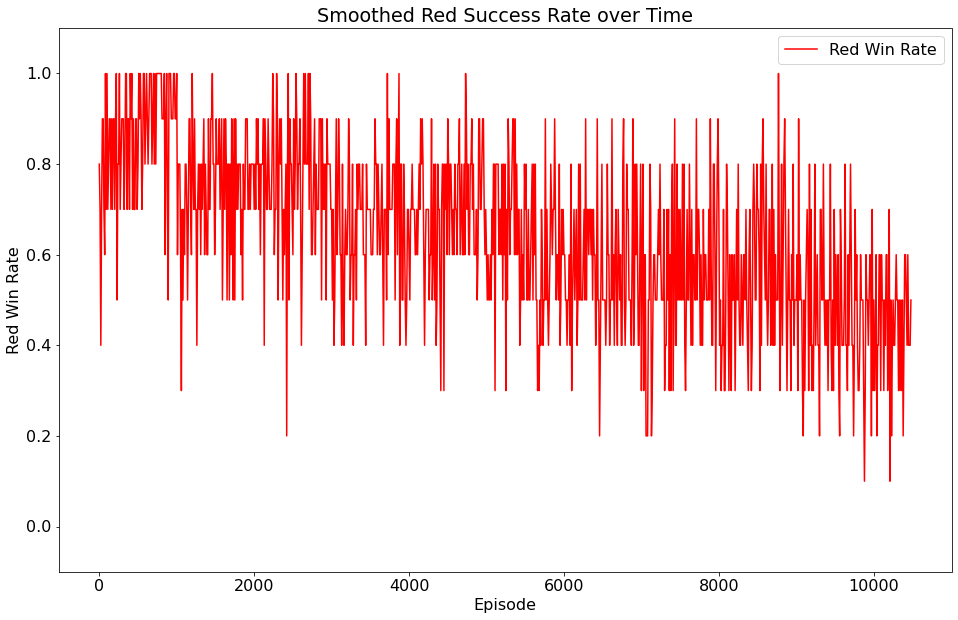

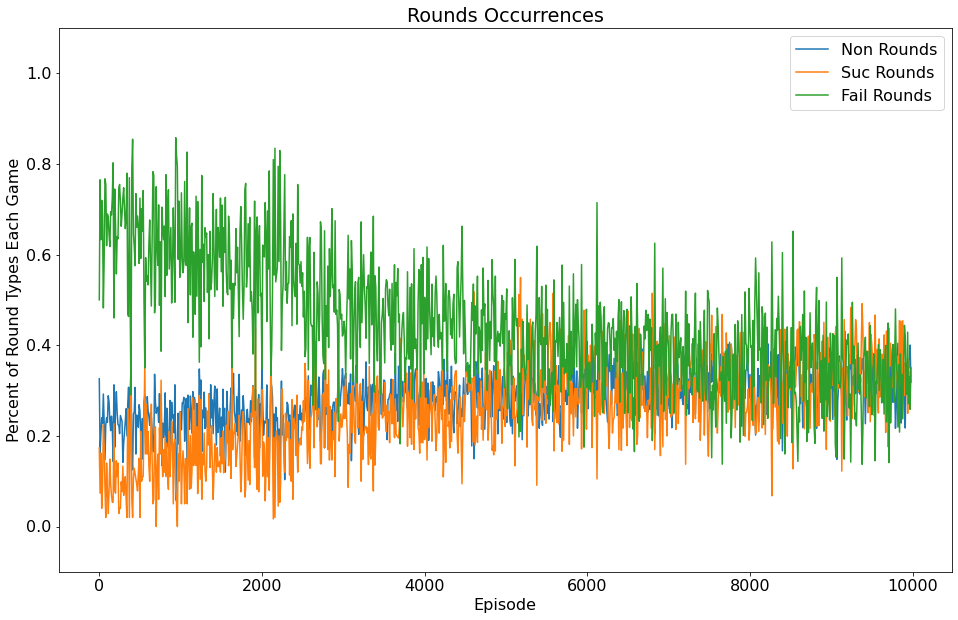

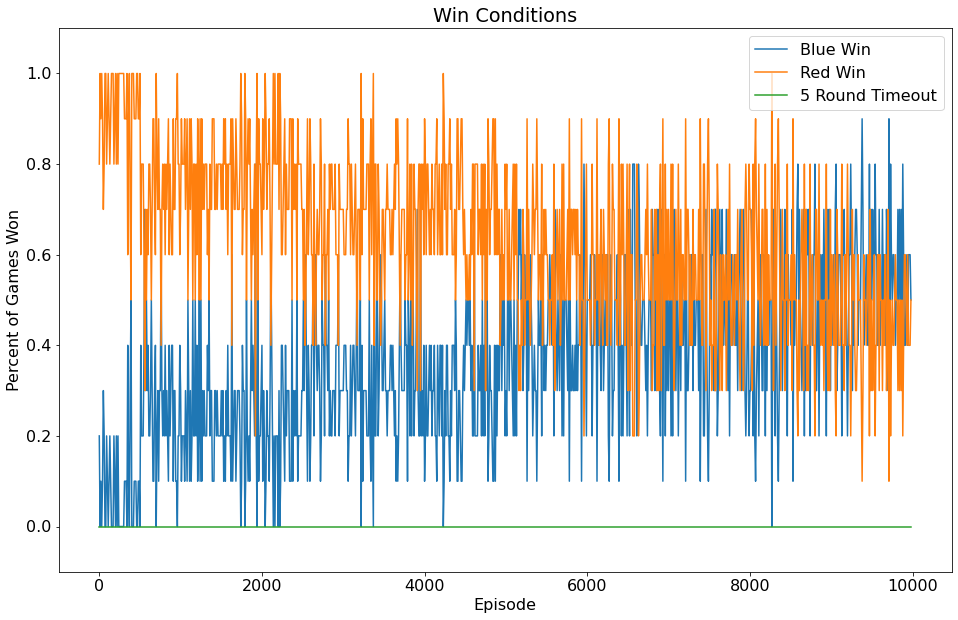

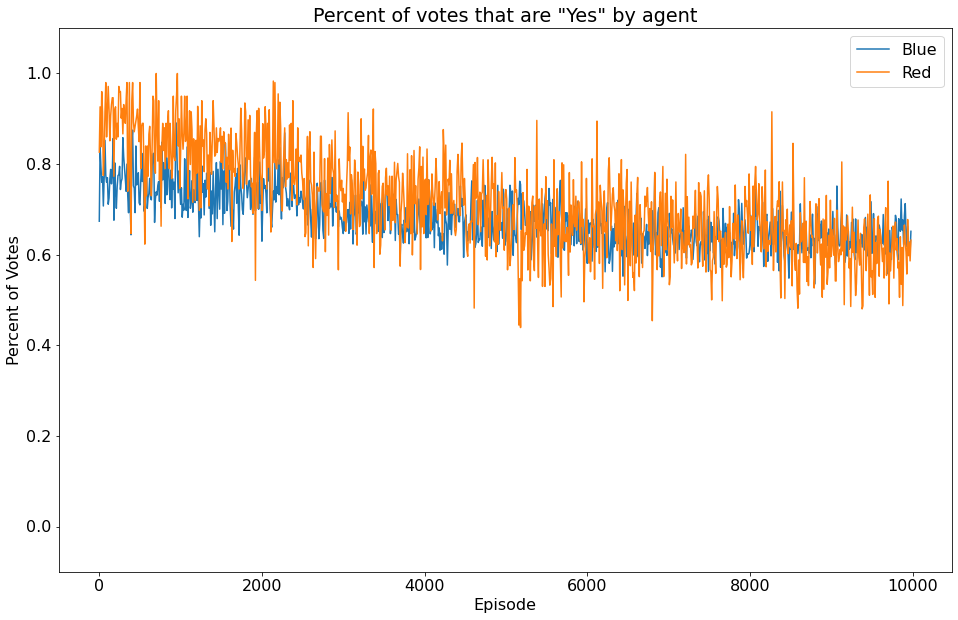

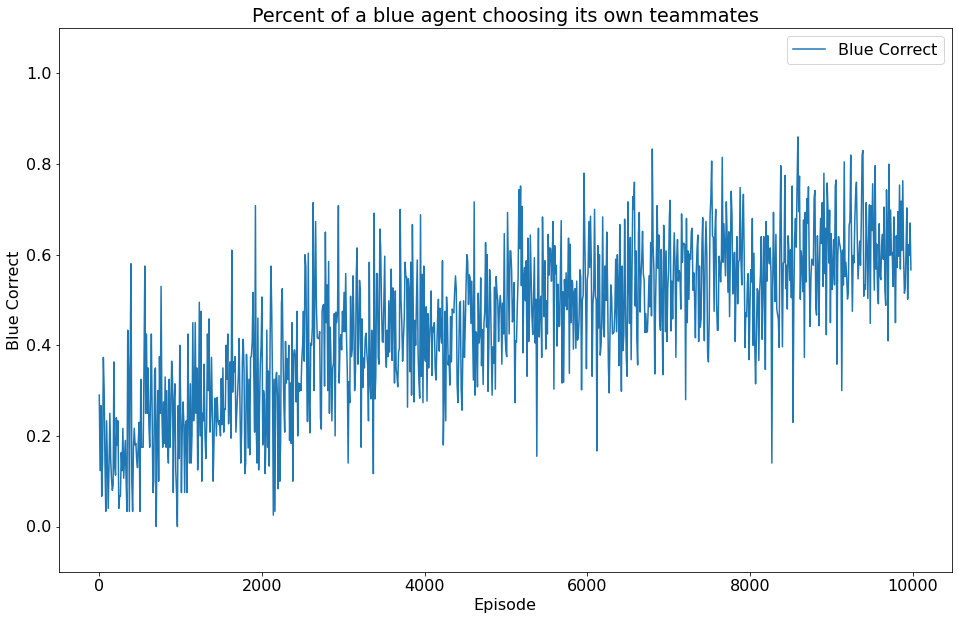

epoch 21 - loss = 0.46387600898742676, last - 0.5501918792724609
epoch 22 - loss = 0.4547892212867737, last - 0.5192970037460327
epoch 23 - loss = 0.4430500566959381, last - 0.1445942372083664
epoch 24 - loss = 0.4394092261791229, last - 0.23922407627105713
epoch 25 - loss = 0.414374977350235, last - 0.6822052001953125
epoch 26 - loss = 0.42735686898231506, last - 0.20169158279895782
epoch 27 - loss = 0.39234402775764465, last - 0.12758196890354156
epoch 28 - loss = 0.3809548616409302, last - 0.0925258994102478
epoch 29 - loss = 0.37969937920570374, last - 0.1628953367471695
epoch 30 - loss = 0.3714771568775177, last - 0.29402175545692444
epoch 31 - loss = 0.3677593171596527, last - 0.42154043912887573
epoch 32 - loss = 0.3653135299682617, last - 0.09605152904987335
epoch 33 - loss = 0.3646235764026642, last - 0.9510758519172668
epoch 34 - loss = 0.3520471155643463, last - 0.04200936108827591
epoch 35 - loss = 0.3465636074542999, last - 0.1452799141407013
epoch 36 - loss = 0.3586771190

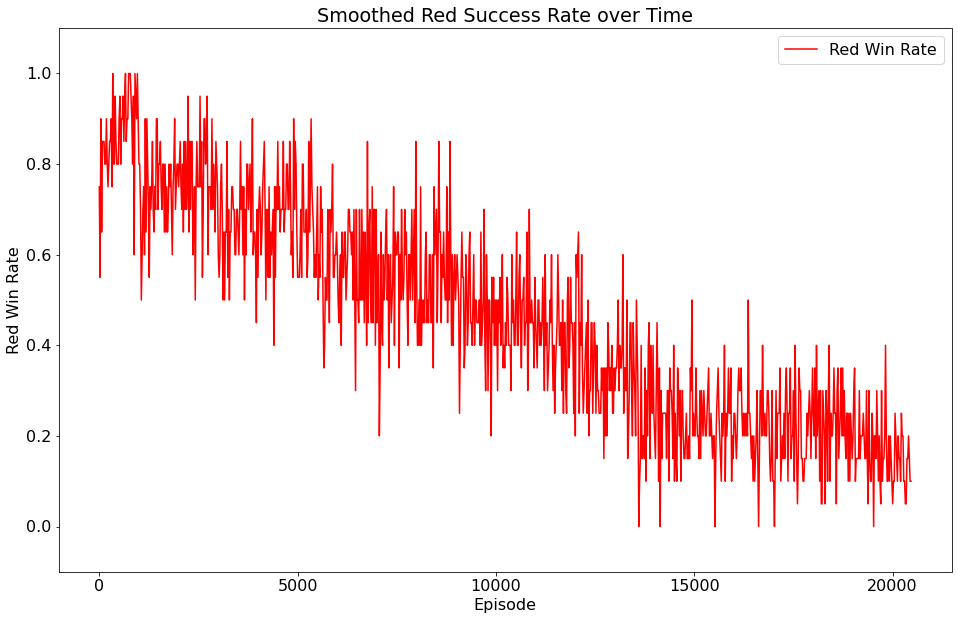

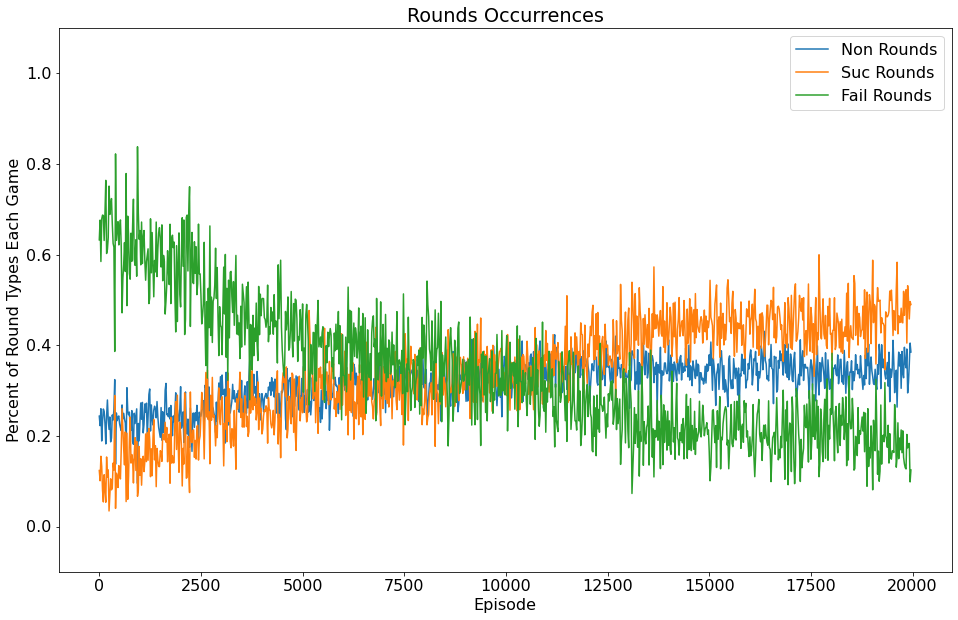

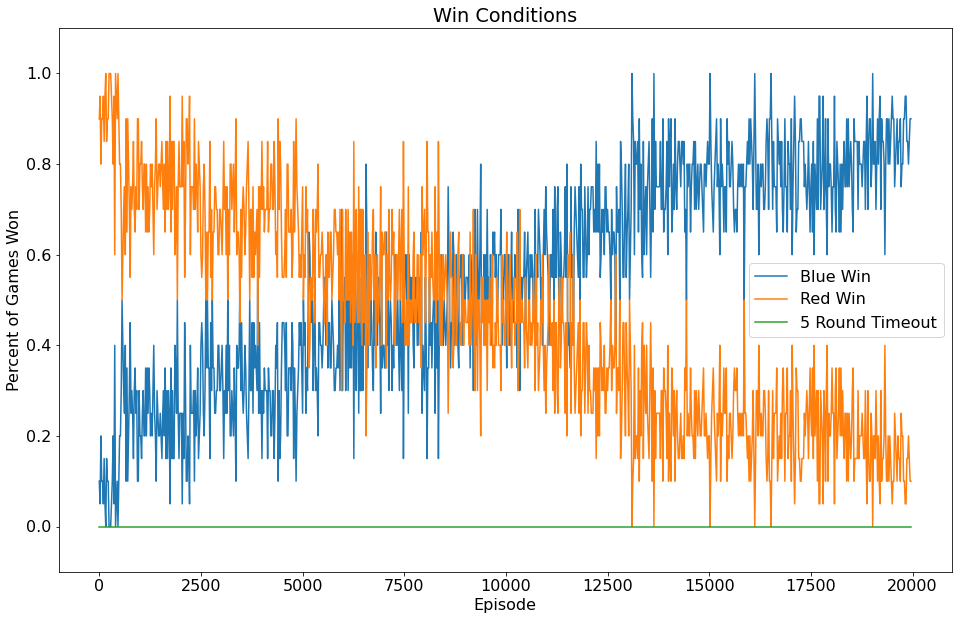

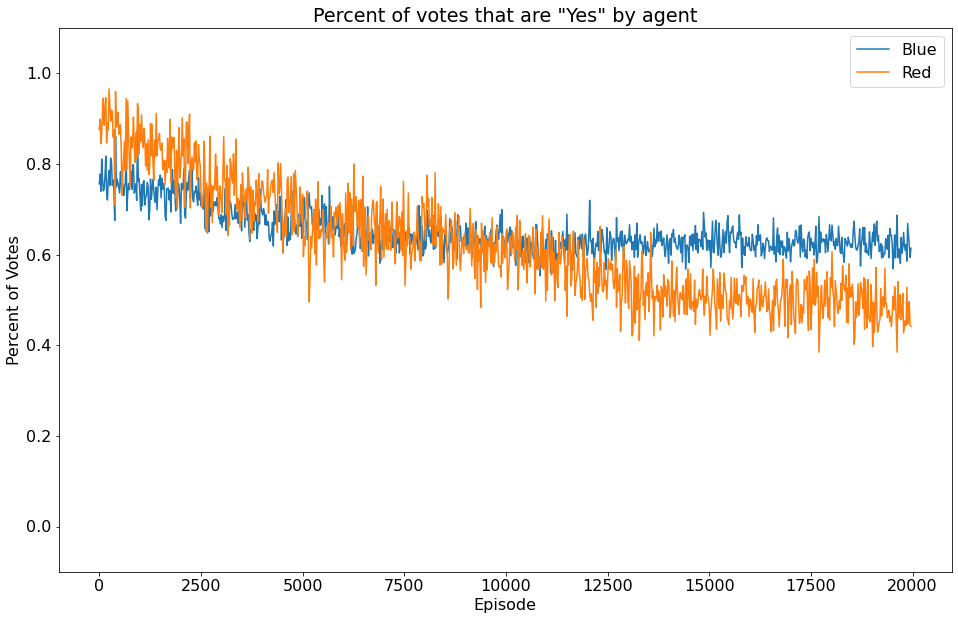

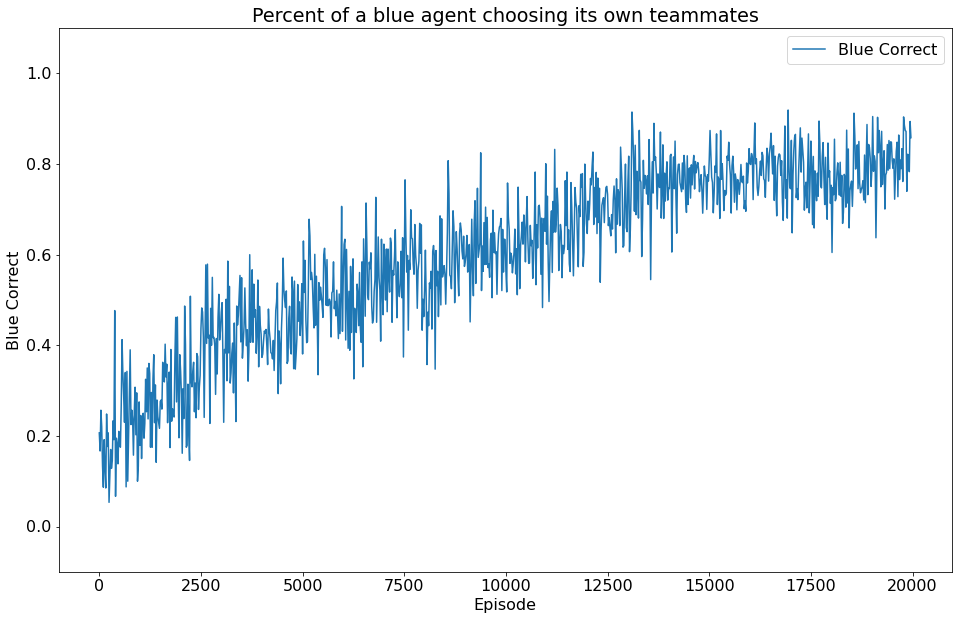

epoch 41 - loss = 0.3301503658294678, last - 0.12418761104345322
epoch 42 - loss = 0.3144382834434509, last - 0.09341375529766083
epoch 43 - loss = 0.3206324279308319, last - 0.19645476341247559
epoch 44 - loss = 0.3066839575767517, last - 0.3938974142074585
epoch 45 - loss = 0.31387877464294434, last - 0.025980085134506226
epoch 46 - loss = 0.3057372570037842, last - 0.05298164486885071
epoch 47 - loss = 0.3053155541419983, last - 0.1142965704202652
epoch 48 - loss = 0.3000461161136627, last - 0.07036583125591278
epoch 49 - loss = 0.2942686676979065, last - 0.09952571243047714
epoch 50 - loss = 0.2938985824584961, last - 0.22923660278320312
epoch 51 - loss = 0.3037026524543762, last - 0.0341484472155571
epoch 52 - loss = 0.2919360399246216, last - 0.13870251178741455
epoch 53 - loss = 0.3012525141239166, last - 0.24817505478858948
epoch 54 - loss = 0.29005229473114014, last - 0.12024271488189697
epoch 55 - loss = 0.2910209894180298, last - 0.015265194699168205
epoch 56 - loss = 0.2755

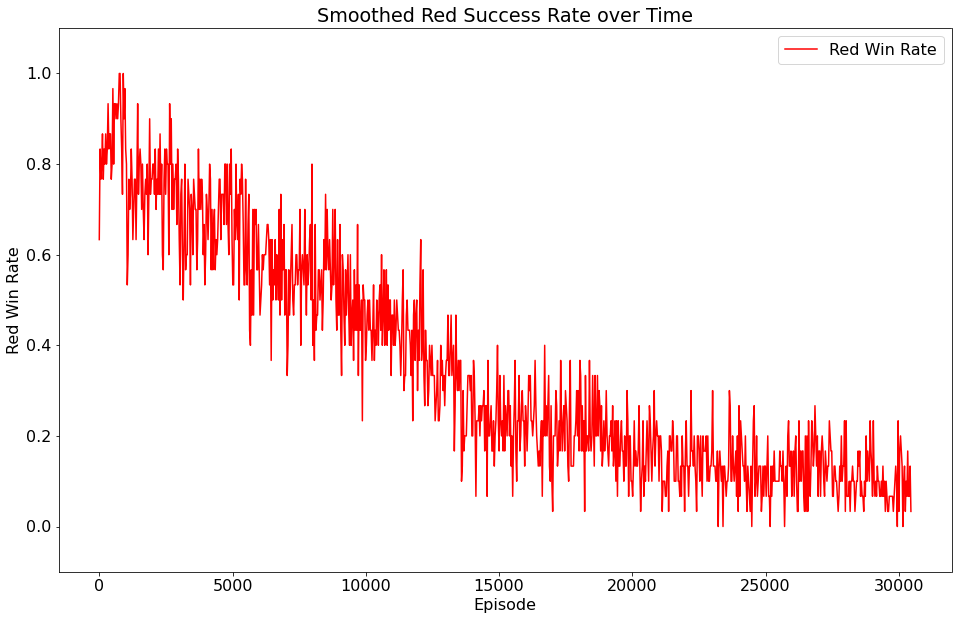

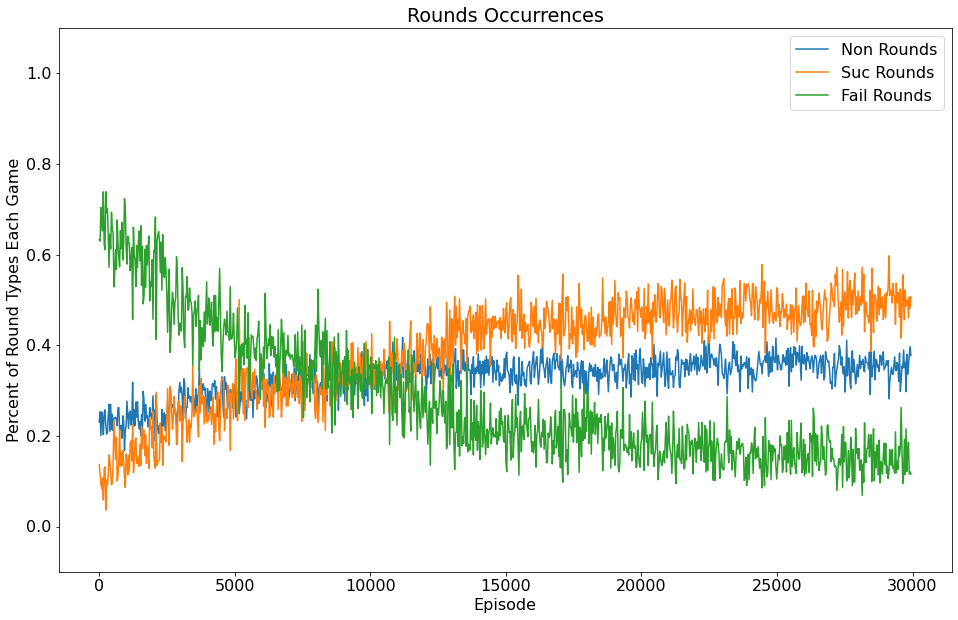

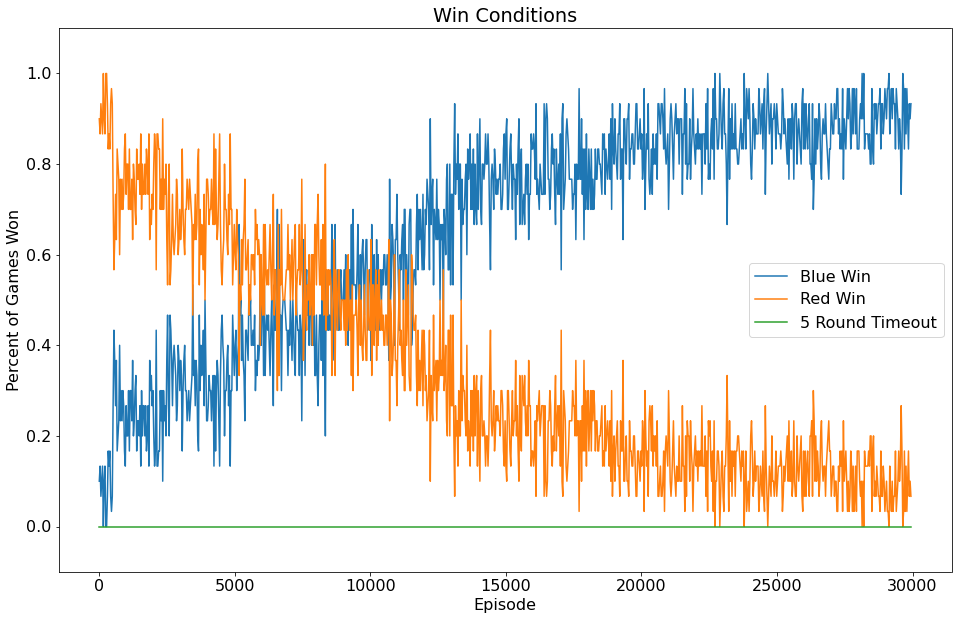

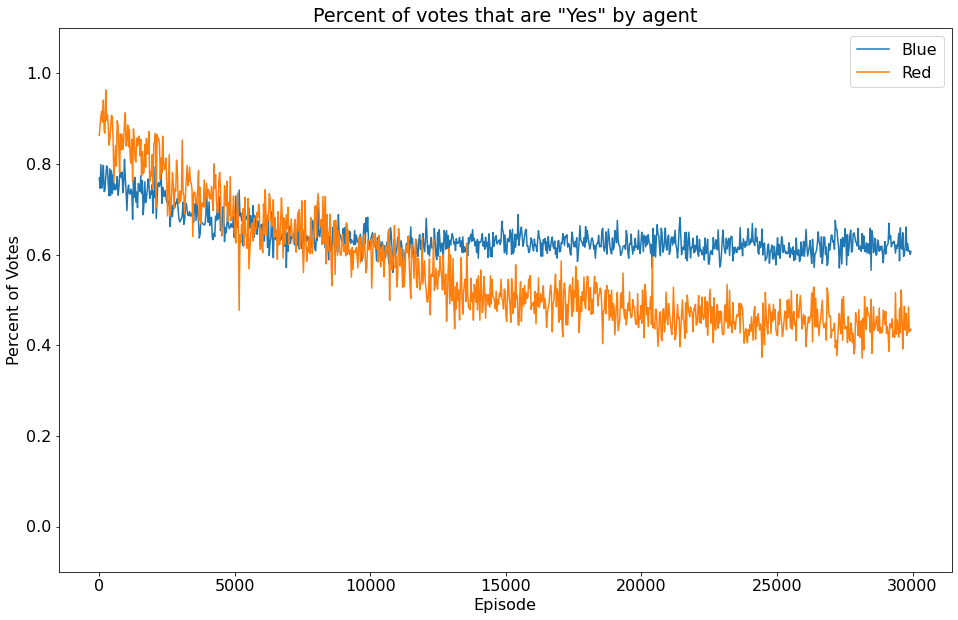

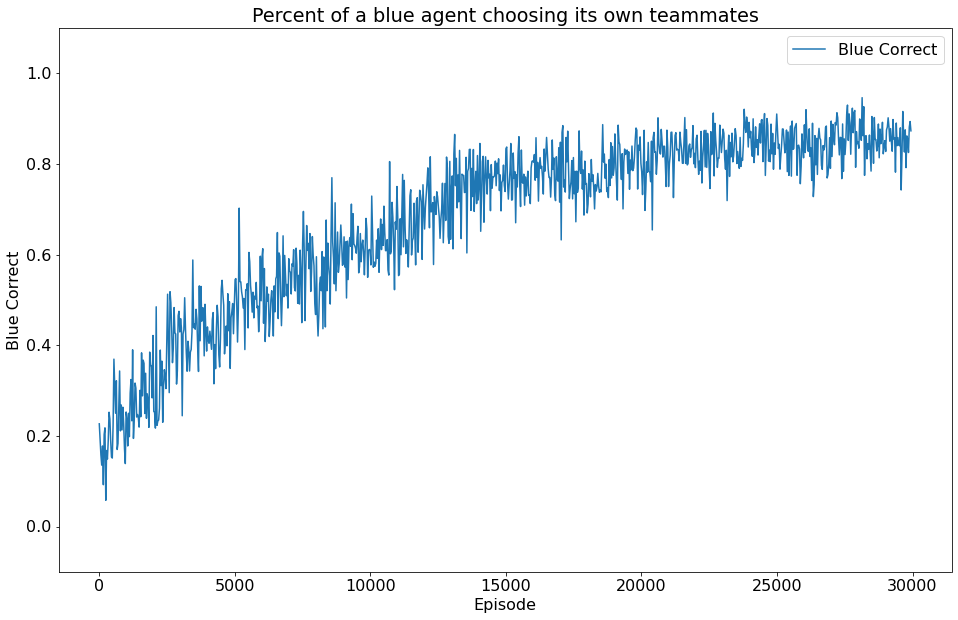

epoch 61 - loss = 0.2582607865333557, last - 0.005735826212912798
epoch 62 - loss = 0.27246159315109253, last - 0.029651707038283348
epoch 63 - loss = 0.2691328823566437, last - 0.2859797179698944
epoch 64 - loss = 0.262029767036438, last - 0.023898620158433914
epoch 65 - loss = 0.2647720277309418, last - 0.012572817504405975
epoch 66 - loss = 0.26471444964408875, last - 0.5957645177841187
epoch 67 - loss = 0.24805231392383575, last - 0.008934598416090012
epoch 68 - loss = 0.2692062258720398, last - 0.036925606429576874
epoch 69 - loss = 0.2520647943019867, last - 0.023949269205331802
epoch 70 - loss = 0.26437118649482727, last - 0.013549020513892174
epoch 71 - loss = 0.248724102973938, last - 0.05454336851835251
epoch 72 - loss = 0.24876849353313446, last - 0.006116451229900122
epoch 73 - loss = 0.2549433410167694, last - 0.005440966691821814
epoch 74 - loss = 0.2534697353839874, last - 0.03206442669034004
epoch 75 - loss = 0.2598460614681244, last - 0.013252615928649902
epoch 76 - lo

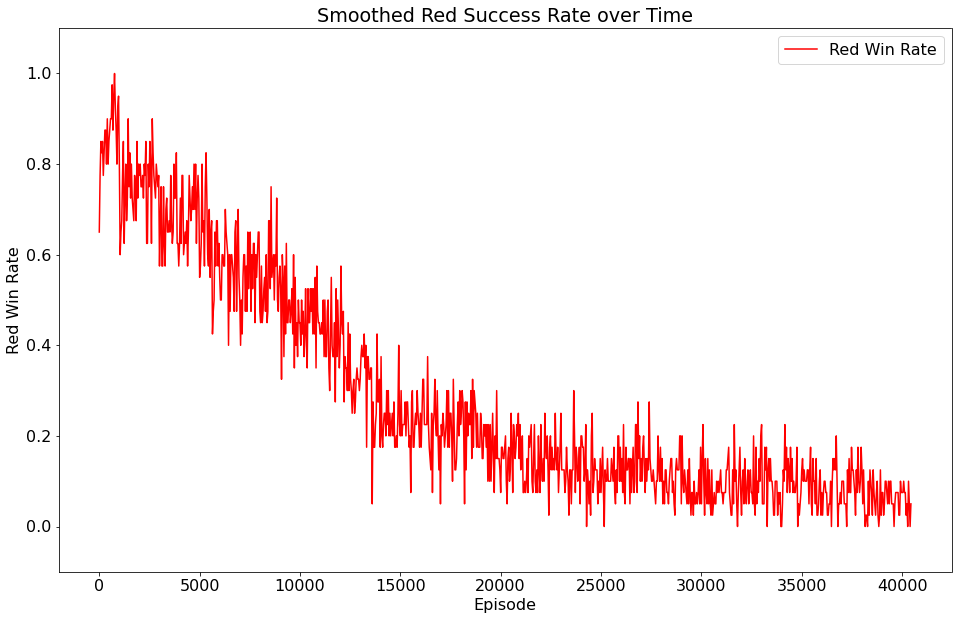

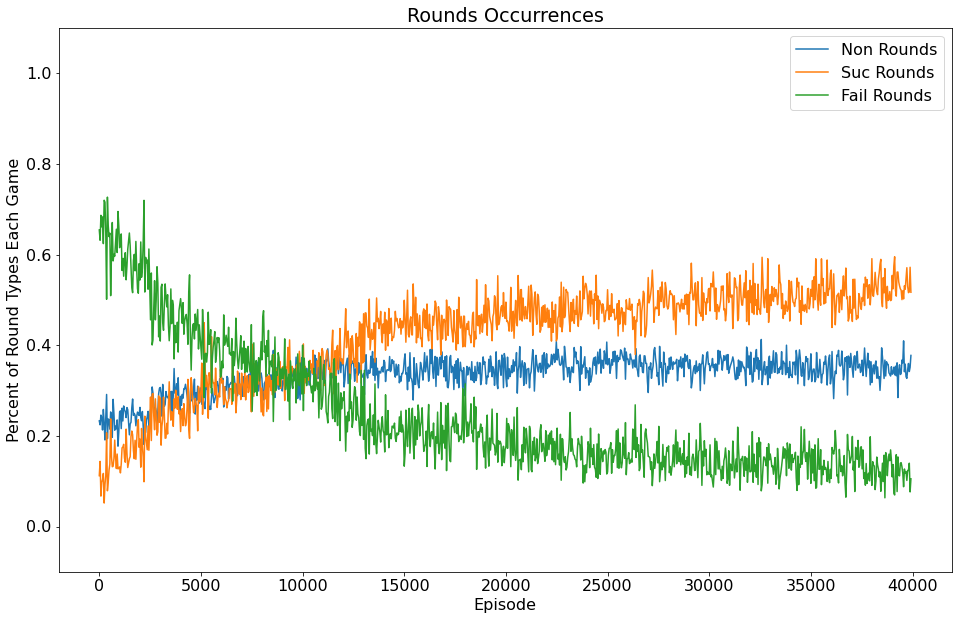

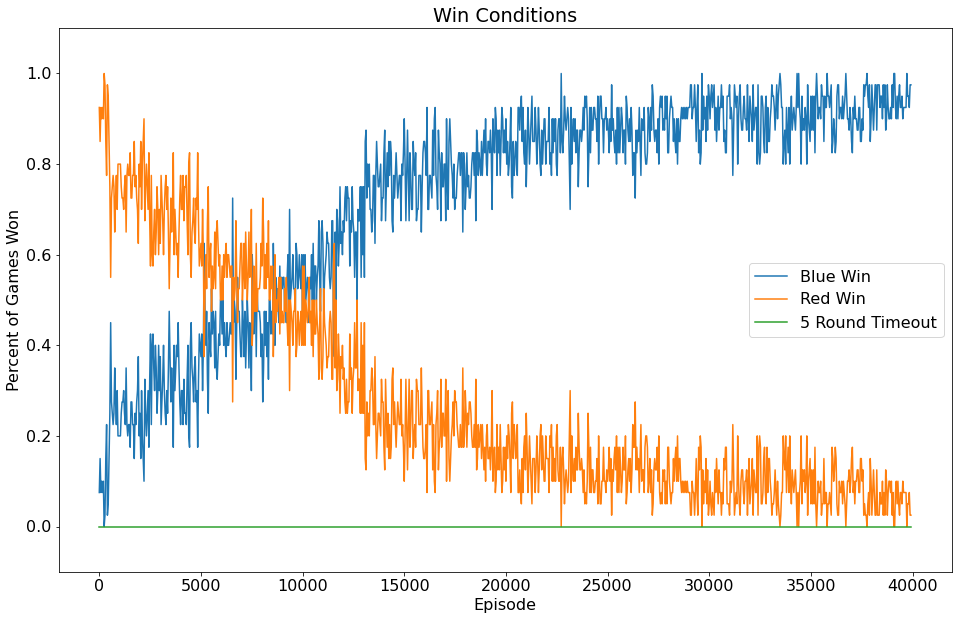

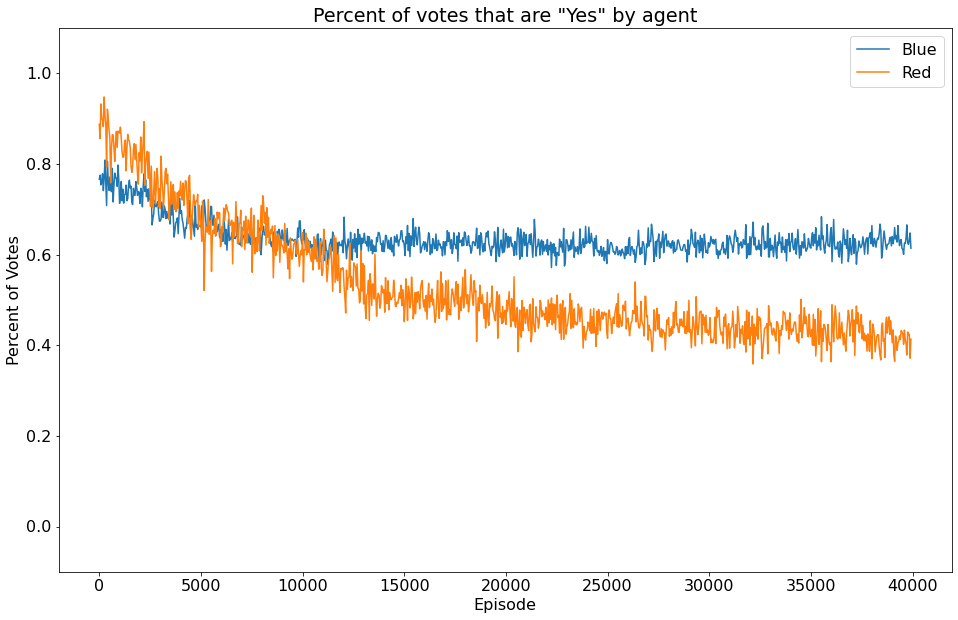

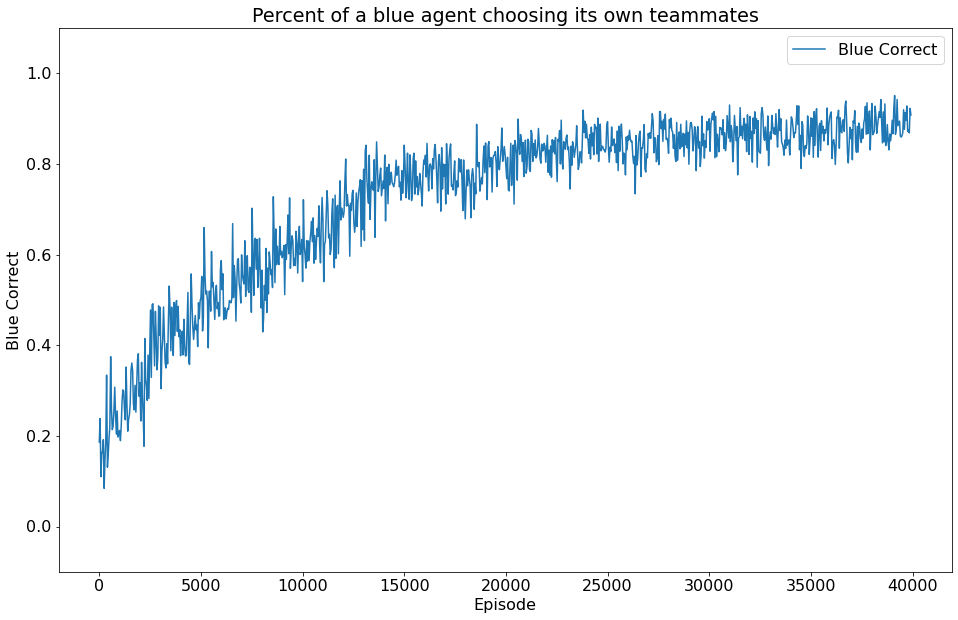

epoch 81 - loss = 0.23654964566230774, last - 0.2177194356918335
epoch 82 - loss = 0.22711144387722015, last - 0.00734241958707571
epoch 83 - loss = 0.23977363109588623, last - 0.008373982273042202
epoch 84 - loss = 0.229603573679924, last - 0.07318148761987686
epoch 85 - loss = 0.2279449701309204, last - 0.0016256924718618393
epoch 86 - loss = 0.22640350461006165, last - 0.3377794325351715
epoch 87 - loss = 0.2217319756746292, last - 0.028311336413025856
epoch 88 - loss = 0.22841769456863403, last - 0.02147509716451168
epoch 89 - loss = 0.22818799316883087, last - 0.020239245146512985
epoch 90 - loss = 0.2181183099746704, last - 0.00488560926169157
epoch 91 - loss = 0.21010775864124298, last - 0.0205816812813282
epoch 92 - loss = 0.2268810123205185, last - 0.09237180650234222
epoch 93 - loss = 0.21711529791355133, last - 0.016819259151816368
epoch 94 - loss = 0.22643902897834778, last - 0.004538717679679394
epoch 95 - loss = 0.21897806227207184, last - 0.0021808729507029057
epoch 96 -

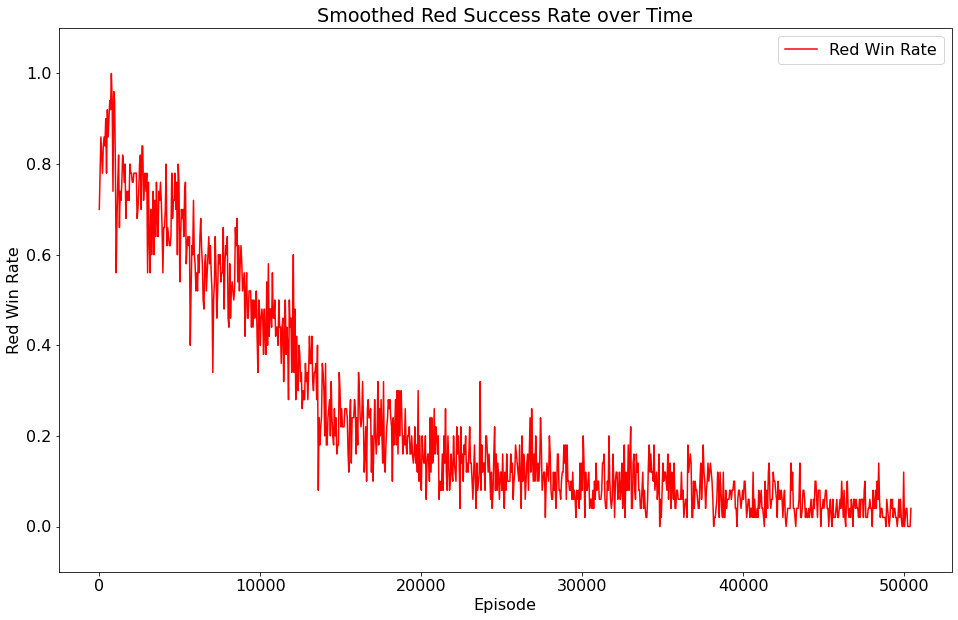

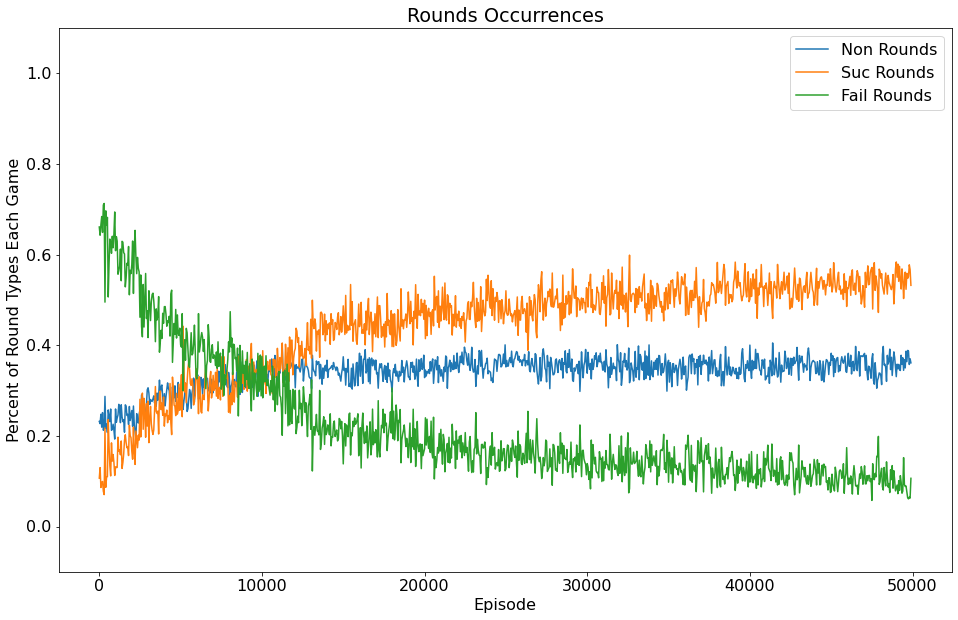

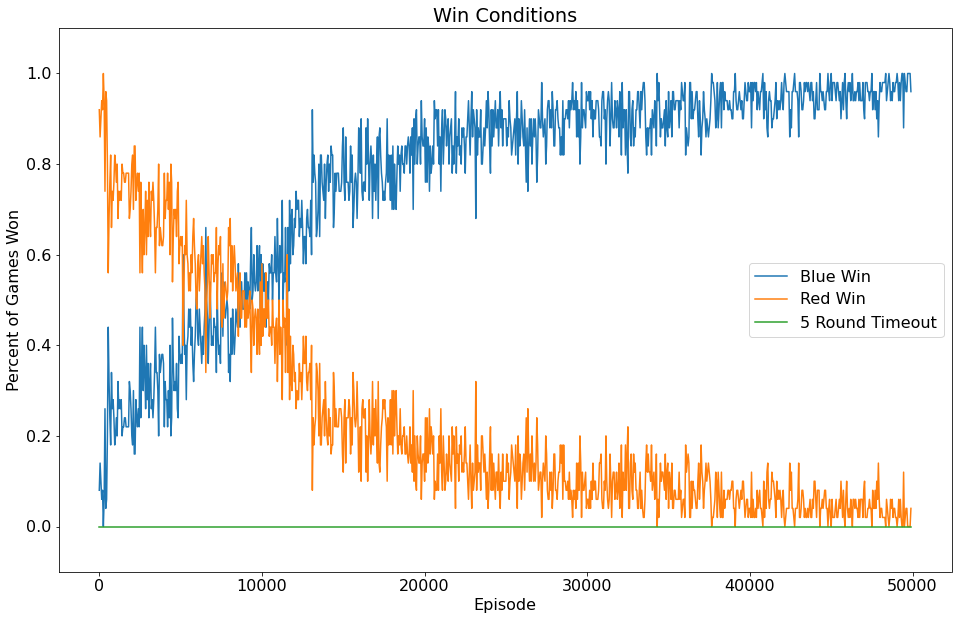

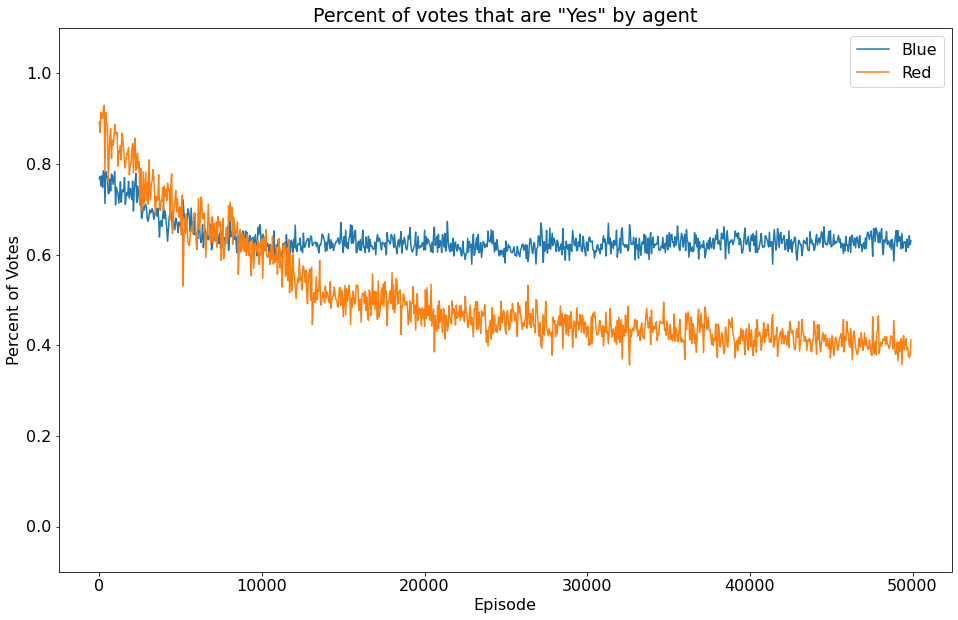

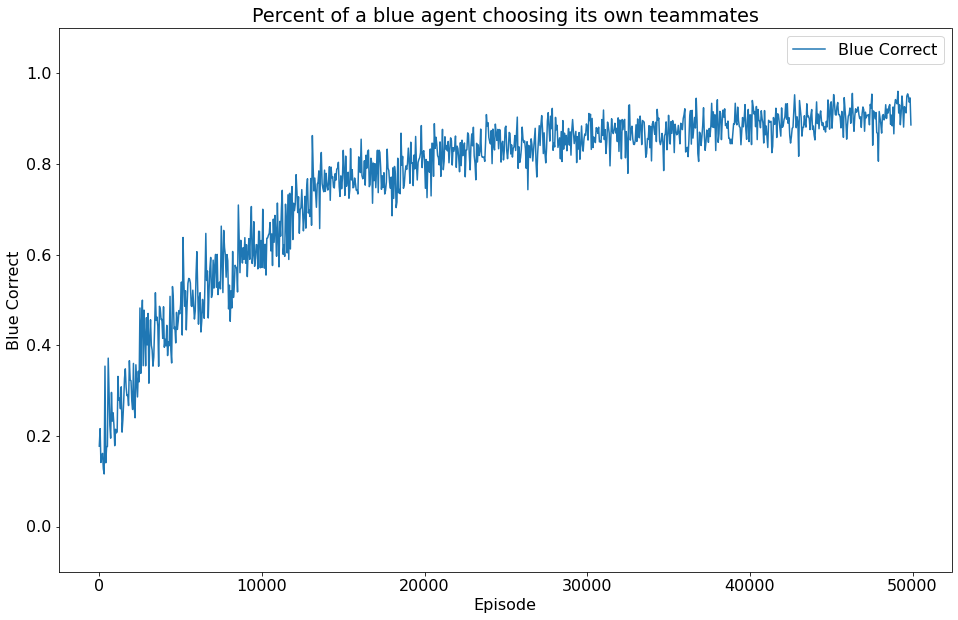

epoch 101 - loss = 0.21038414537906647, last - 0.002411415334790945
epoch 102 - loss = 0.20848986506462097, last - 0.0032101343385875225
epoch 103 - loss = 0.2021949291229248, last - 0.0007274607778526843
epoch 104 - loss = 0.20299407839775085, last - 0.00393165135756135
epoch 105 - loss = 0.19819295406341553, last - 0.007213757373392582
epoch 106 - loss = 0.20557960867881775, last - 0.018270963802933693
epoch 107 - loss = 0.20837284624576569, last - 0.03188054636120796
epoch 108 - loss = 0.19958427548408508, last - 0.0016105674440041184
epoch 109 - loss = 0.209264874458313, last - 0.37929147481918335
epoch 110 - loss = 0.19383814930915833, last - 0.2934374511241913
epoch 111 - loss = 0.20285752415657043, last - 0.0015513754915446043
epoch 112 - loss = 0.19337037205696106, last - 0.0037369015626609325
epoch 113 - loss = 0.18699215352535248, last - 0.002517855726182461
epoch 114 - loss = 0.18902696669101715, last - 0.010911528952419758
epoch 115 - loss = 0.19373489916324615, last - 0.03

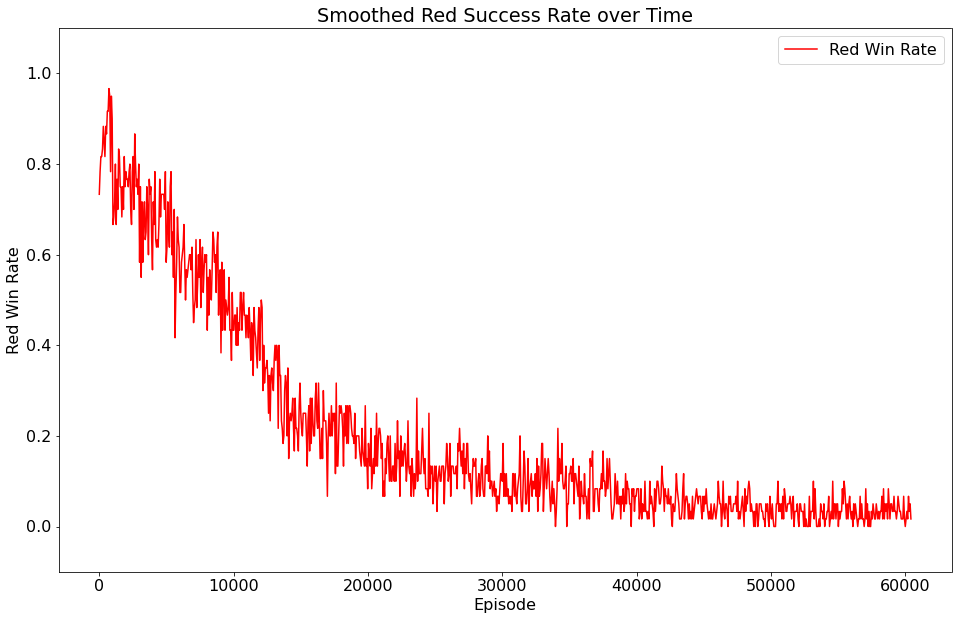

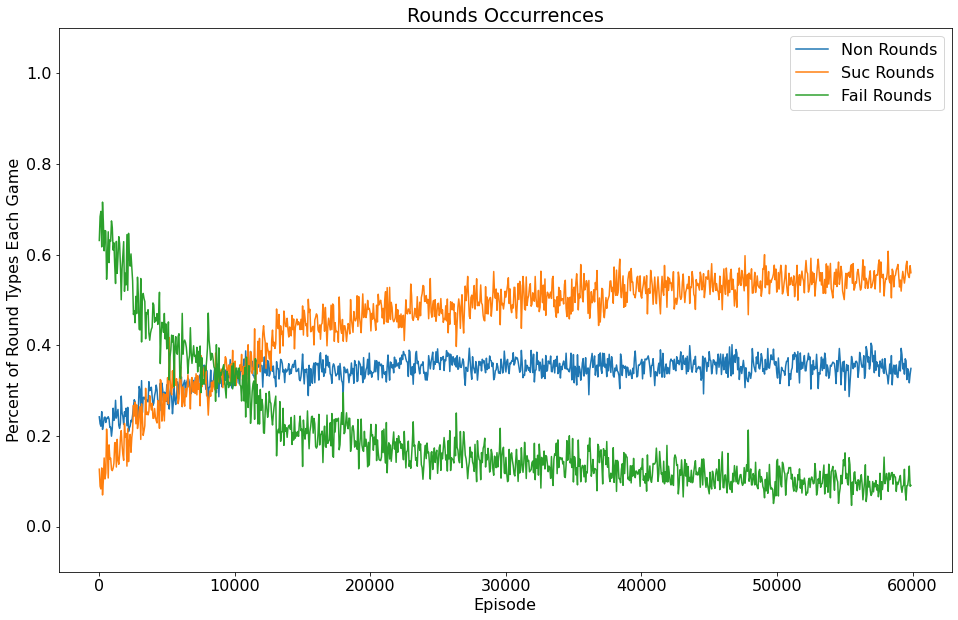

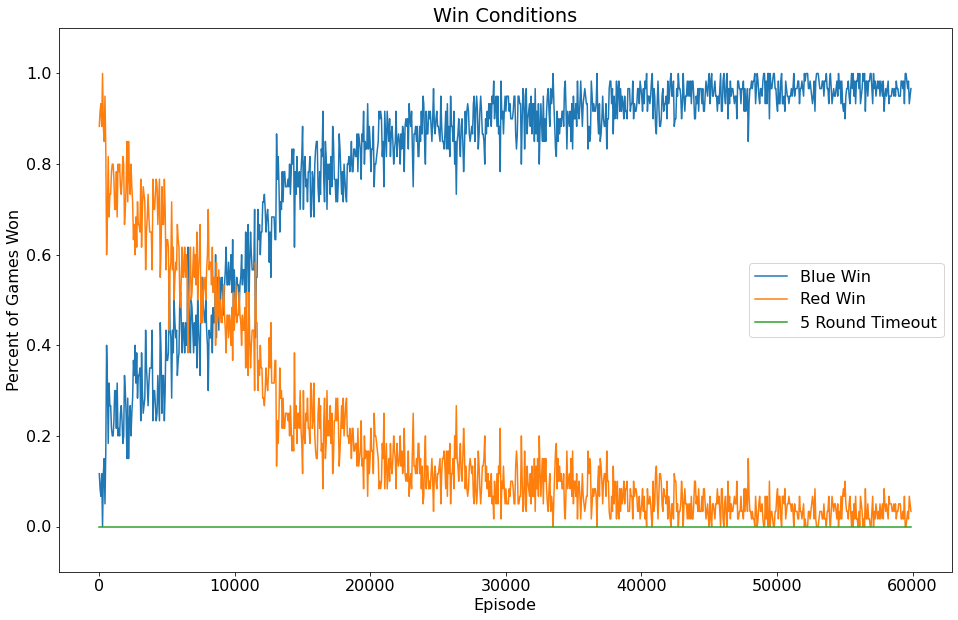

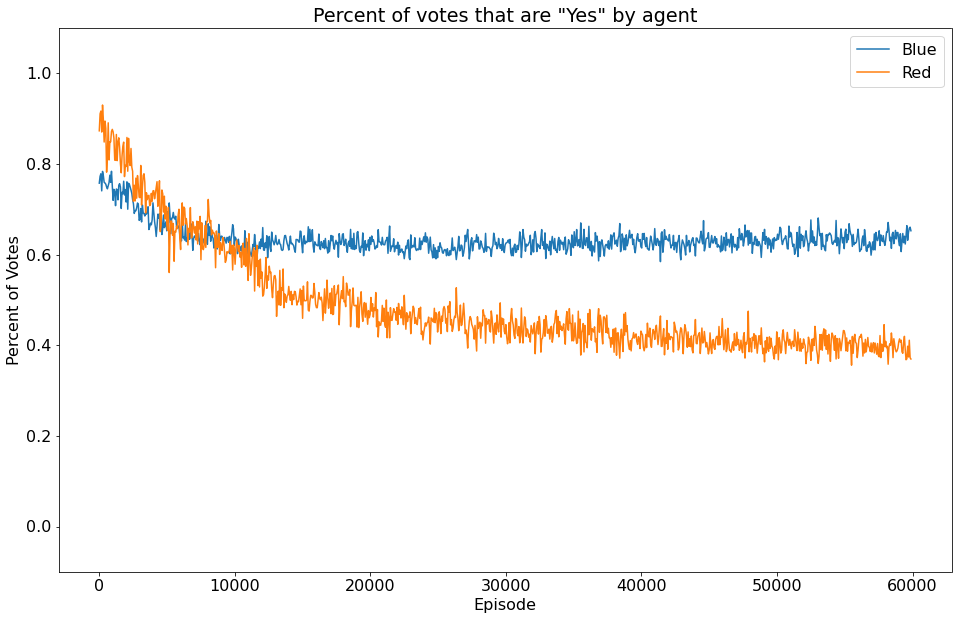

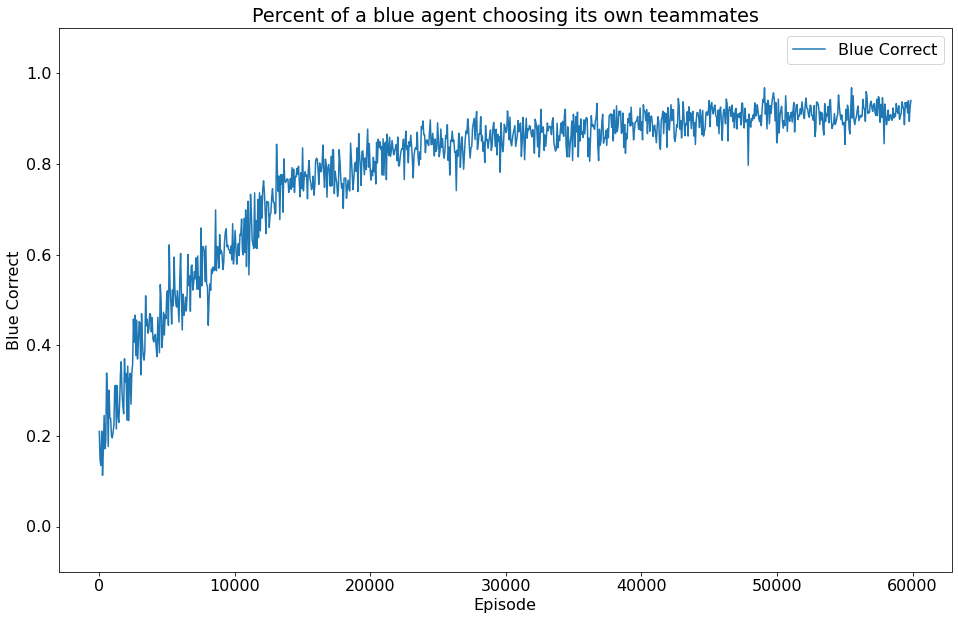

epoch 121 - loss = 0.18950335681438446, last - 0.0011275524739176035
epoch 122 - loss = 0.19234013557434082, last - 0.052139364182949066
epoch 123 - loss = 0.1880967766046524, last - 0.0013933678856119514
epoch 124 - loss = 0.18768487870693207, last - 0.0464598573744297
epoch 125 - loss = 0.18775822222232819, last - 0.0018314605113118887
epoch 126 - loss = 0.18287992477416992, last - 0.0016544131794944406
epoch 127 - loss = 0.18050582706928253, last - 0.051308583468198776
epoch 128 - loss = 0.18183238804340363, last - 0.0004261139838490635
epoch 129 - loss = 0.18983623385429382, last - 0.0005396365304477513
epoch 130 - loss = 0.17922979593276978, last - 0.0009673269232735038
epoch 131 - loss = 0.17839138209819794, last - 0.0016895566368475556
epoch 132 - loss = 0.18313001096248627, last - 0.0002952093491330743
epoch 133 - loss = 0.18073183298110962, last - 0.87456214427948
epoch 134 - loss = 0.1782521903514862, last - 0.00241354713216424
epoch 135 - loss = 0.17678223550319672, last - 0

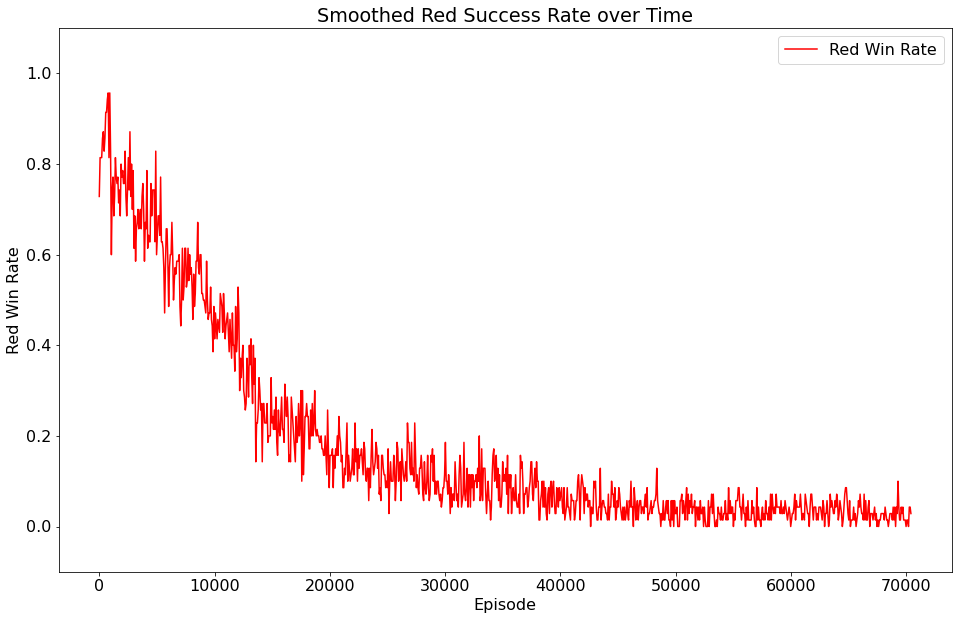

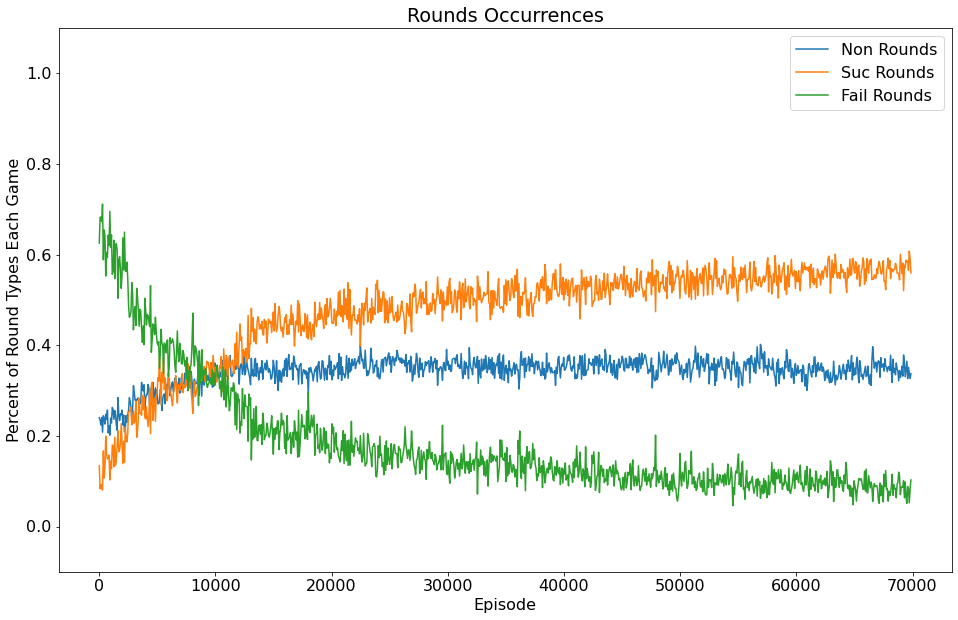

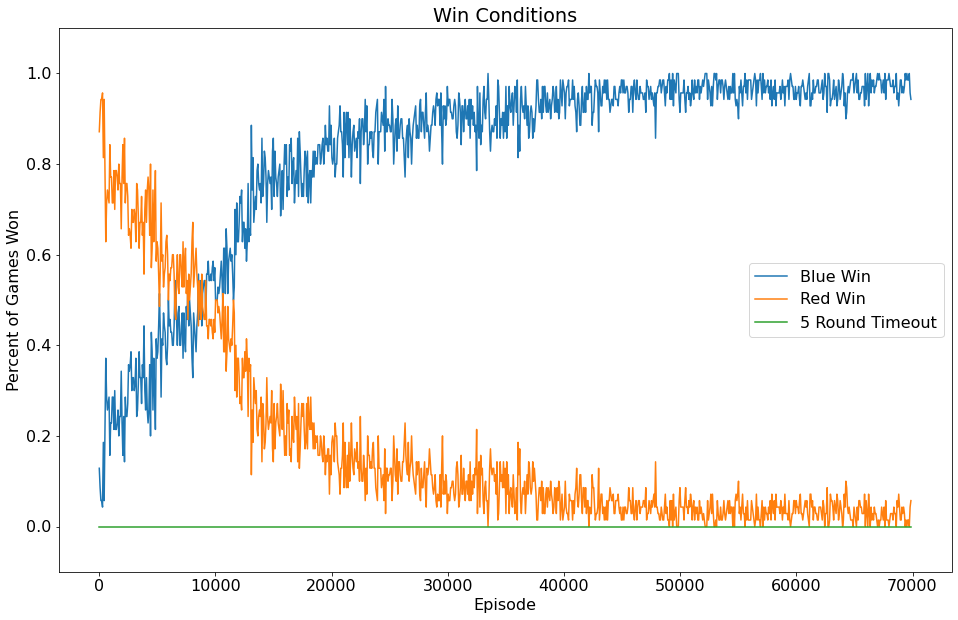

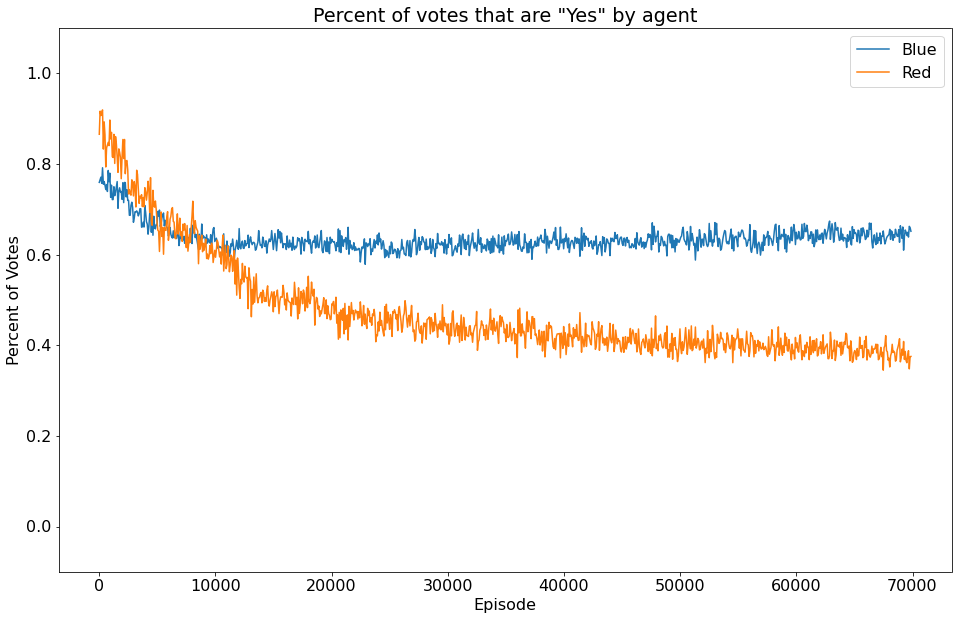

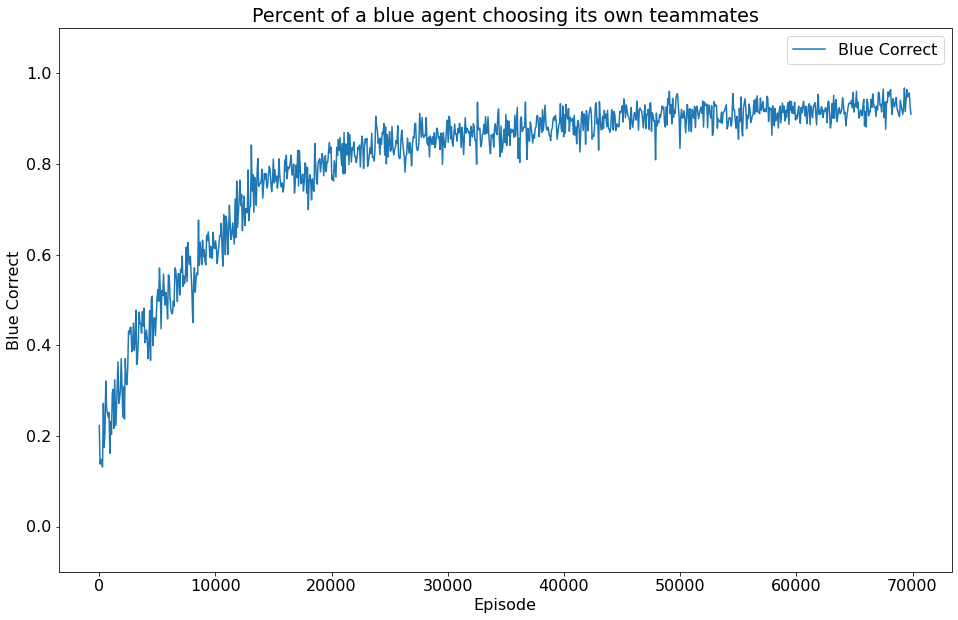

epoch 141 - loss = 0.17779438197612762, last - 0.002067058812826872
epoch 142 - loss = 0.17026519775390625, last - 0.0004838599415961653
epoch 143 - loss = 0.17143583297729492, last - 0.0056680599227547646
epoch 144 - loss = 0.16845427453517914, last - 0.0001886397076305002
epoch 145 - loss = 0.1682525873184204, last - 0.00037220324156805873
epoch 146 - loss = 0.1720513254404068, last - 0.006298236548900604
epoch 147 - loss = 0.1724756360054016, last - 0.0037894193083047867
epoch 148 - loss = 0.16613095998764038, last - 0.00011171404912602156
epoch 149 - loss = 0.16801565885543823, last - 0.0017299145692959428
epoch 150 - loss = 0.17378023266792297, last - 1.0825718641281128
epoch 151 - loss = 0.16405652463436127, last - 0.002125595463439822
epoch 152 - loss = 0.16814769804477692, last - 0.0005041129770688713
epoch 153 - loss = 0.17529460787773132, last - 0.002039560116827488
epoch 154 - loss = 0.16735808551311493, last - 0.001594094792380929
epoch 155 - loss = 0.1705353856086731, last

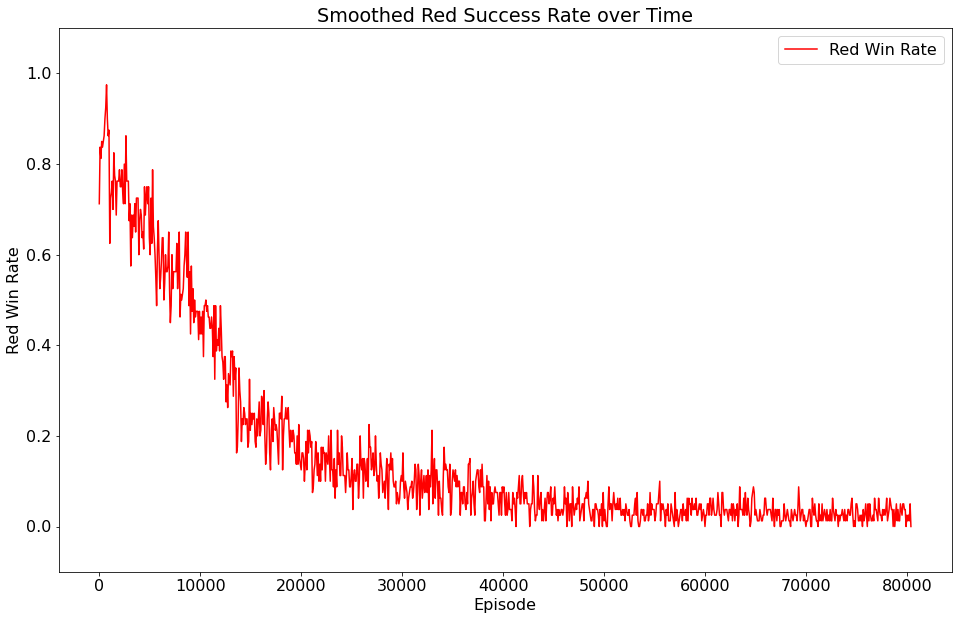

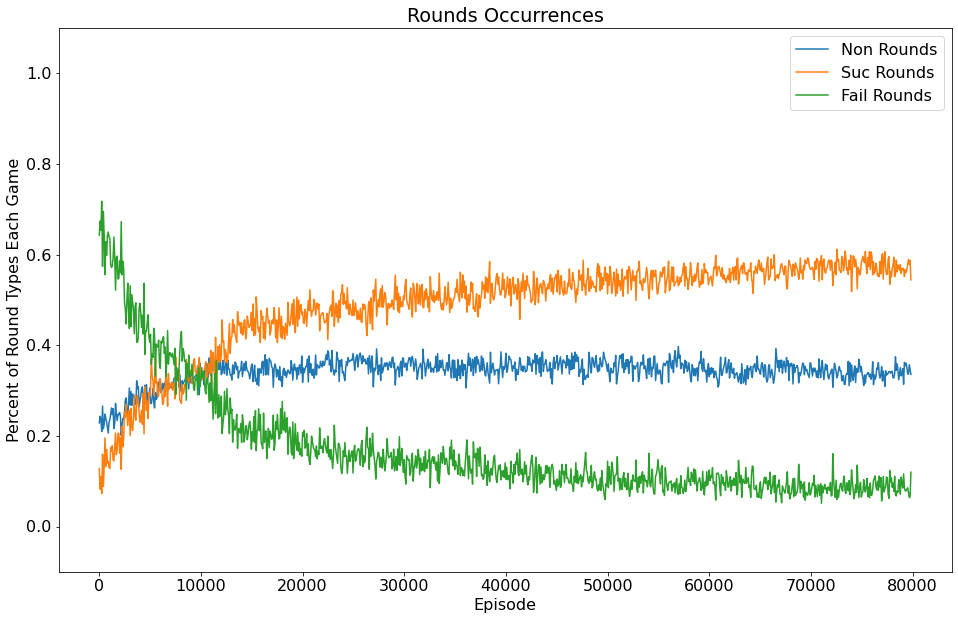

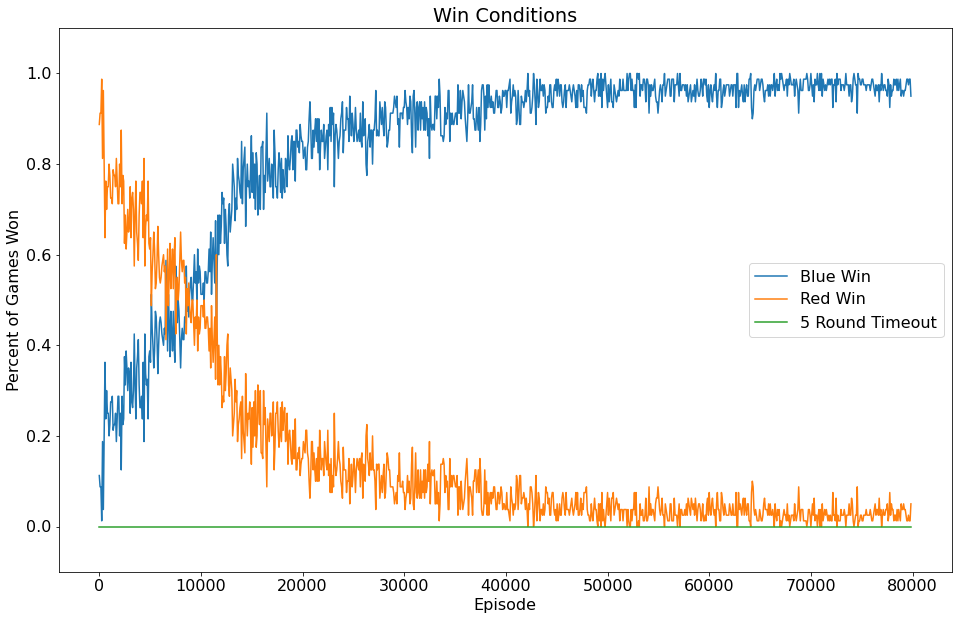

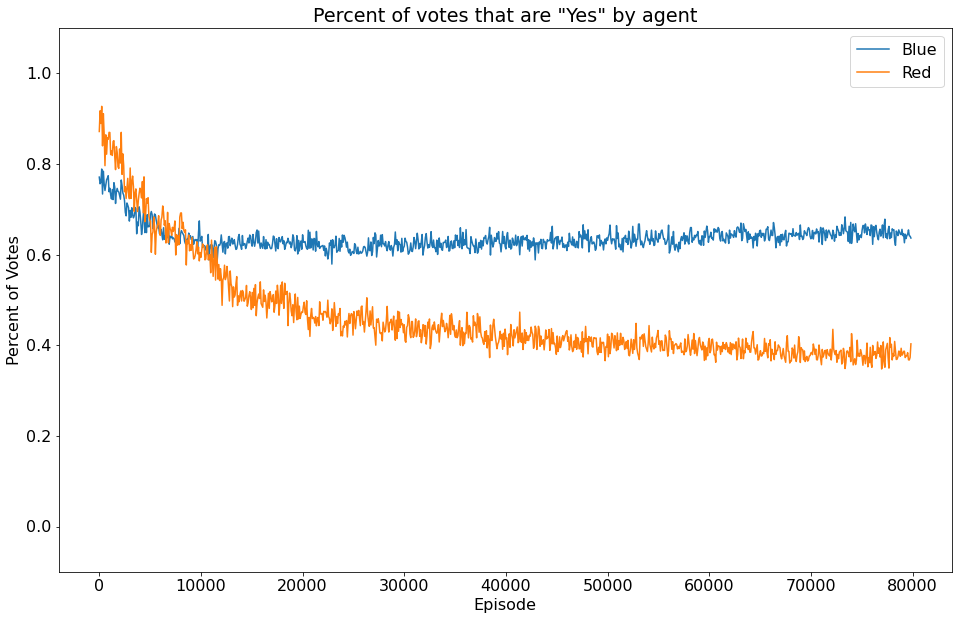

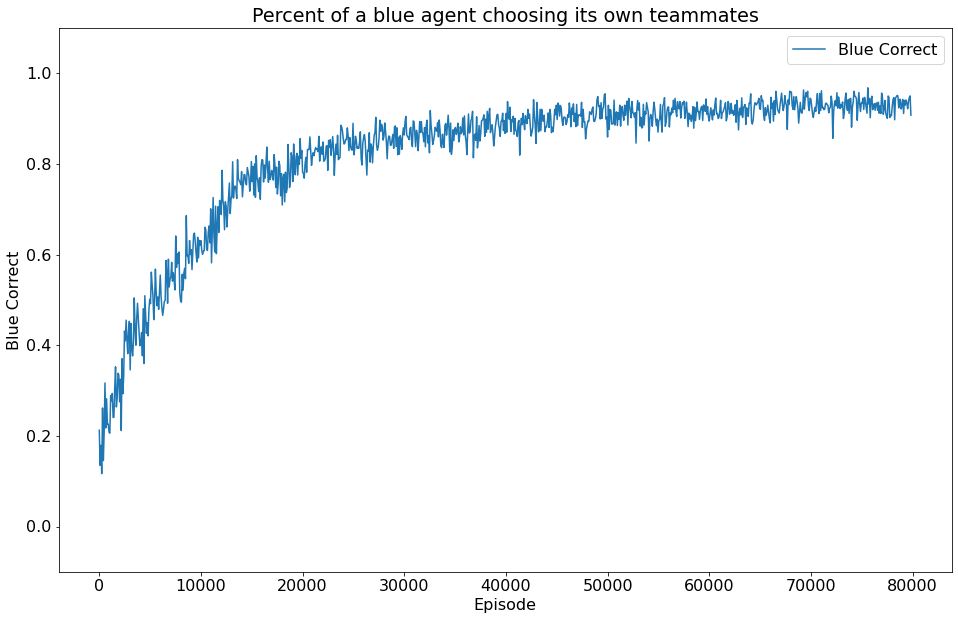

epoch 161 - loss = 0.16103681921958923, last - 3.2390569685958326e-05
epoch 162 - loss = 0.16410516202449799, last - 9.308491280535236e-05
epoch 163 - loss = 0.16303566098213196, last - 0.00026744831120595336
epoch 164 - loss = 0.163814514875412, last - 0.0010999023215845227
epoch 165 - loss = 0.17350341379642487, last - 0.004489127546548843
epoch 166 - loss = 0.16124755144119263, last - 4.939214704791084e-05
epoch 167 - loss = 0.15551221370697021, last - 0.16051743924617767
epoch 168 - loss = 0.15103188157081604, last - 0.0003240879741497338
epoch 169 - loss = 0.15698862075805664, last - 0.007341393269598484
epoch 170 - loss = 0.1644558310508728, last - 0.0006507107755169272
epoch 171 - loss = 0.15292587876319885, last - 6.196863250806928e-05
epoch 172 - loss = 0.16120675206184387, last - 0.00019380585581529886
epoch 173 - loss = 0.15547233819961548, last - 4.447885658009909e-05
epoch 174 - loss = 0.15104898810386658, last - 0.01607096754014492
epoch 175 - loss = 0.15648594498634338, 

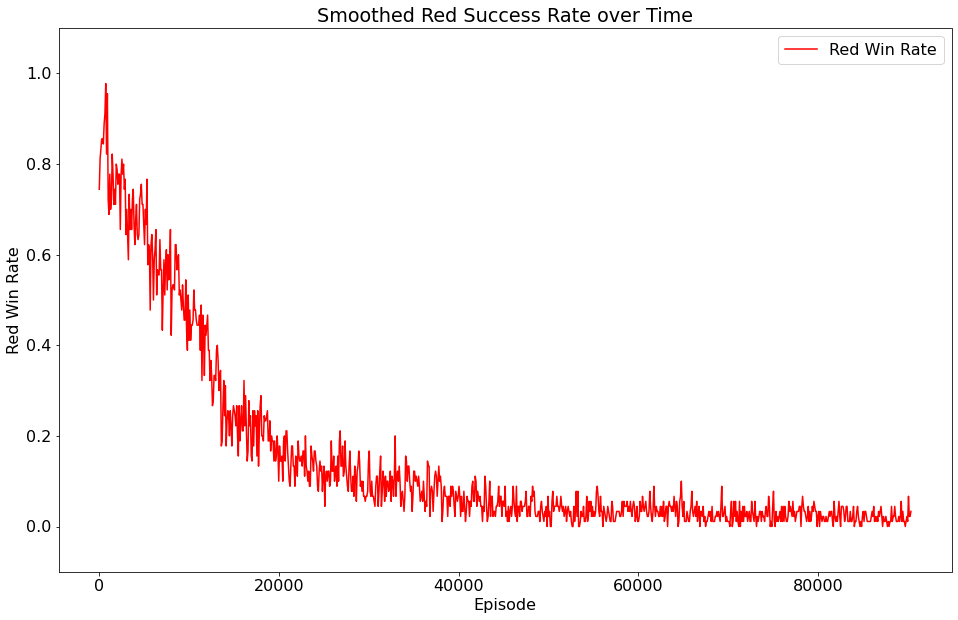

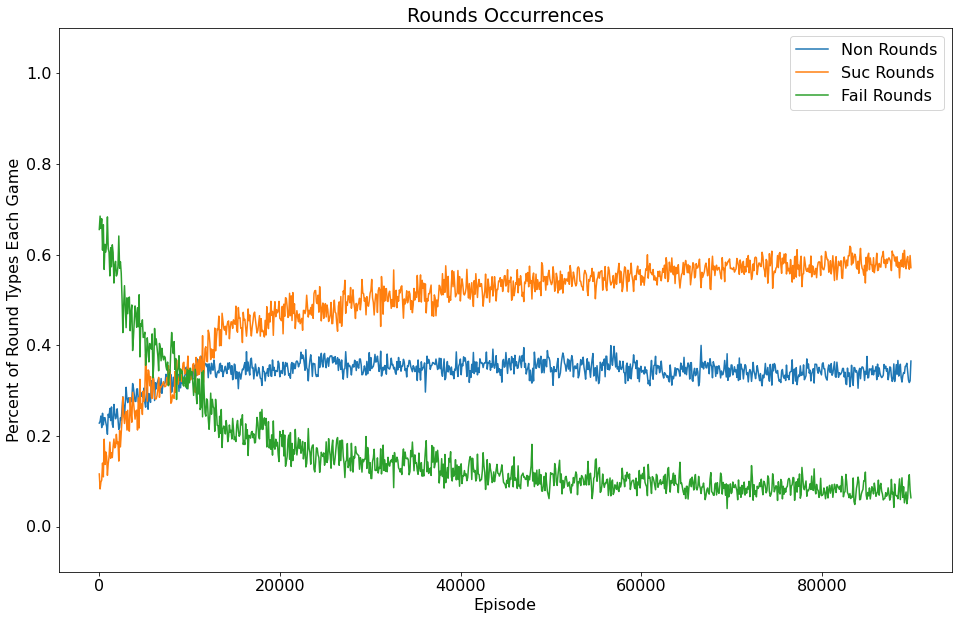

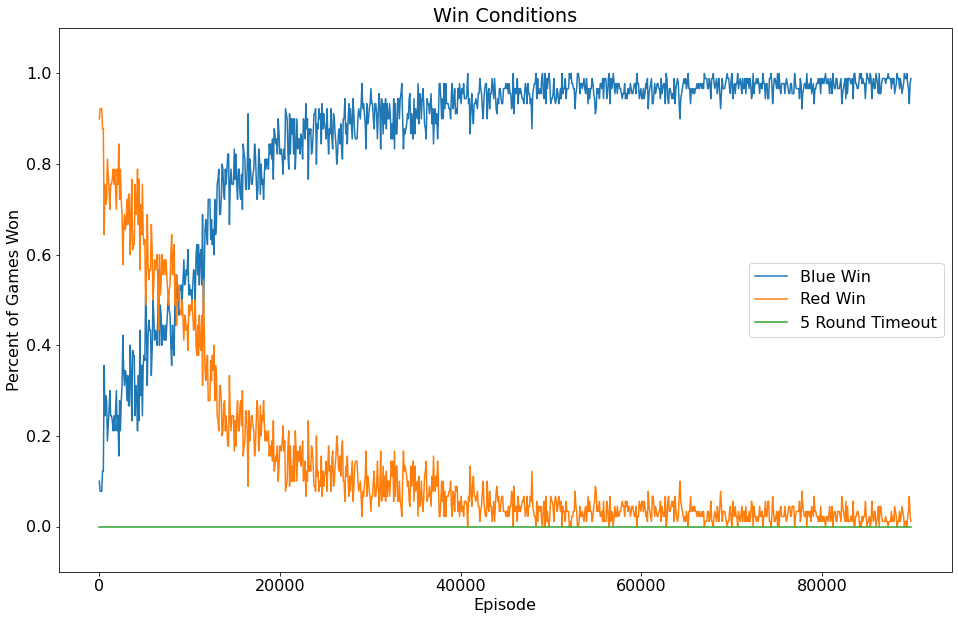

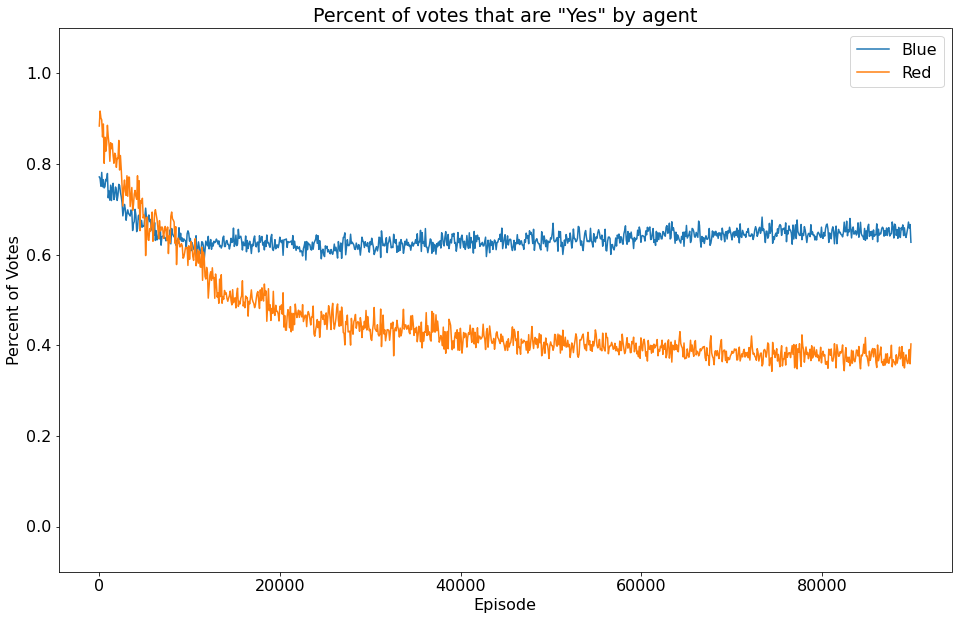

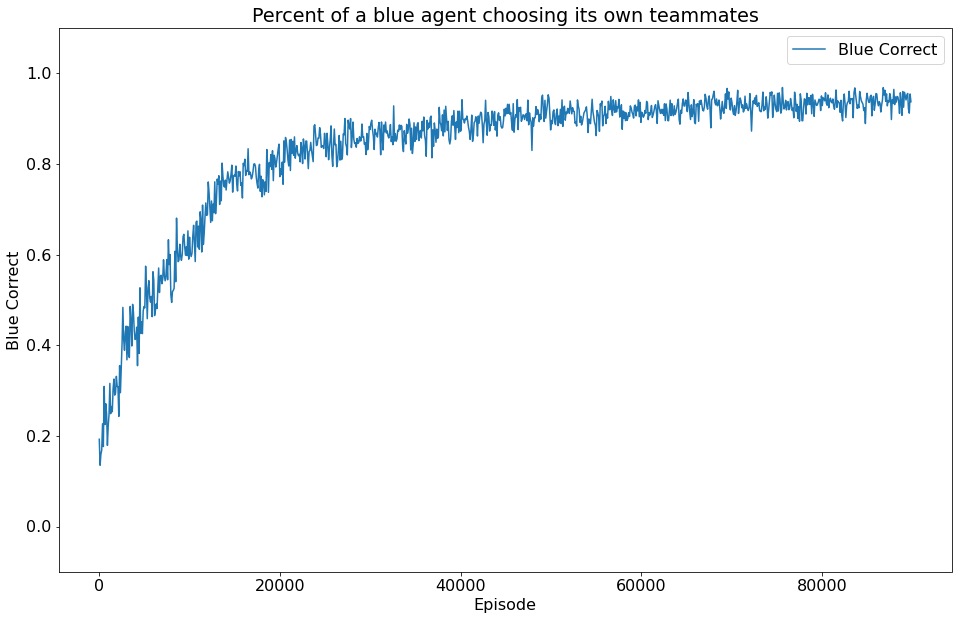

epoch 181 - loss = 0.15663111209869385, last - 0.0032053696922957897
epoch 182 - loss = 0.1553705632686615, last - 0.002381474245339632
epoch 183 - loss = 0.15078894793987274, last - 5.757312828791328e-05
epoch 184 - loss = 0.15050534904003143, last - 0.003029522253200412
epoch 185 - loss = 0.15284405648708344, last - 0.0001337480207439512
epoch 186 - loss = 0.15505091845989227, last - 0.0024006778839975595
epoch 187 - loss = 0.15765990316867828, last - 8.62195884110406e-05
epoch 188 - loss = 0.15642833709716797, last - 0.00020762714848387986
epoch 189 - loss = 0.14700759947299957, last - 1.161117779702181e-05
epoch 190 - loss = 0.15445905923843384, last - 3.5382538044359535e-05
epoch 191 - loss = 0.14948014914989471, last - 0.0015445513417944312
epoch 192 - loss = 0.1503768116235733, last - 0.0002397520001977682
epoch 193 - loss = 0.15352757275104523, last - 1.76790763362078e-05
epoch 194 - loss = 0.1550394594669342, last - 0.00021291714801918715
epoch 195 - loss = 0.14801114797592163

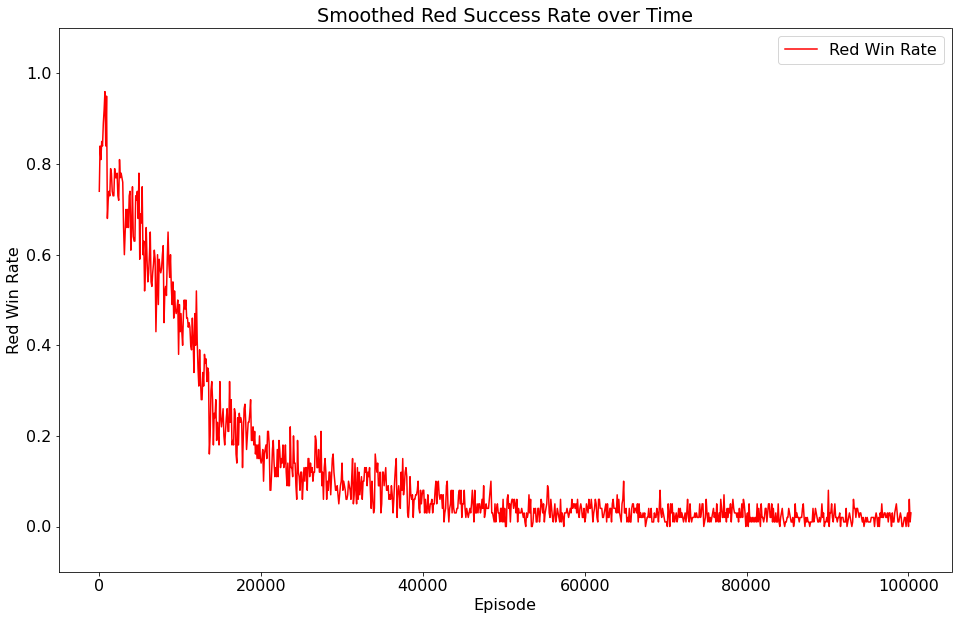

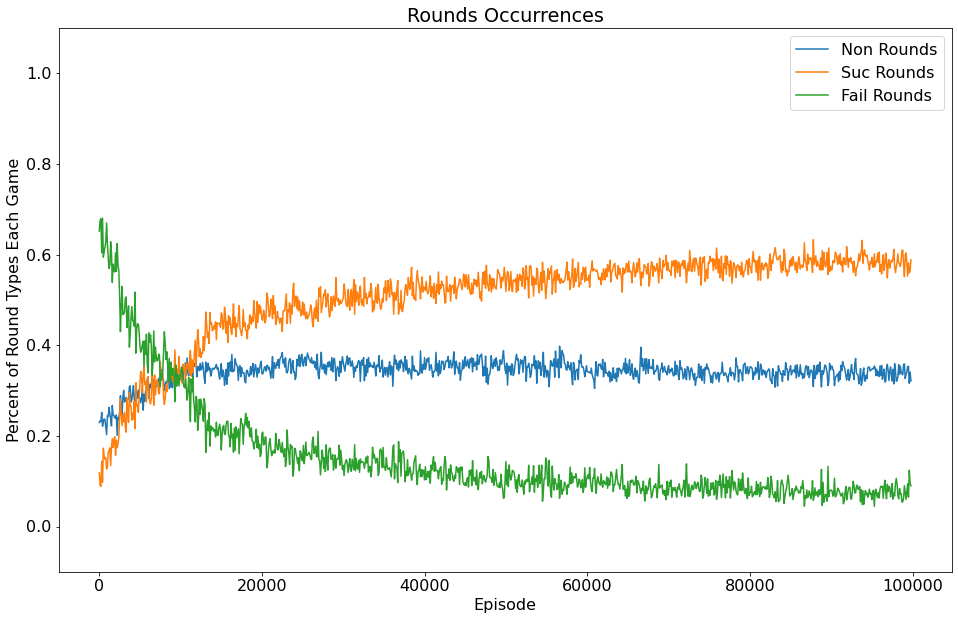

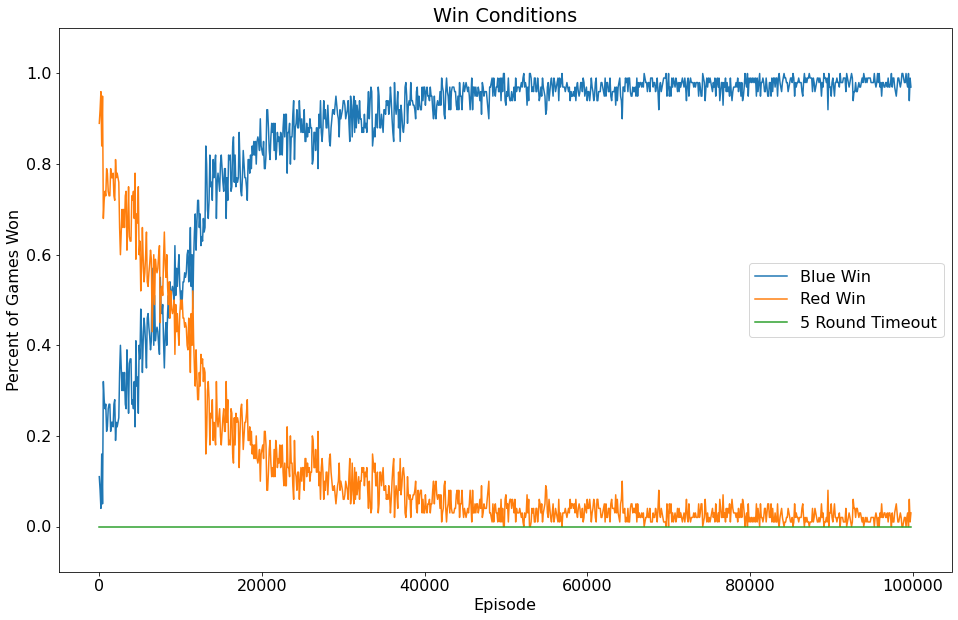

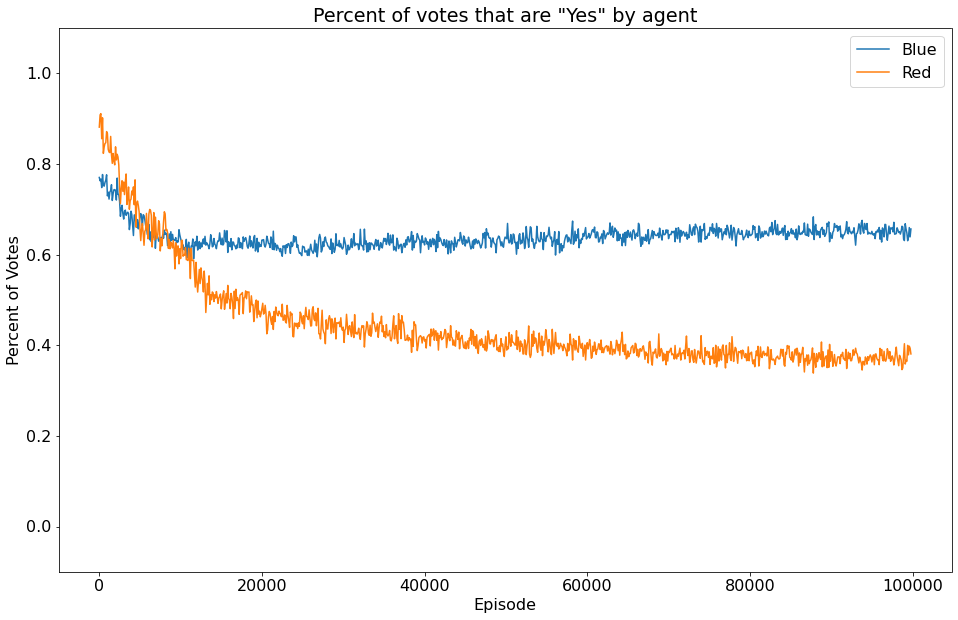

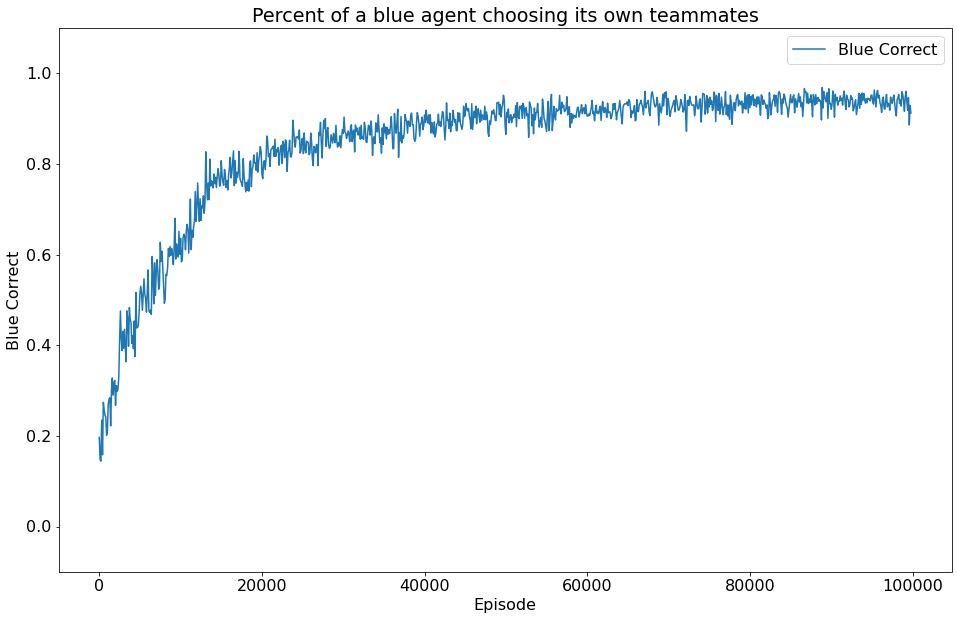

epoch 201 - loss = 0.14845424890518188, last - 0.0006400156416930258
epoch 202 - loss = 0.13739699125289917, last - 4.019898915430531e-05
epoch 203 - loss = 0.15129061043262482, last - 0.010487762279808521
epoch 204 - loss = 0.14888896048069, last - 0.0012055778643116355
epoch 205 - loss = 0.14723779261112213, last - 2.061162558675278e-05
epoch 206 - loss = 0.15444634854793549, last - 0.00035237177507951856
epoch 207 - loss = 0.14272570610046387, last - 0.00043692387407645583
epoch 208 - loss = 0.15484921634197235, last - 0.08275998383760452
epoch 209 - loss = 0.1461137980222702, last - 0.0003100875474046916
epoch 210 - loss = 0.1477089822292328, last - 0.0001768766378518194
epoch 211 - loss = 0.1477251648902893, last - 9.393815162184183e-06
epoch 212 - loss = 0.15400110185146332, last - 0.002007849048823118
epoch 213 - loss = 0.14247041940689087, last - 0.00030269043054431677
epoch 214 - loss = 0.148995041847229, last - 0.004615118261426687
epoch 215 - loss = 0.14393088221549988, last

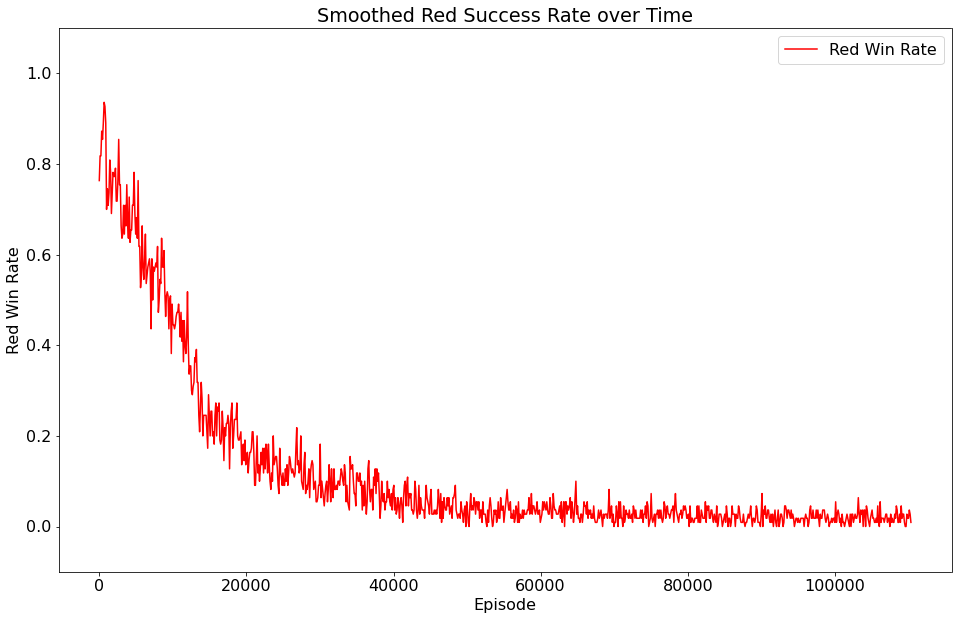

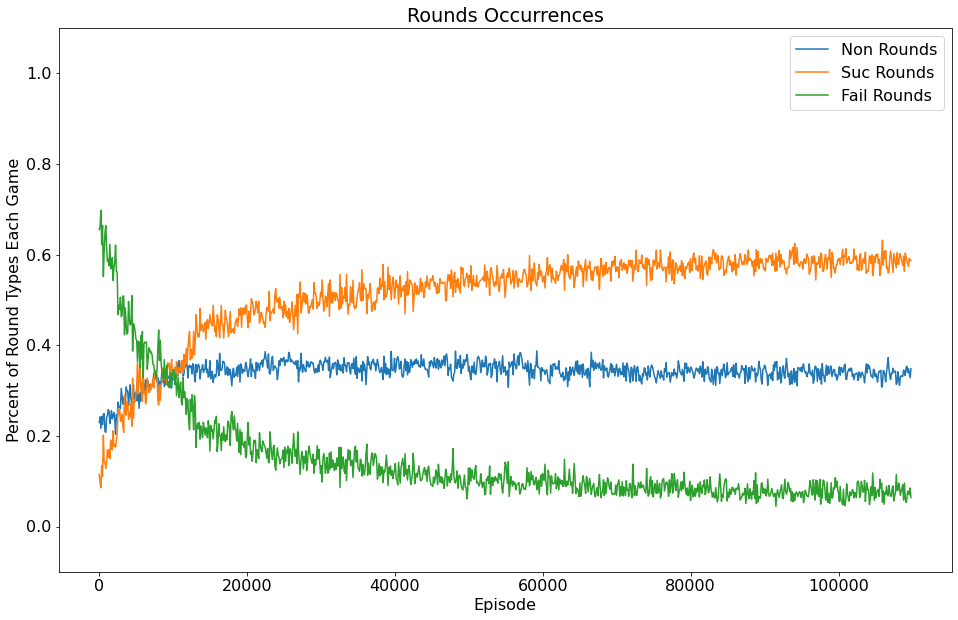

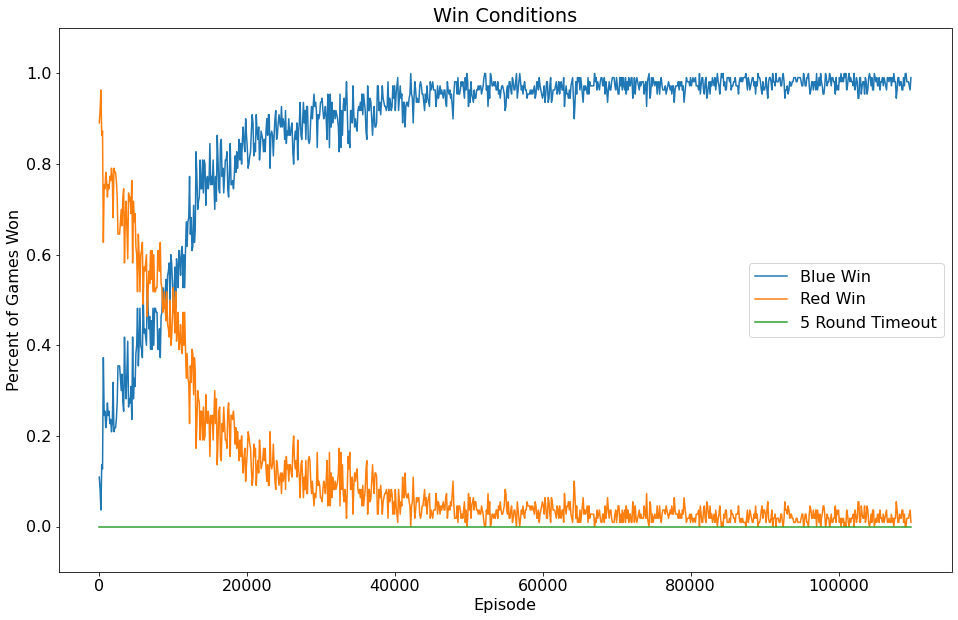

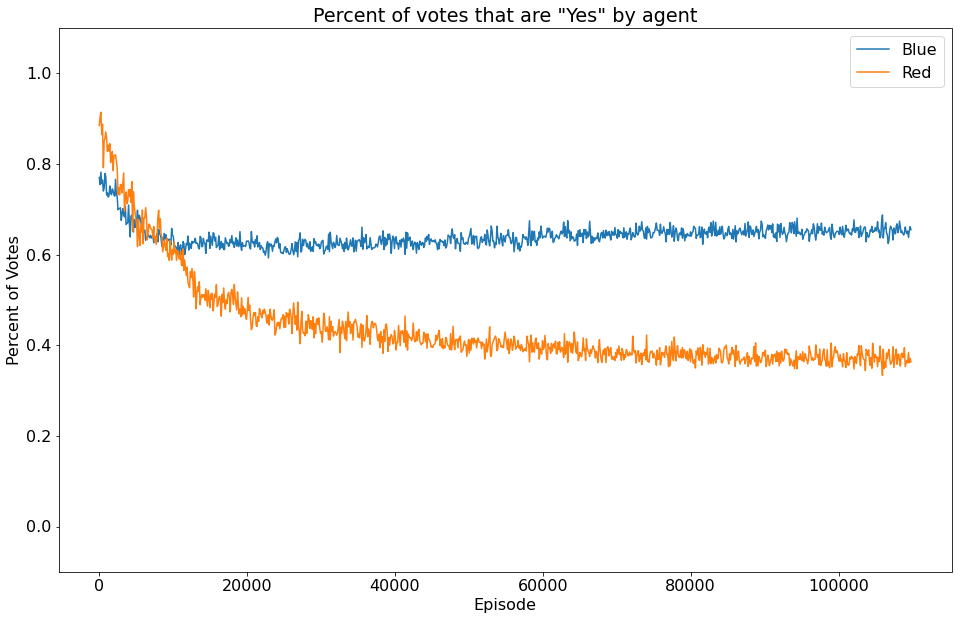

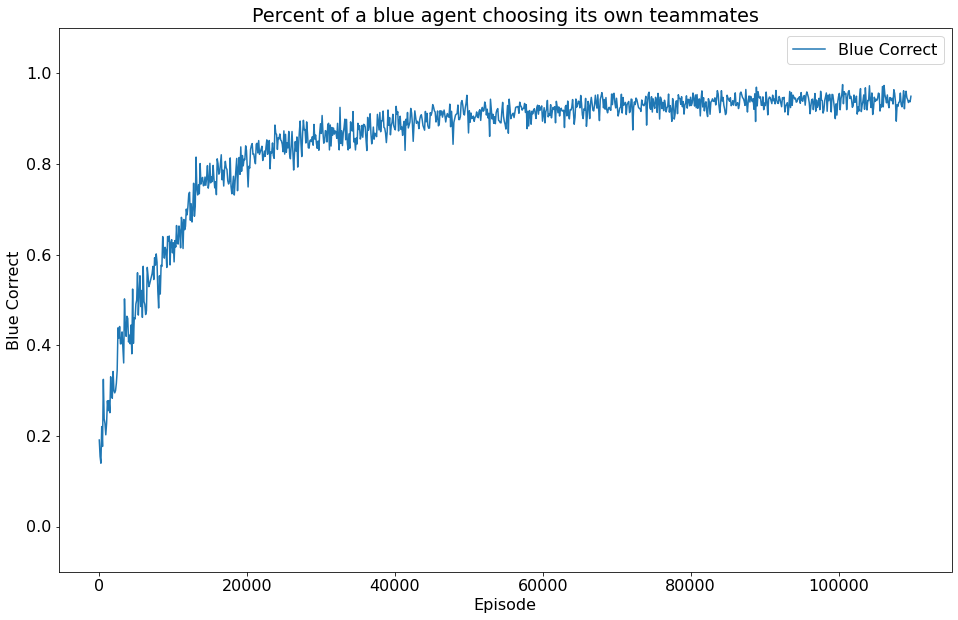

epoch 221 - loss = 0.14130562543869019, last - 0.00015483572497032583
epoch 222 - loss = 0.14181753993034363, last - 0.000195762884686701
epoch 223 - loss = 0.13758844137191772, last - 5.674402927979827e-06
epoch 224 - loss = 0.14242519438266754, last - 6.239024514798075e-05
epoch 225 - loss = 0.1469394415616989, last - 1.4698877748742234e-05
epoch 226 - loss = 0.1424732655286789, last - 6.395277159754187e-05
epoch 227 - loss = 0.13682183623313904, last - 0.00012157675519119948
epoch 228 - loss = 0.14043885469436646, last - 8.531093772035092e-05
epoch 229 - loss = 0.14683042466640472, last - 0.00010467340325703844
epoch 230 - loss = 0.1486493945121765, last - 0.0007848252425901592
epoch 231 - loss = 0.15475516021251678, last - 0.00021089431538712233
epoch 232 - loss = 0.1440095603466034, last - 0.0018590826075524092
epoch 233 - loss = 0.14601722359657288, last - 6.699614459648728e-06
epoch 234 - loss = 0.14215241372585297, last - 9.399704140378162e-05
epoch 235 - loss = 0.1404723525047

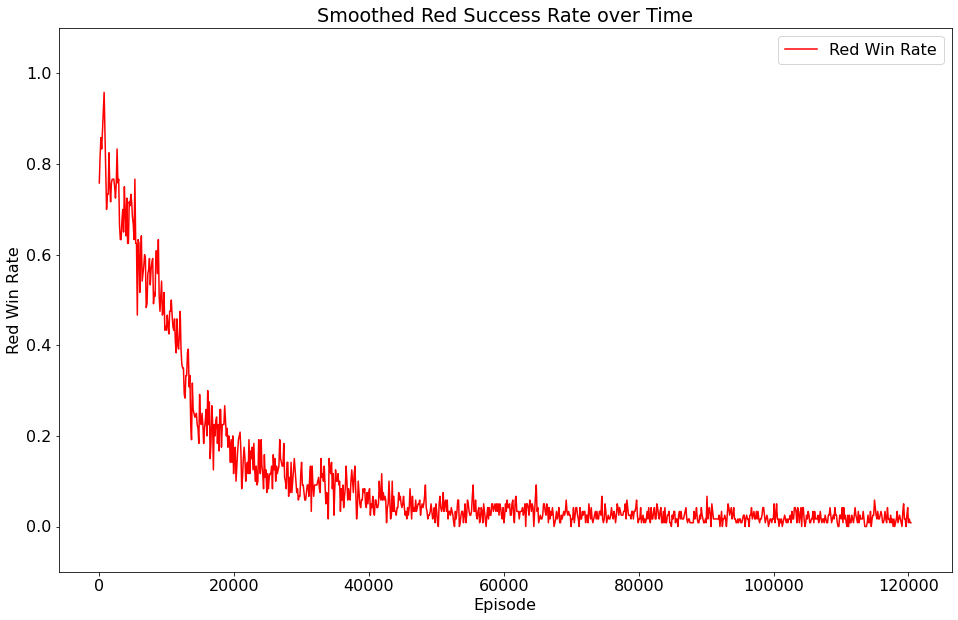

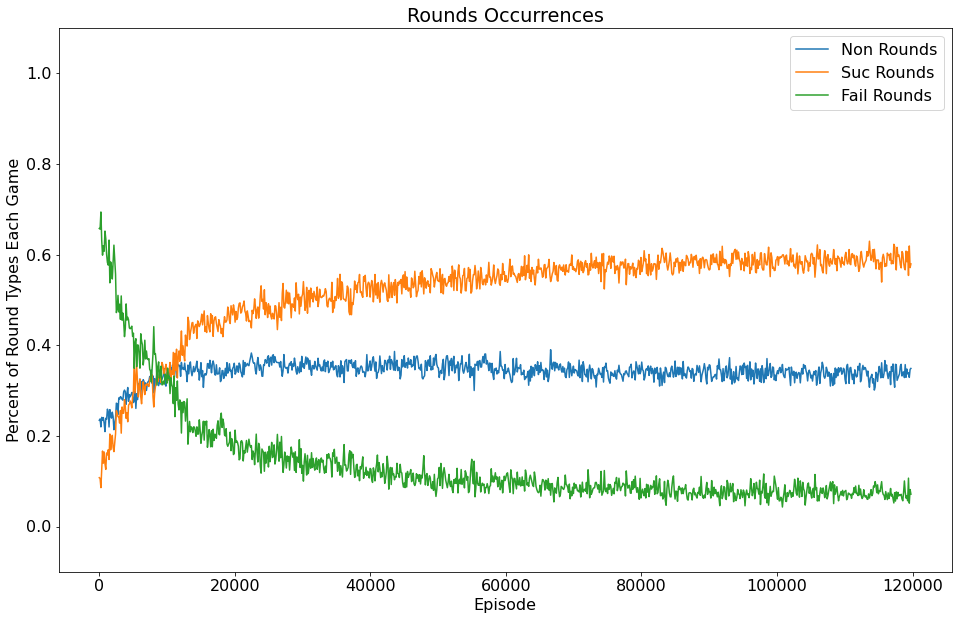

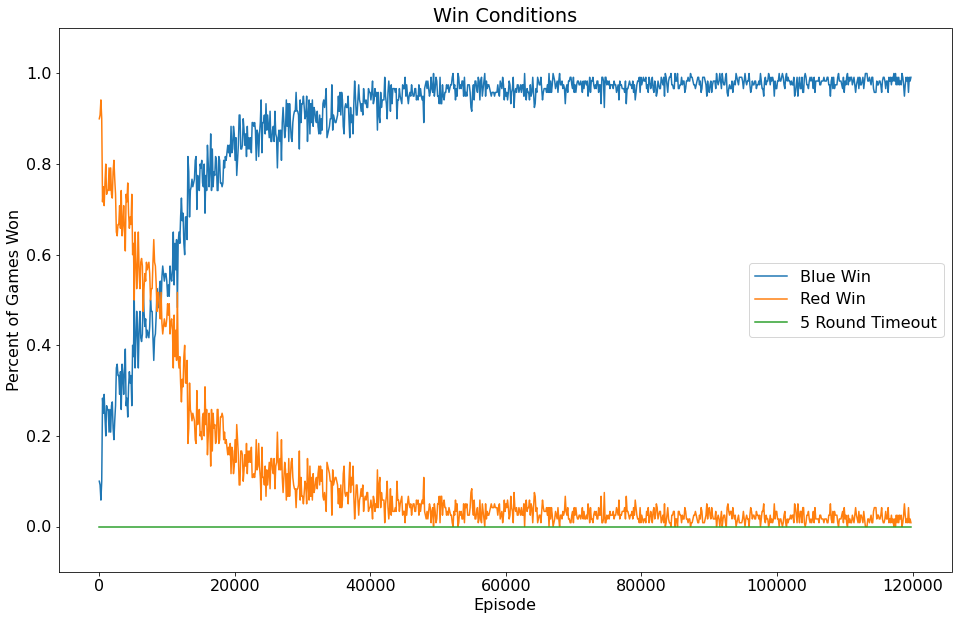

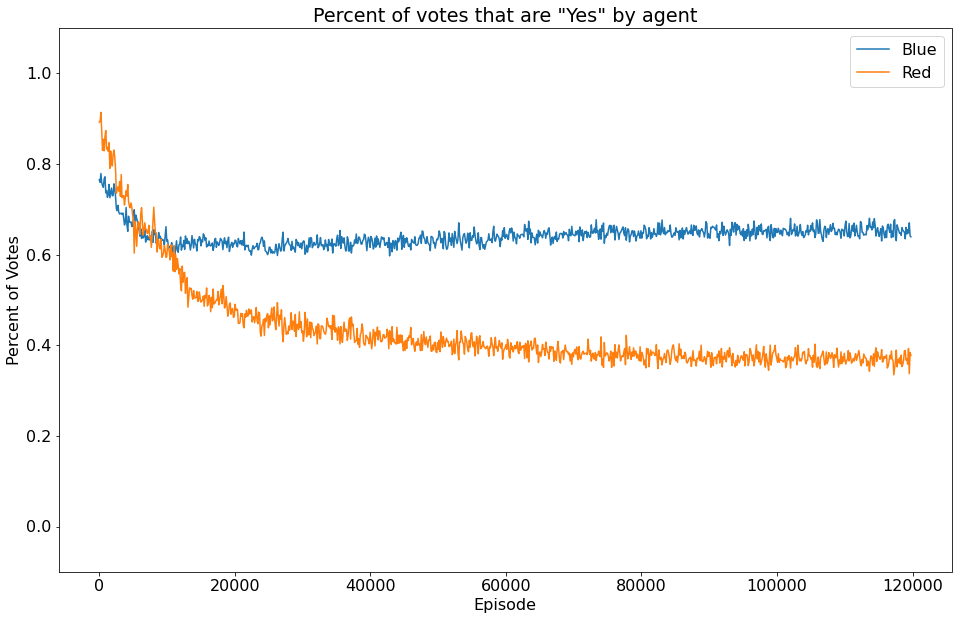

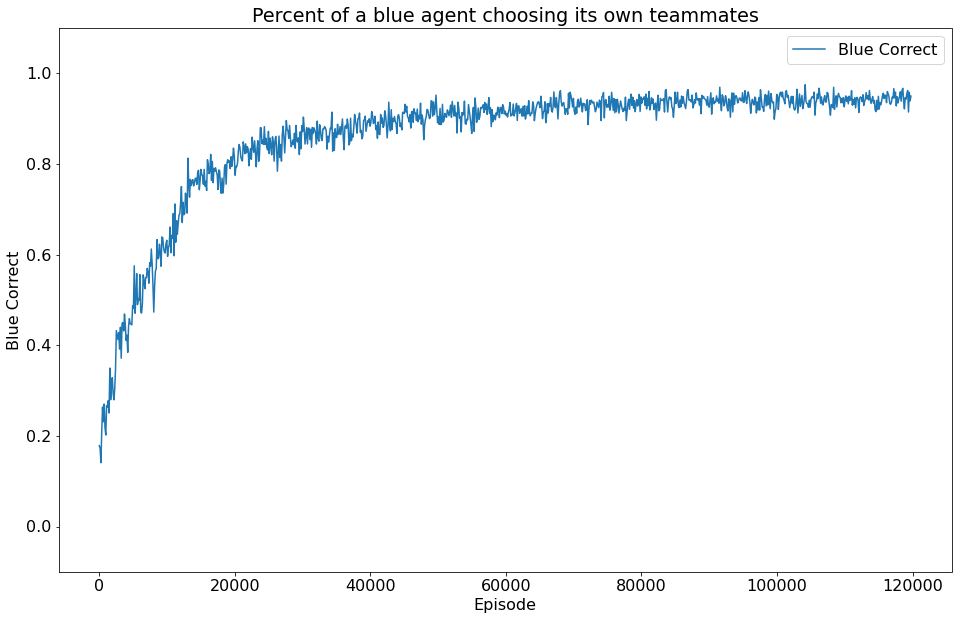

epoch 241 - loss = 0.13994185626506805, last - 8.058630555751733e-06
epoch 242 - loss = 0.1417689472436905, last - 7.866718078730628e-05
epoch 243 - loss = 0.14040111005306244, last - 6.294344984780764e-06
epoch 244 - loss = 0.13773757219314575, last - 0.00013558546197600663
epoch 245 - loss = 0.1382705420255661, last - 5.805538421554957e-06
epoch 246 - loss = 0.13778150081634521, last - 4.432569767232053e-05
epoch 247 - loss = 0.13385799527168274, last - 0.00013978173956274986
epoch 248 - loss = 0.1375119686126709, last - 8.451227040495723e-05
epoch 249 - loss = 0.13854242861270905, last - 0.00014862341049592942
epoch 250 - loss = 0.1371224969625473, last - 8.582575537730008e-05
epoch 251 - loss = 0.13943596184253693, last - 7.927485057734884e-06
epoch 252 - loss = 0.14133356511592865, last - 5.590950422629248e-06
epoch 253 - loss = 0.13659605383872986, last - 0.0008905550348572433
epoch 254 - loss = 0.13701368868350983, last - 5.226734356256202e-05
epoch 255 - loss = 0.13678462803363

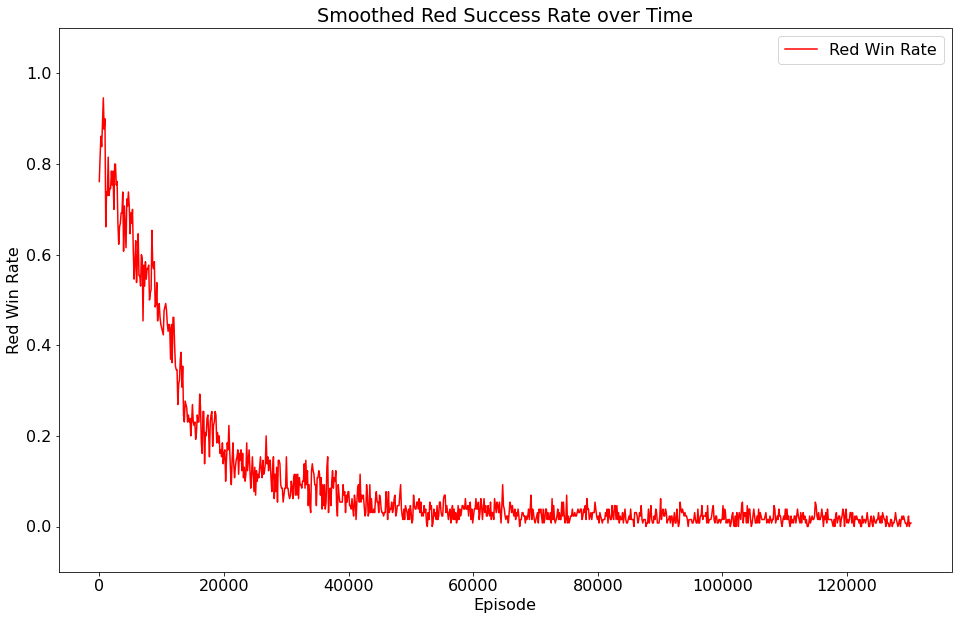

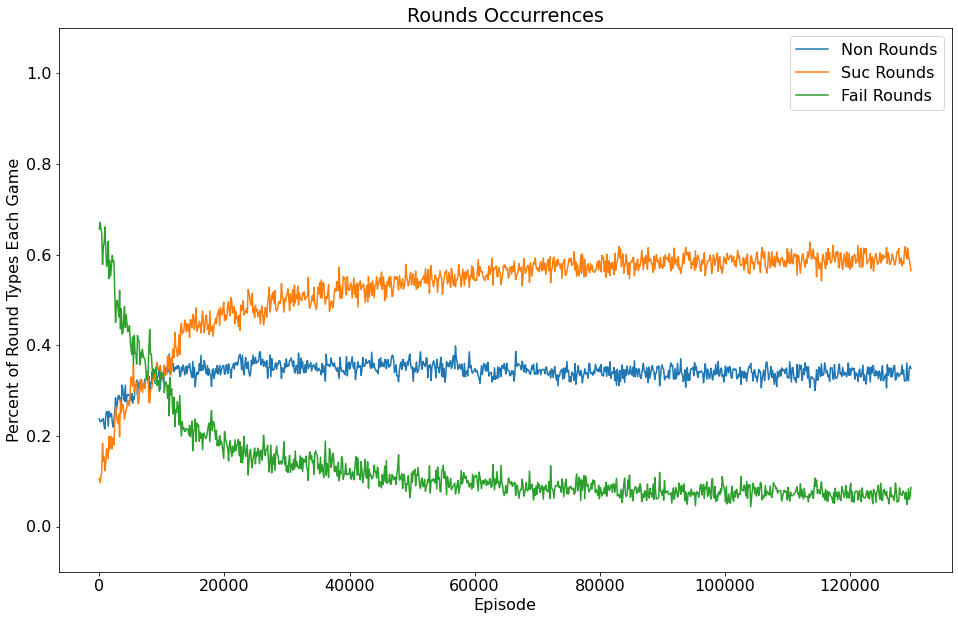

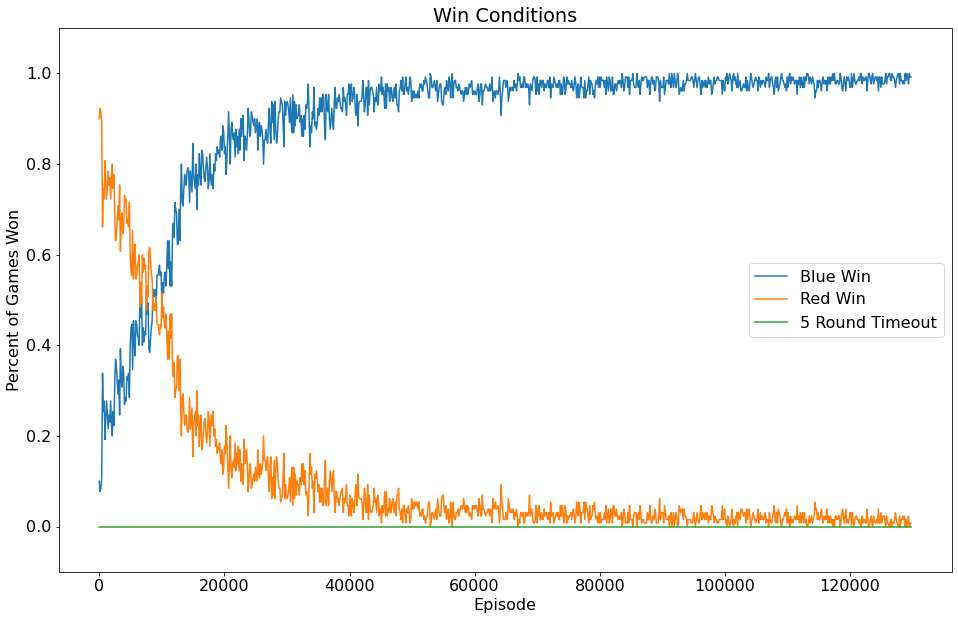

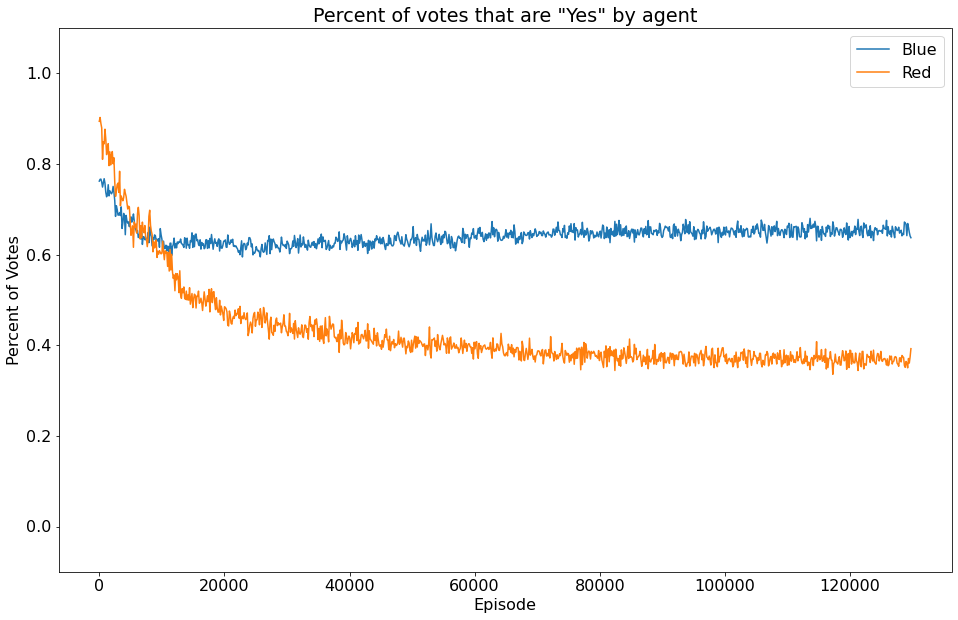

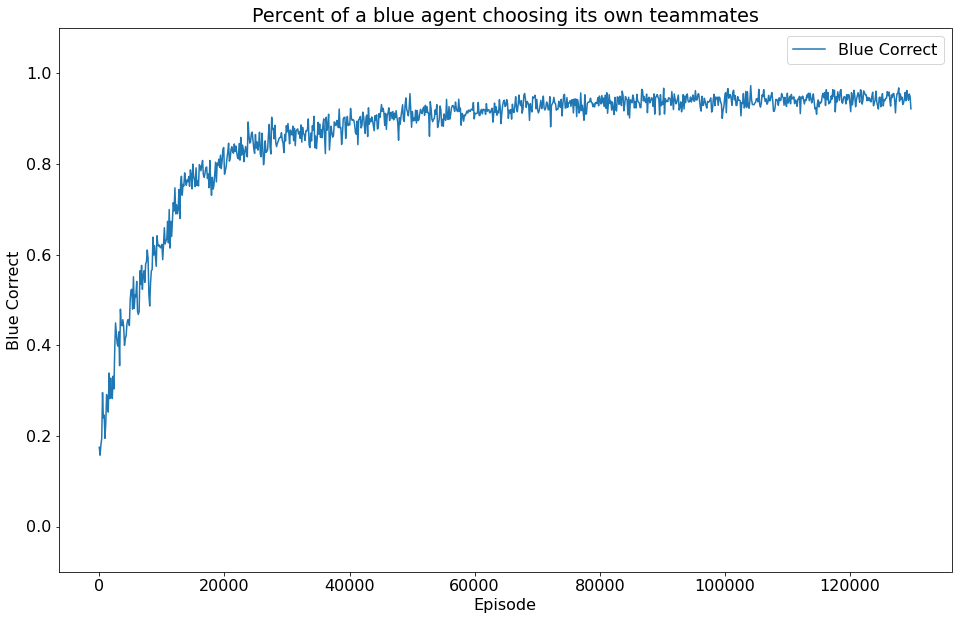

epoch 261 - loss = 0.1343148797750473, last - 0.00013395333371590823
epoch 262 - loss = 0.14096657931804657, last - 3.436940460233018e-05
epoch 263 - loss = 0.1356380134820938, last - 2.2507290850626305e-05
epoch 264 - loss = 0.13877154886722565, last - 0.0005604132311418653
epoch 265 - loss = 0.13784921169281006, last - 6.413502887880895e-06
epoch 266 - loss = 0.13447205722332, last - 0.00015577297017443925
epoch 267 - loss = 0.13525710999965668, last - 0.03844375163316727
epoch 268 - loss = 0.13607965409755707, last - 0.00015593177522532642
epoch 269 - loss = 0.13307036459445953, last - 1.1420546798035502e-05
epoch 270 - loss = 0.13690470159053802, last - 1.0931743418041151e-05
epoch 271 - loss = 0.14028069376945496, last - 1.35662294269423e-05
epoch 272 - loss = 0.13792307674884796, last - 1.3828307601215784e-06
epoch 273 - loss = 0.1284763216972351, last - 7.819148595444858e-05
epoch 274 - loss = 0.13070331513881683, last - 7.372507388936356e-05
epoch 275 - loss = 0.131553083658218

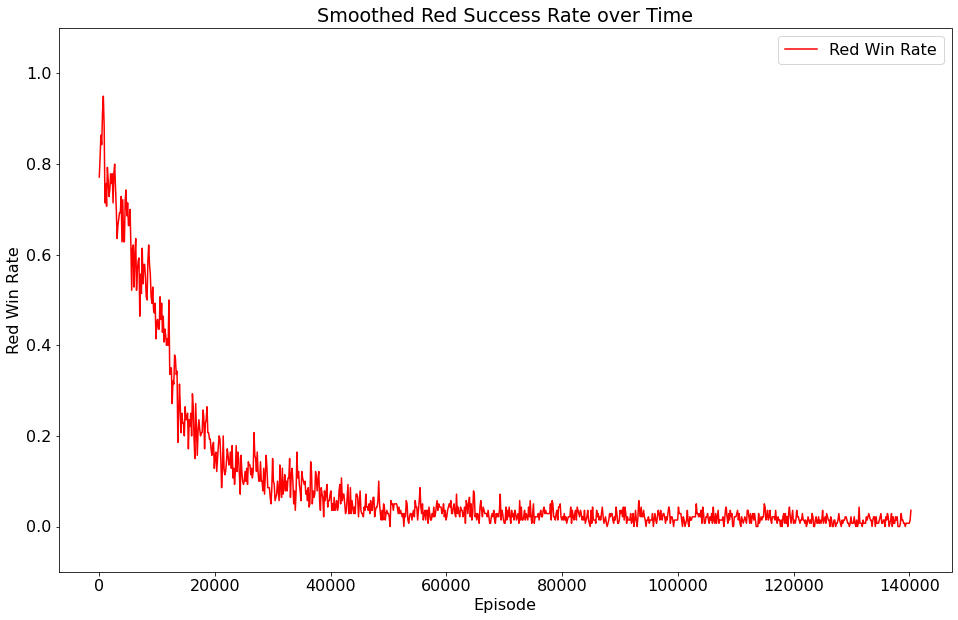

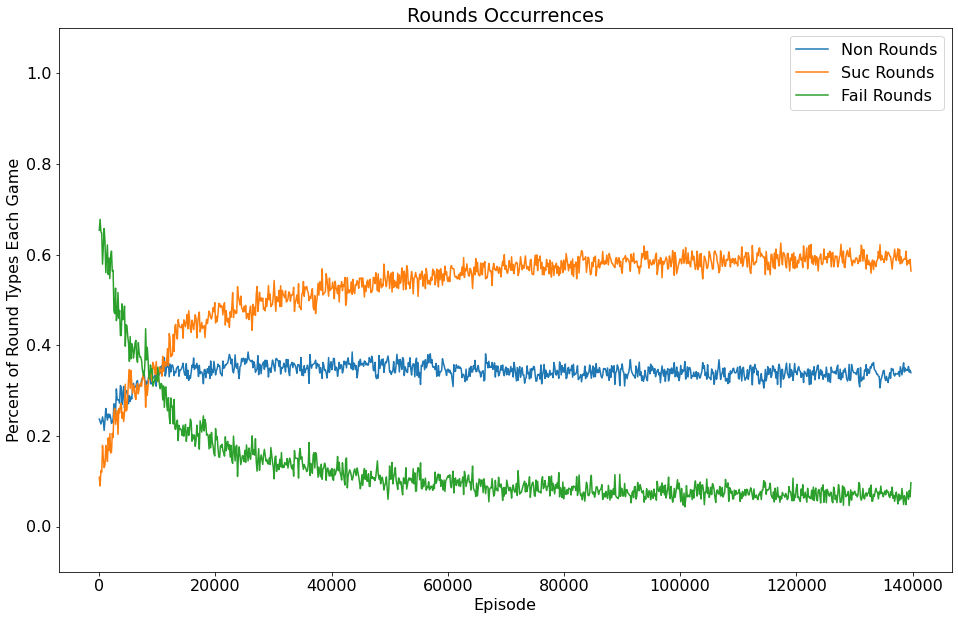

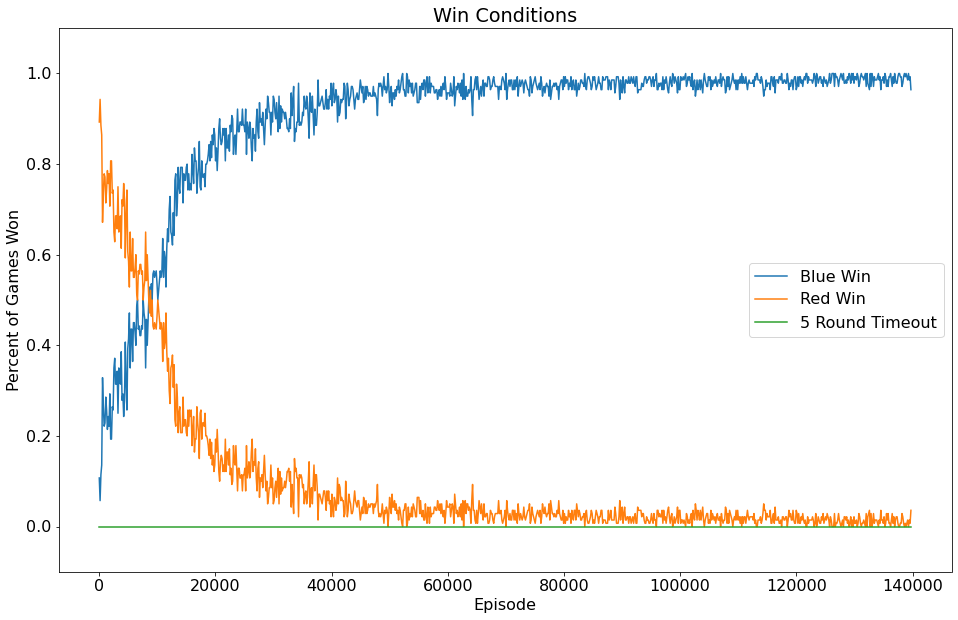

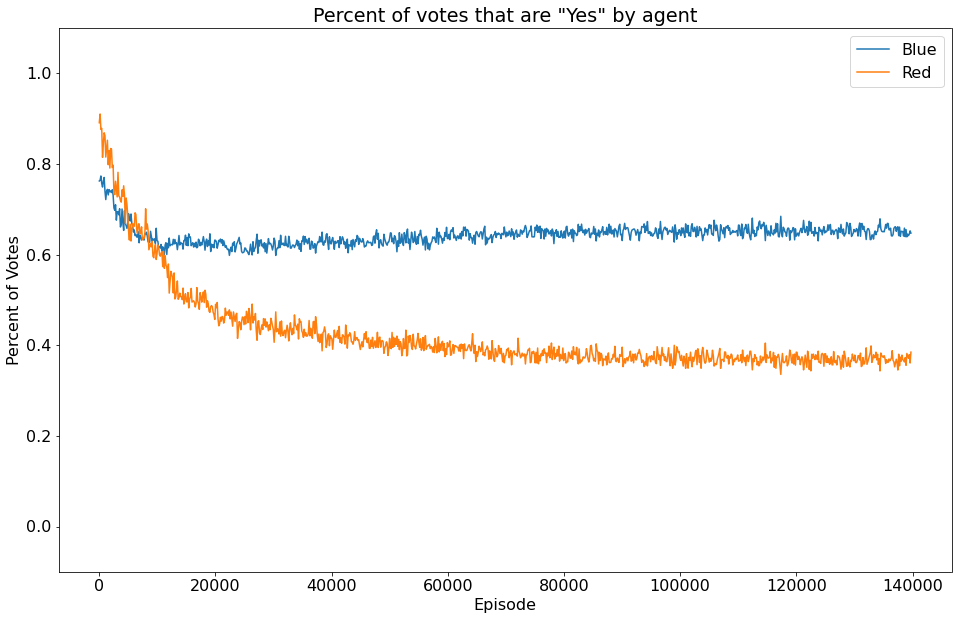

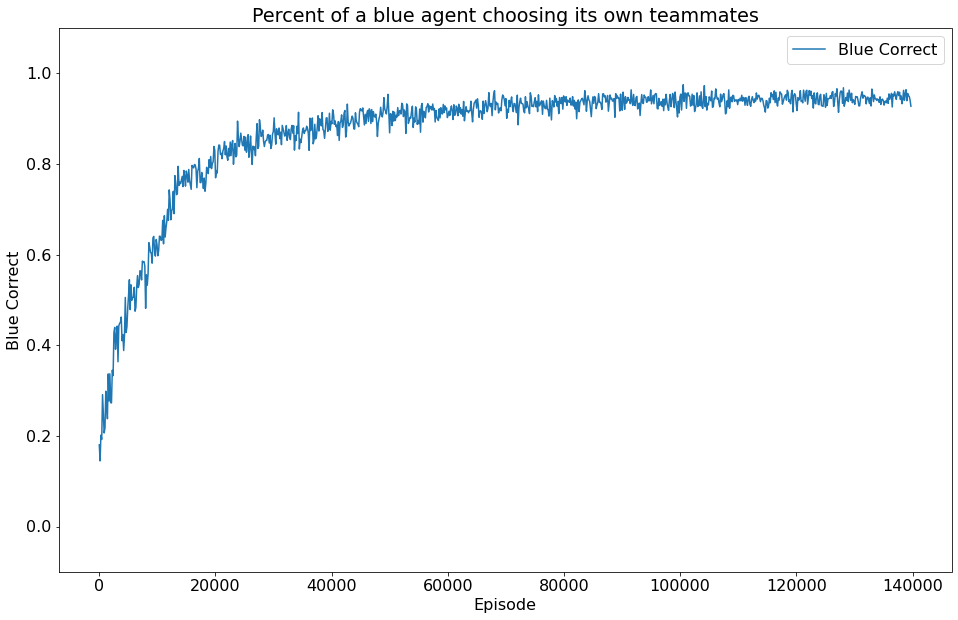

epoch 281 - loss = 0.13480745255947113, last - 0.00041533884359523654
epoch 282 - loss = 0.12798413634300232, last - 1.1837799320346676e-05
epoch 283 - loss = 0.1317724585533142, last - 3.910076884494629e-06
epoch 284 - loss = 0.13164915144443512, last - 0.0008047775481827557
epoch 285 - loss = 0.1313437521457672, last - 0.05288960784673691
epoch 286 - loss = 0.1340695321559906, last - 0.0001654588122619316
epoch 287 - loss = 0.1410217583179474, last - 0.002046310342848301
epoch 288 - loss = 0.13346049189567566, last - 0.0006560163456015289
epoch 289 - loss = 0.12914831936359406, last - 6.377794306899887e-06
epoch 290 - loss = 0.13317862153053284, last - 0.00010290664795320481
epoch 291 - loss = 0.1310126781463623, last - 8.535464985470753e-06
epoch 292 - loss = 0.14394940435886383, last - 0.0001258451520698145
epoch 293 - loss = 0.13238045573234558, last - 2.0504048734437674e-06
epoch 294 - loss = 0.13019342720508575, last - 1.4293417734734248e-05
epoch 295 - loss = 0.1289234459400177

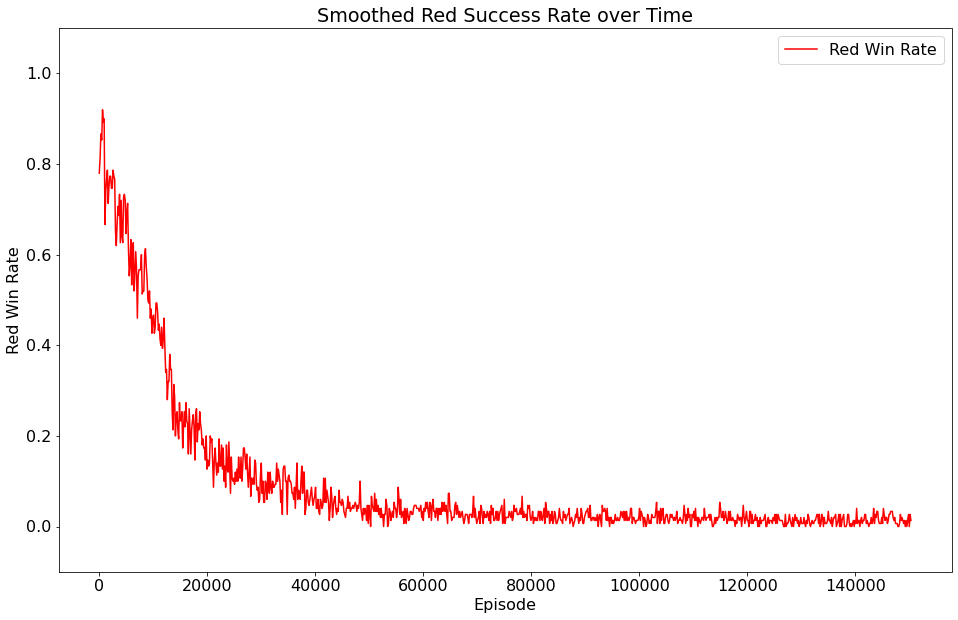

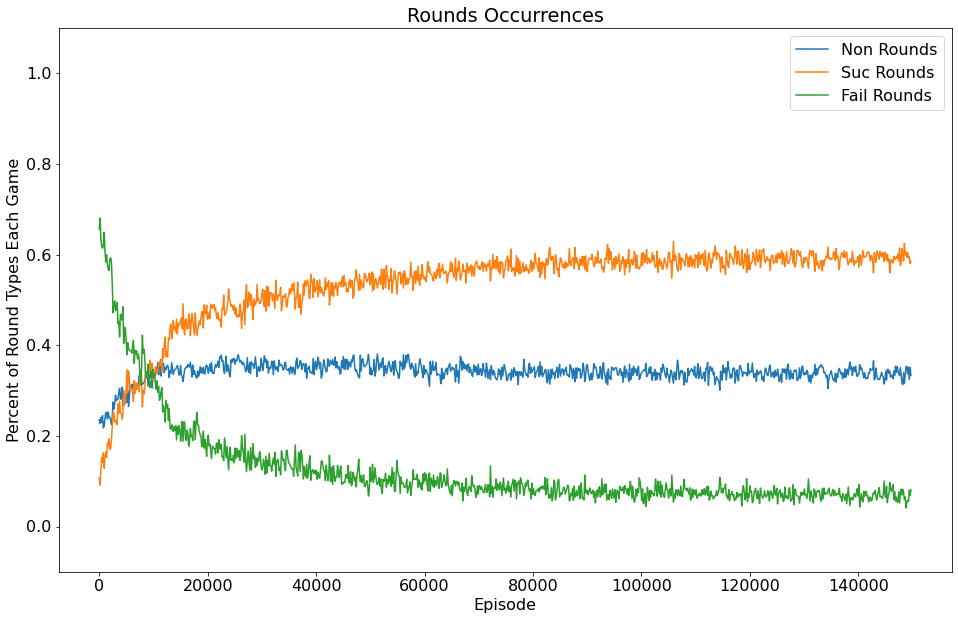

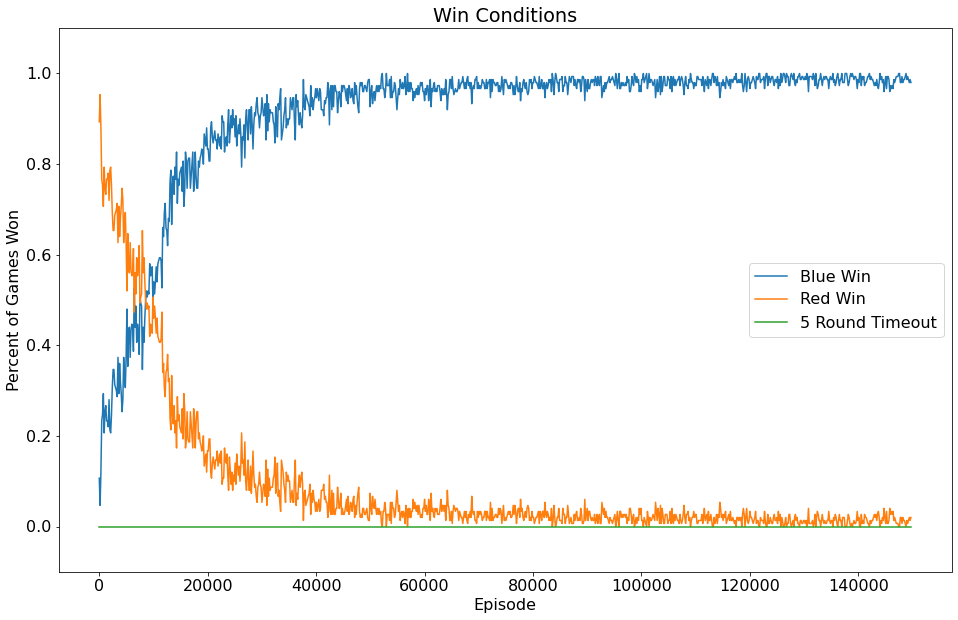

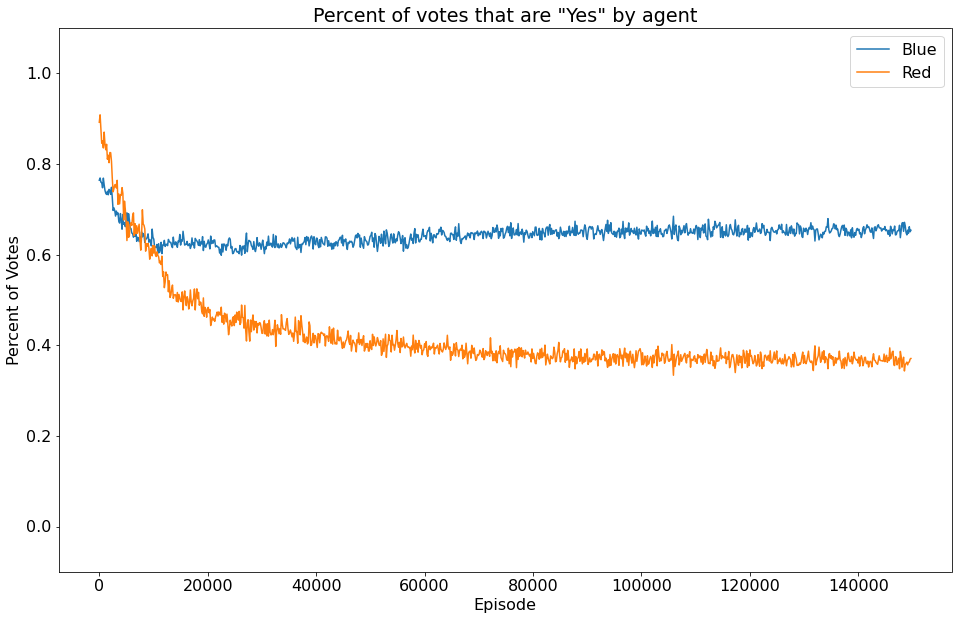

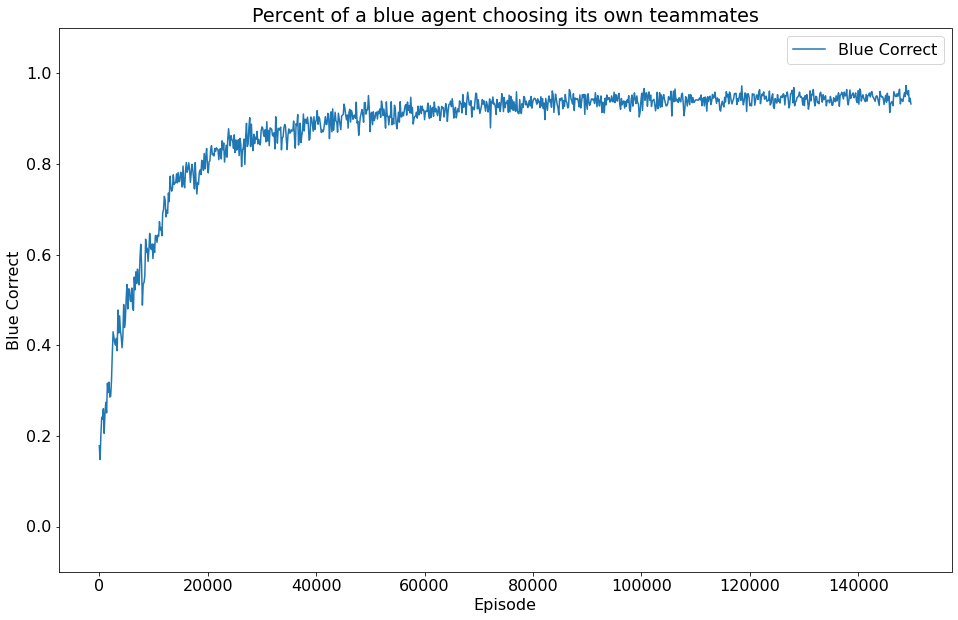

epoch 301 - loss = 0.1280820071697235, last - 2.6084366254508495e-05
epoch 302 - loss = 0.1318831443786621, last - 0.00011608314525801688
epoch 303 - loss = 0.13626046478748322, last - 6.936377030797303e-05
epoch 304 - loss = 0.12980005145072937, last - 6.115990254329517e-05
epoch 305 - loss = 0.12843090295791626, last - 0.00010201926488662139
epoch 306 - loss = 0.13313613831996918, last - 9.894381491903914e-07
epoch 307 - loss = 0.13138124346733093, last - 2.486778612365015e-05
epoch 308 - loss = 0.12958087027072906, last - 0.00025533369625918567
epoch 309 - loss = 0.13135549426078796, last - 5.579061507887673e-06
epoch 310 - loss = 0.13014967739582062, last - 0.03302796930074692
epoch 311 - loss = 0.1356639713048935, last - 8.972722571343184e-05
epoch 312 - loss = 0.13061347603797913, last - 2.0194853277644143e-05
epoch 313 - loss = 0.12608163058757782, last - 0.0013646729057654738
epoch 314 - loss = 0.12614905834197998, last - 2.264982867927756e-06
epoch 315 - loss = 0.1334304958581

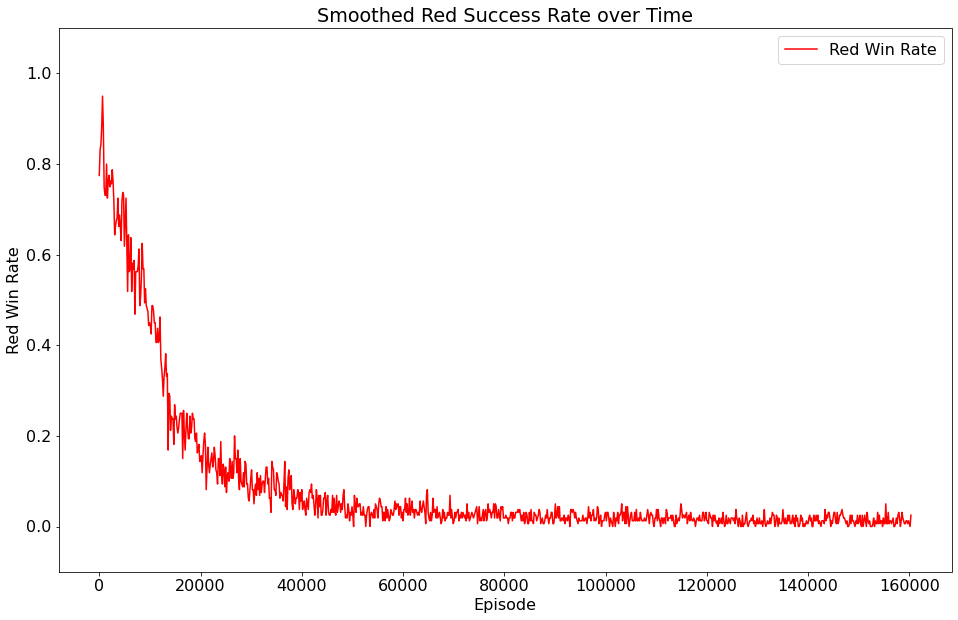

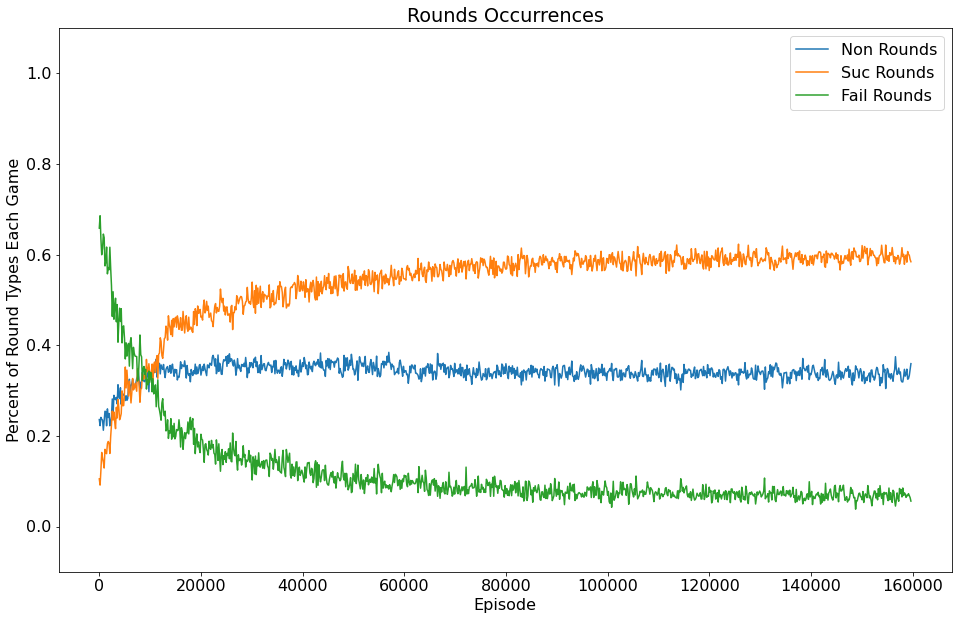

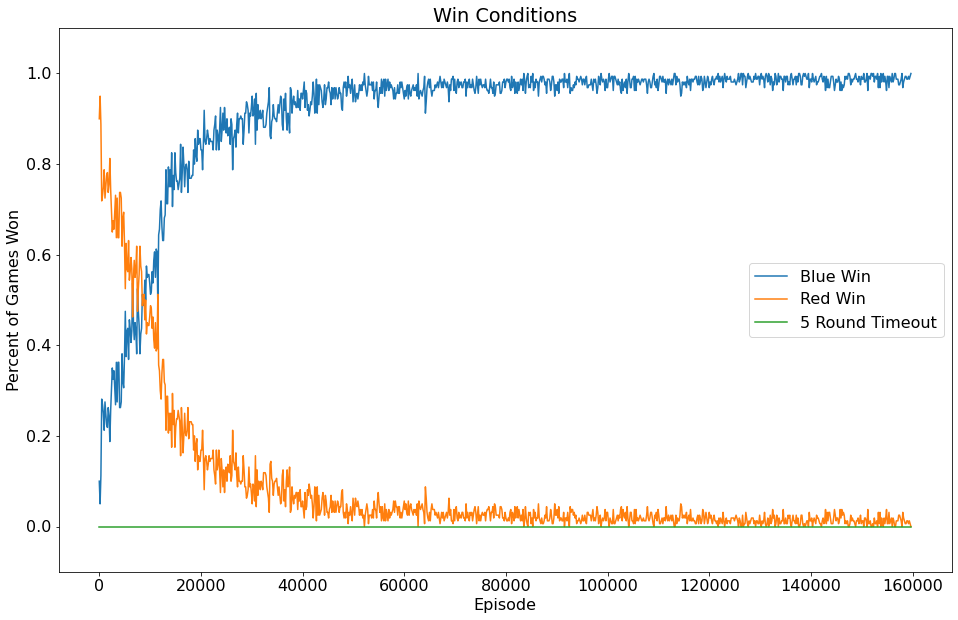

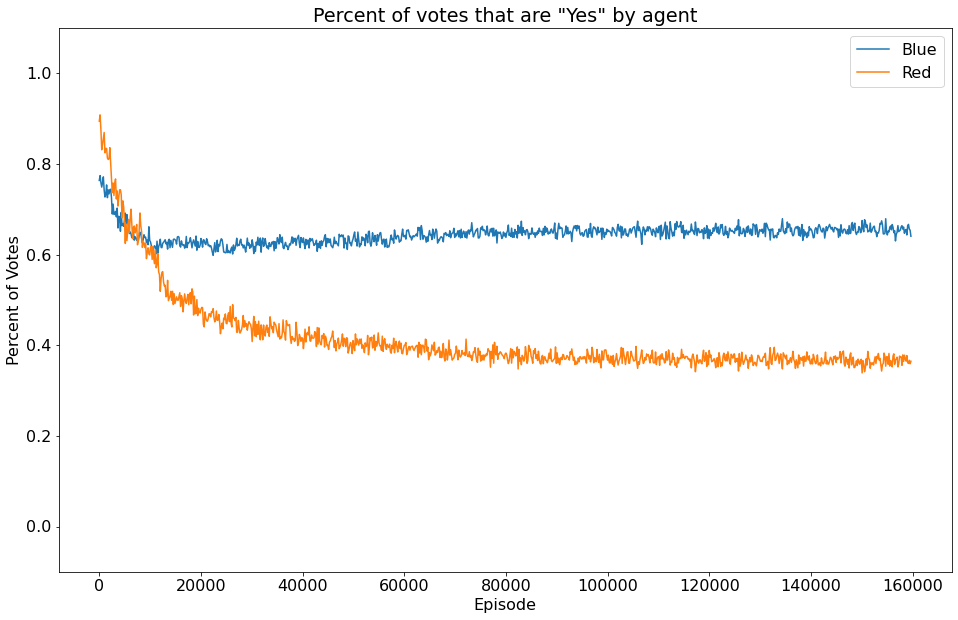

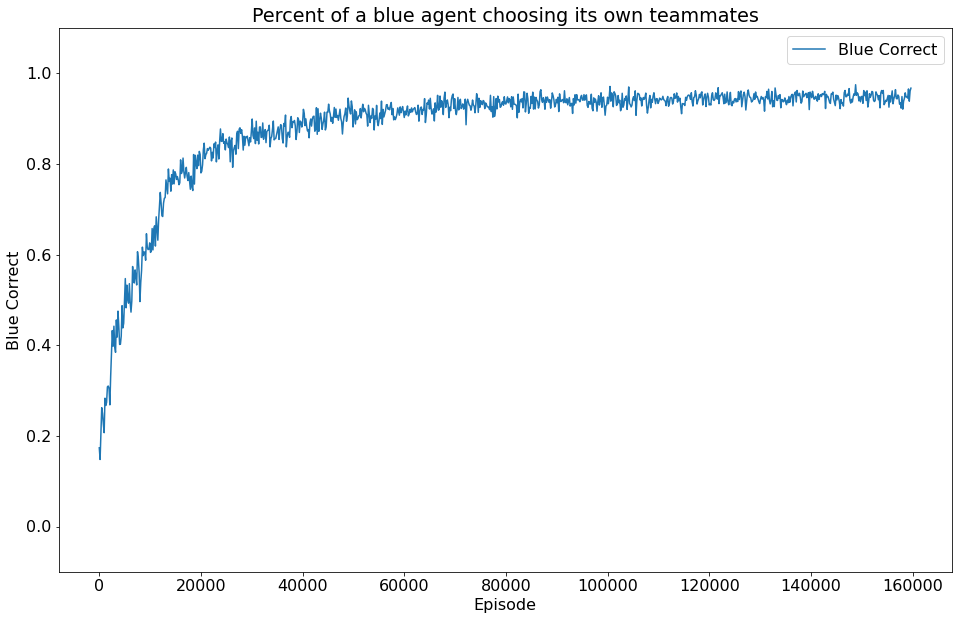

epoch 321 - loss = 0.12699605524539948, last - 3.719348342201556e-06
epoch 322 - loss = 0.13128452003002167, last - 4.43607204942964e-05
epoch 323 - loss = 0.12788508832454681, last - 1.4162311344989575e-05
epoch 324 - loss = 0.12550409138202667, last - 0.00012038936984026805
epoch 325 - loss = 0.13064345717430115, last - 3.9339084878520225e-07
epoch 326 - loss = 0.1280989944934845, last - 7.414870196953416e-06
epoch 327 - loss = 0.1353389024734497, last - 3.981623194704298e-06
epoch 328 - loss = 0.12675221264362335, last - 3.2425170957139926e-06
epoch 329 - loss = 0.12855374813079834, last - 0.00018815489602275193
epoch 330 - loss = 0.12421306222677231, last - 6.437306296902534e-07
epoch 331 - loss = 0.12831276655197144, last - 0.0003592584398575127
epoch 332 - loss = 0.1254834085702896, last - 1.5676580005674623e-05
epoch 333 - loss = 0.13156117498874664, last - 3.814717274508439e-06
epoch 334 - loss = 0.1306464672088623, last - 1.2922539099236019e-05
epoch 335 - loss = 0.12496235966

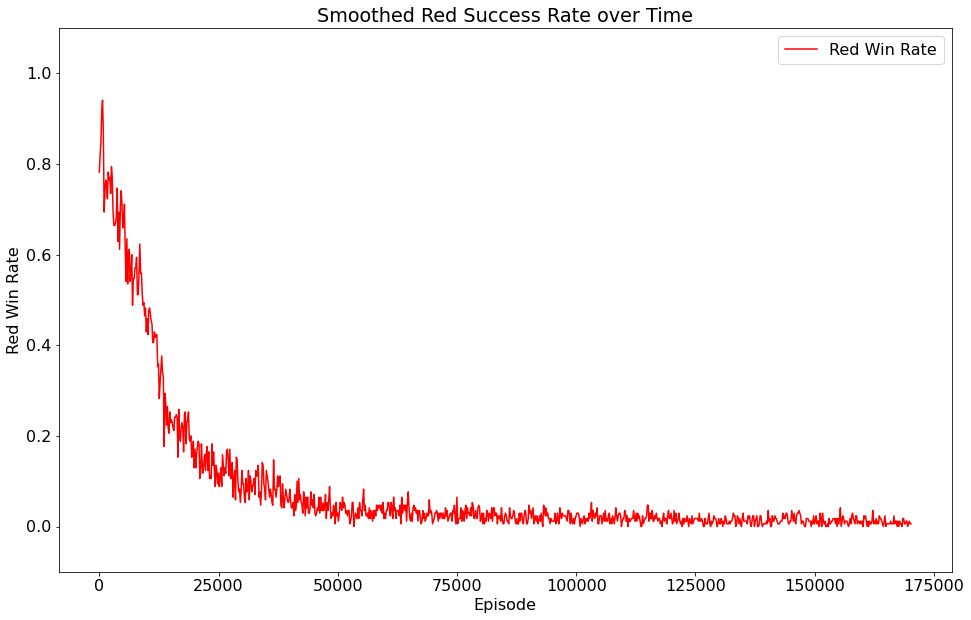

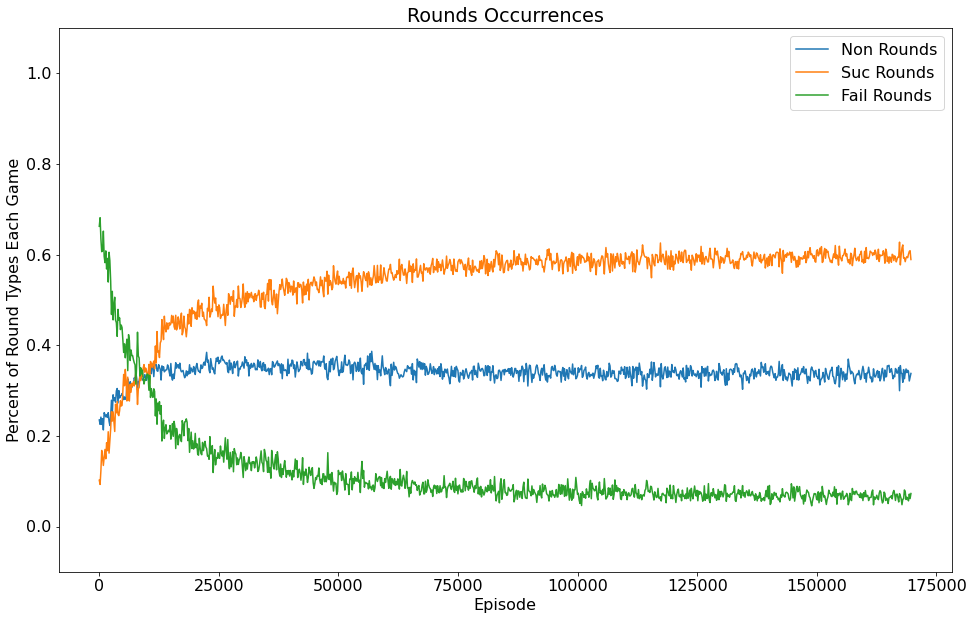

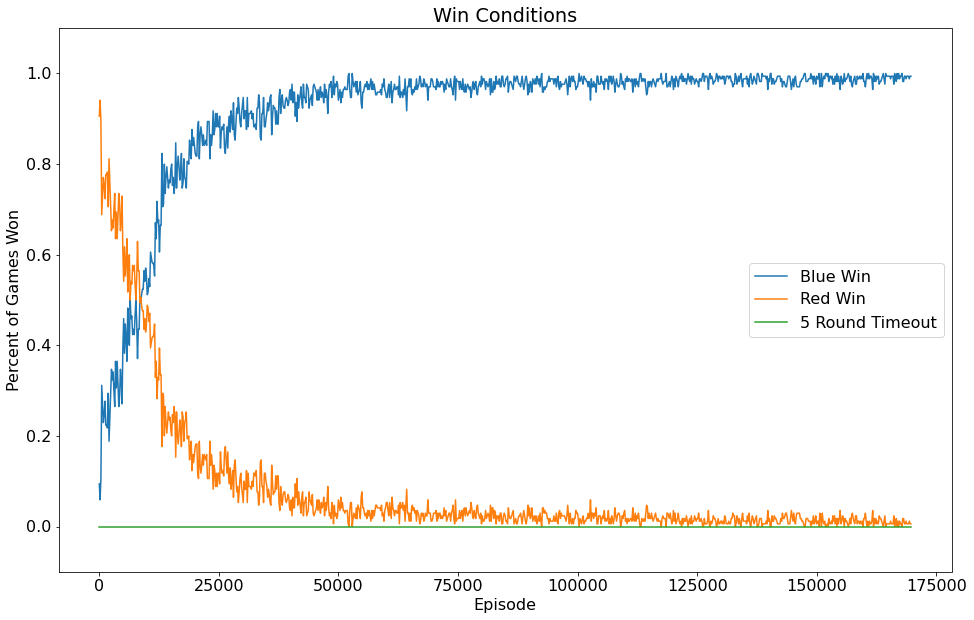

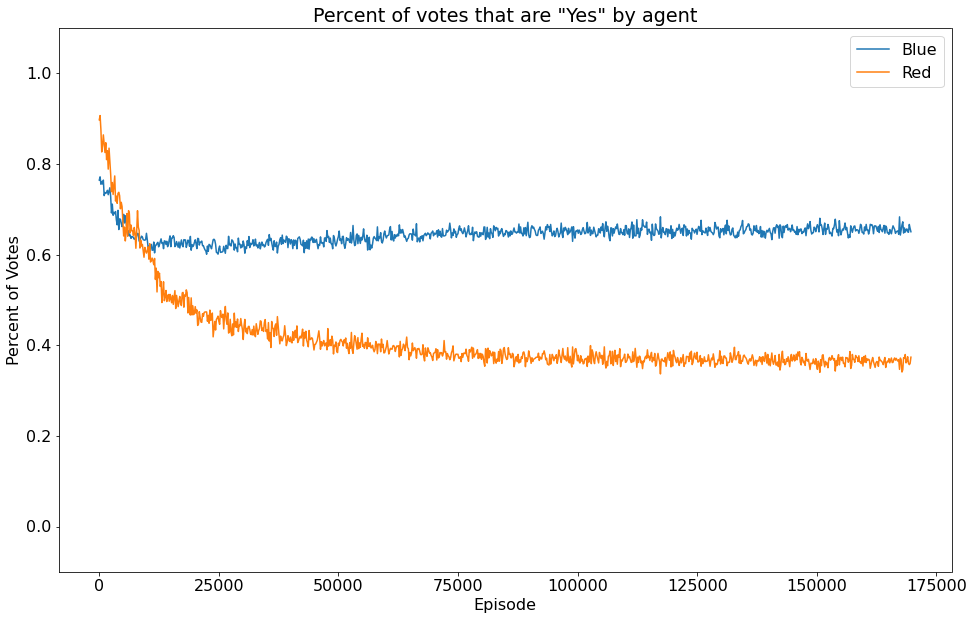

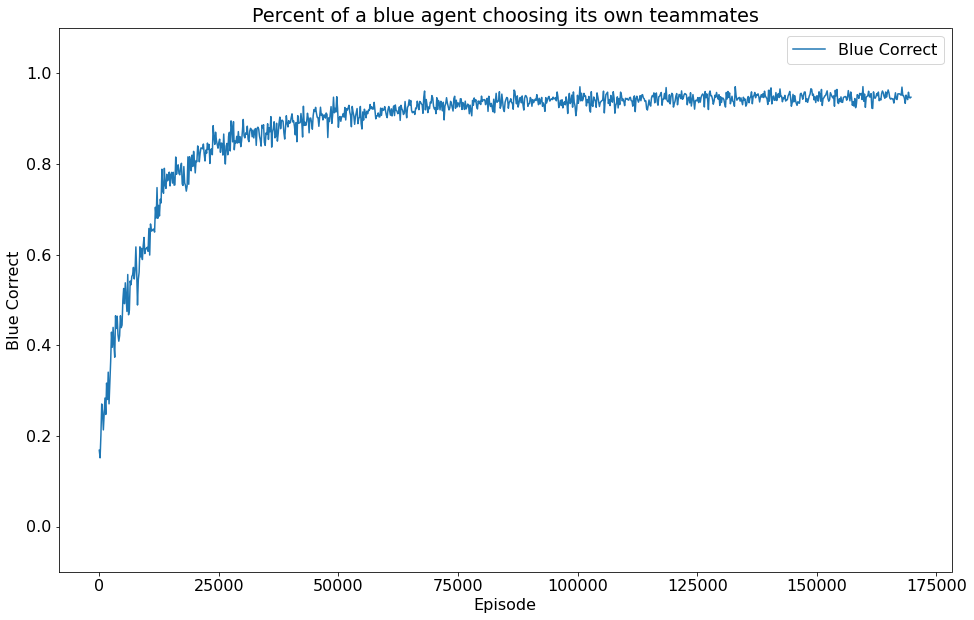

epoch 341 - loss = 0.1275201141834259, last - 6.175088401505491e-06
epoch 342 - loss = 0.12541787326335907, last - 4.695979077951051e-05
epoch 343 - loss = 0.12810967862606049, last - 4.673057446780149e-06
epoch 344 - loss = 0.12498562783002853, last - 1.0669426956155803e-05
epoch 345 - loss = 0.1255476176738739, last - 3.0472083381027915e-05
epoch 346 - loss = 0.126266747713089, last - 2.634535803736071e-06
epoch 347 - loss = 0.13312649726867676, last - 2.7705420507118106e-05
epoch 348 - loss = 0.1294497549533844, last - 2.9206439648987725e-06
epoch 349 - loss = 0.12369054555892944, last - 0.00018355445354245603
epoch 350 - loss = 0.12524758279323578, last - 5.245211696092156e-07
epoch 351 - loss = 0.12151756137609482, last - 3.280870441813022e-05
epoch 352 - loss = 0.1263302117586136, last - 2.1053467207821086e-05
epoch 353 - loss = 0.12419158965349197, last - 1.8000662294070935e-06
epoch 354 - loss = 0.1217920184135437, last - 2.7336380298947915e-05
epoch 355 - loss = 0.124431088566

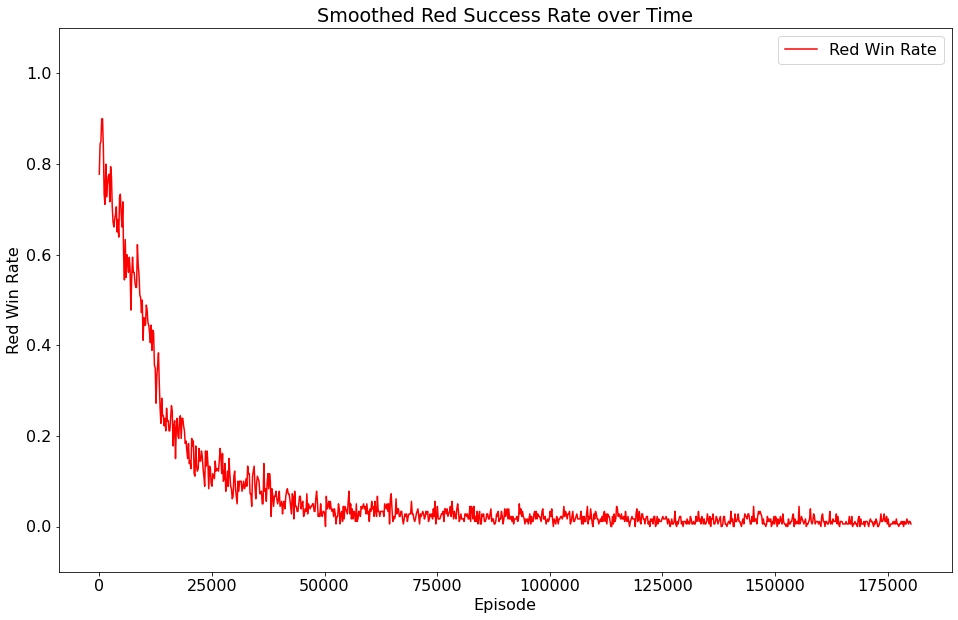

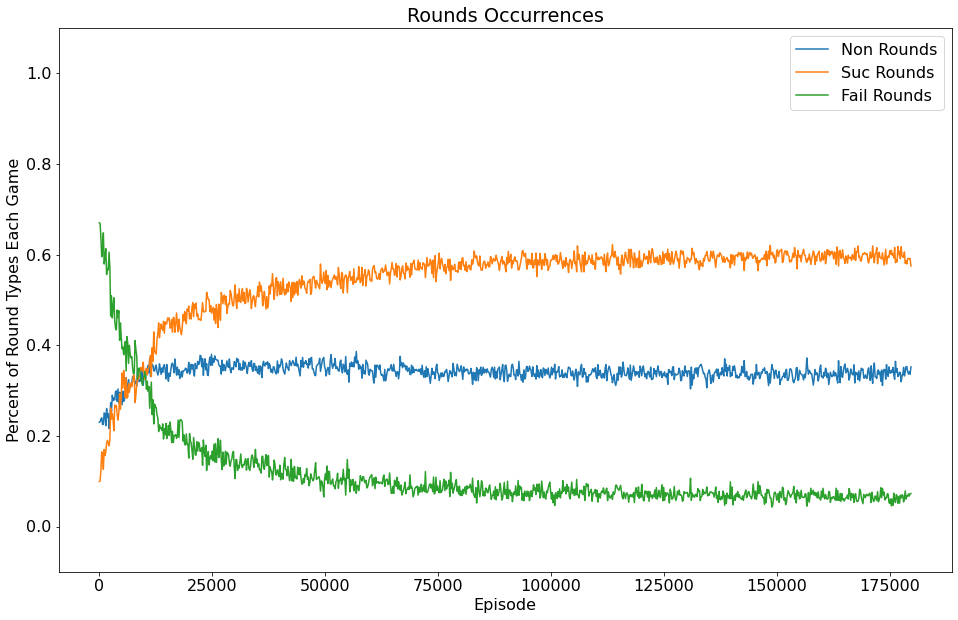

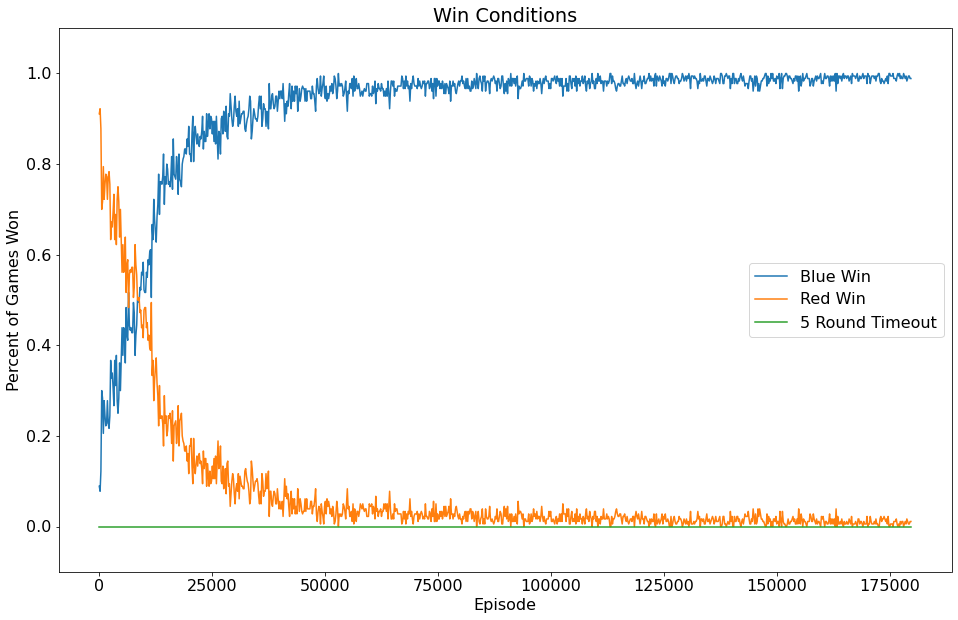

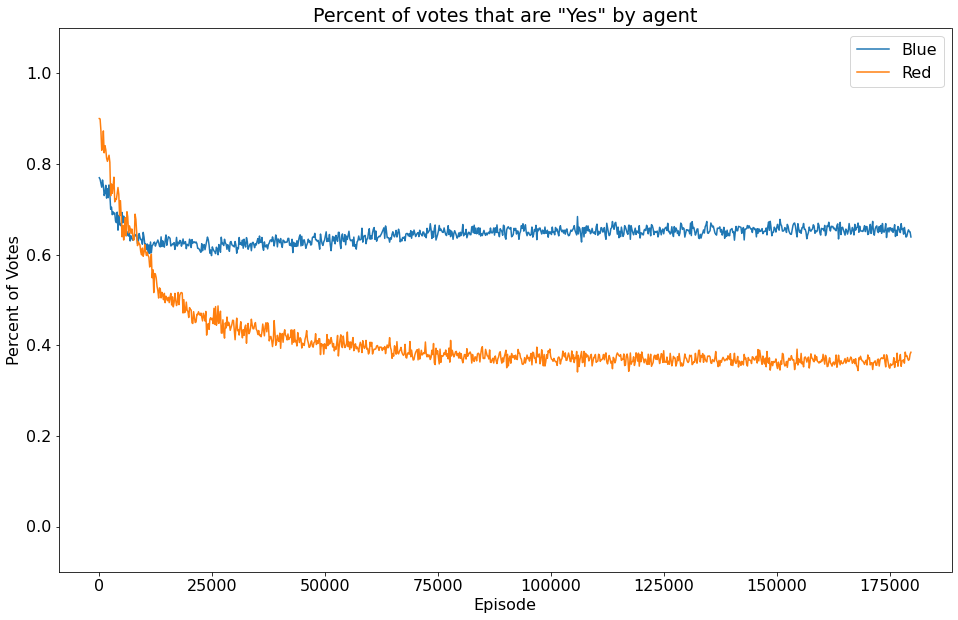

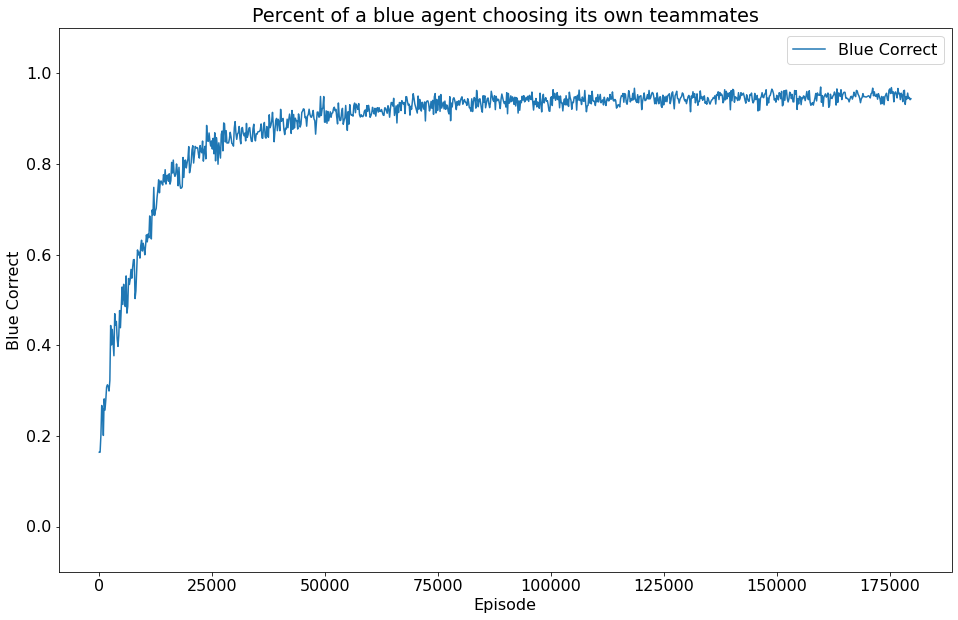

epoch 361 - loss = 0.1236673891544342, last - 6.9738621277792845e-06
epoch 362 - loss = 0.12515276670455933, last - 1.3983723874844145e-05
epoch 363 - loss = 0.1268680989742279, last - 5.412152859207708e-06
epoch 364 - loss = 0.12139657884836197, last - 1.9622639229055494e-05
epoch 365 - loss = 0.12857942283153534, last - 2.4080345610855147e-06
epoch 366 - loss = 0.12684783339500427, last - 4.50614652436343e-06
epoch 367 - loss = 0.12323994189500809, last - 5.0664252739807125e-06
epoch 368 - loss = 0.12494225800037384, last - 3.3021151466527954e-06
epoch 369 - loss = 0.12237844616174698, last - 7.236113106046105e-06
epoch 370 - loss = 0.12657521665096283, last - 1.0597972504911013e-05
epoch 371 - loss = 0.12656335532665253, last - 1.0848059446288971e-06
epoch 372 - loss = 0.12596333026885986, last - 3.906651909346692e-05
epoch 373 - loss = 0.125572070479393, last - 7.867821523177554e-07
epoch 374 - loss = 0.12288185209035873, last - 4.2048824980156496e-05
epoch 375 - loss = 0.125374048

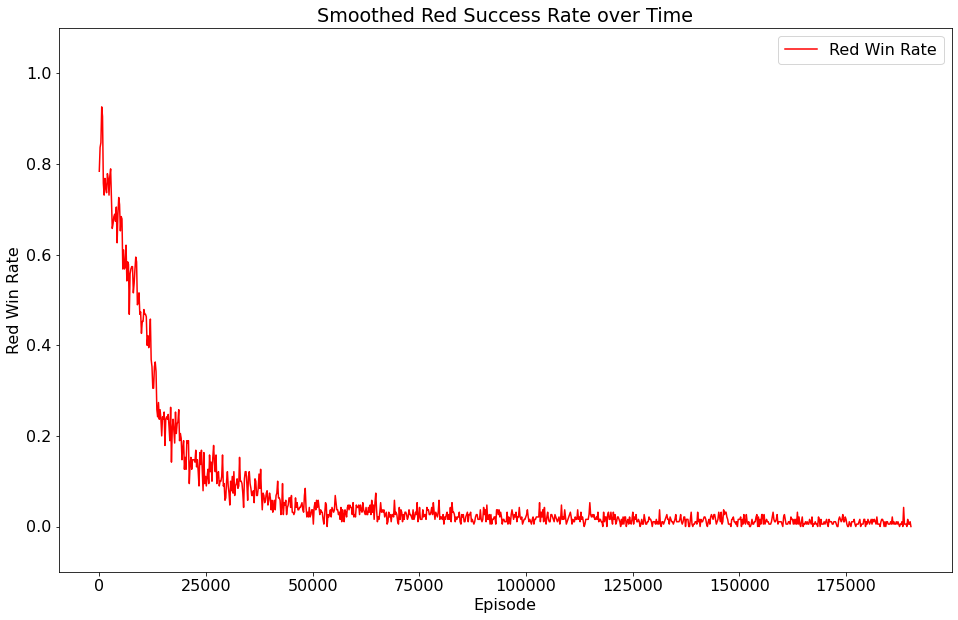

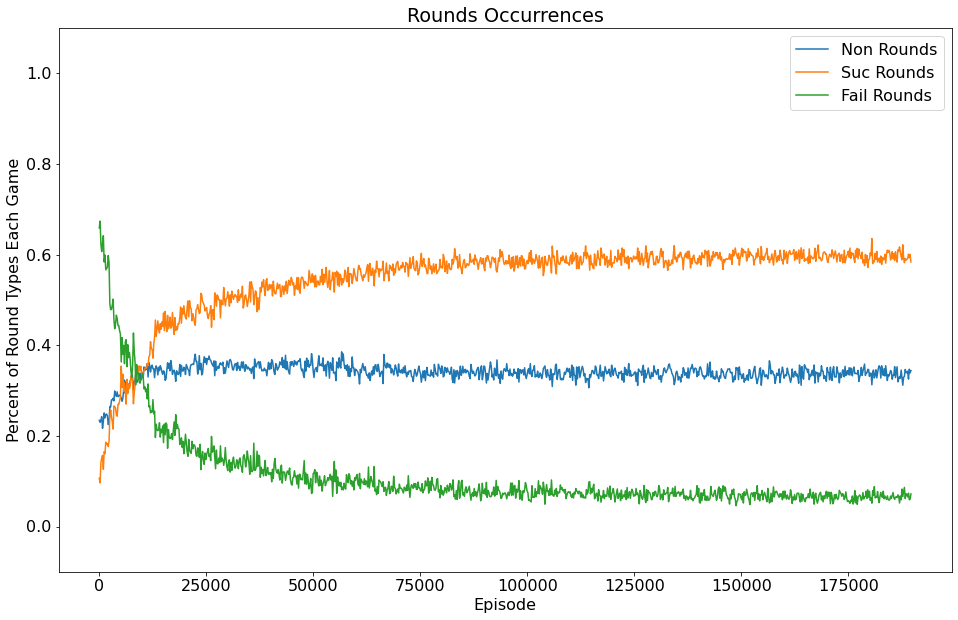

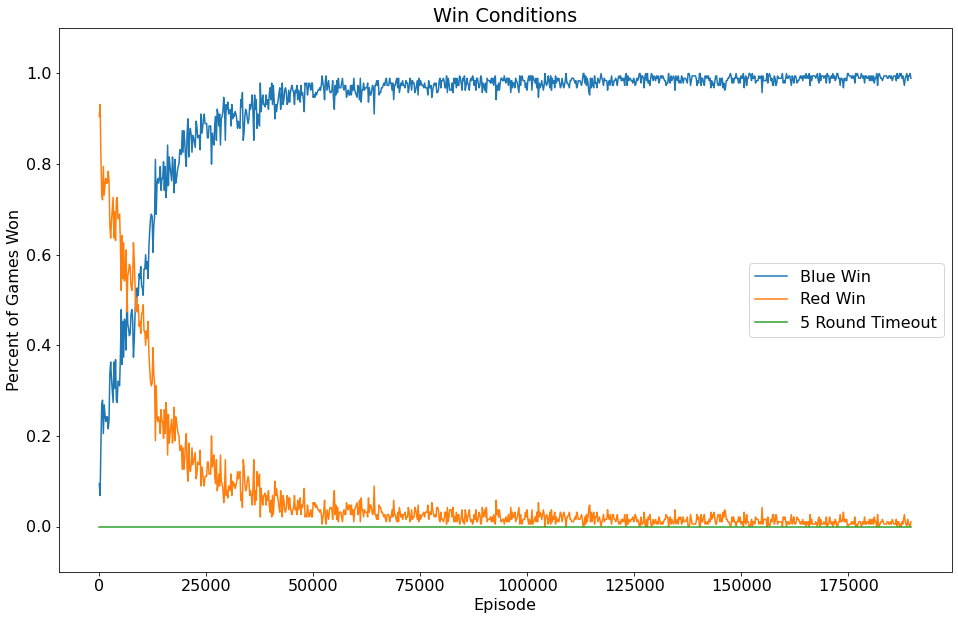

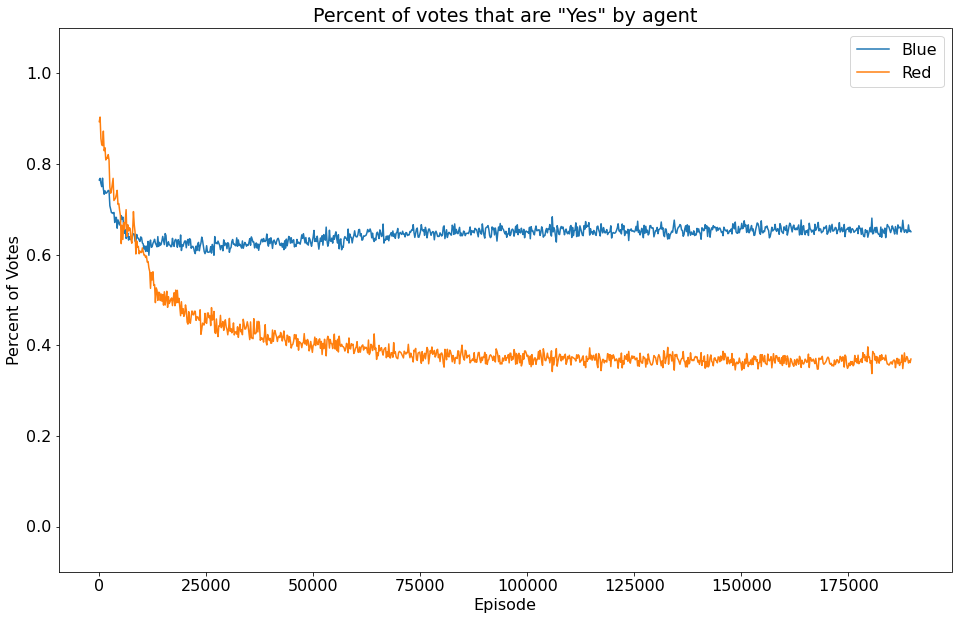

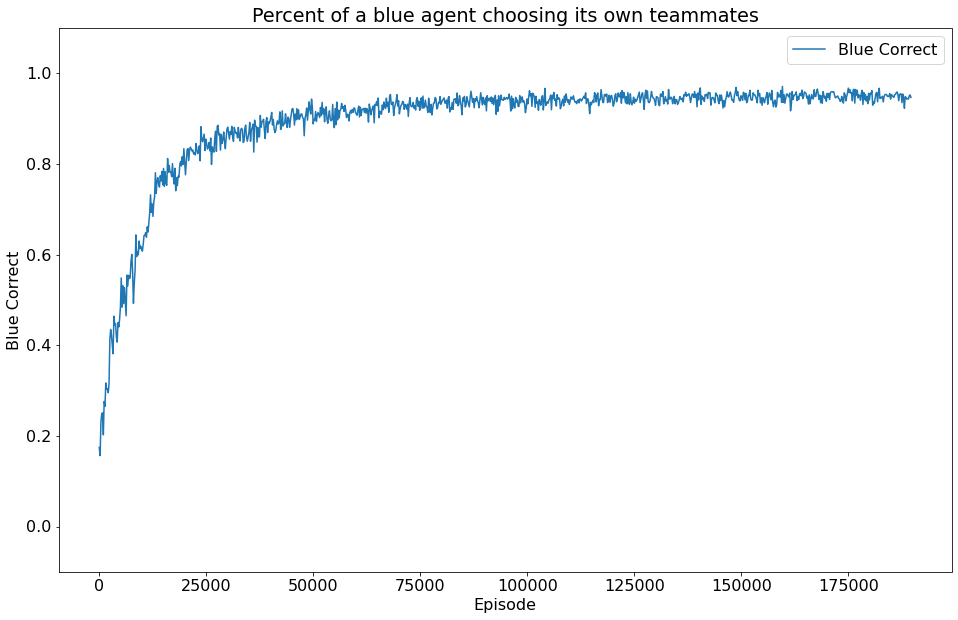

epoch 381 - loss = 0.12396659702062607, last - 4.291538573397702e-07
epoch 382 - loss = 0.1232527494430542, last - 1.3280344319355208e-05
epoch 383 - loss = 0.12418818473815918, last - 2.7455456802272238e-05
epoch 384 - loss = 0.12434221059083939, last - 4.621067637344822e-05
epoch 385 - loss = 0.12299740314483643, last - 3.1914776627672836e-05
epoch 386 - loss = 0.12481308728456497, last - 5.7101842685369775e-06
epoch 387 - loss = 0.12348255515098572, last - 1.5628893379471265e-05
epoch 388 - loss = 0.12477222084999084, last - 1.1920963061129441e-06
epoch 389 - loss = 0.12068011611700058, last - 6.294301329035079e-06
epoch 390 - loss = 0.12341552972793579, last - 2.89679383058683e-06
epoch 391 - loss = 0.12031998485326767, last - 1.6689366475475254e-06
epoch 392 - loss = 0.12584008276462555, last - 1.0562126590230037e-05
epoch 393 - loss = 0.12440043687820435, last - 1.657014081501984e-06
epoch 394 - loss = 0.11840116232633591, last - 9.477360435994342e-06
epoch 395 - loss = 0.1332578

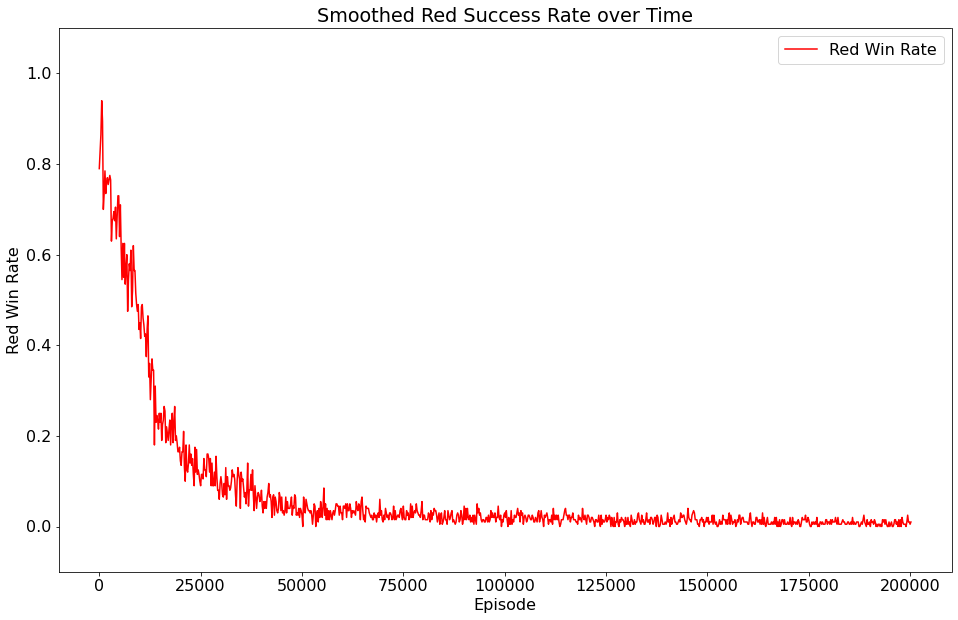

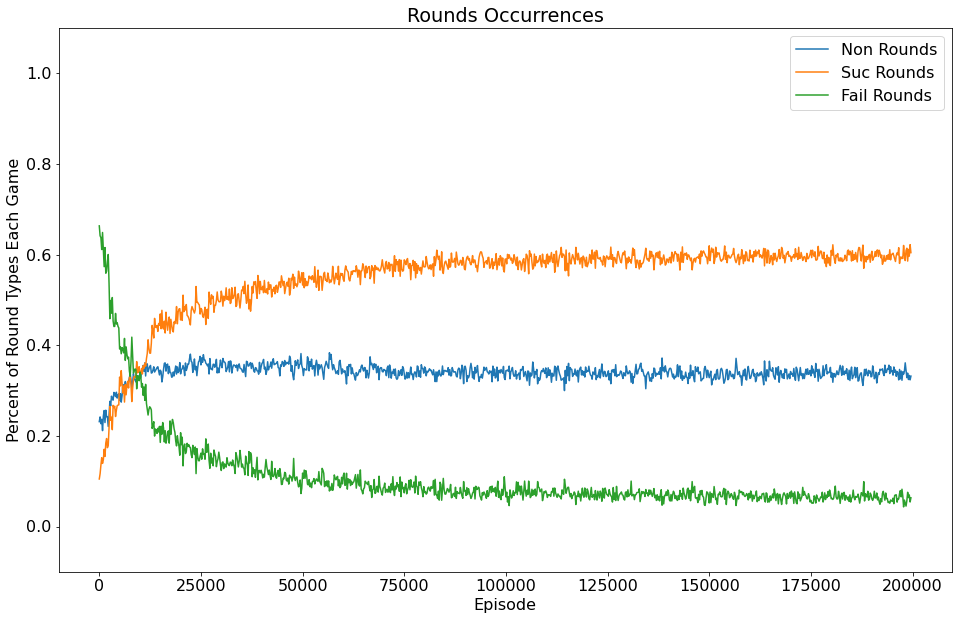

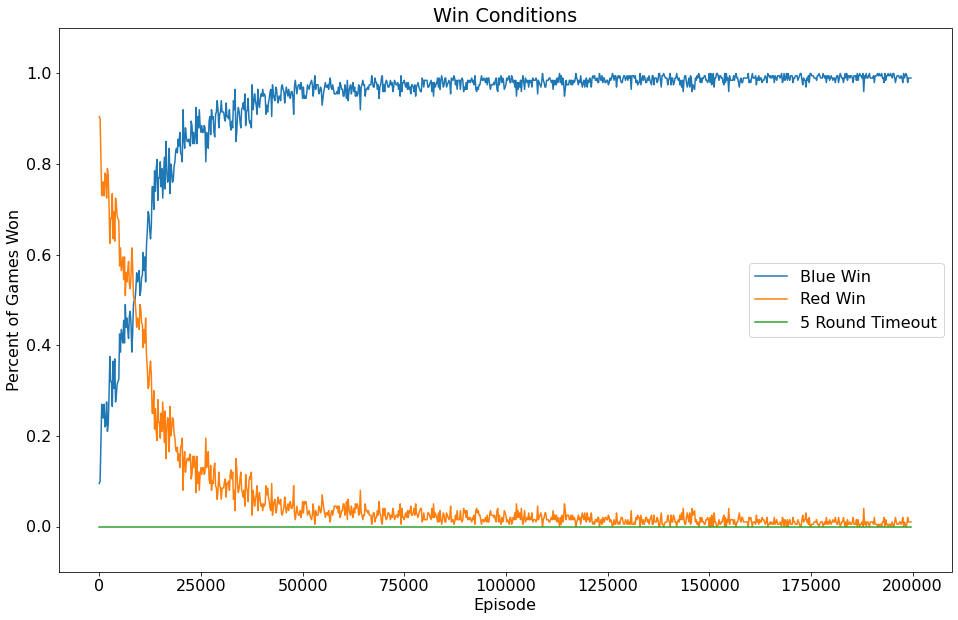

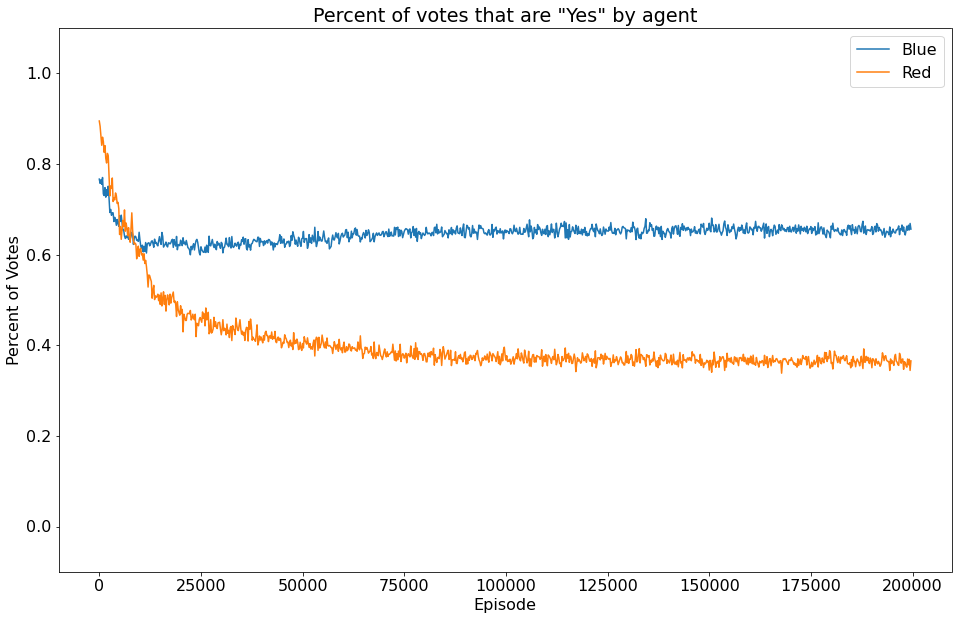

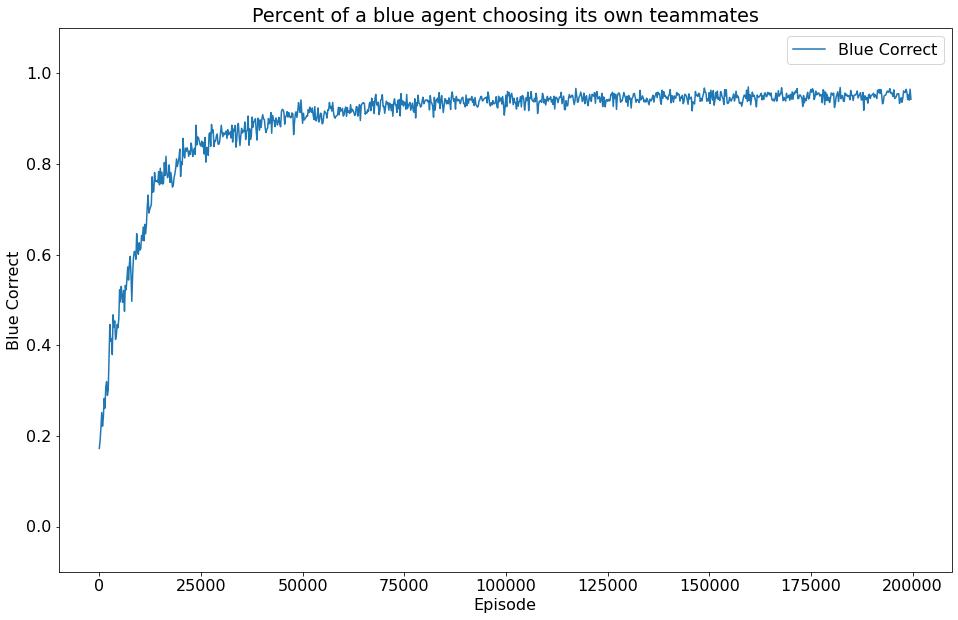

epoch 401 - loss = 0.12281527370214462, last - 0.00042474427027627826
epoch 402 - loss = 0.11706938594579697, last - 3.8555834180442616e-05
epoch 403 - loss = 0.12053007632493973, last - 1.0490429076526198e-06
epoch 404 - loss = 0.12238771468400955, last - 6.592381396330893e-06
epoch 405 - loss = 0.12080465257167816, last - 1.287488248635782e-05
epoch 406 - loss = 0.11823377013206482, last - 1.800066456780769e-06
epoch 407 - loss = 0.12601912021636963, last - 1.1551713214430492e-05
epoch 408 - loss = 0.12315917760133743, last - 4.4350734242470935e-05
epoch 409 - loss = 0.12325836718082428, last - 3.886245394824073e-06
epoch 410 - loss = 0.1177666112780571, last - 2.074293661280535e-05
epoch 411 - loss = 0.12916256487369537, last - 5.853215952811297e-06
epoch 412 - loss = 0.12295754998922348, last - 6.473122539318865e-06
epoch 413 - loss = 0.1254330426454544, last - 2.5630088202888146e-06
epoch 414 - loss = 0.12218169867992401, last - 1.4174361240293365e-05
epoch 415 - loss = 0.12117777

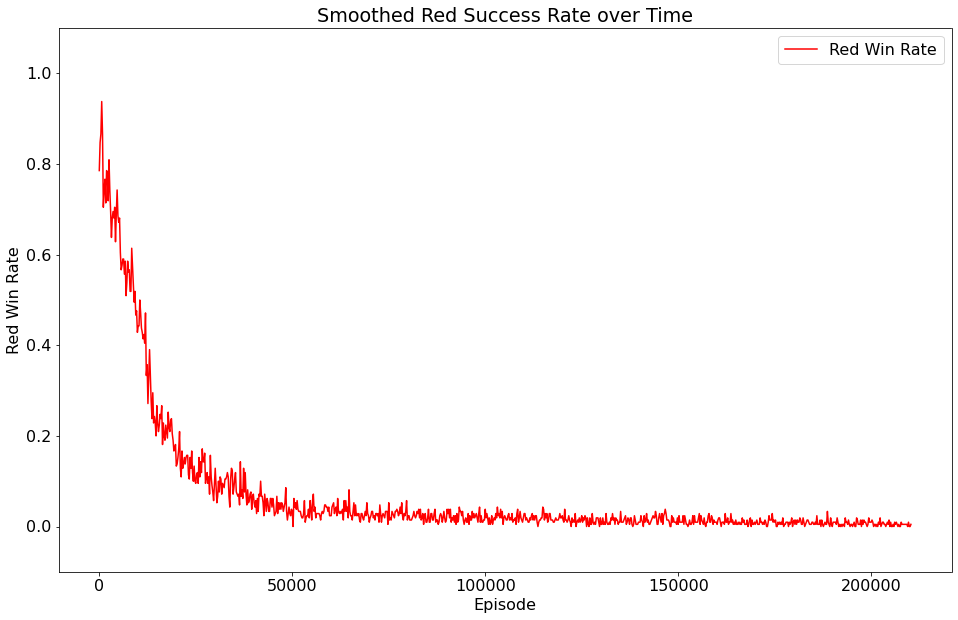

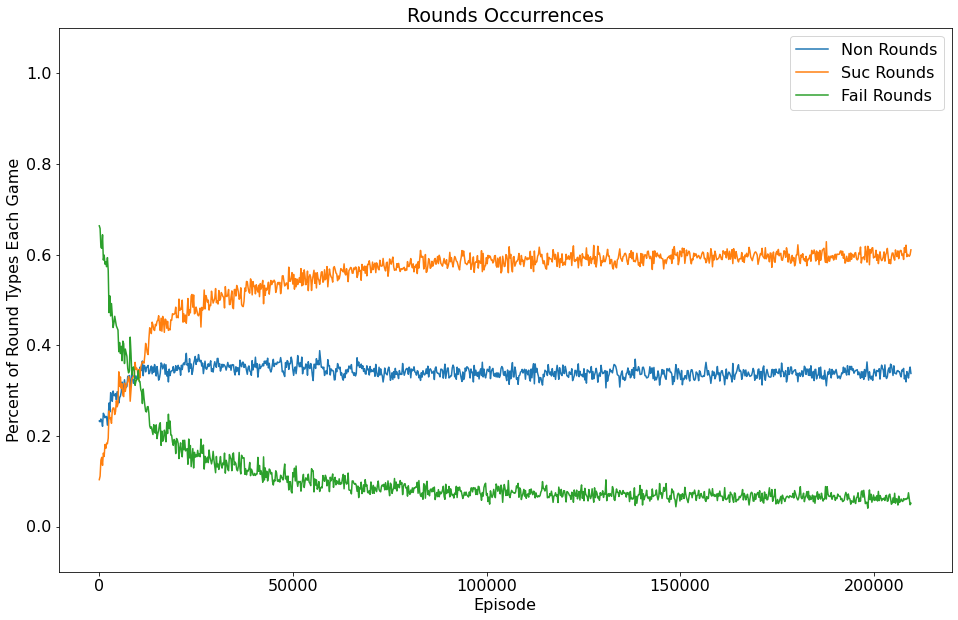

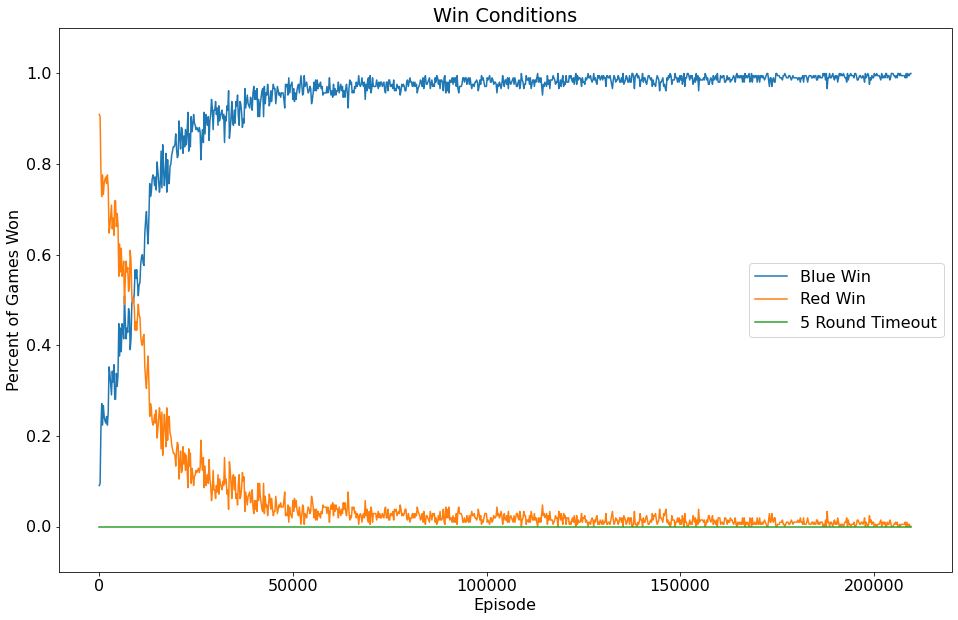

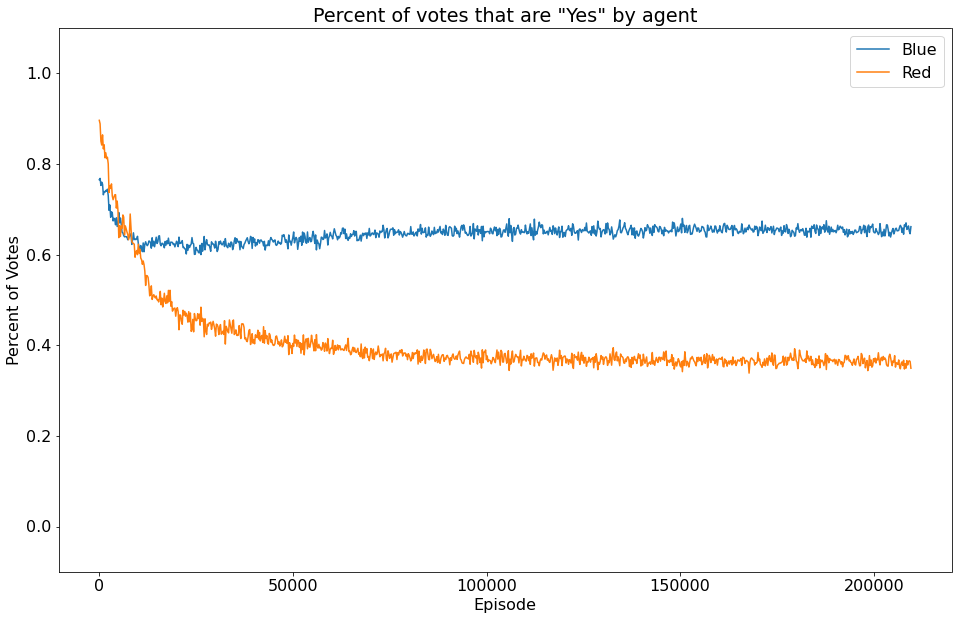

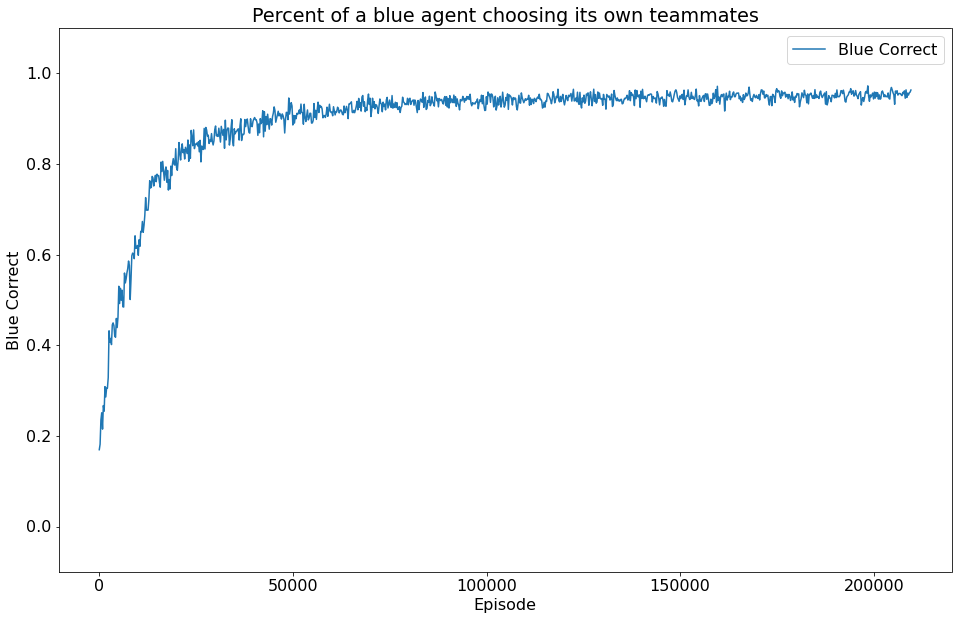

epoch 421 - loss = 0.12134120613336563, last - 4.649165816772438e-07
epoch 422 - loss = 0.1237034946680069, last - 7.169217860791832e-05
epoch 423 - loss = 0.1211775466799736, last - 0.0002575918042566627
epoch 424 - loss = 0.12135692685842514, last - 4.973807881469838e-05
epoch 425 - loss = 0.12065031379461288, last - 0.00011416755296522751
epoch 426 - loss = 0.12515170872211456, last - 9.05992521893495e-07
epoch 427 - loss = 0.12337195873260498, last - 6.348769966280088e-05
epoch 428 - loss = 0.11820853501558304, last - 1.788139627478813e-07
epoch 429 - loss = 0.12195437401533127, last - 1.5878995327511802e-05
epoch 430 - loss = 0.1191156804561615, last - 1.478199806115299e-06
epoch 431 - loss = 0.11905555427074432, last - 3.96885588997975e-05
epoch 432 - loss = 0.12638358771800995, last - 3.337861755881022e-07
epoch 433 - loss = 0.1213720366358757, last - 4.0531190848014376e-07
epoch 434 - loss = 0.11490524560213089, last - 2.431882649034378e-06
epoch 435 - loss = 0.1273267120122909

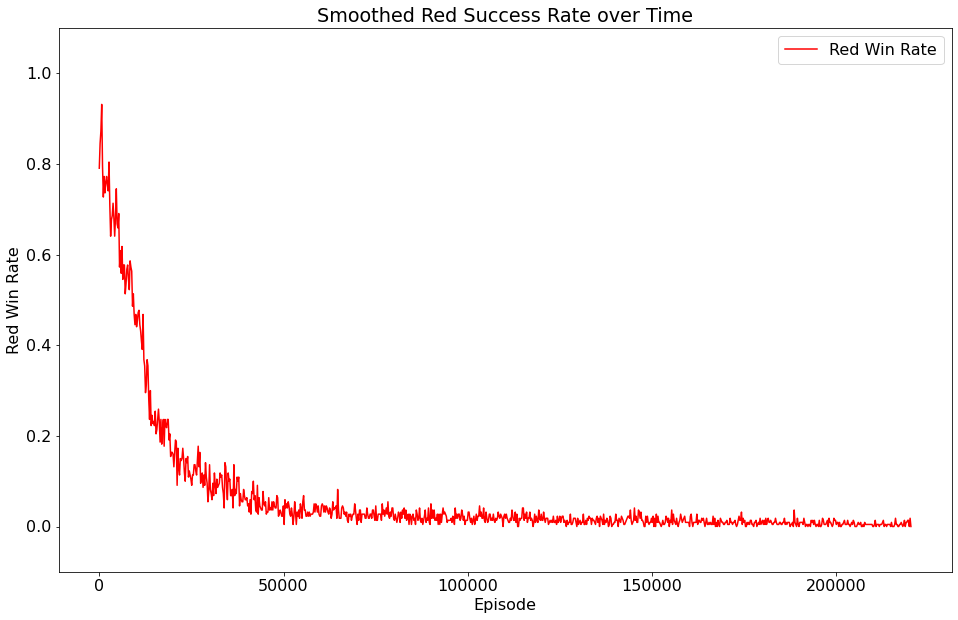

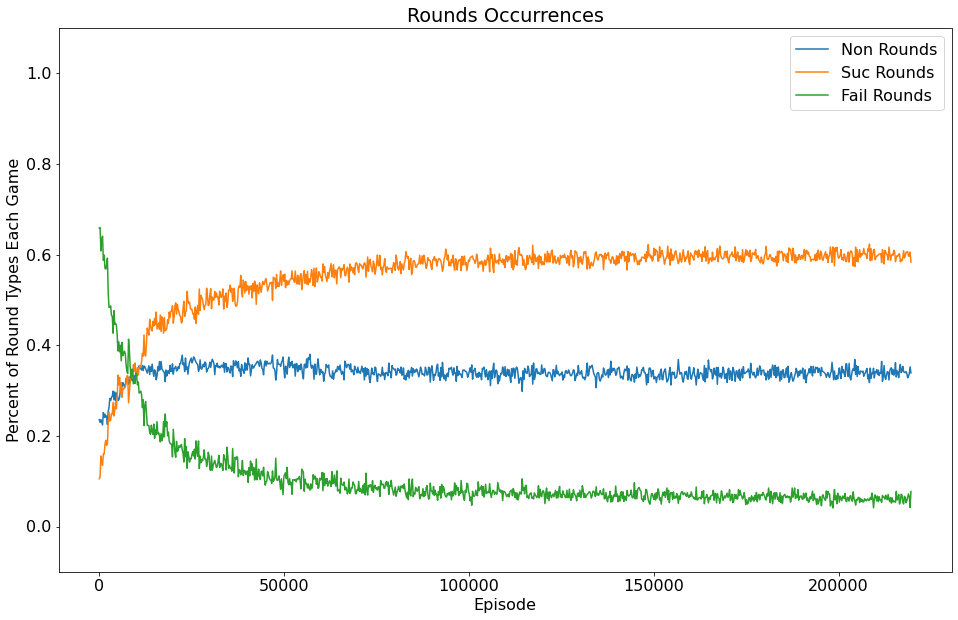

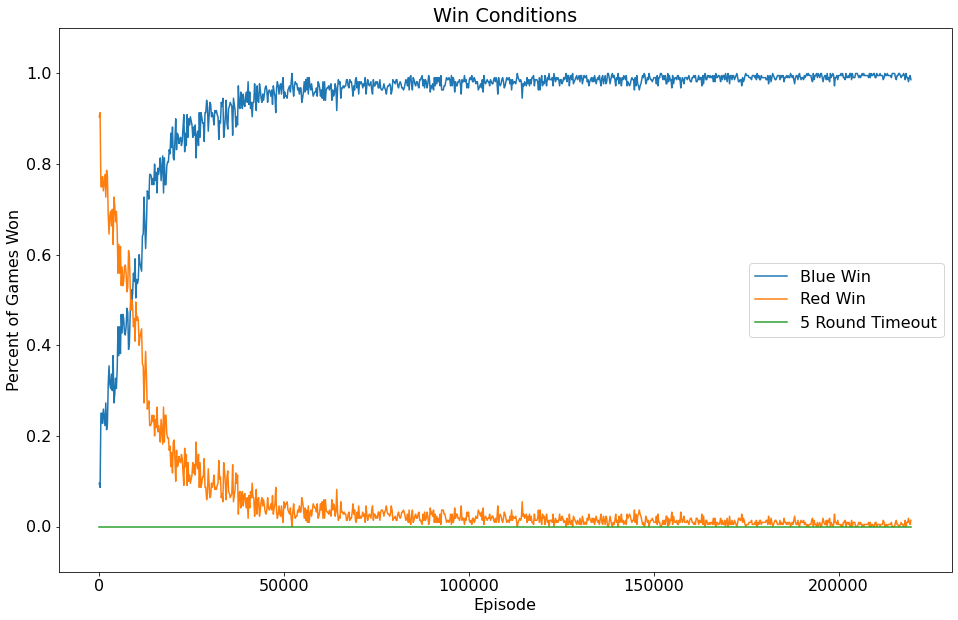

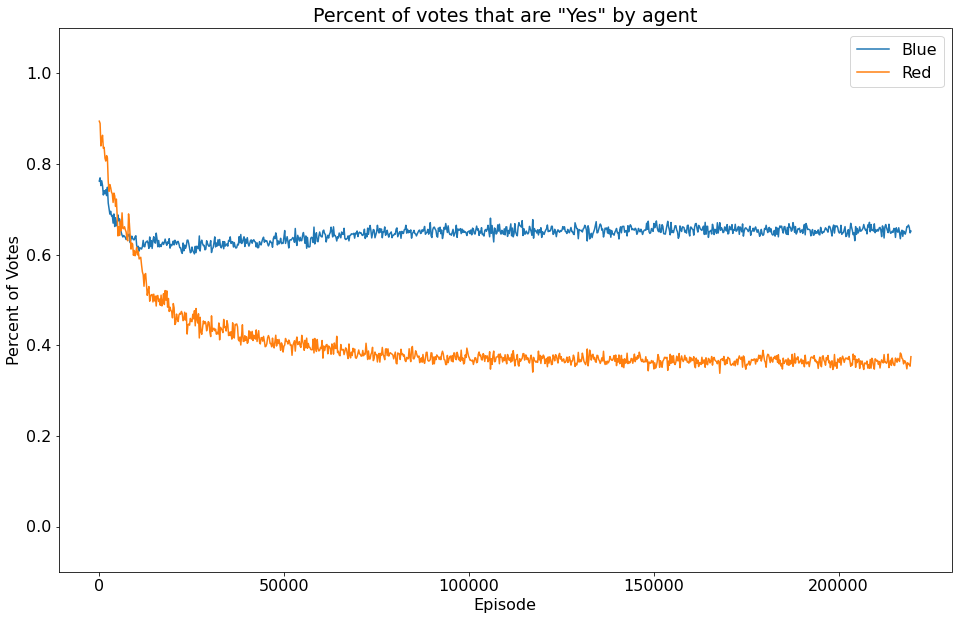

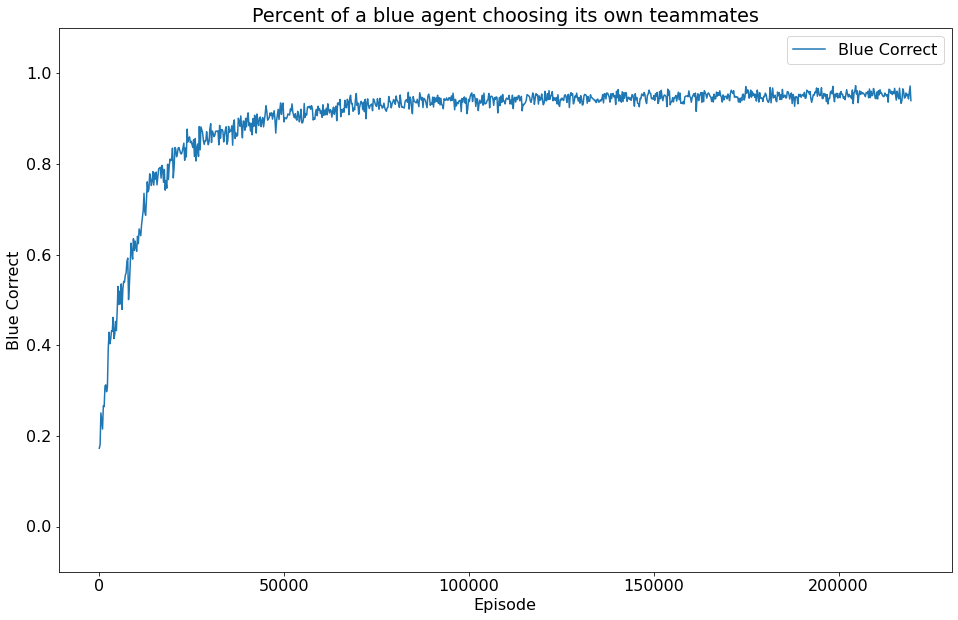

epoch 441 - loss = 0.12100561708211899, last - 2.1457681498304737e-07
epoch 442 - loss = 0.12343607097864151, last - 7.867826070651063e-07
epoch 443 - loss = 0.11588410288095474, last - 3.2425036806671415e-06
epoch 444 - loss = 0.1257319450378418, last - 3.3021074159478303e-06
epoch 445 - loss = 0.12274812906980515, last - 3.898172963090474e-06
epoch 446 - loss = 0.11832478642463684, last - 1.072883719643869e-07
epoch 447 - loss = 0.11992854624986649, last - 7.259947778948117e-06
epoch 448 - loss = 0.12335628271102905, last - 3.254432613175595e-06
epoch 449 - loss = 0.11685214191675186, last - 1.513960569354822e-06
epoch 450 - loss = 0.12268294394016266, last - 3.0994439725873235e-07
epoch 451 - loss = 0.11992068588733673, last - 4.291538857614796e-07
epoch 452 - loss = 0.1211814284324646, last - 2.0767034584423527e-05
epoch 453 - loss = 0.12037964910268784, last - 1.1920931797249068e-07
epoch 454 - loss = 0.11772794276475906, last - 2.350922477489803e-05
epoch 455 - loss = 0.121613413

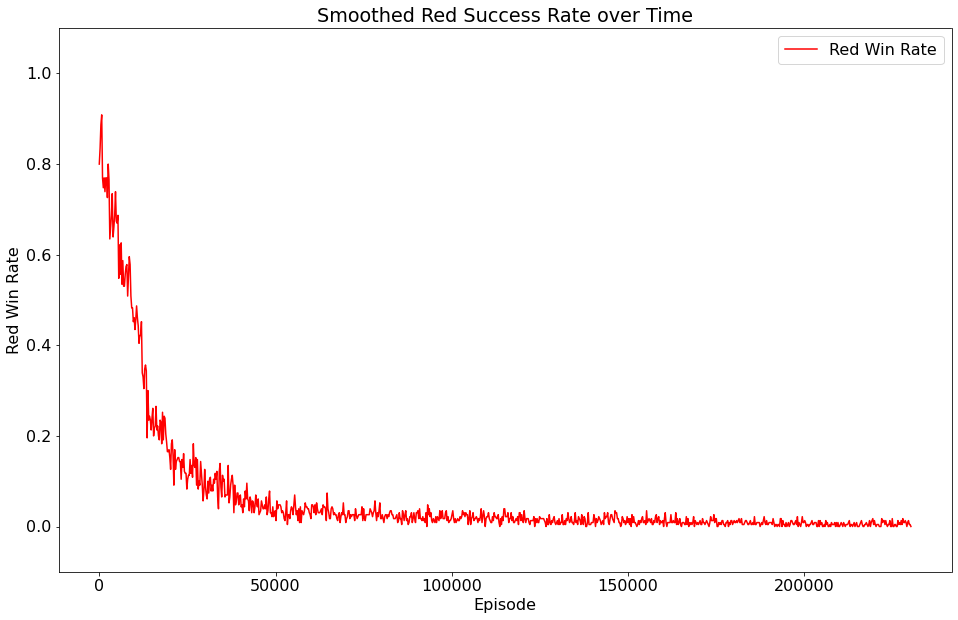

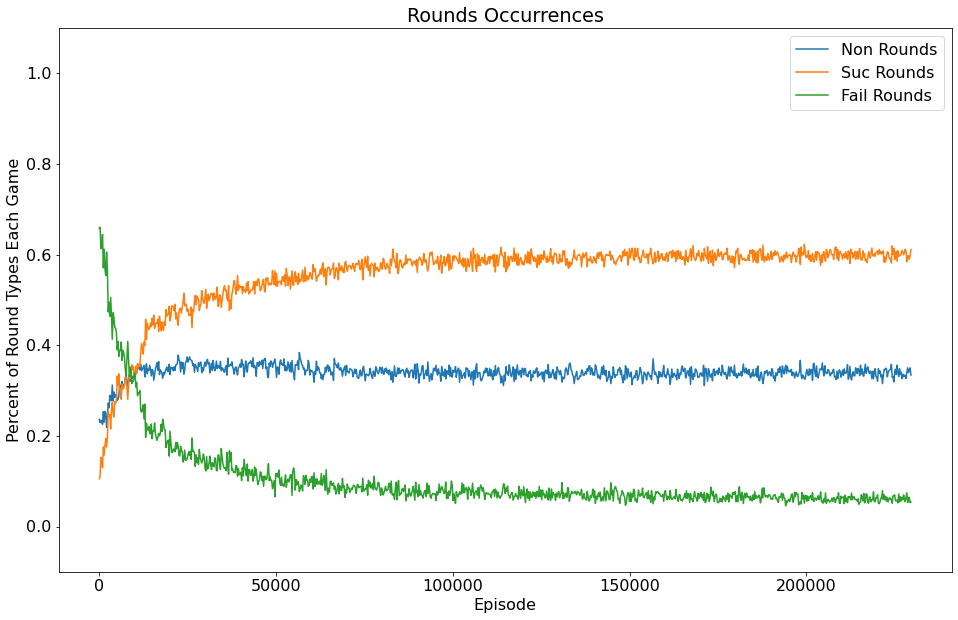

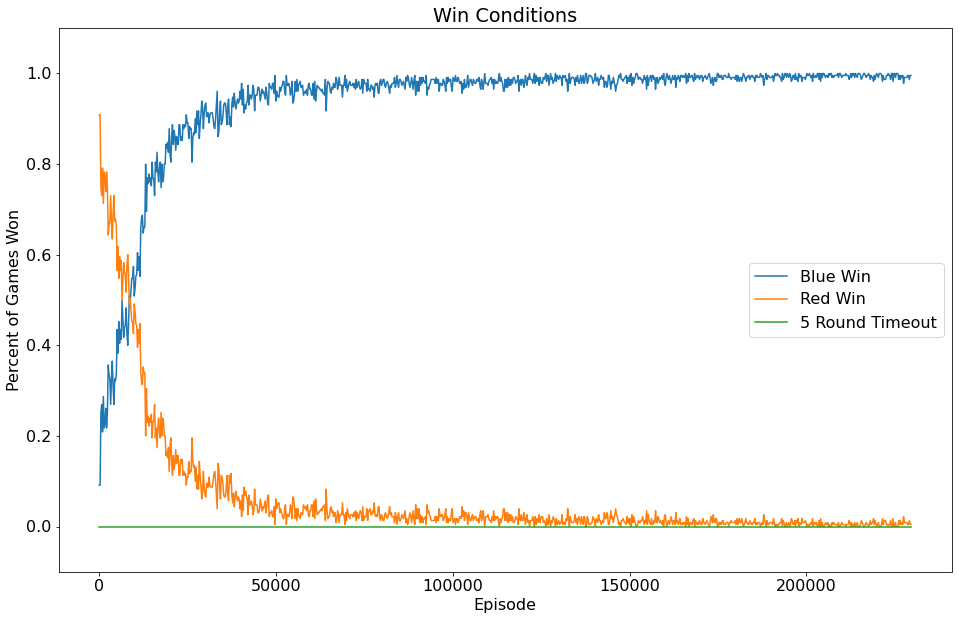

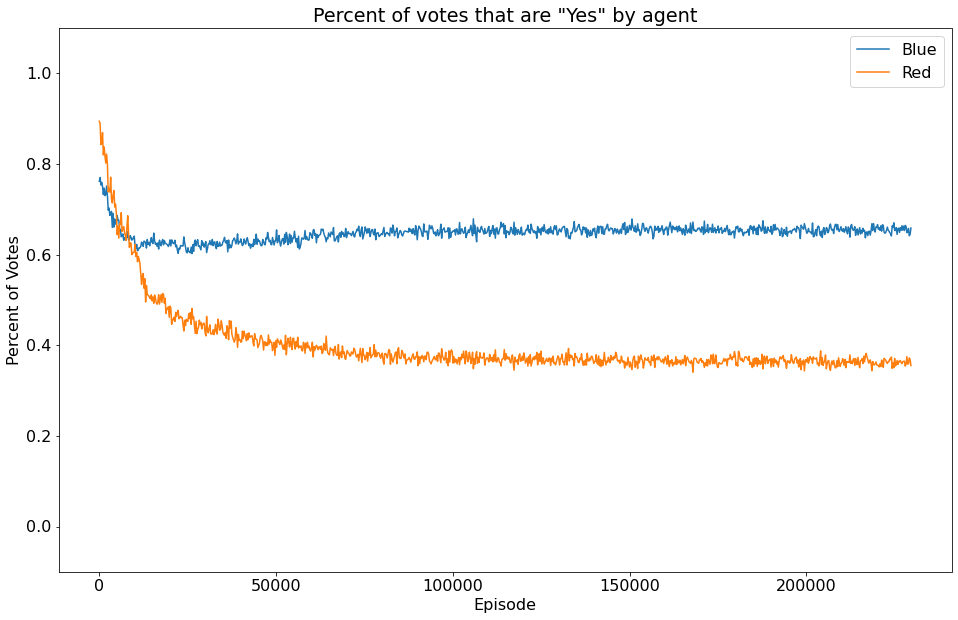

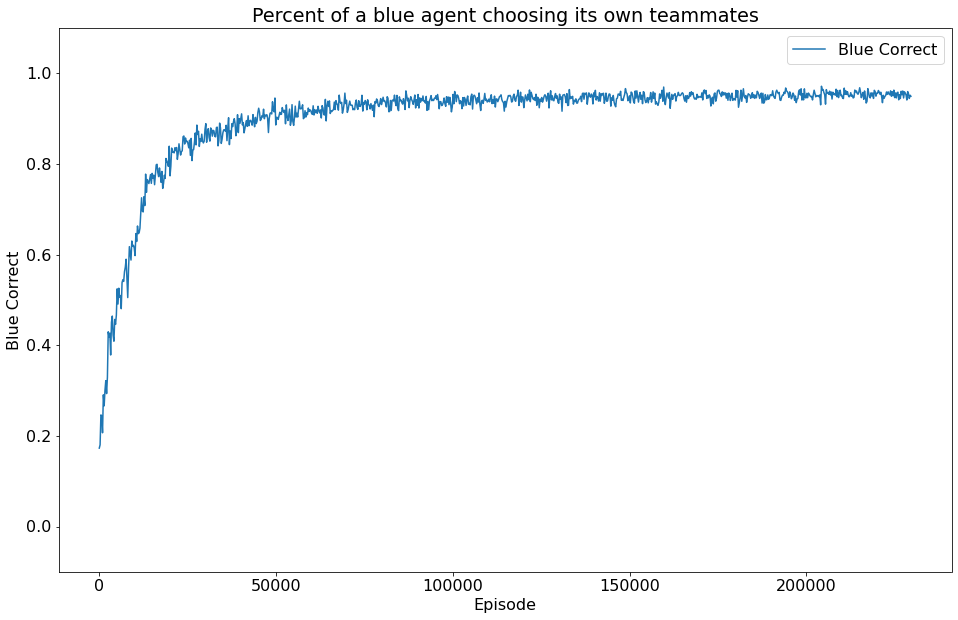

epoch 461 - loss = 0.12217295169830322, last - 2.741814455475833e-07
epoch 462 - loss = 0.11871197819709778, last - 2.419960082988837e-06
epoch 463 - loss = 0.11694098263978958, last - 7.414940228045452e-06
epoch 464 - loss = 0.12295195460319519, last - 1.4245686543290503e-05
epoch 465 - loss = 0.12242704629898071, last - 8.583082262703101e-07
epoch 466 - loss = 0.12626567482948303, last - 0.0
epoch 467 - loss = 0.12770260870456696, last - 8.595174222136848e-06
epoch 468 - loss = 0.11726877838373184, last - 2.3032142053125426e-05
epoch 469 - loss = 0.12271659821271896, last - 5.507532932824688e-06
epoch 470 - loss = 0.11692369729280472, last - 5.051408152212389e-05
epoch 471 - loss = 0.12703494727611542, last - 3.5405453218118055e-06
epoch 472 - loss = 0.11840875446796417, last - 3.8146998804222676e-07
epoch 473 - loss = 0.12651178240776062, last - 1.5616438986398862e-06
epoch 474 - loss = 0.12525777518749237, last - 0.00038413150468841195
epoch 475 - loss = 0.11909089982509613, last -

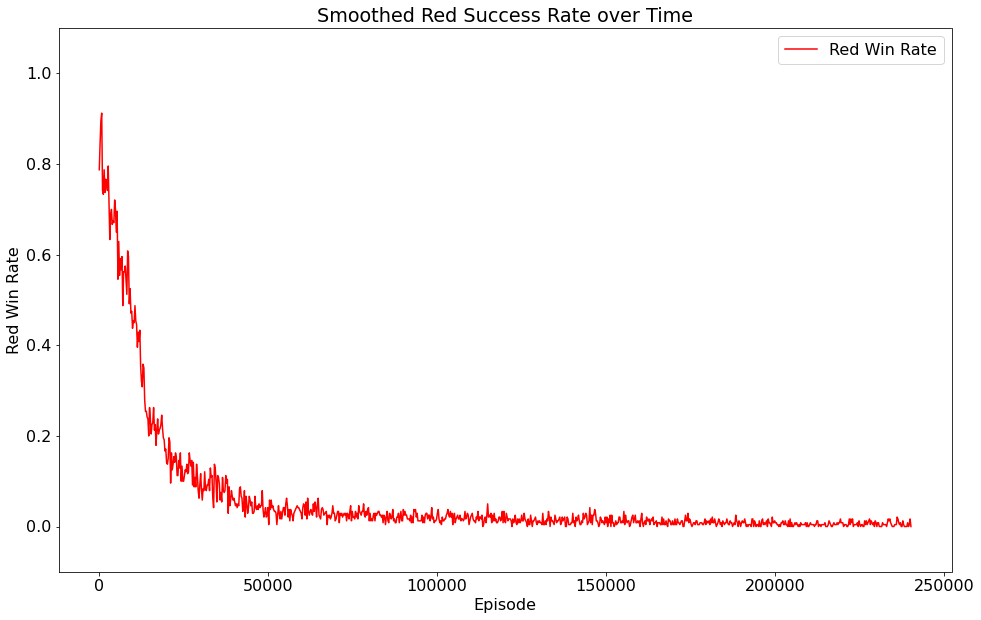

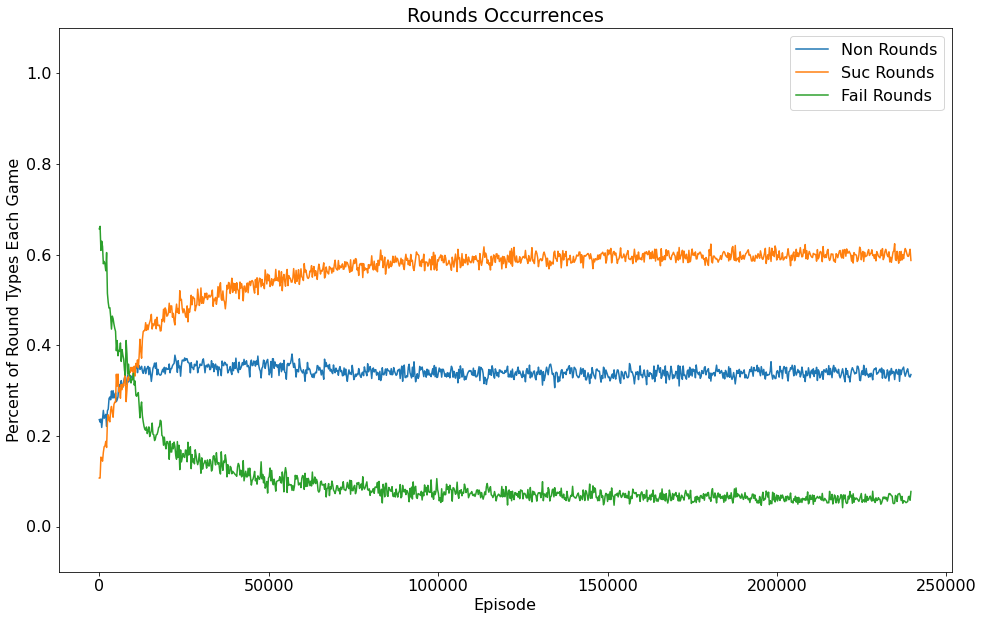

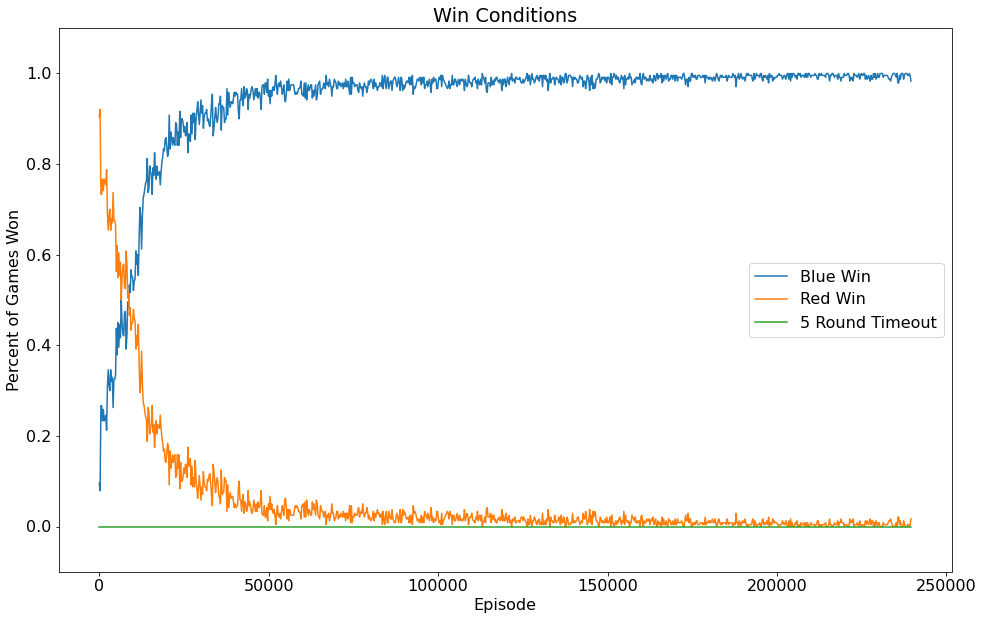

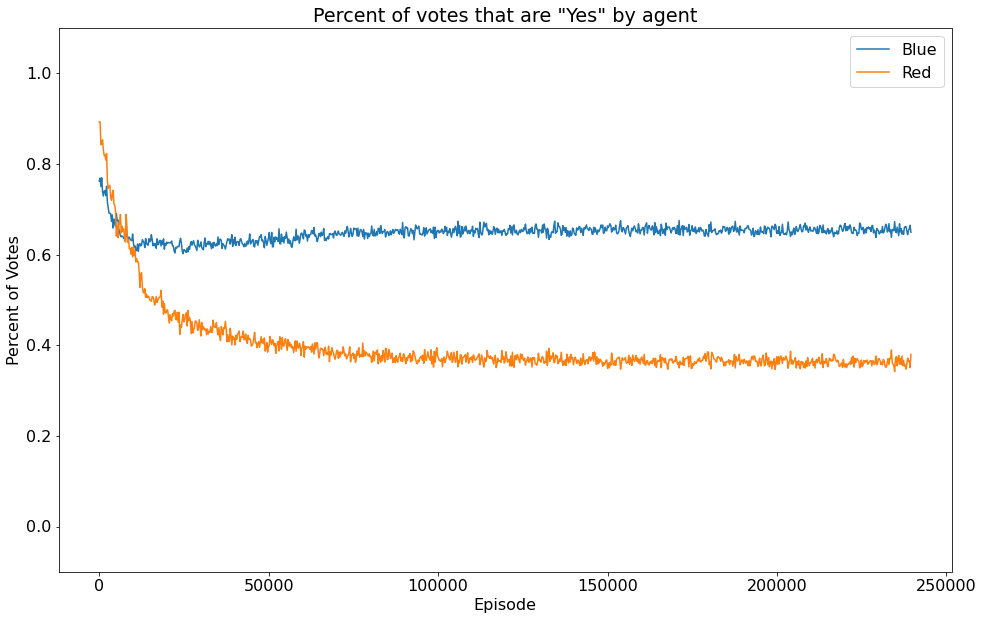

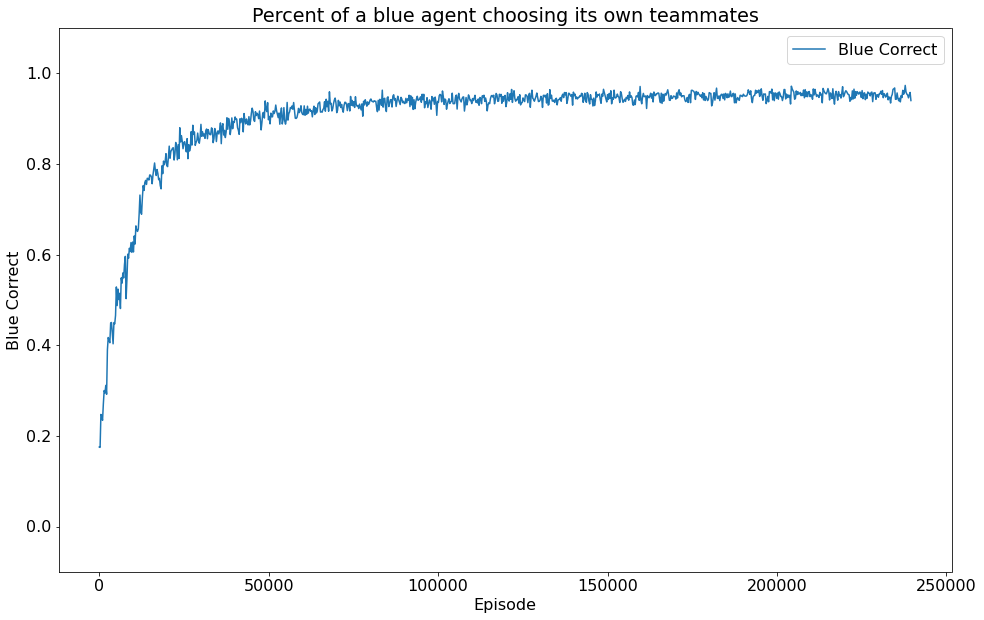

epoch 481 - loss = 0.12387366592884064, last - 7.510192290283157e-07
epoch 482 - loss = 0.11872314661741257, last - 1.1920949418708915e-06
epoch 483 - loss = 0.11922544986009598, last - 4.7683720083568915e-08
epoch 484 - loss = 0.1191292479634285, last - 8.106242717076384e-07
epoch 485 - loss = 0.11763883382081985, last - 7.152558367806705e-08
epoch 486 - loss = 0.1161445751786232, last - 1.430511673561341e-07
epoch 487 - loss = 0.11614962667226791, last - 2.3722764126432594e-06
epoch 488 - loss = 0.12183190137147903, last - 5.126002520228212e-07
epoch 489 - loss = 0.11856143921613693, last - 6.781353295082226e-05
epoch 490 - loss = 0.12002517282962799, last - 2.5749316137080314e-06
epoch 491 - loss = 0.120326466858387, last - 9.274662261304911e-06
epoch 492 - loss = 0.1148863136768341, last - 2.6226052796118893e-07
epoch 493 - loss = 0.11722908169031143, last - 5.295682785799727e-05
epoch 494 - loss = 0.12033085525035858, last - 3.61207139576436e-06
epoch 495 - loss = 0.12446837872266

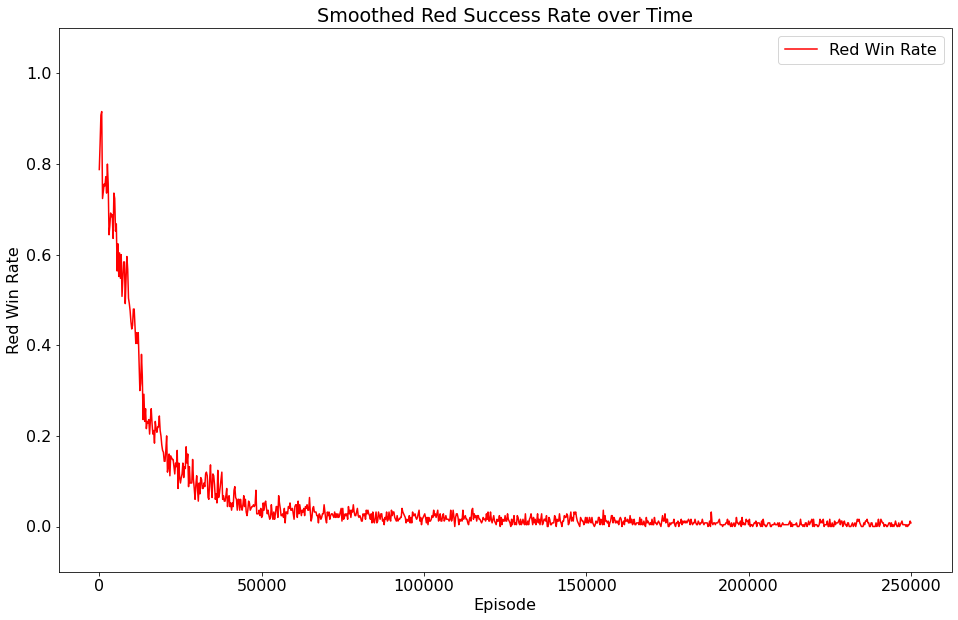

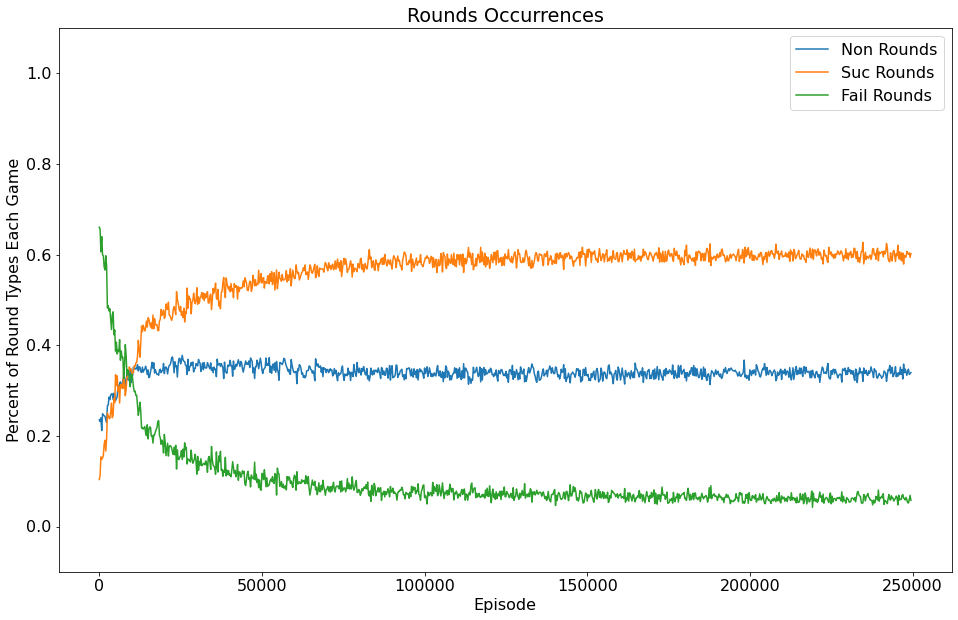

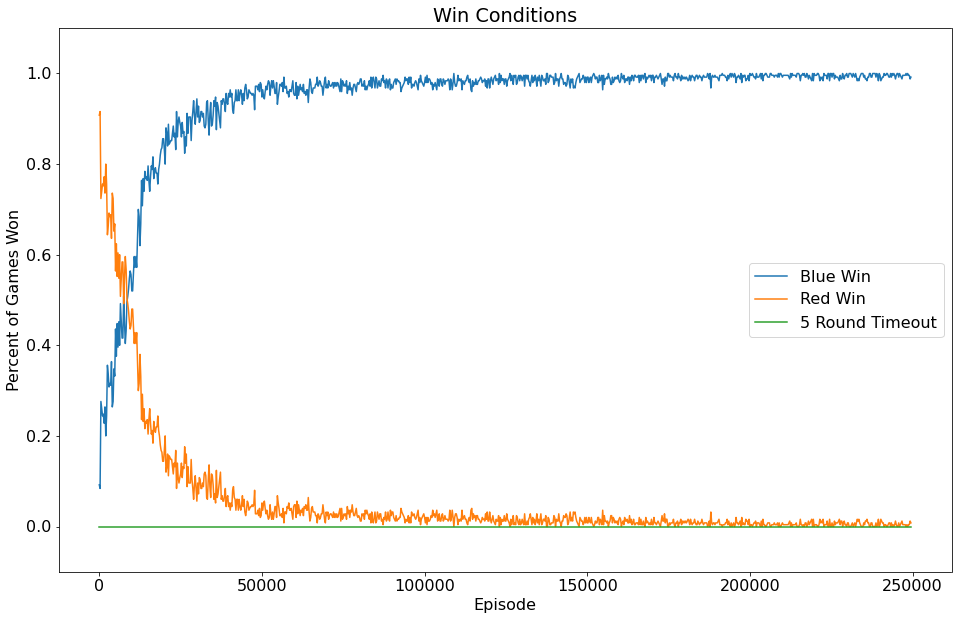

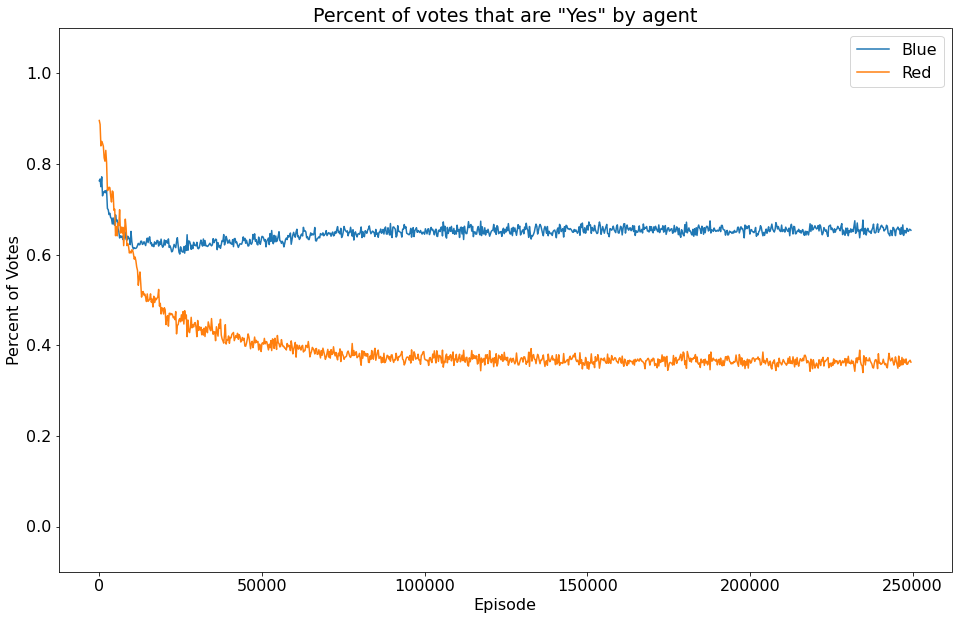

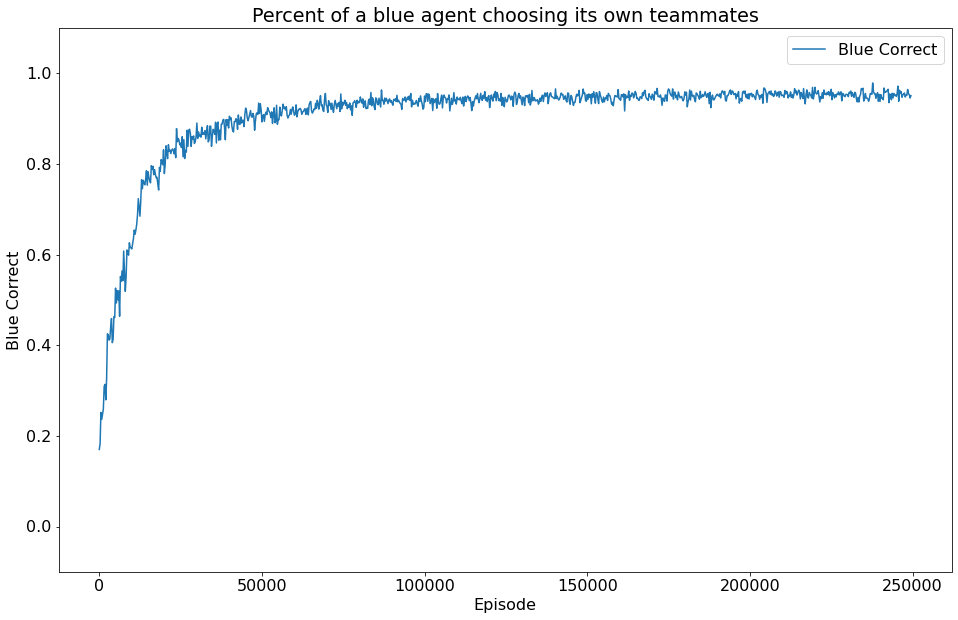

epoch 501 - loss = 0.12353856861591339, last - 1.6689304516148695e-07
epoch 502 - loss = 0.11842136830091476, last - 9.151978883892298e-05
epoch 503 - loss = 0.12219034135341644, last - 3.337860903229739e-07
epoch 504 - loss = 0.11890742182731628, last - 7.0453570515383035e-06
epoch 505 - loss = 0.11903098225593567, last - 0.0001226579915964976
epoch 506 - loss = 0.1166045144200325, last - 1.2755432408084744e-06
epoch 507 - loss = 0.1208372712135315, last - 4.971077487425646e-06
epoch 508 - loss = 0.11535191535949707, last - 0.00019022342166863382
epoch 509 - loss = 0.11873561143875122, last - 4.208126028970582e-06
epoch 510 - loss = 0.11975474655628204, last - 6.91415039000276e-07
epoch 511 - loss = 0.12110556662082672, last - 2.8133565592725063e-06
epoch 512 - loss = 0.12097950279712677, last - 6.65194829707616e-06
epoch 513 - loss = 0.12295453250408173, last - 1.0967268053718726e-06
epoch 514 - loss = 0.11391720920801163, last - 1.907349087559851e-07
epoch 515 - loss = 0.11573354154

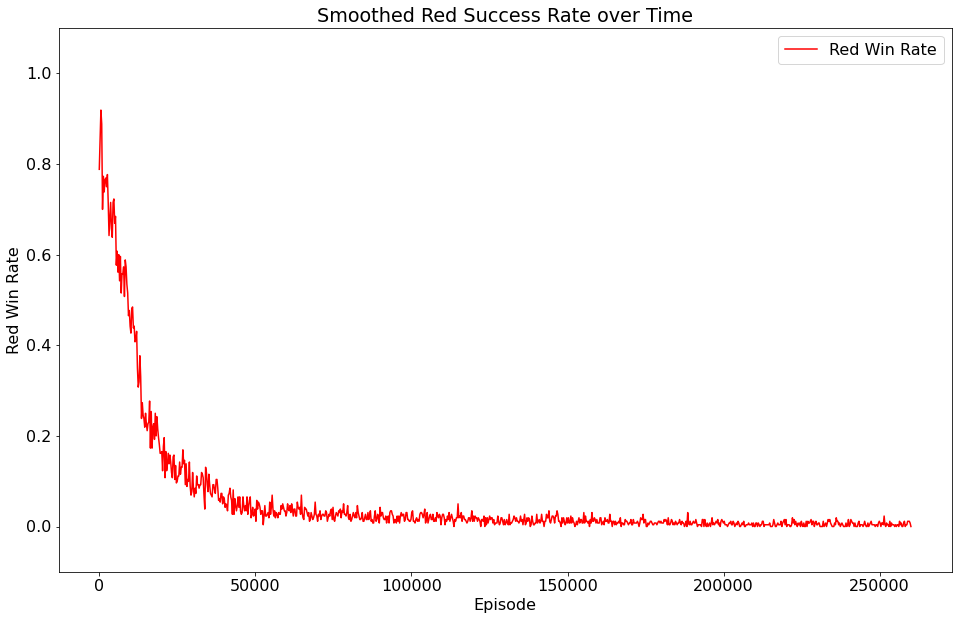

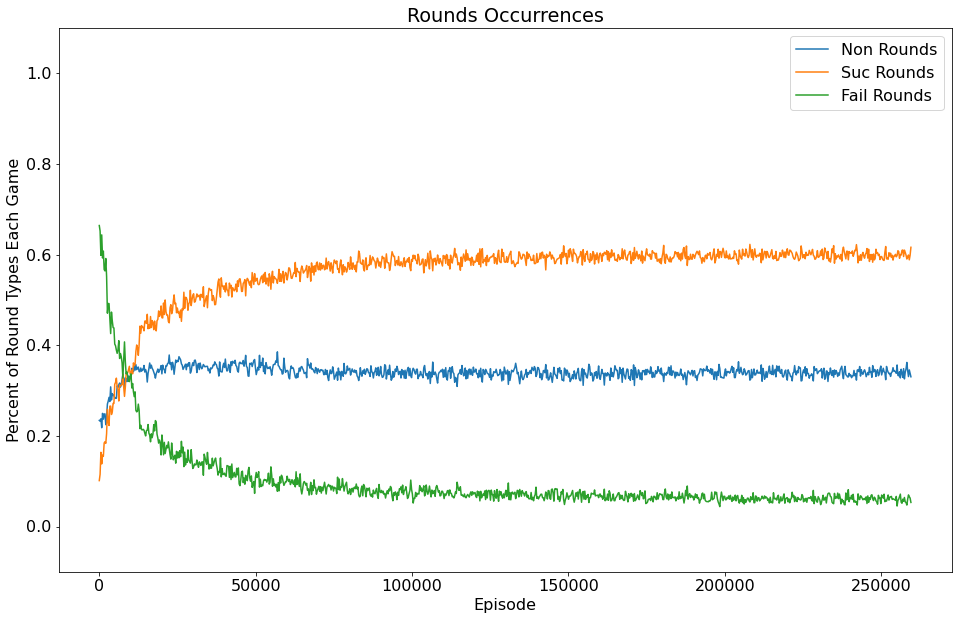

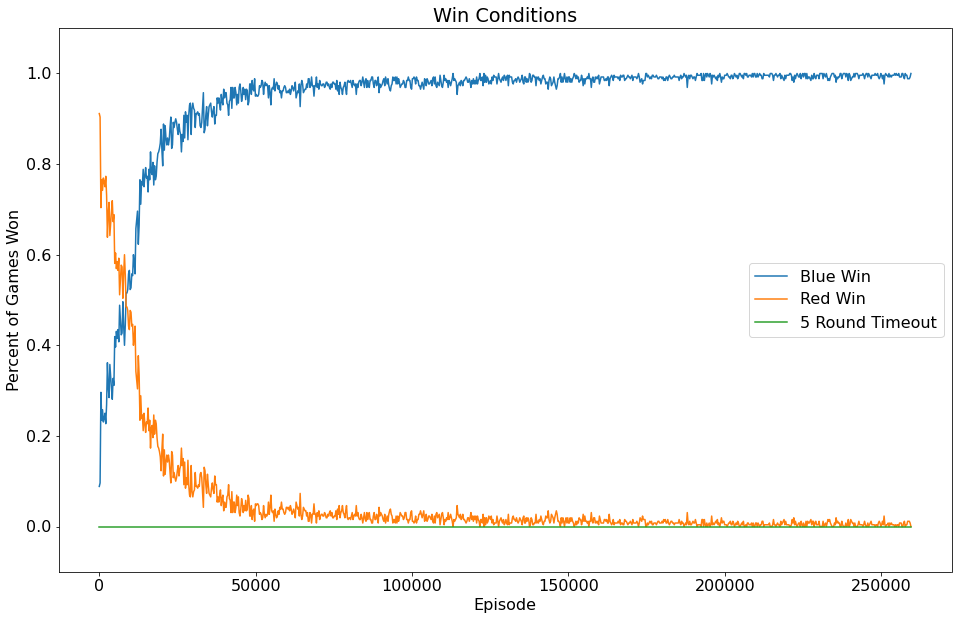

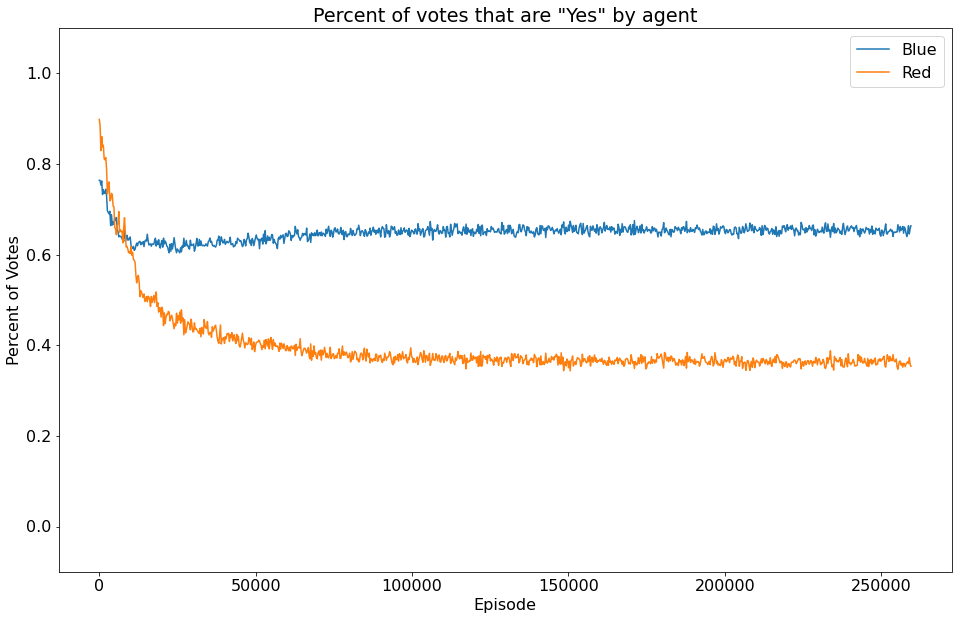

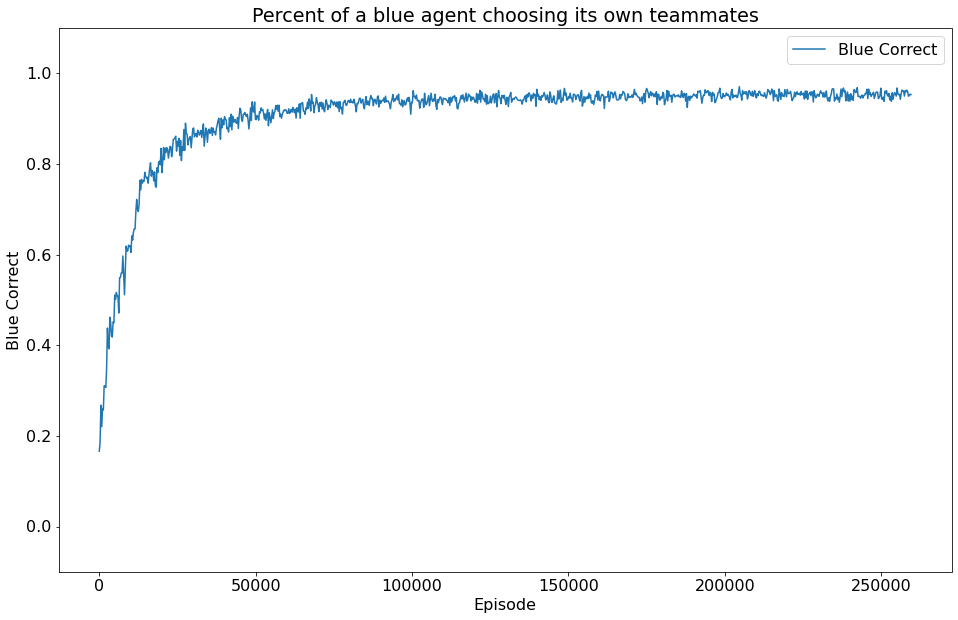

epoch 521 - loss = 0.11857243627309799, last - 4.119092773180455e-05
epoch 522 - loss = 0.11658372730016708, last - 1.8715929854806745e-06
epoch 523 - loss = 0.11682991683483124, last - 1.3113065051584272e-06
epoch 524 - loss = 0.1171855702996254, last - 1.382832579110982e-06
epoch 525 - loss = 0.12379694730043411, last - 1.9050337868975475e-05
epoch 526 - loss = 0.1212753877043724, last - 1.1897338481503539e-05
epoch 527 - loss = 0.12519174814224243, last - 5.4293719585984945e-05
epoch 528 - loss = 0.1172507181763649, last - 1.34233614517143e-05
epoch 529 - loss = 0.11832921206951141, last - 1.1920931797249068e-07
epoch 530 - loss = 0.1208333969116211, last - 4.291537720746419e-07
epoch 531 - loss = 0.11814209073781967, last - 1.3232263427198632e-06
epoch 532 - loss = 0.11639117449522018, last - 4.291575805837056e-06
epoch 533 - loss = 0.1138342097401619, last - 7.139331137295812e-05
epoch 534 - loss = 0.12100483477115631, last - 1.6689304516148695e-07
epoch 535 - loss = 0.11571600288

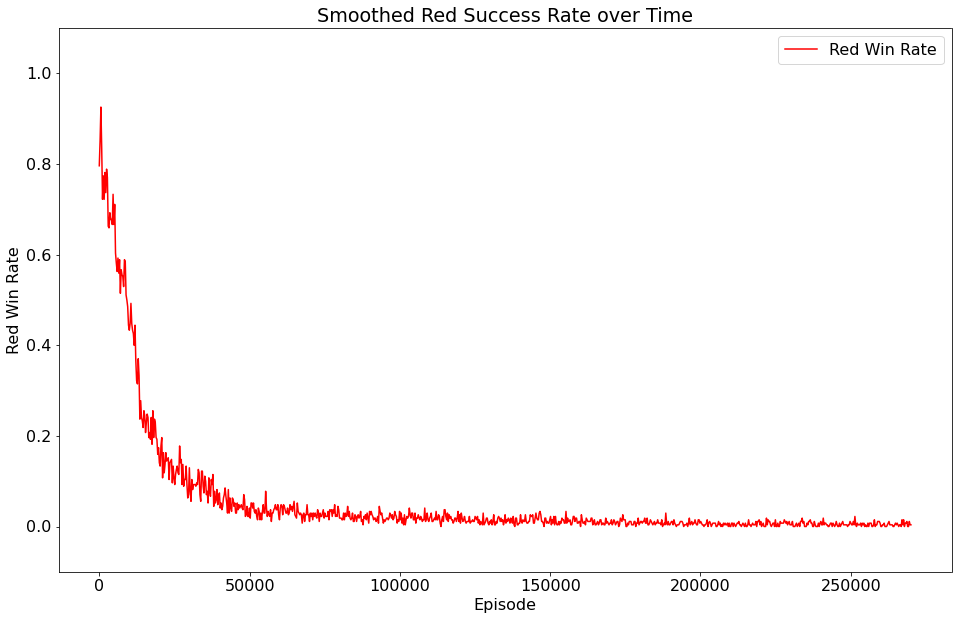

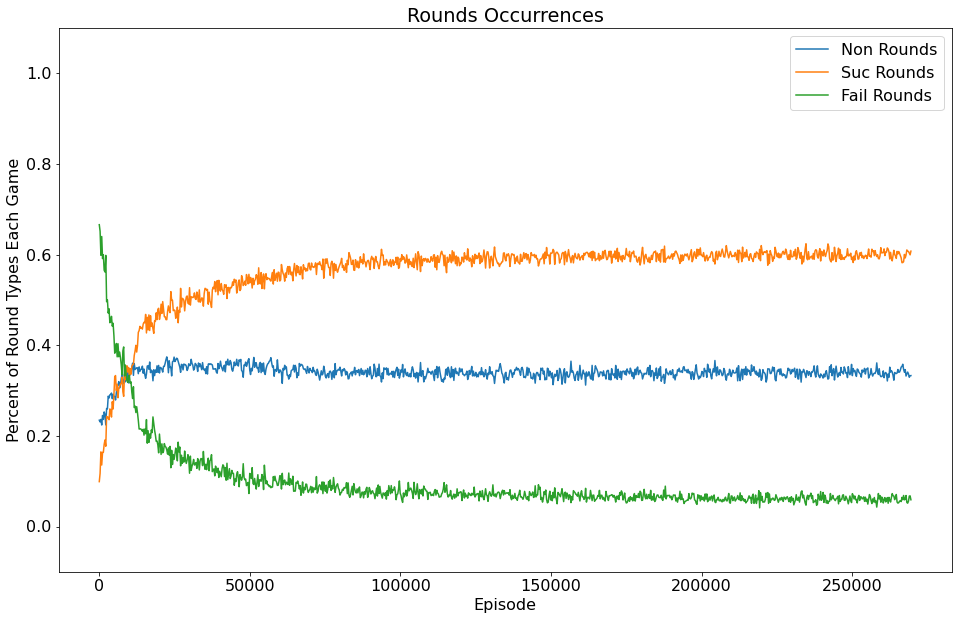

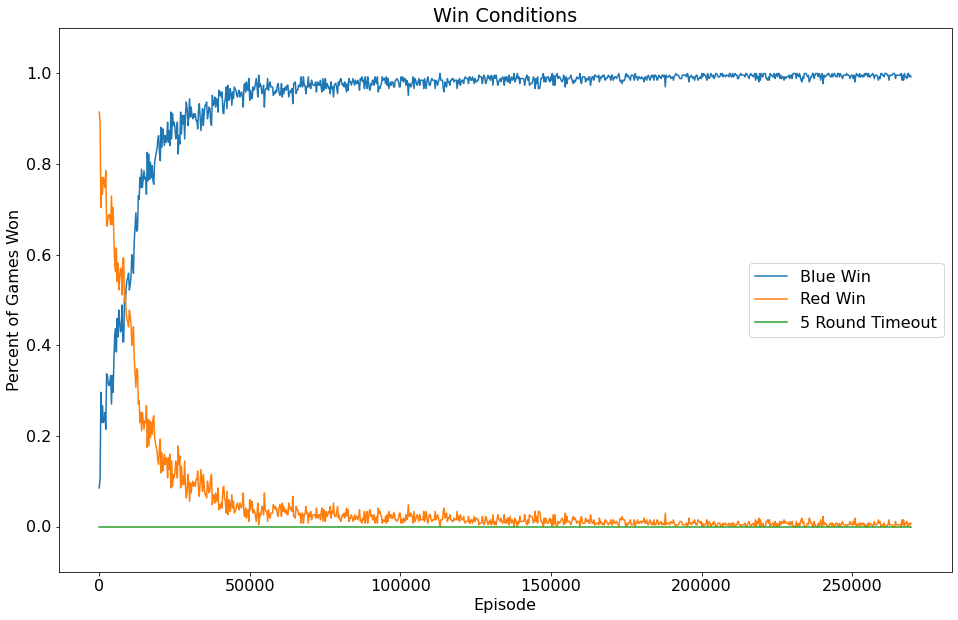

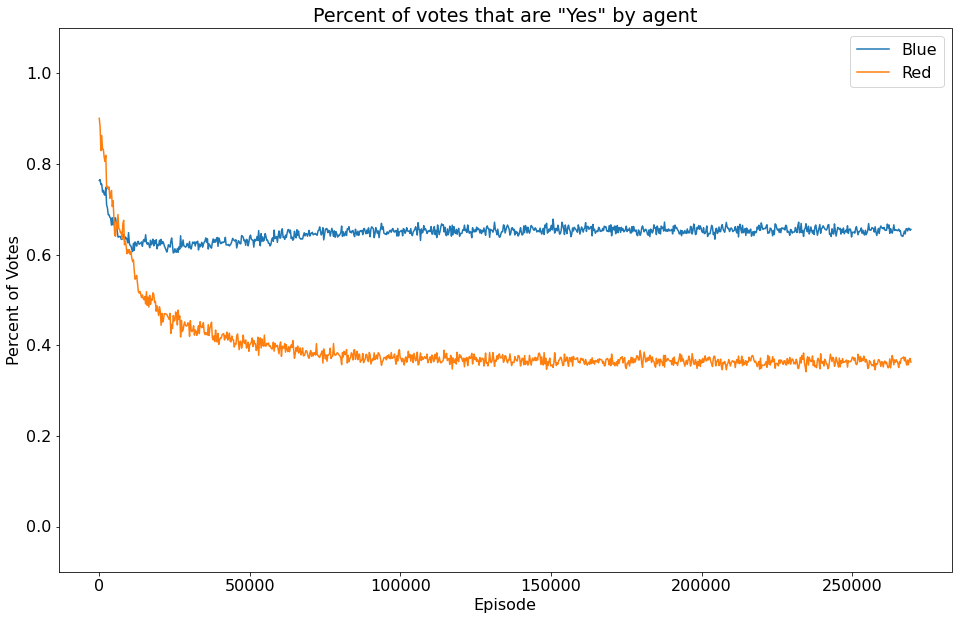

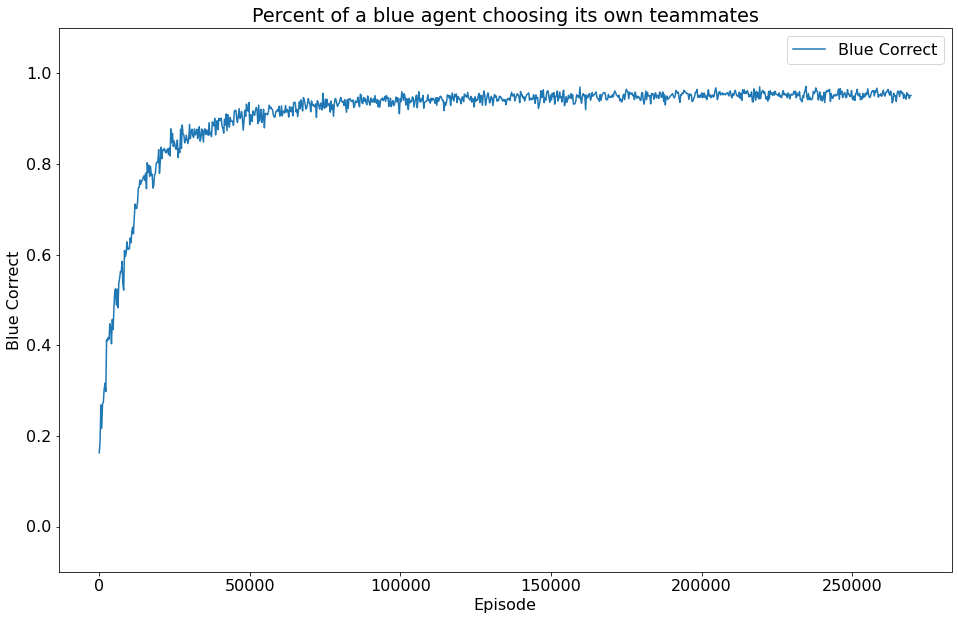

epoch 541 - loss = 0.12094660103321075, last - 6.759230927855242e-06
epoch 542 - loss = 0.11379024386405945, last - 2.777587724267505e-06
epoch 543 - loss = 0.11617454141378403, last - 4.100818387087202e-06
epoch 544 - loss = 0.11893285065889359, last - 6.771196240151767e-06
epoch 545 - loss = 0.11466396600008011, last - 3.8504949770867825e-06
epoch 546 - loss = 0.11683064699172974, last - 5.424085429694969e-06
epoch 547 - loss = 0.11542320251464844, last - 7.152558367806705e-08
epoch 548 - loss = 0.12274733930826187, last - 3.814700448856456e-07
epoch 549 - loss = 0.11778774112462997, last - 4.172364697296871e-06
epoch 550 - loss = 0.12024176120758057, last - 1.962229362106882e-05
epoch 551 - loss = 0.11669795215129852, last - 7.581830686831381e-06
epoch 552 - loss = 0.1186453327536583, last - 5.722054083889816e-07
epoch 553 - loss = 0.11769378185272217, last - 1.156333155449829e-06
epoch 554 - loss = 0.11914060264825821, last - 2.645401946210768e-05
epoch 555 - loss = 0.1183237209916

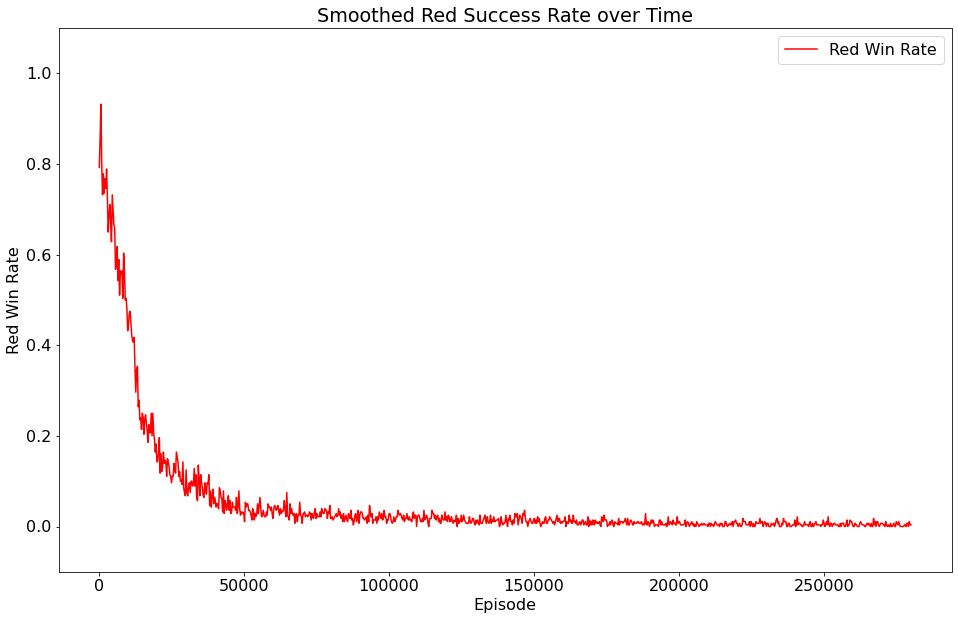

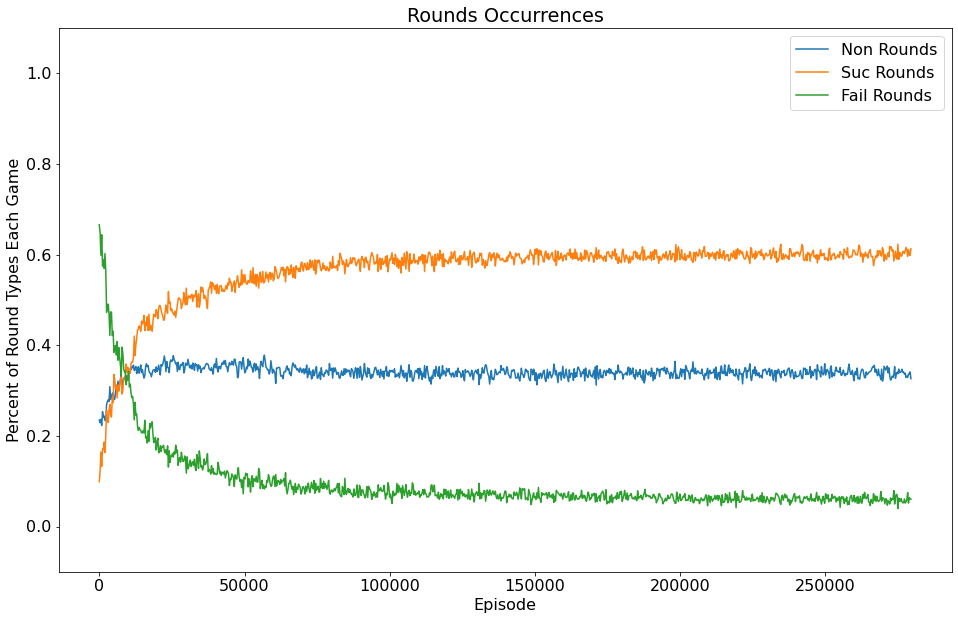

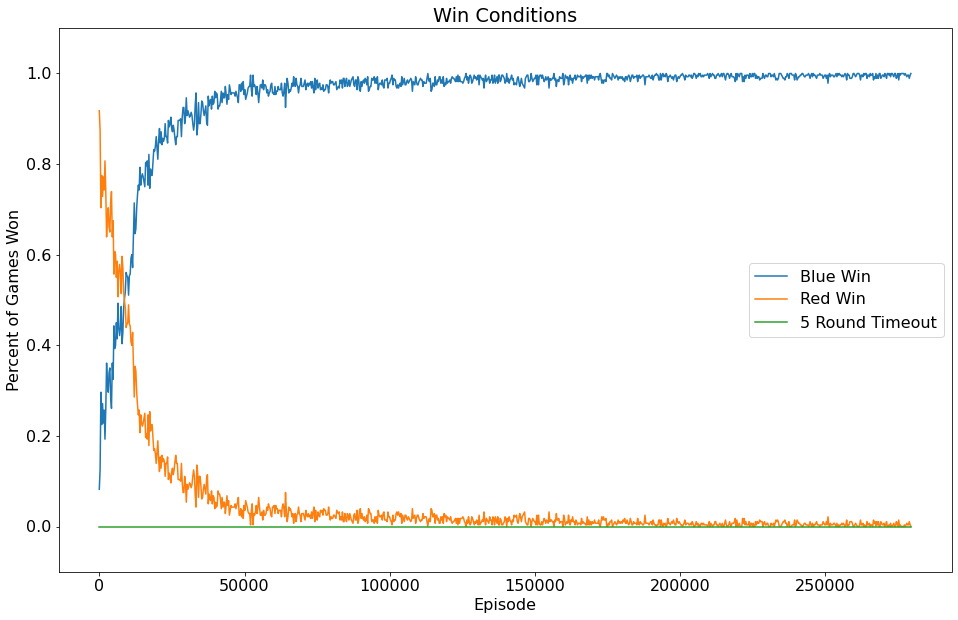

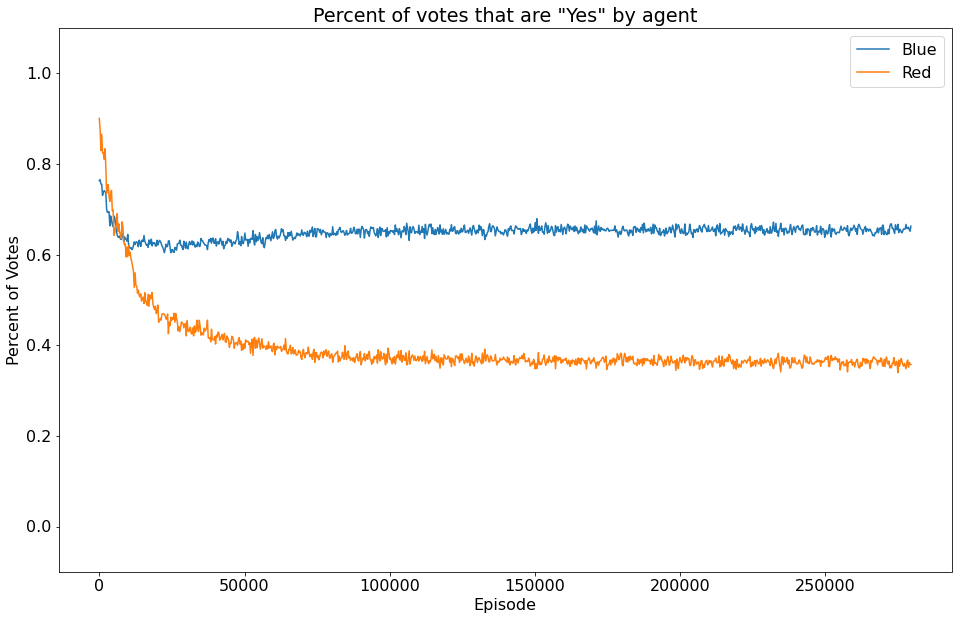

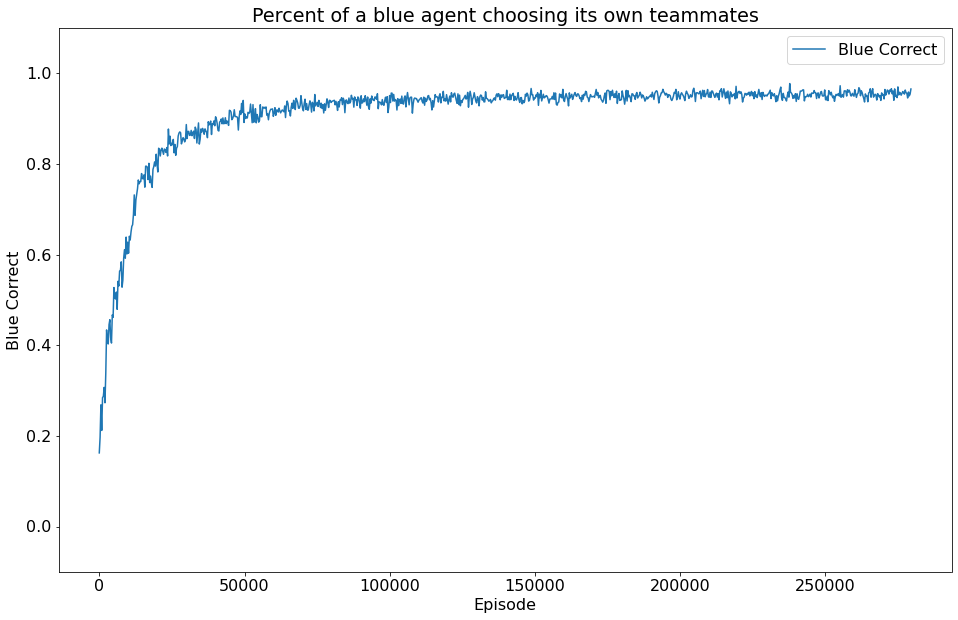

epoch 561 - loss = 0.12226653844118118, last - 2.3841858265427618e-08
epoch 562 - loss = 0.11720242351293564, last - 1.156331563834101e-06
epoch 563 - loss = 0.12502524256706238, last - 3.099443688370229e-07
epoch 564 - loss = 0.11993707716464996, last - 2.3841858265427618e-08
epoch 565 - loss = 0.11395058035850525, last - 2.8313446819083765e-05
epoch 566 - loss = 0.11562347412109375, last - 4.7683716530855236e-08
epoch 567 - loss = 0.11664733290672302, last - 4.768376697938947e-07
epoch 568 - loss = 0.12070911377668381, last - 7.140746220102301e-06
epoch 569 - loss = 0.11371190845966339, last - 7.784516128594987e-06
epoch 570 - loss = 0.11655744910240173, last - 3.0994428357189463e-07
epoch 571 - loss = 0.11760131269693375, last - 8.28516022011172e-06
epoch 572 - loss = 0.11757604032754898, last - 2.622606132263172e-07
epoch 573 - loss = 0.1172725036740303, last - 2.455725280015031e-06
epoch 574 - loss = 0.1140272468328476, last - 5.352550488169072e-06
epoch 575 - loss = 0.12111981958

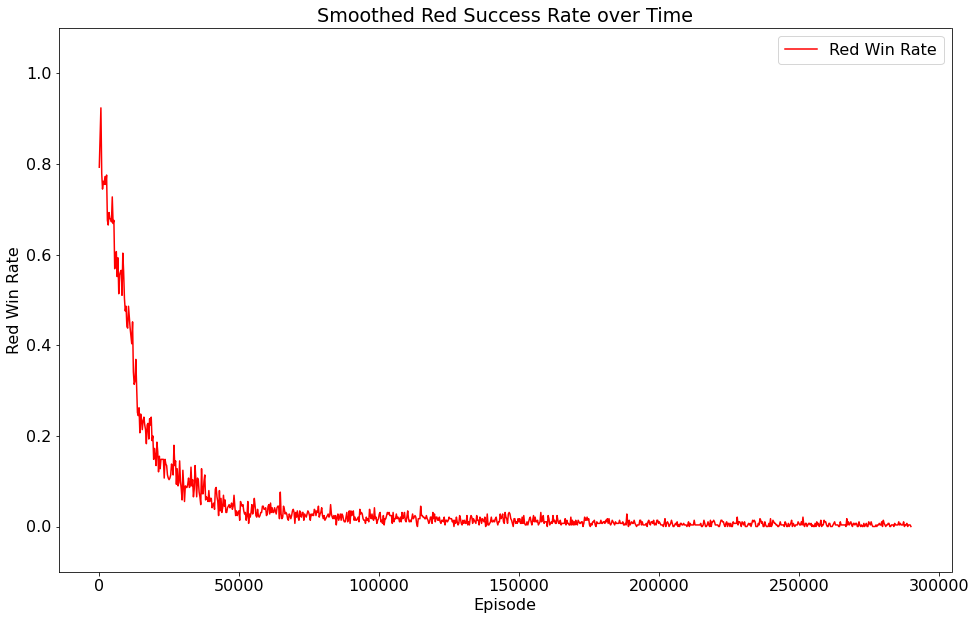

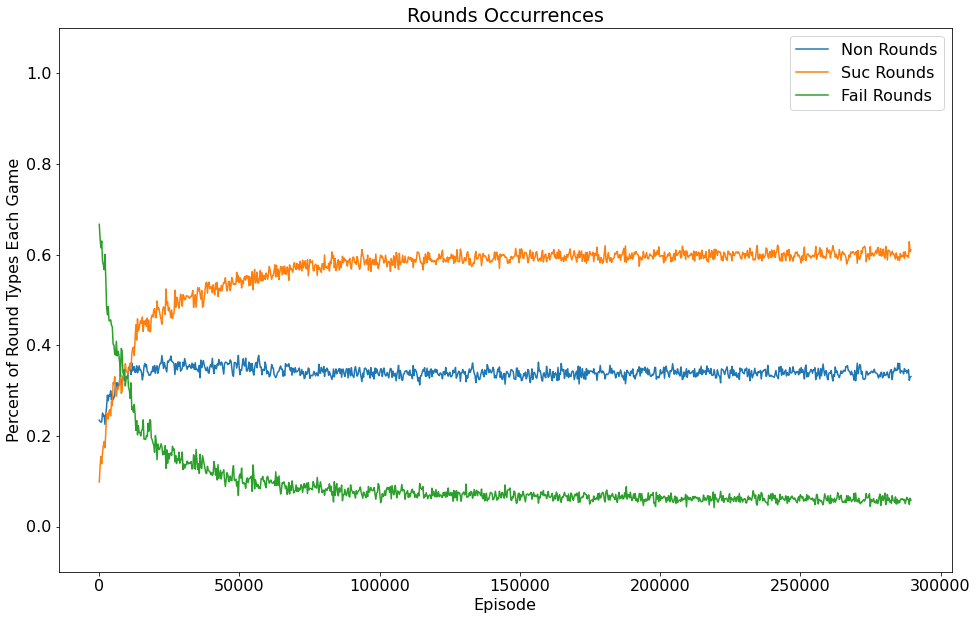

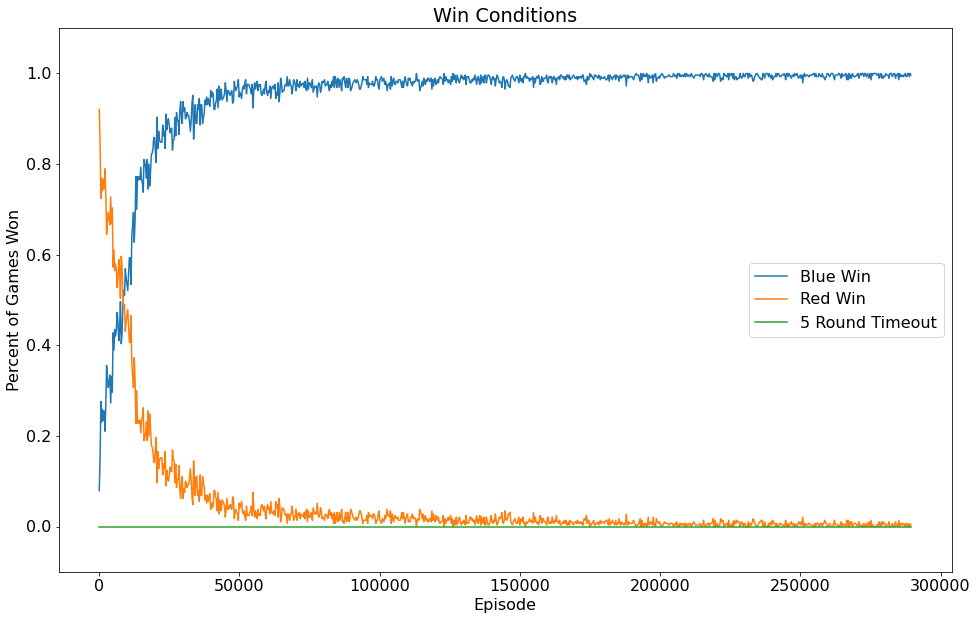

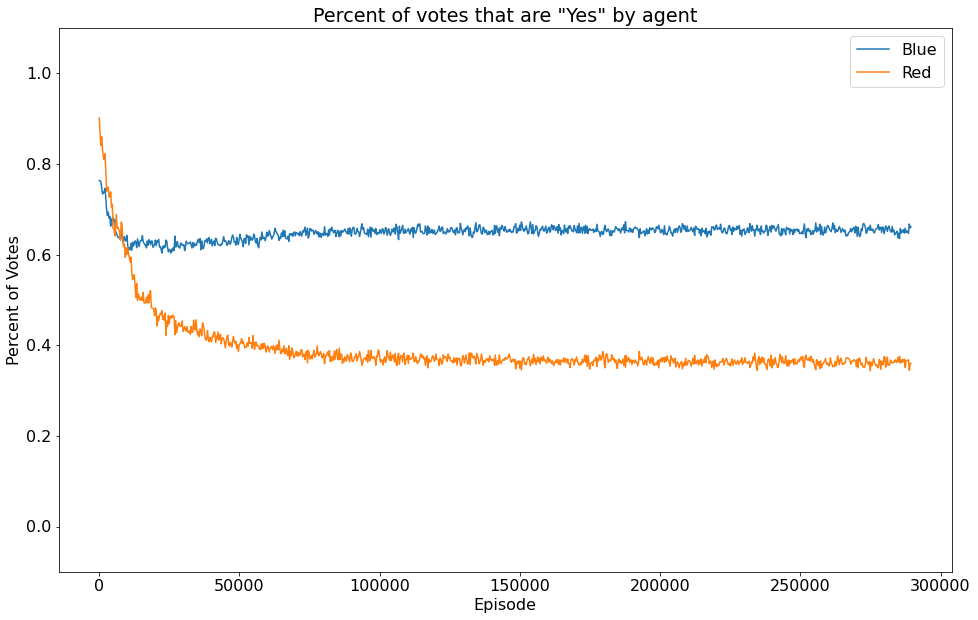

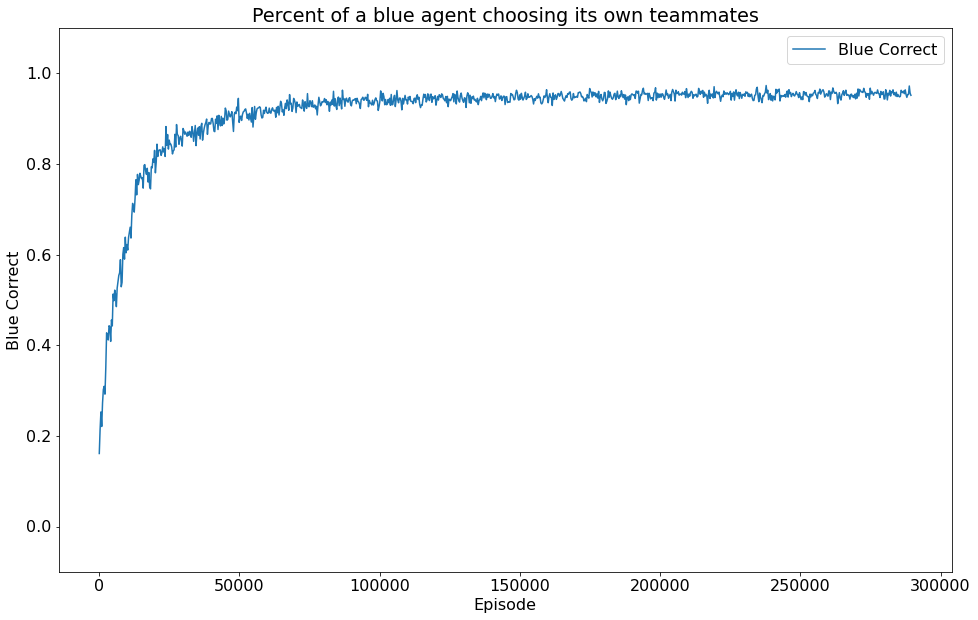

epoch 581 - loss = 0.11864373087882996, last - 1.8823533537215553e-05
epoch 582 - loss = 0.12054650485515594, last - 5.245215675131476e-07
epoch 583 - loss = 0.11666335165500641, last - 2.622606132263172e-07
epoch 584 - loss = 0.11506155878305435, last - 1.0109042705153115e-05
epoch 585 - loss = 0.12059632688760757, last - 1.0490444992683479e-06
epoch 586 - loss = 0.11556841433048248, last - 1.8251734218210913e-05
epoch 587 - loss = 0.12030141055583954, last - 2.8133567866461817e-06
epoch 588 - loss = 0.11940624564886093, last - 9.179129847325385e-07
epoch 589 - loss = 0.1248868852853775, last - 0.0
epoch 590 - loss = 0.11840357631444931, last - 5.960465188081798e-08
epoch 591 - loss = 0.12086836993694305, last - 6.377797490131343e-06
epoch 592 - loss = 0.11751437187194824, last - 3.0756229989492567e-06
epoch 593 - loss = 0.1181270033121109, last - 3.3021162835211726e-06
epoch 594 - loss = 0.11432856321334839, last - 7.152557657263969e-08
epoch 595 - loss = 0.11690680682659149, last - 

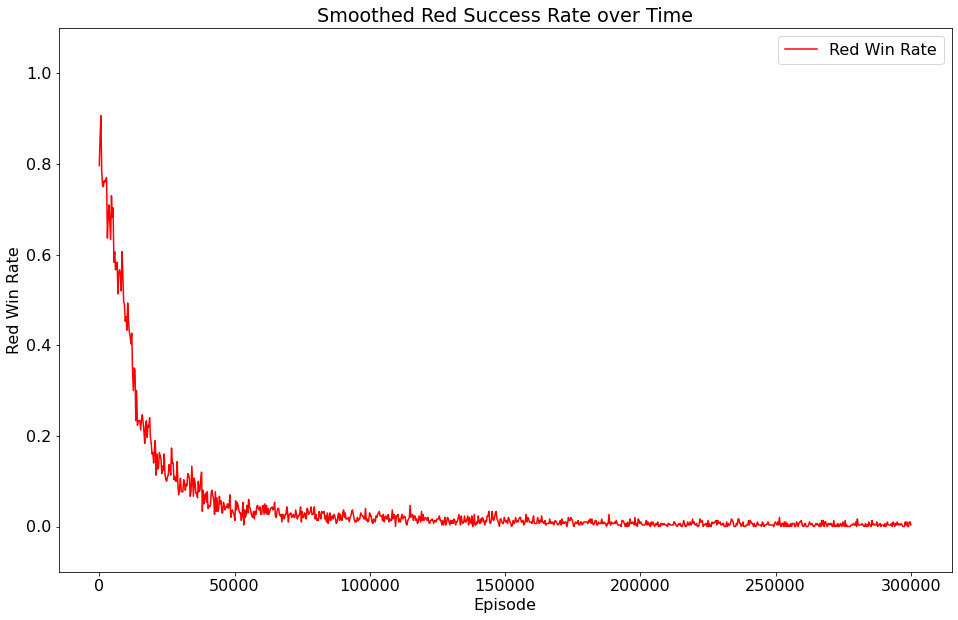

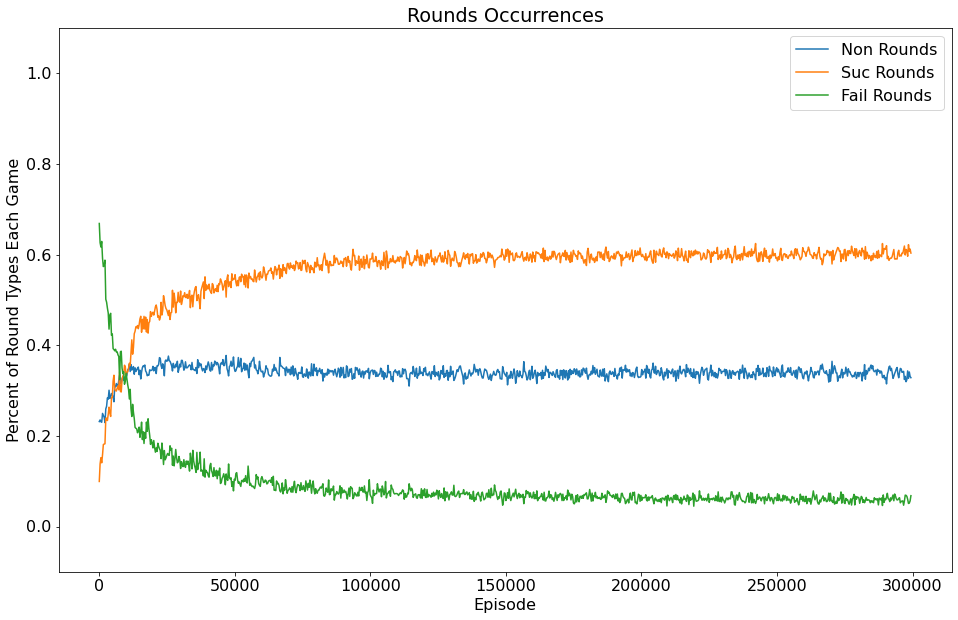

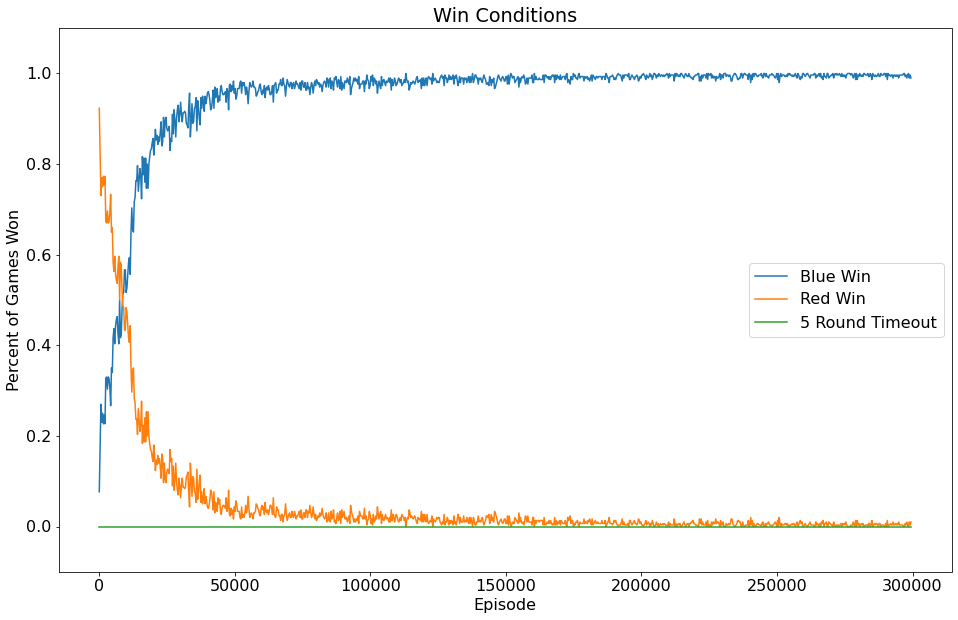

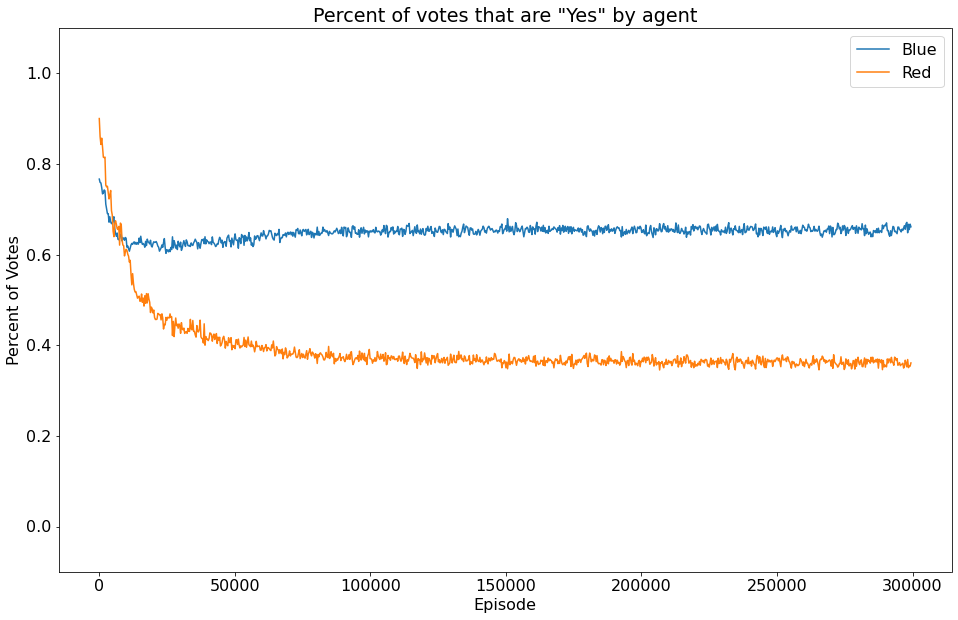

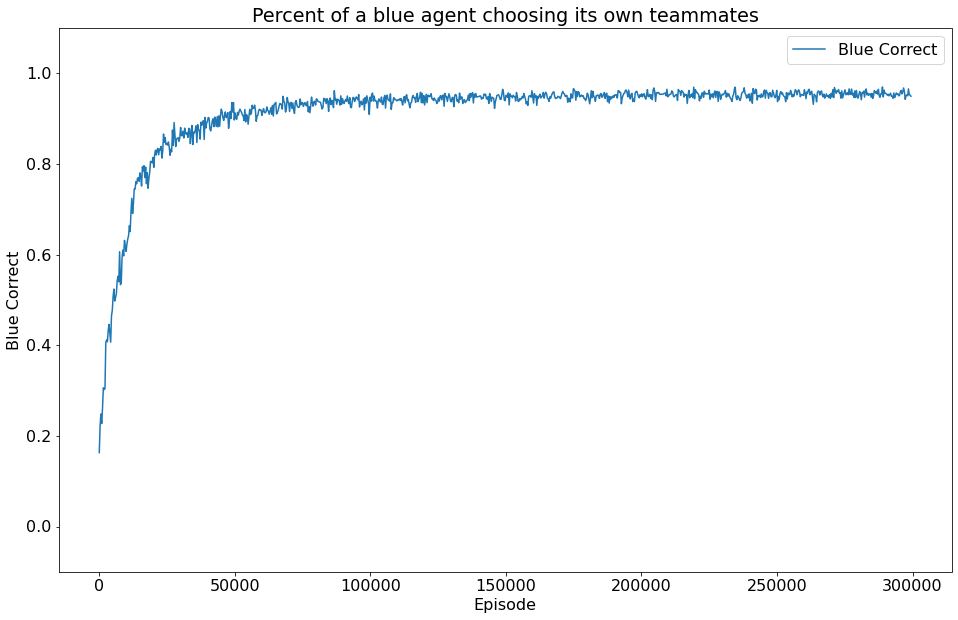

epoch 601 - loss = 0.12161590903997421, last - 2.8610239155568706e-07
epoch 602 - loss = 0.11449474841356277, last - 5.6988035794347525e-05
epoch 603 - loss = 0.11623847484588623, last - 5.4836791605339386e-06
epoch 604 - loss = 0.11726777255535126, last - 7.152557657263969e-08
epoch 605 - loss = 0.1161813959479332, last - 6.592376394110033e-06
epoch 606 - loss = 0.11421897262334824, last - 2.741814739692927e-07
epoch 607 - loss = 0.11432747542858124, last - 2.861024199773965e-07
epoch 608 - loss = 0.11708557605743408, last - 2.4557220967835747e-06
epoch 609 - loss = 0.1191464215517044, last - 2.021882937697228e-05
epoch 610 - loss = 0.1169036477804184, last - 1.3661617231264245e-05
epoch 611 - loss = 0.11567756533622742, last - 1.012107441056287e-05
epoch 612 - loss = 0.1176615059375763, last - 1.907349087559851e-07
epoch 613 - loss = 0.11759264022111893, last - 7.414931133098435e-06
epoch 614 - loss = 0.11404558271169662, last - 2.8610239155568706e-07
epoch 615 - loss = 0.11445049196

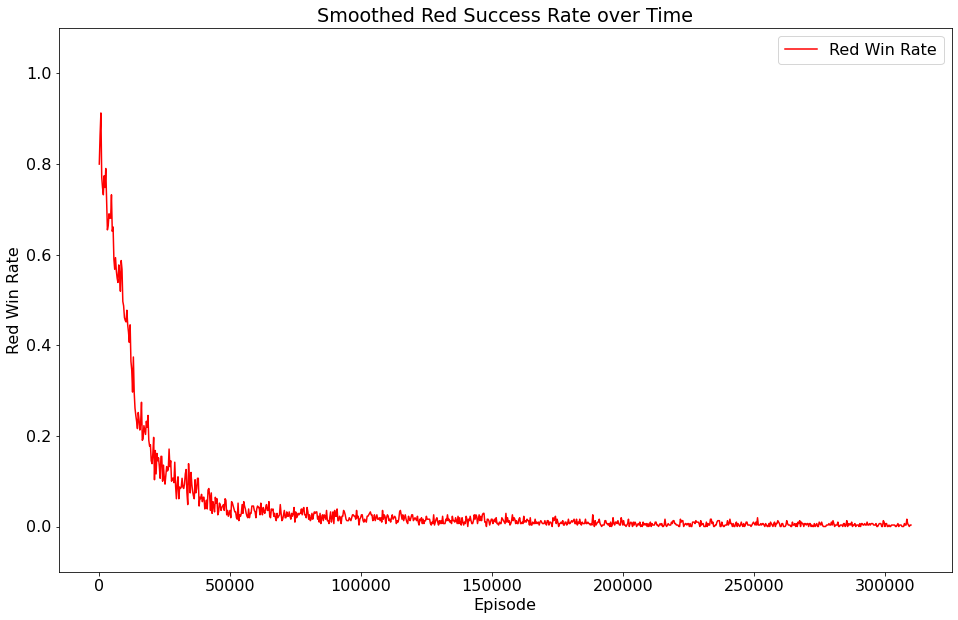

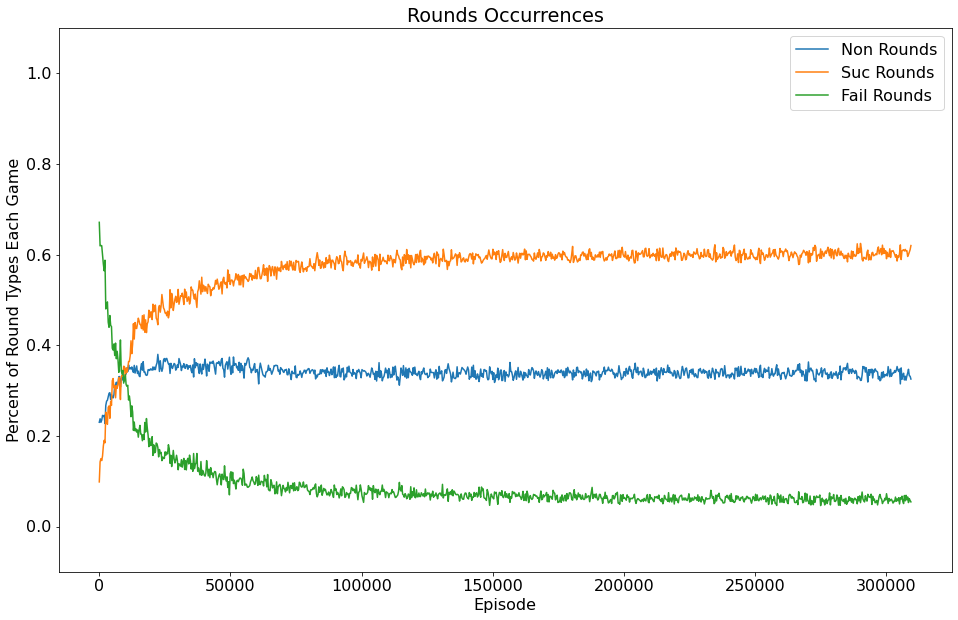

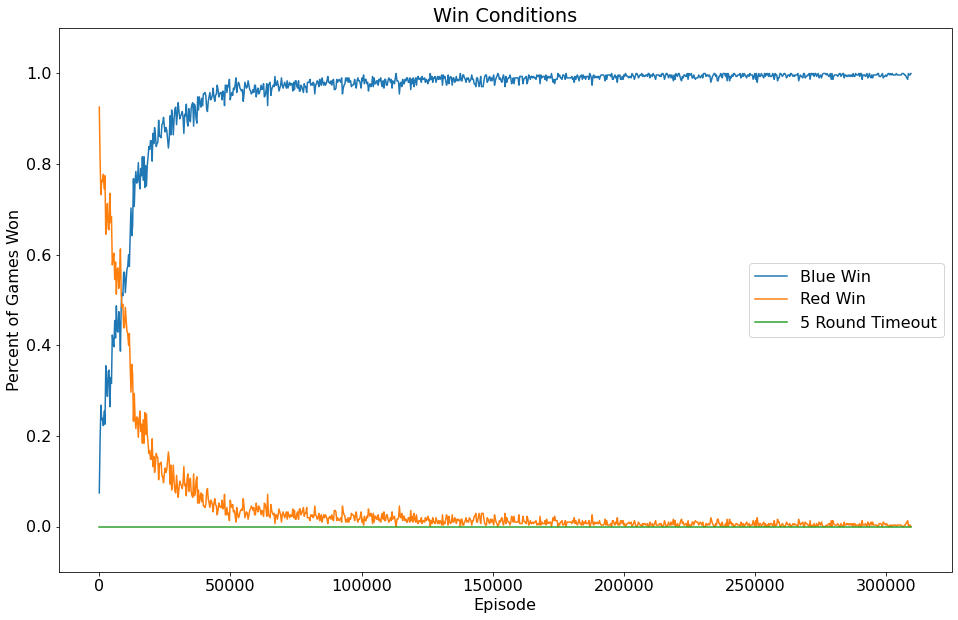

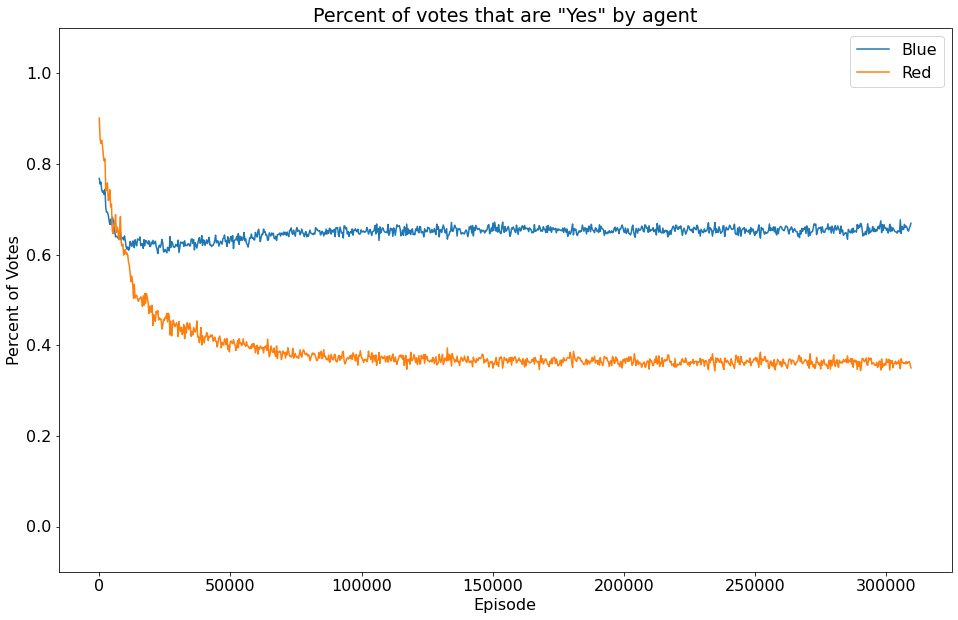

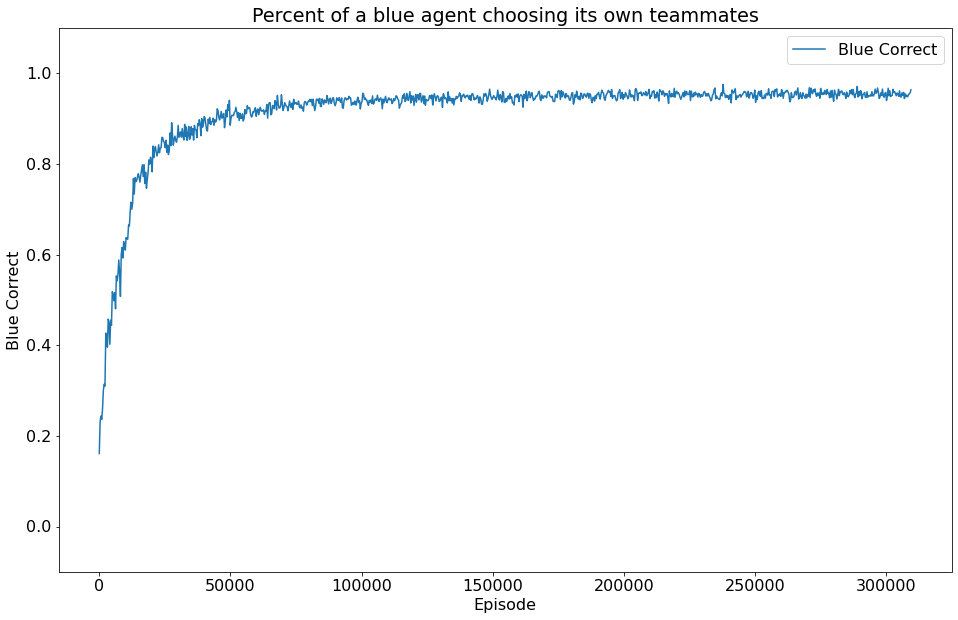

epoch 621 - loss = 0.11341843008995056, last - 1.4424347227759426e-06
epoch 622 - loss = 0.11683405935764313, last - 5.3883209147898015e-06
epoch 623 - loss = 0.11604554951190948, last - 1.6689307358319638e-07
epoch 624 - loss = 0.11555038392543793, last - 9.536744016713783e-08
epoch 625 - loss = 0.11377221345901489, last - 4.7683720083568915e-08
epoch 626 - loss = 0.1159372627735138, last - 3.635907432908425e-06
epoch 627 - loss = 0.11124743521213531, last - 1.072886561814812e-06
epoch 628 - loss = 0.11436595022678375, last - 4.768377266373136e-07
epoch 629 - loss = 0.11317203938961029, last - 1.4305118156698882e-07
epoch 630 - loss = 0.11374741047620773, last - 0.0
epoch 631 - loss = 0.11217770725488663, last - 1.3351798770599999e-05
epoch 632 - loss = 0.1128554493188858, last - 1.3232263427198632e-06
epoch 633 - loss = 0.11495718359947205, last - 2.7299101930111647e-06
epoch 634 - loss = 0.11440203338861465, last - 2.26497718358587e-07
epoch 635 - loss = 0.11384564638137817, last - 

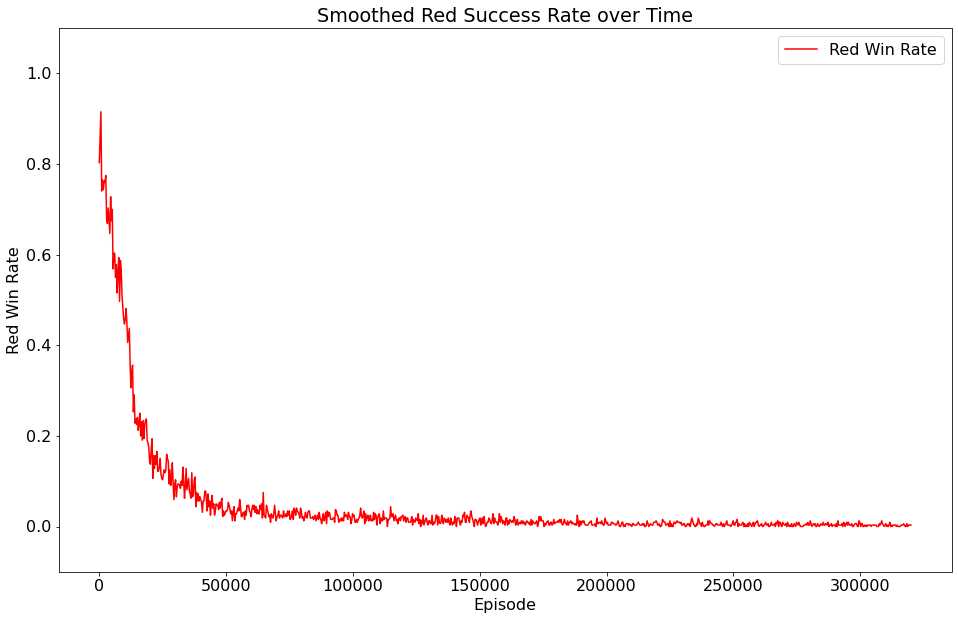

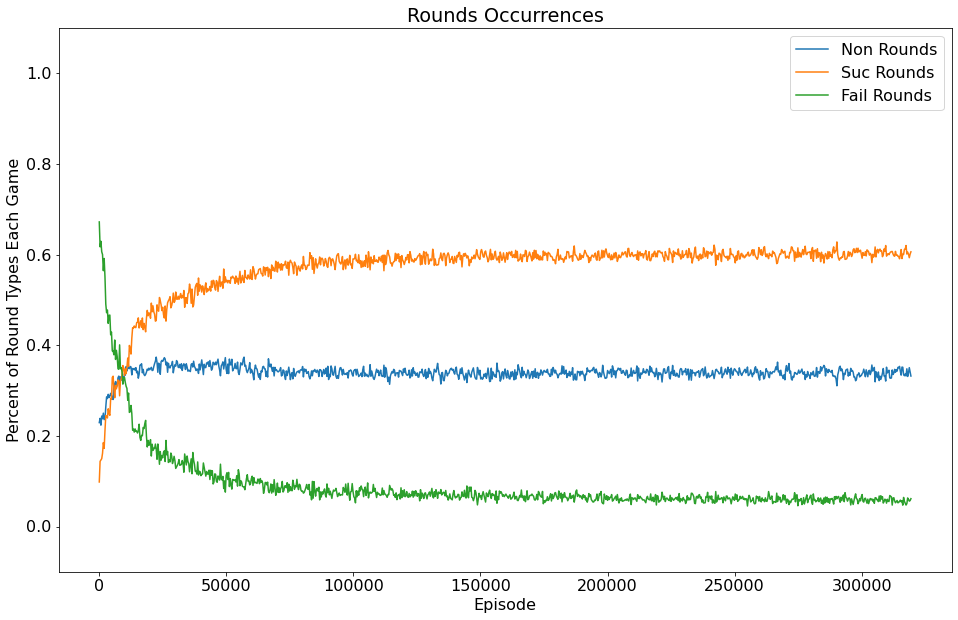

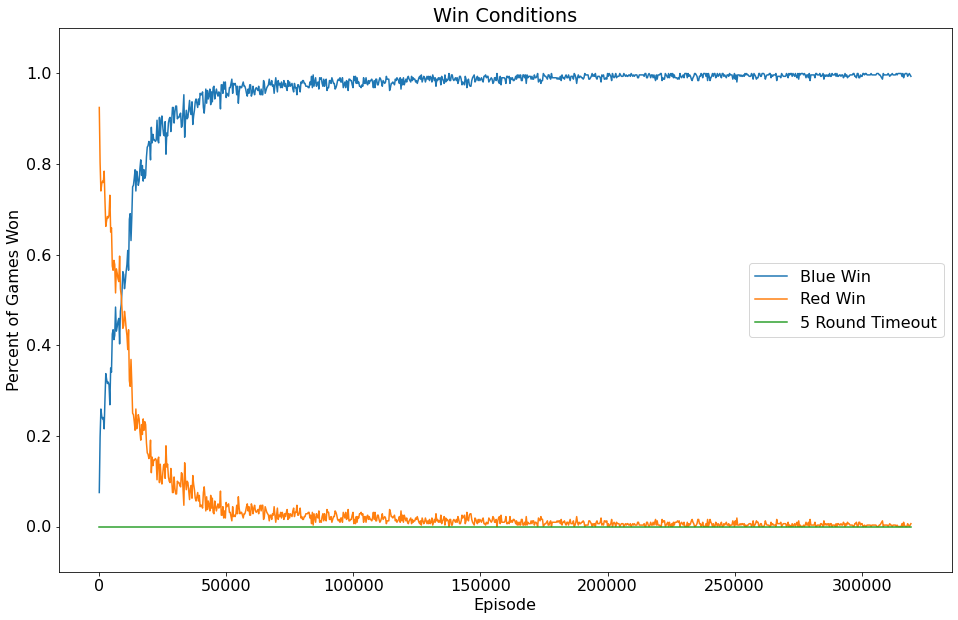

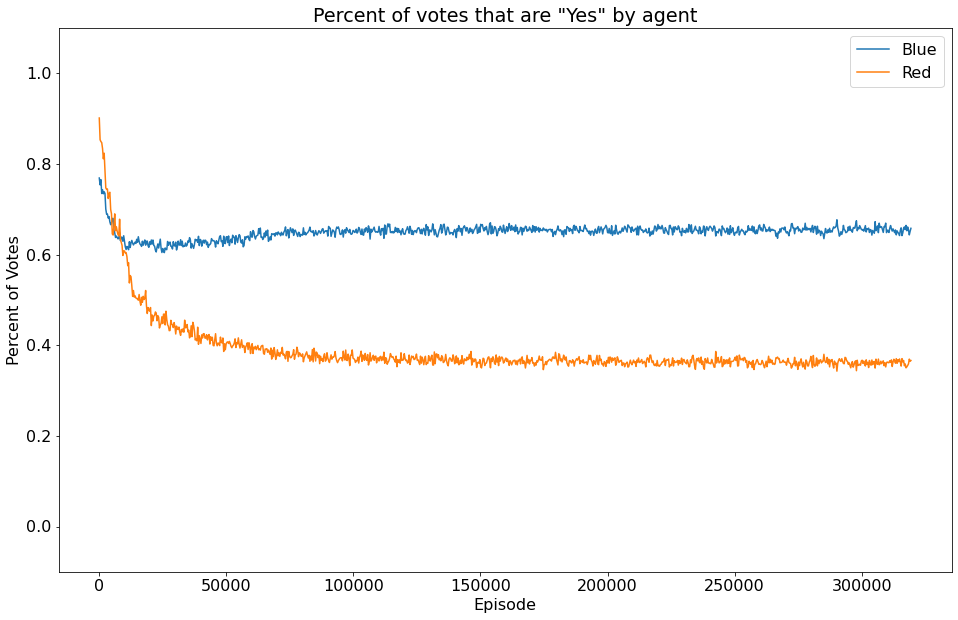

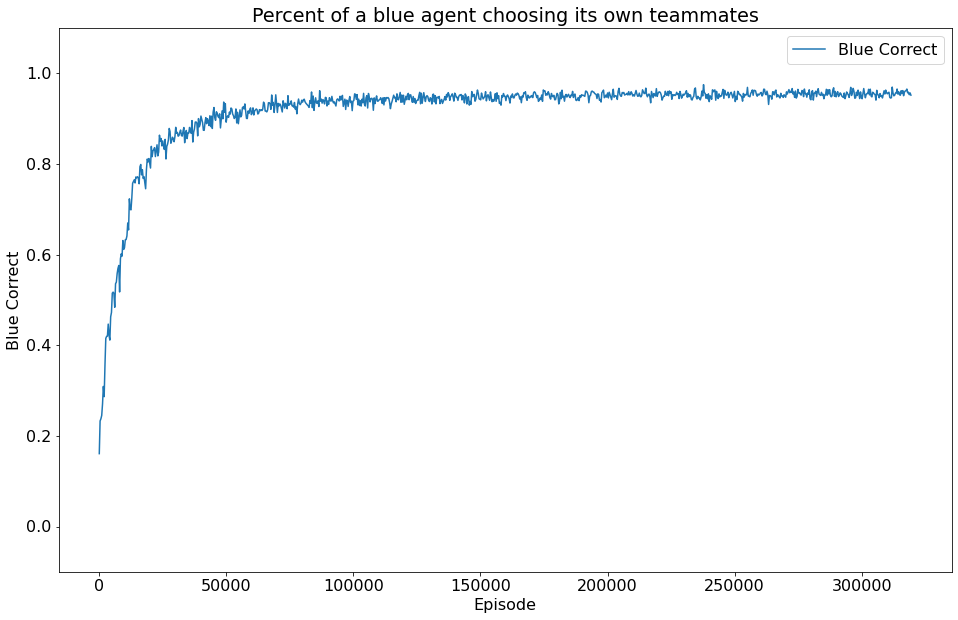

epoch 641 - loss = 0.11379583925008774, last - 8.583086241742421e-07
epoch 642 - loss = 0.11254581809043884, last - 5.483632321556797e-07
epoch 643 - loss = 0.11230948567390442, last - 4.7683716530855236e-08
epoch 644 - loss = 0.11628861725330353, last - 9.536745437799254e-08
epoch 645 - loss = 0.10826557874679565, last - 0.0
epoch 646 - loss = 0.11051706969738007, last - 4.6968825699877925e-06
epoch 647 - loss = 0.11449430137872696, last - 7.152558367806705e-08
epoch 648 - loss = 0.11264854669570923, last - 4.768377266373136e-07
epoch 649 - loss = 0.116954006254673, last - 4.7683720083568915e-08
epoch 650 - loss = 0.11511341482400894, last - 2.9683258162549464e-06
epoch 651 - loss = 0.1192285418510437, last - 0.0
epoch 652 - loss = 0.11703693121671677, last - 2.3841858265427618e-08
epoch 653 - loss = 0.11887749284505844, last - 3.0994439725873235e-07
epoch 654 - loss = 0.11335838586091995, last - 2.336514626222197e-06
epoch 655 - loss = 0.11361649632453918, last - 1.0967281696139253e-

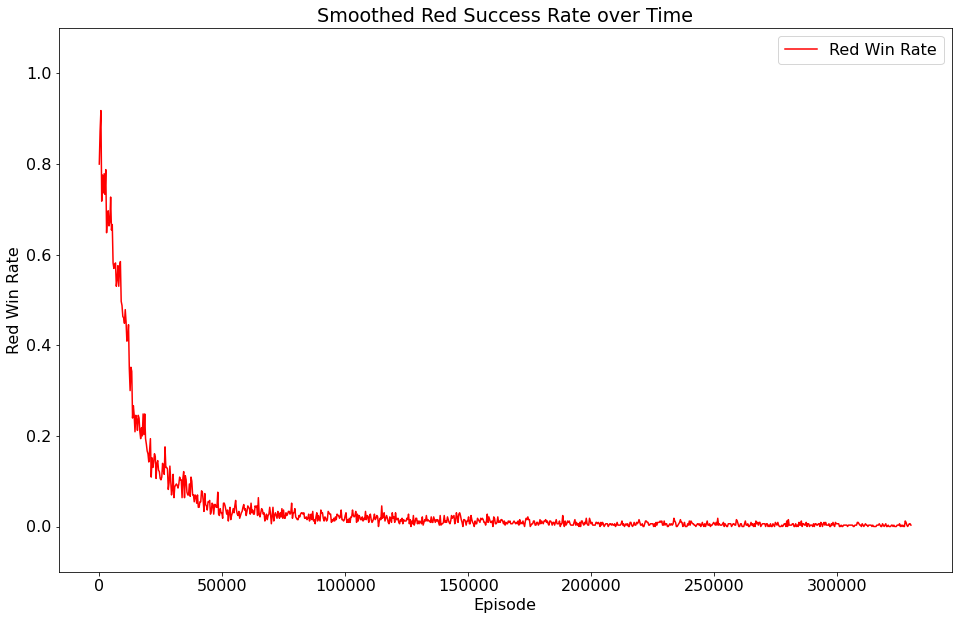

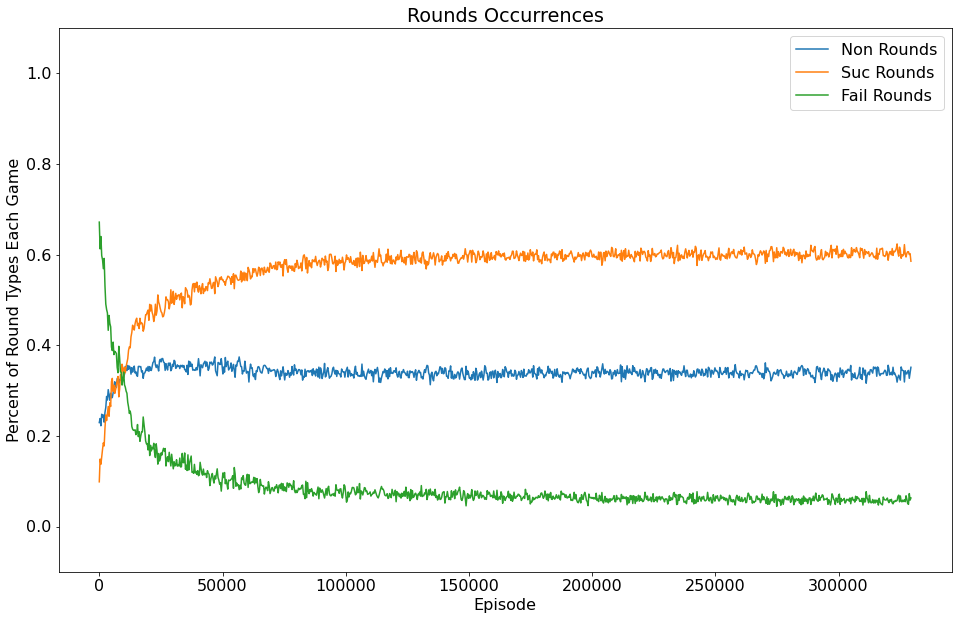

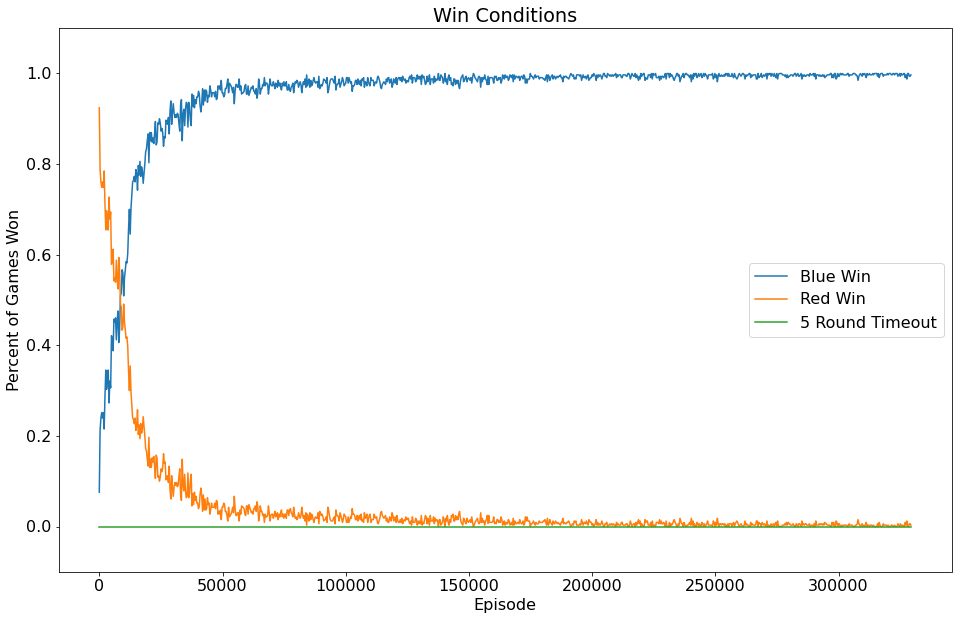

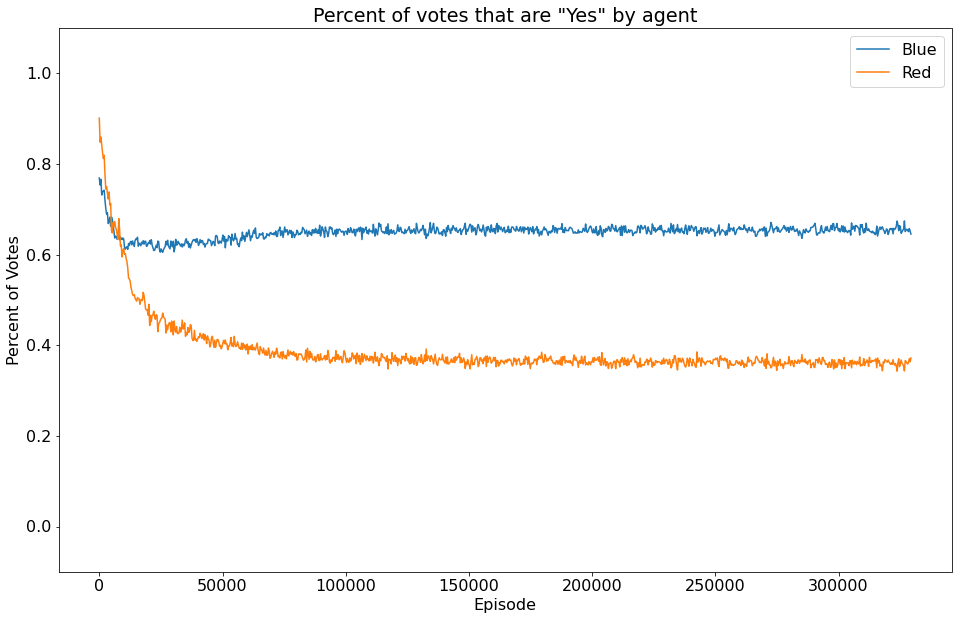

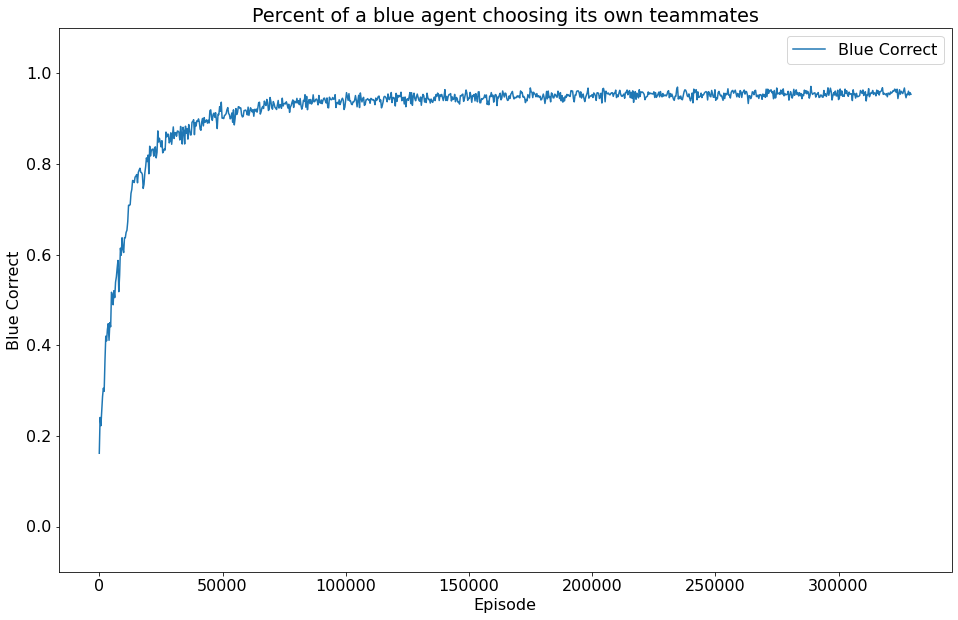

epoch 661 - loss = 0.11616697907447815, last - 7.152557657263969e-08
epoch 662 - loss = 0.11160559207201004, last - 2.1338514670787845e-06
epoch 663 - loss = 0.11657699197530746, last - 5.8890254877042025e-06
epoch 664 - loss = 0.11623725295066833, last - 6.794940077270439e-07
epoch 665 - loss = 0.11252900213003159, last - 8.940708653426555e-07
epoch 666 - loss = 0.12002510577440262, last - 5.841259849148628e-07
epoch 667 - loss = 0.11370319873094559, last - 1.2755426723742858e-06
epoch 668 - loss = 0.11415553838014603, last - 9.536745437799254e-08
epoch 669 - loss = 0.11566904187202454, last - 2.3841858265427618e-08
epoch 670 - loss = 0.11363120377063751, last - 9.536745437799254e-08
epoch 671 - loss = 0.11279097199440002, last - 4.7683716530855236e-08
epoch 672 - loss = 0.11658500880002975, last - 3.1948234209266957e-06
epoch 673 - loss = 0.11195474863052368, last - 9.536743306171047e-08
epoch 674 - loss = 0.11531373113393784, last - 0.0
epoch 675 - loss = 0.11070120334625244, last -

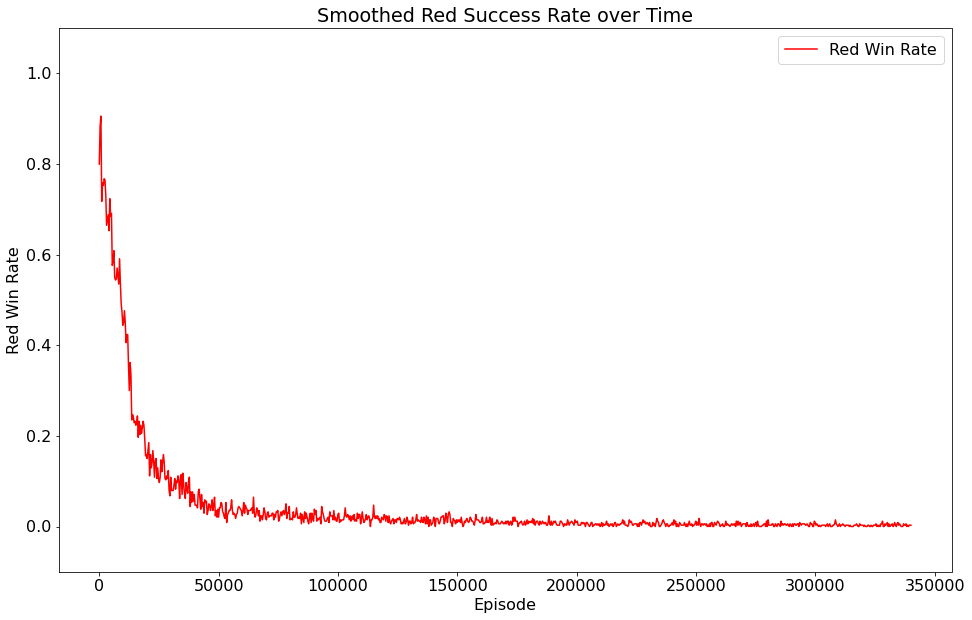

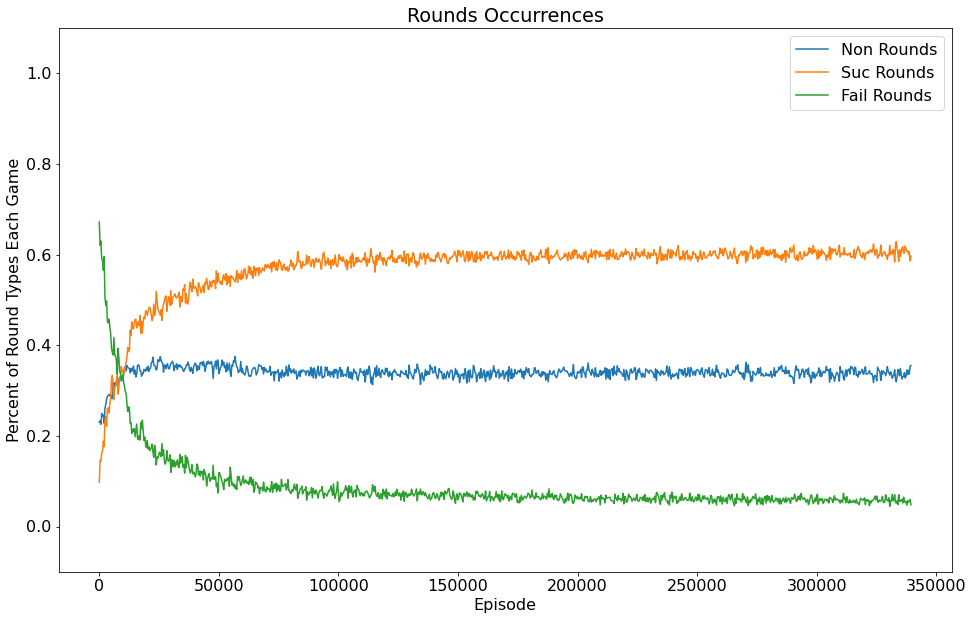

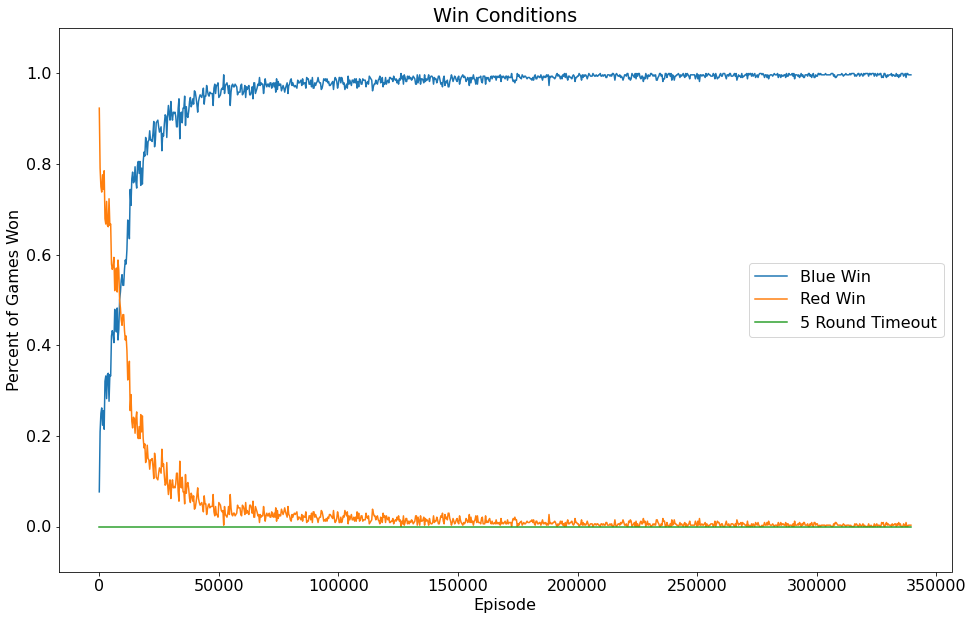

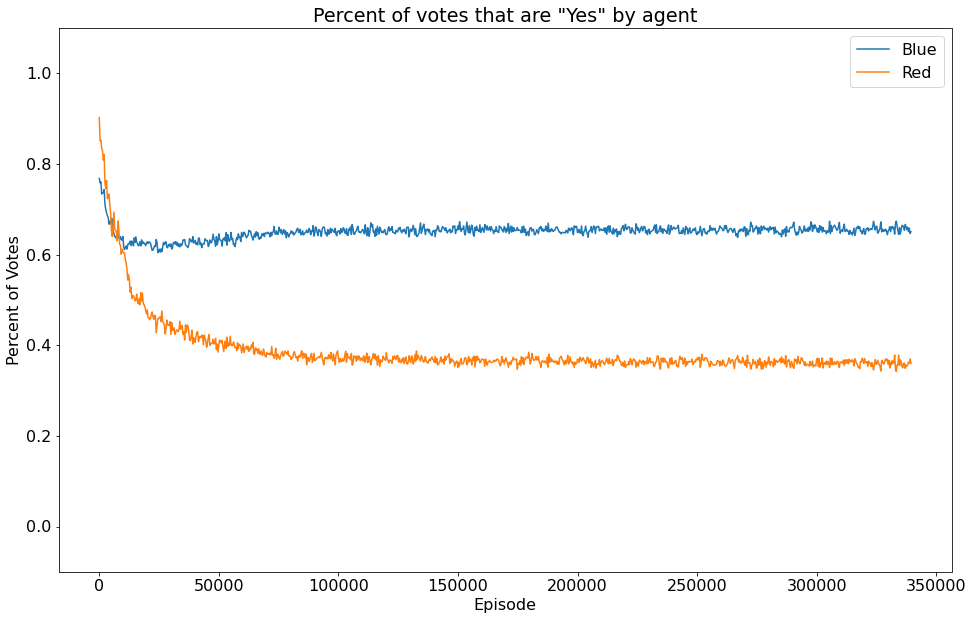

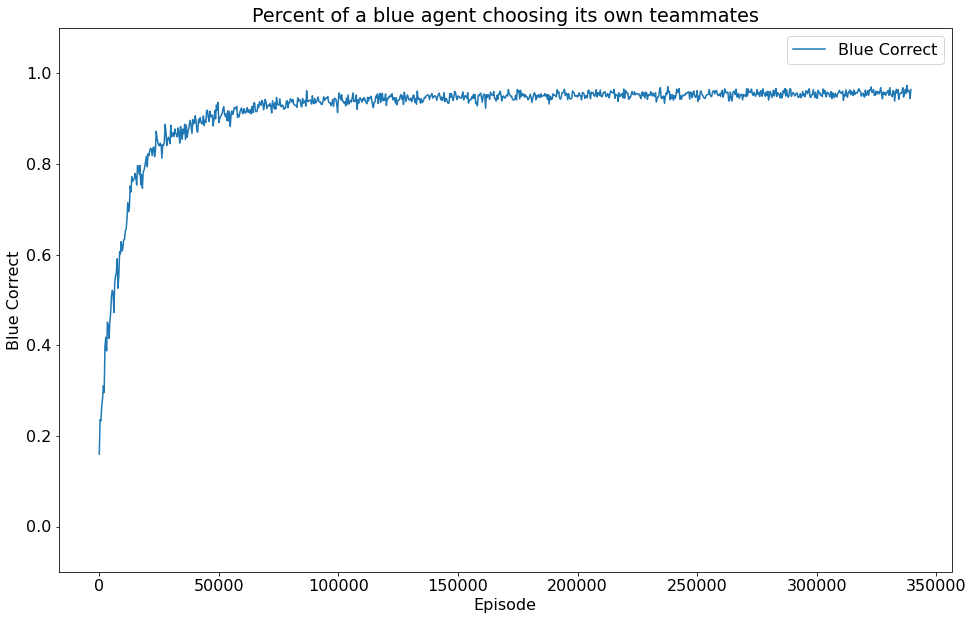

epoch 681 - loss = 0.11257956176996231, last - 4.7683720083568915e-08
epoch 682 - loss = 0.1117769256234169, last - 1.0943685992970131e-05
epoch 683 - loss = 0.11445500701665878, last - 4.78033962281188e-06
epoch 684 - loss = 0.11230356991291046, last - 4.7683716530855236e-08
epoch 685 - loss = 0.11477222293615341, last - 1.8322774849366397e-05
epoch 686 - loss = 0.1133972555398941, last - 2.6226052796118893e-07
epoch 687 - loss = 0.11442022770643234, last - 7.390989367195289e-07
epoch 688 - loss = 0.11371621489524841, last - 2.1457678656133794e-07
epoch 689 - loss = 0.11519451439380646, last - 1.4543555835189181e-06
epoch 690 - loss = 0.11681779474020004, last - 9.655971098254668e-07
epoch 691 - loss = 0.11089573055505753, last - 3.9339096247203997e-07
epoch 692 - loss = 0.11755438894033432, last - 1.072883719643869e-07
epoch 693 - loss = 0.11577305197715759, last - 7.152557657263969e-08
epoch 694 - loss = 0.11165962368249893, last - 7.963337338878773e-06
epoch 695 - loss = 0.11999481

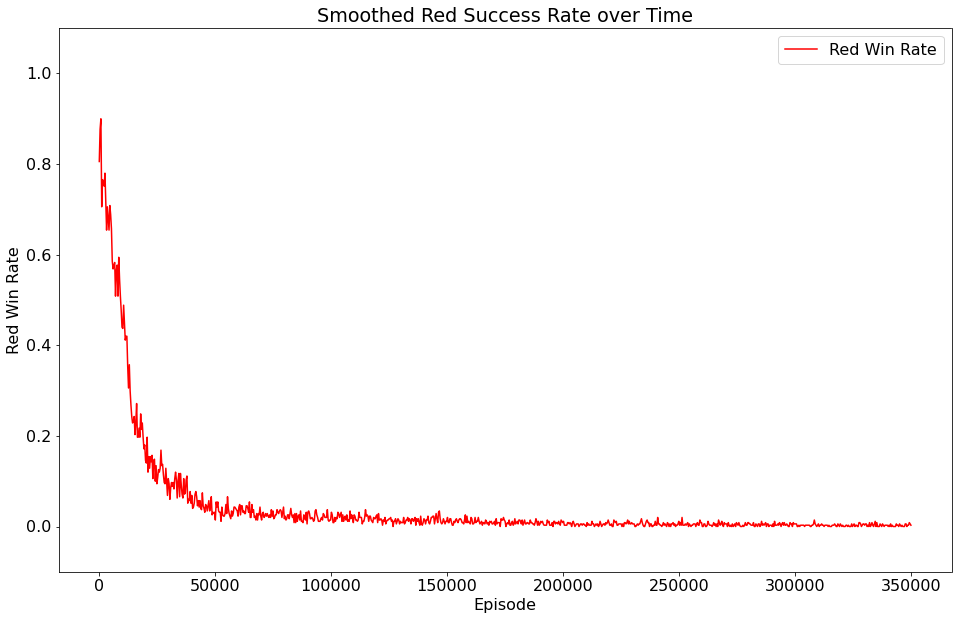

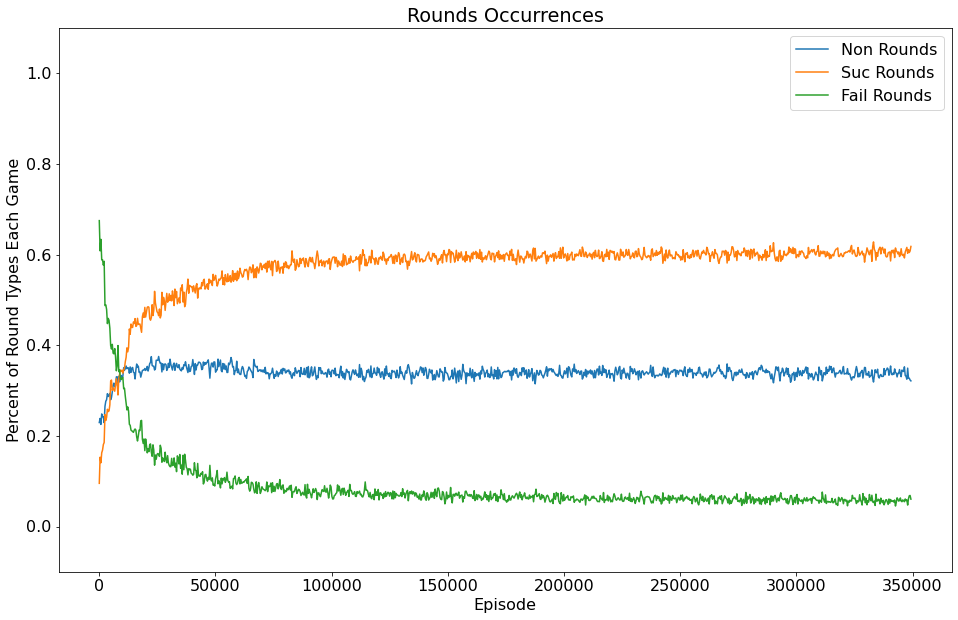

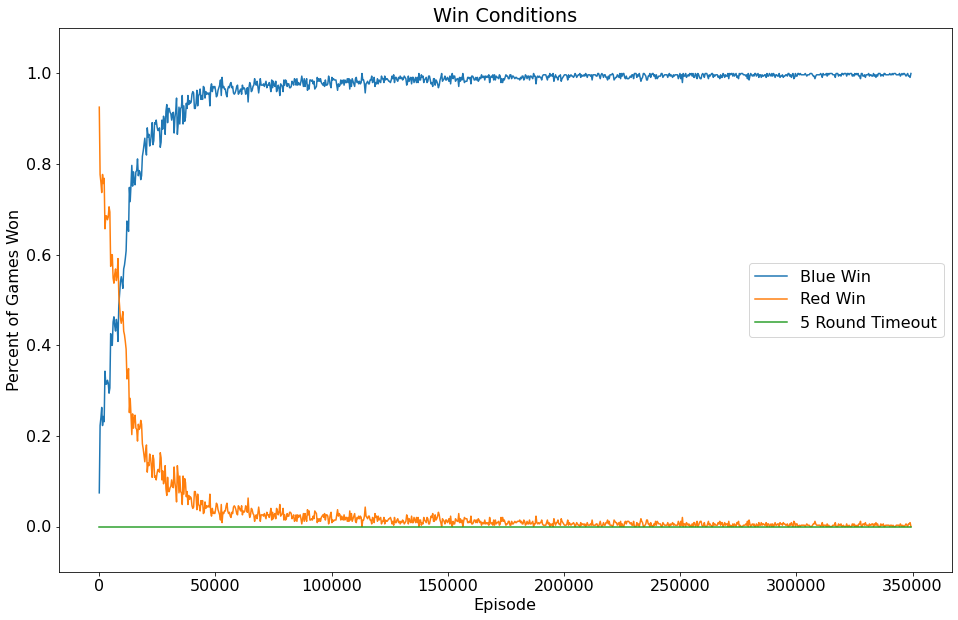

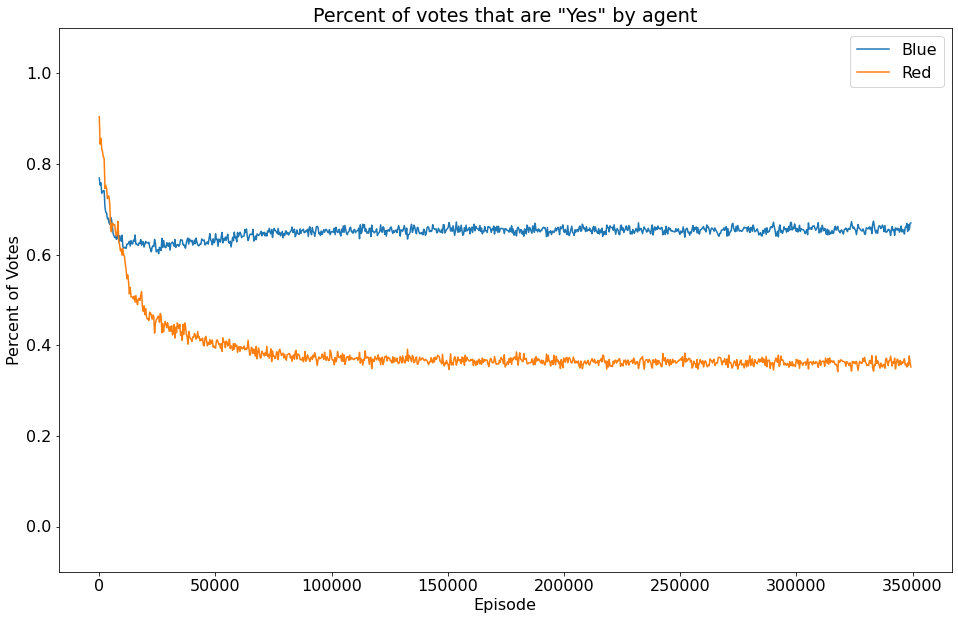

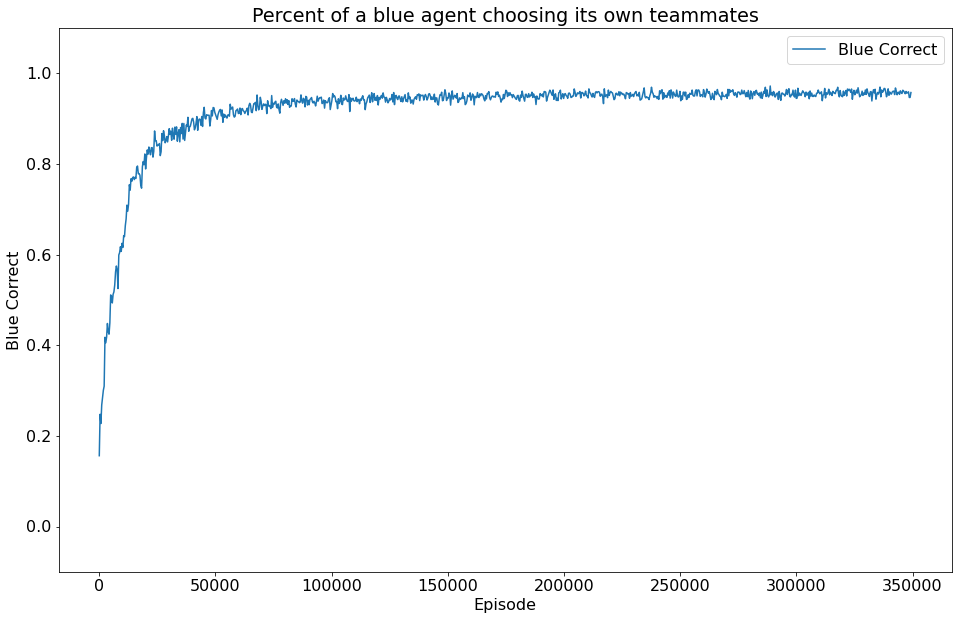

epoch 701 - loss = 0.12347909808158875, last - 4.768377266373136e-07
epoch 702 - loss = 0.11548040062189102, last - 5.185643203731161e-06
epoch 703 - loss = 0.11323008686304092, last - 2.622606132263172e-07
epoch 704 - loss = 0.11289002001285553, last - 2.861025052425248e-07
epoch 705 - loss = 0.1146254912018776, last - 1.4305119577784353e-07
epoch 706 - loss = 0.11107409745454788, last - 1.4305119577784353e-07
epoch 707 - loss = 0.11039362102746964, last - 4.7683716530855236e-08
epoch 708 - loss = 0.11666326224803925, last - 1.5378049056380405e-06
epoch 709 - loss = 0.11186513304710388, last - 6.079682179915835e-07
epoch 710 - loss = 0.11819758266210556, last - 4.7683720083568915e-08
epoch 711 - loss = 0.1168026253581047, last - 6.36586901237024e-06
epoch 712 - loss = 0.11425454169511795, last - 2.3841858265427618e-08
epoch 713 - loss = 0.11672550439834595, last - 8.654745215608273e-06
epoch 714 - loss = 0.11389574408531189, last - 7.152558367806705e-08
epoch 715 - loss = 0.1179341003

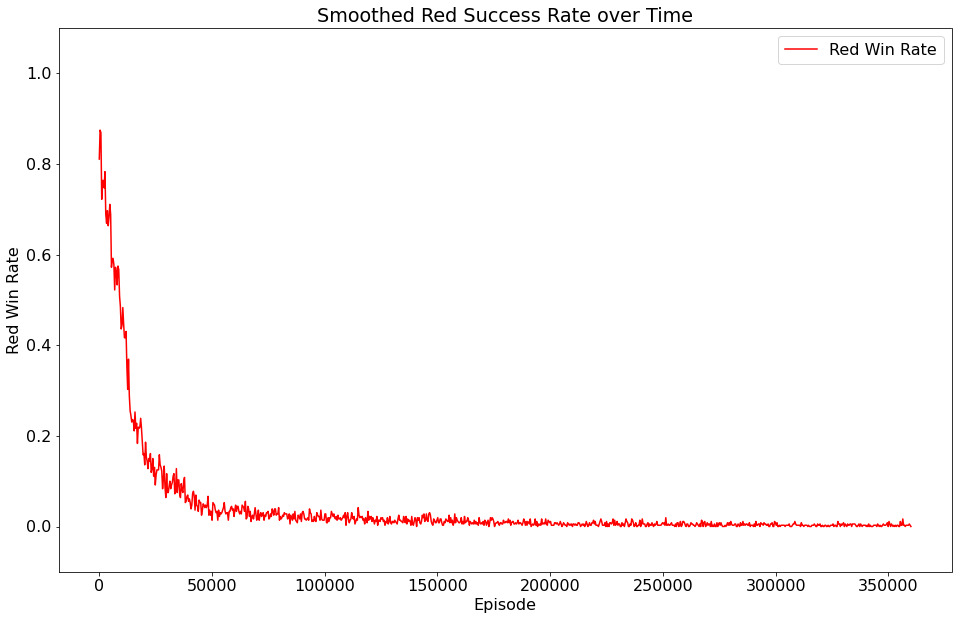

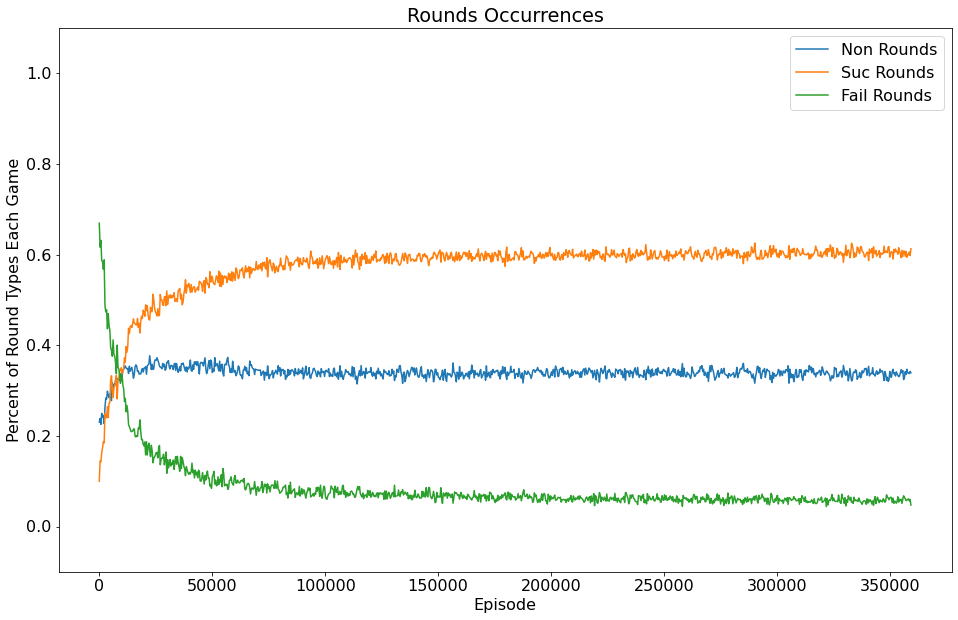

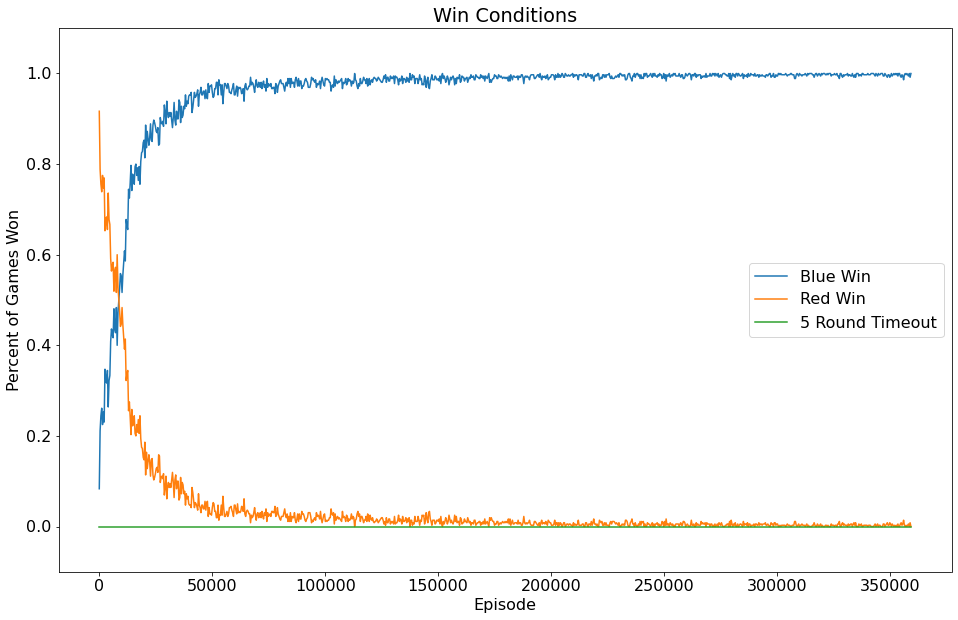

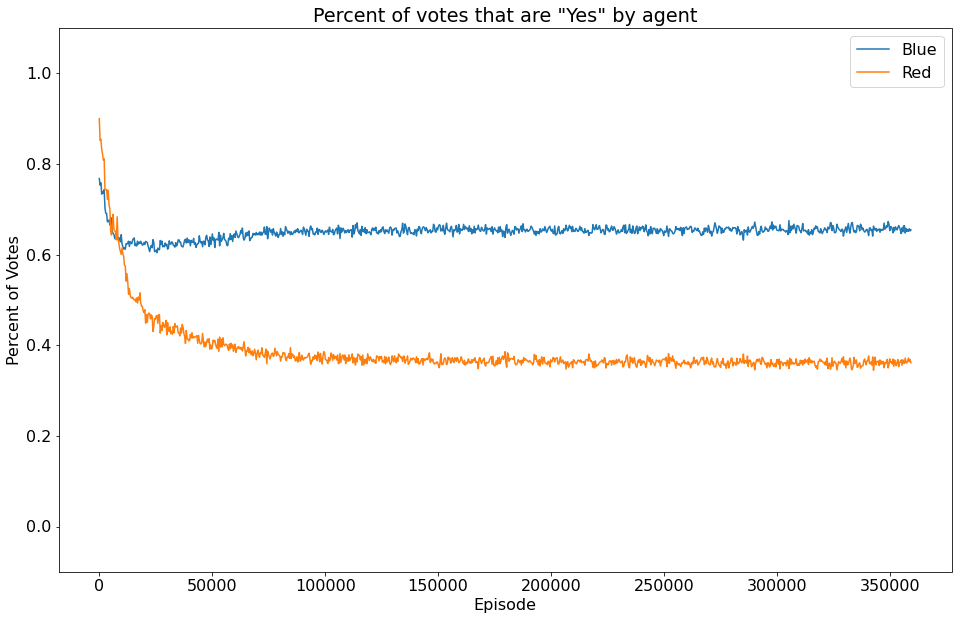

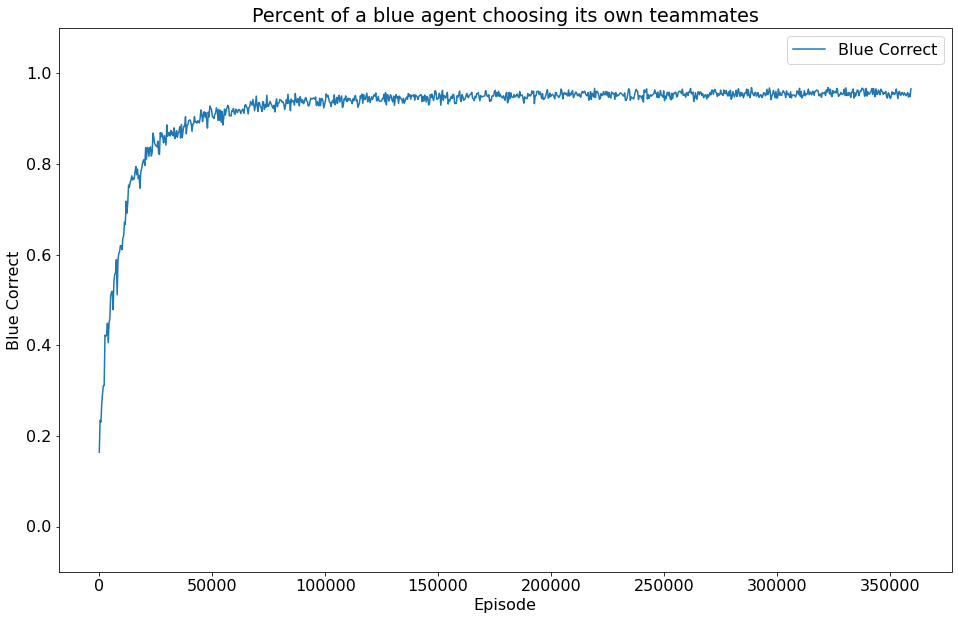

epoch 721 - loss = 0.11049069464206696, last - 2.3841858265427618e-08
epoch 722 - loss = 0.11296752840280533, last - 2.3841858265427618e-08
epoch 723 - loss = 0.11552435904741287, last - 4.768373287333816e-07
epoch 724 - loss = 0.11499375849962234, last - 5.257153134152759e-06
epoch 725 - loss = 0.11520740389823914, last - 5.960464477539063e-08
epoch 726 - loss = 0.11619251221418381, last - 1.3959853276901413e-05
epoch 727 - loss = 0.11375270038843155, last - 2.6345412607042817e-06
epoch 728 - loss = 0.11286726593971252, last - 2.1457682919390209e-07
epoch 729 - loss = 0.10807154327630997, last - 4.7683716530855236e-08
epoch 730 - loss = 0.1130109503865242, last - 1.9073495138854923e-07
epoch 731 - loss = 0.11200747638940811, last - 0.0
epoch 732 - loss = 0.1169503852725029, last - 2.980233091420814e-07
epoch 733 - loss = 0.11394461989402771, last - 2.3841858265427618e-08
epoch 734 - loss = 0.11231673508882523, last - 5.960465188081798e-08
epoch 735 - loss = 0.1164826899766922, last - 

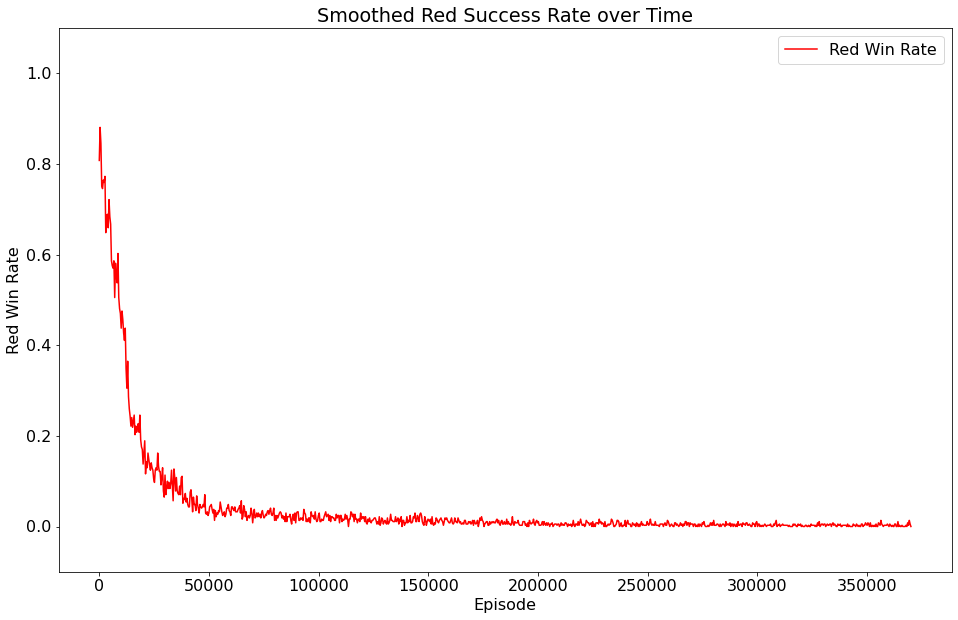

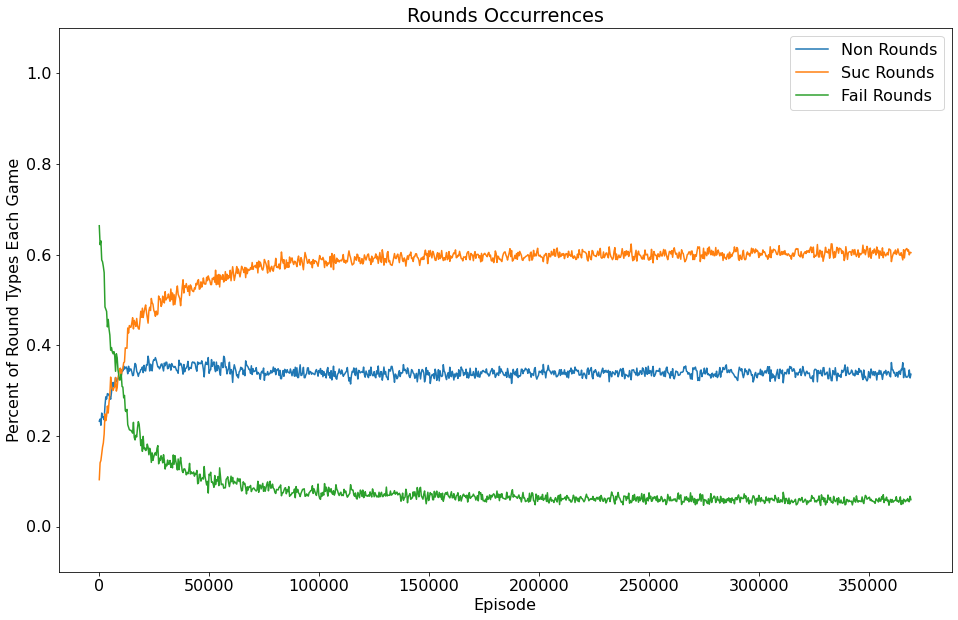

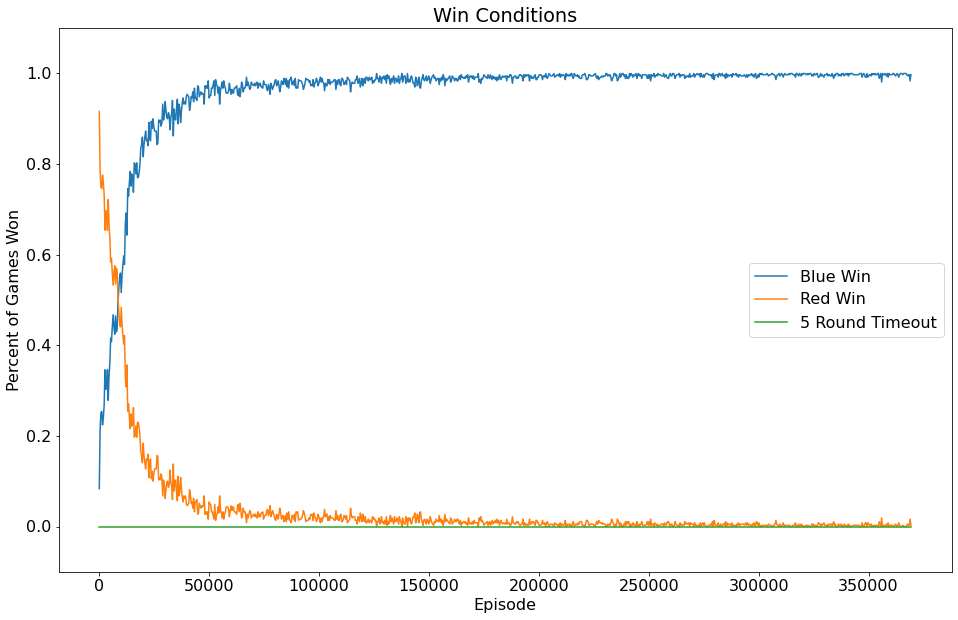

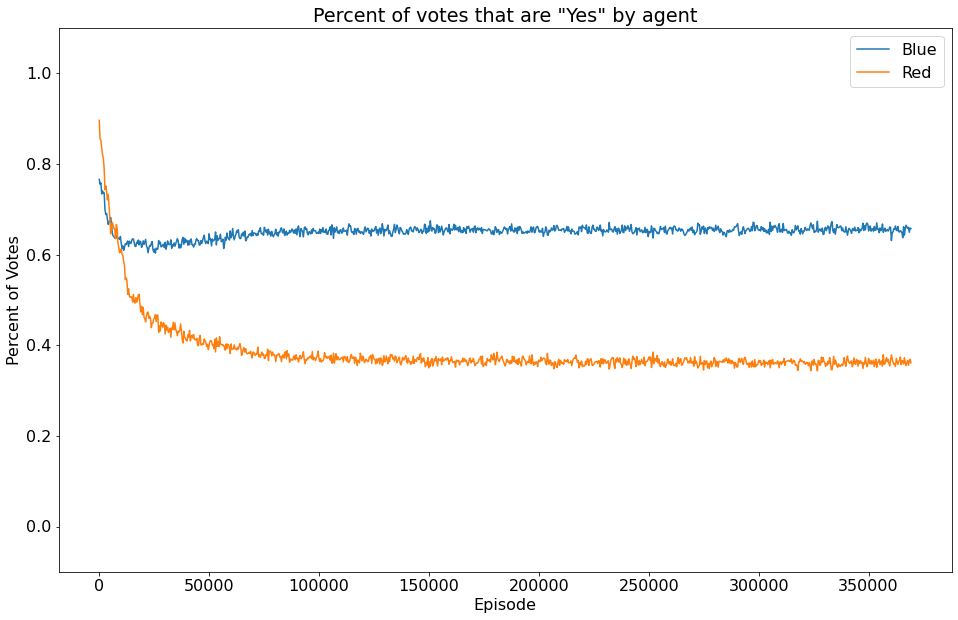

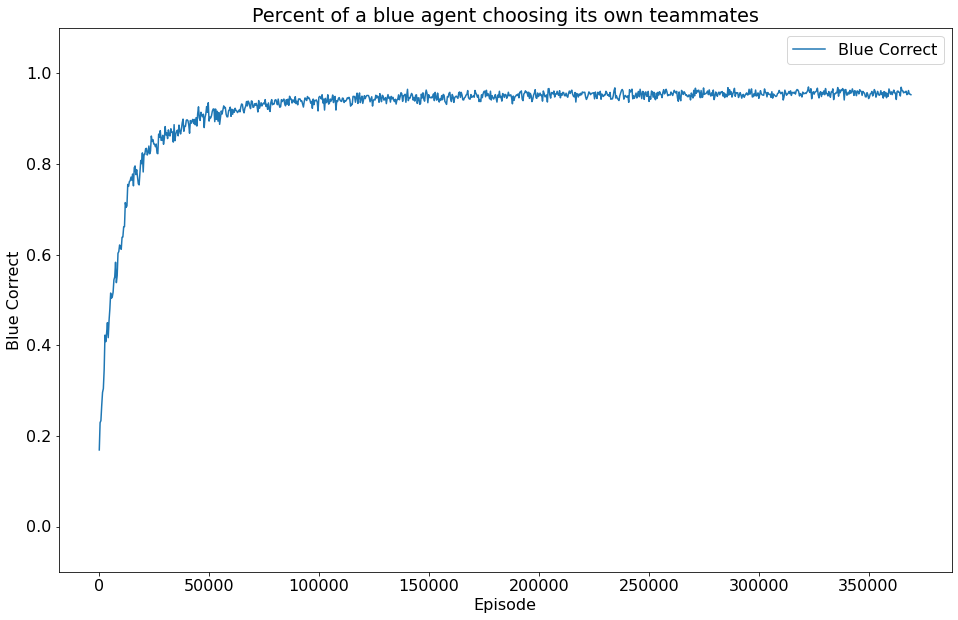

epoch 741 - loss = 0.1152203232049942, last - 2.2292188077699393e-06
epoch 742 - loss = 0.1187010258436203, last - 1.132491433963878e-06
epoch 743 - loss = 0.11378452181816101, last - 1.6808560303616105e-06
epoch 744 - loss = 0.11542199552059174, last - 7.152569878599024e-07
epoch 745 - loss = 0.11520002037286758, last - 0.0
epoch 746 - loss = 0.11584978550672531, last - 4.768377266373136e-07
epoch 747 - loss = 0.11262055486440659, last - 4.7683716530855236e-08
epoch 748 - loss = 0.11370629817247391, last - 1.239778612216469e-06
epoch 749 - loss = 0.11902052164077759, last - 2.3841872121010965e-07
epoch 750 - loss = 0.1160903126001358, last - 1.3828317833031178e-06
epoch 751 - loss = 0.10889440774917603, last - 8.416309356107377e-06
epoch 752 - loss = 0.1092548817396164, last - 1.3113023555888503e-07
epoch 753 - loss = 0.11284139007329941, last - 4.7683720083568915e-08
epoch 754 - loss = 0.11603924632072449, last - 1.621252522454597e-06
epoch 755 - loss = 0.11113426834344864, last - 9.

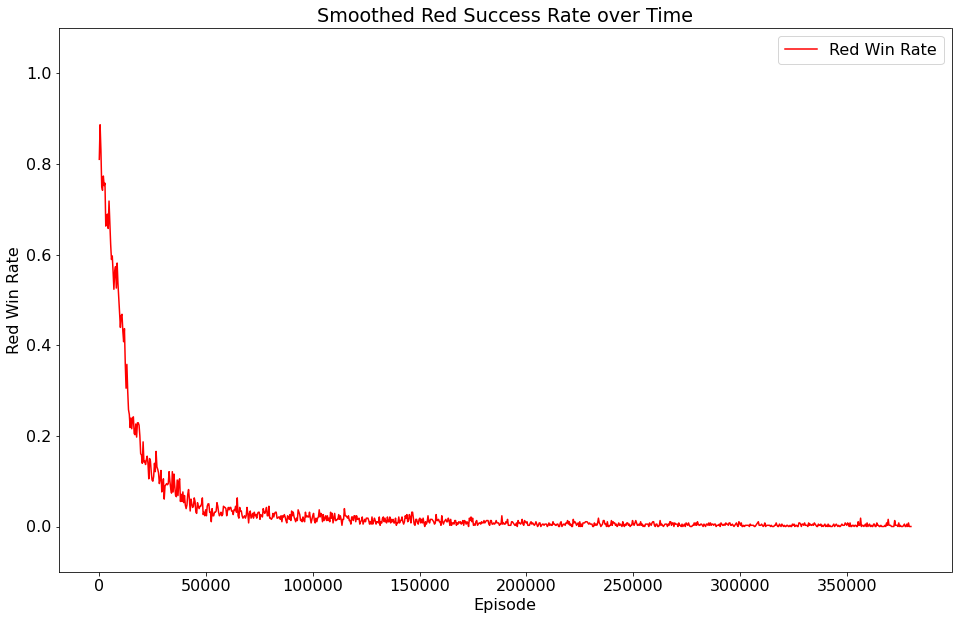

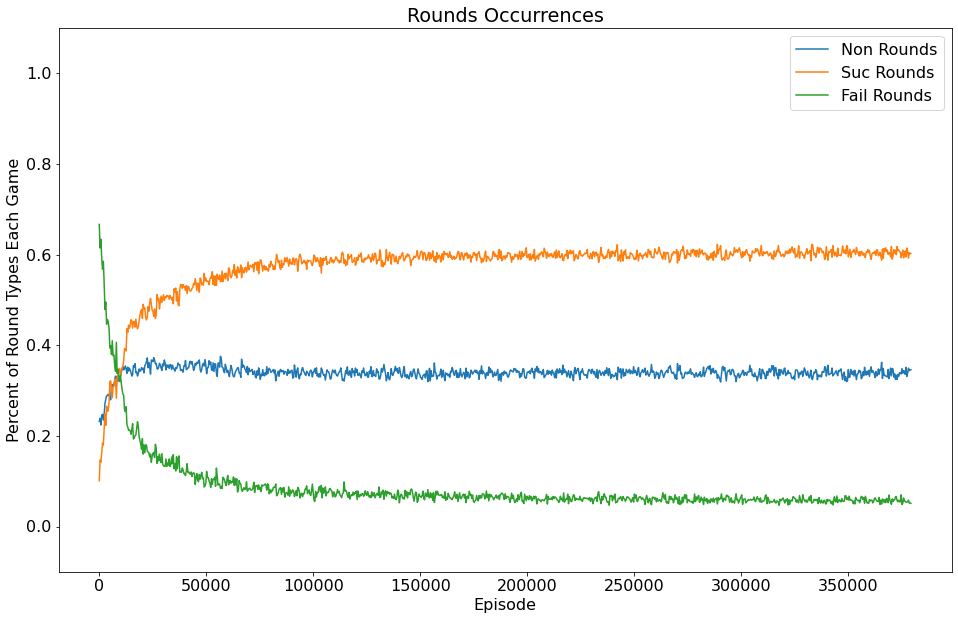

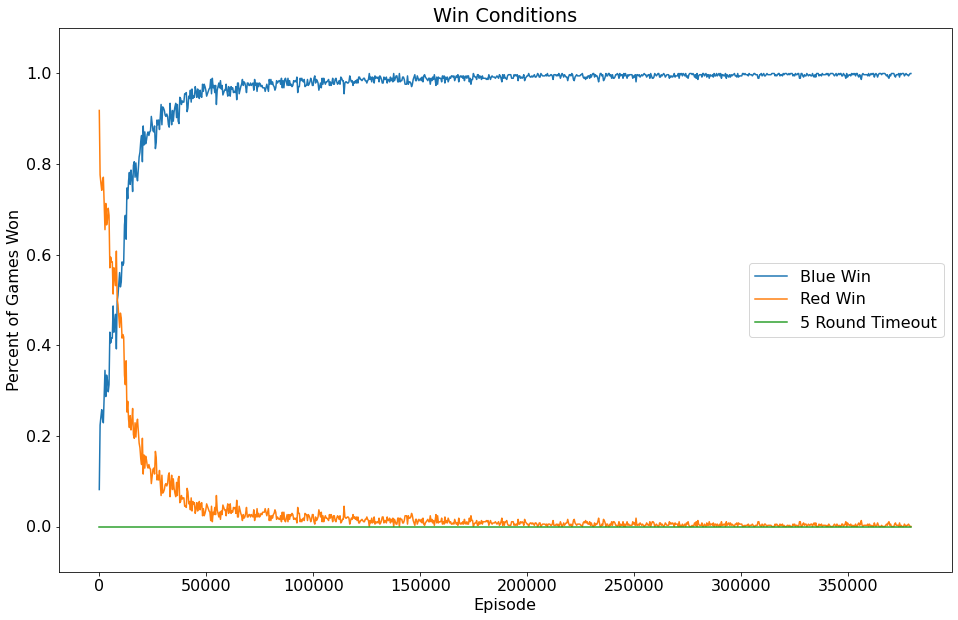

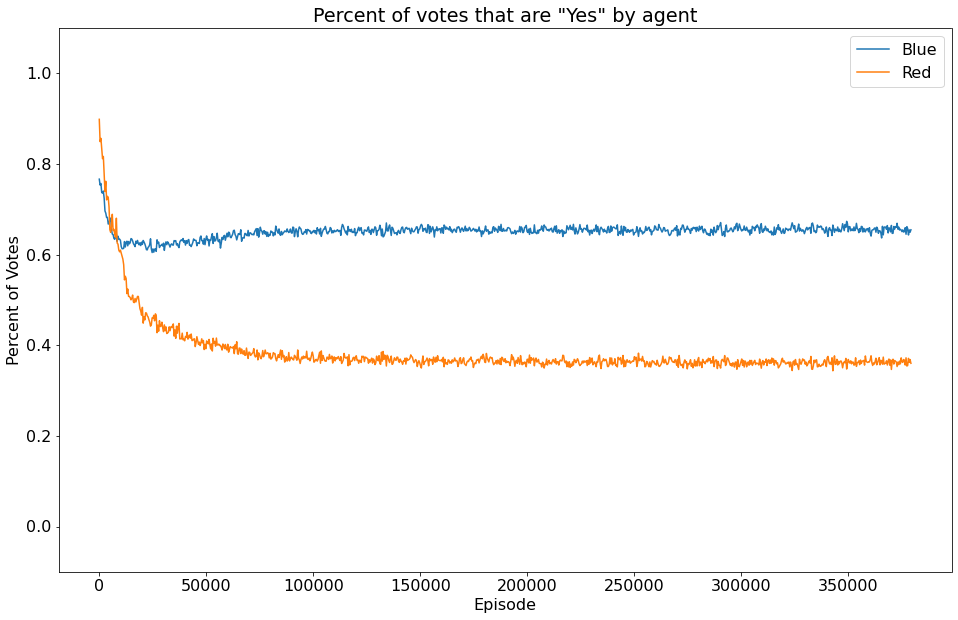

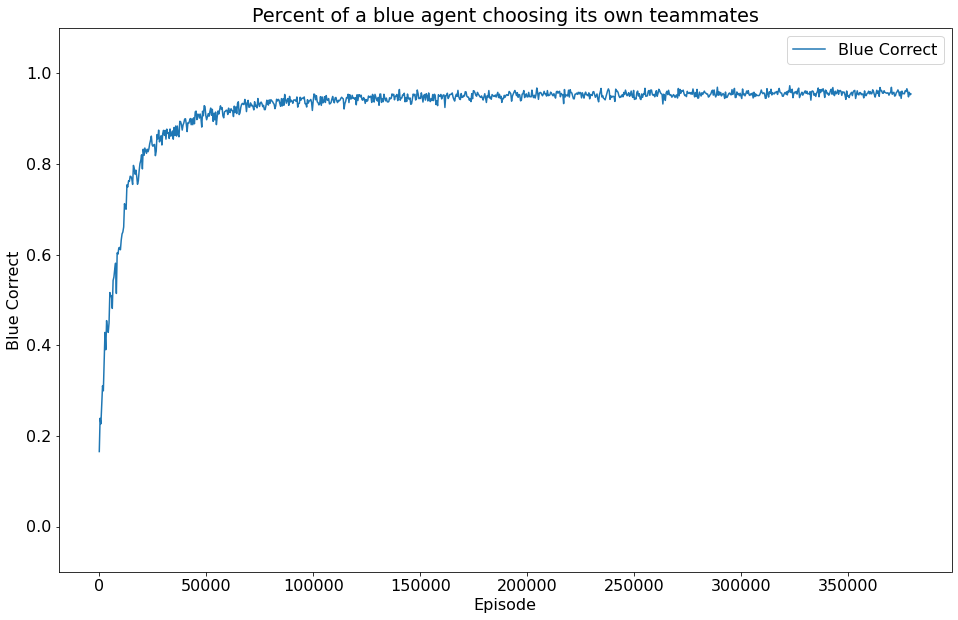

epoch 761 - loss = 0.1120617464184761, last - 9.536745437799254e-08
epoch 762 - loss = 0.11616085469722748, last - 7.152558367806705e-08
epoch 763 - loss = 0.11728297919034958, last - 2.3841957954573445e-06
epoch 764 - loss = 0.11330080032348633, last - 5.543276984099066e-06
epoch 765 - loss = 0.11031186580657959, last - 9.799239705898799e-06
epoch 766 - loss = 0.11637923121452332, last - 4.7445782911381684e-06
epoch 767 - loss = 0.11597096174955368, last - 5.066450285085011e-06
epoch 768 - loss = 0.1093541607260704, last - 5.960465188081798e-08
epoch 769 - loss = 0.11622803658246994, last - 1.1920931797249068e-07
epoch 770 - loss = 0.11390319466590881, last - 4.0531190848014376e-07
epoch 771 - loss = 0.10905769467353821, last - 1.0252016409140197e-06
epoch 772 - loss = 0.1129131093621254, last - 0.0
epoch 773 - loss = 0.11076844483613968, last - 1.6689307358319638e-07
epoch 774 - loss = 0.11409016698598862, last - 4.18427089243778e-06
epoch 775 - loss = 0.11701647937297821, last - 2.3

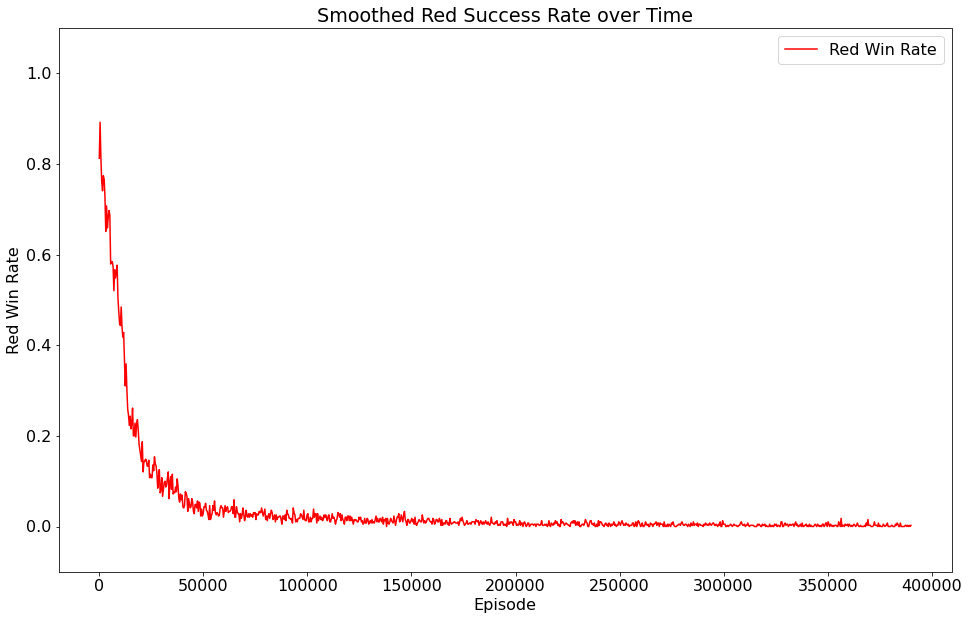

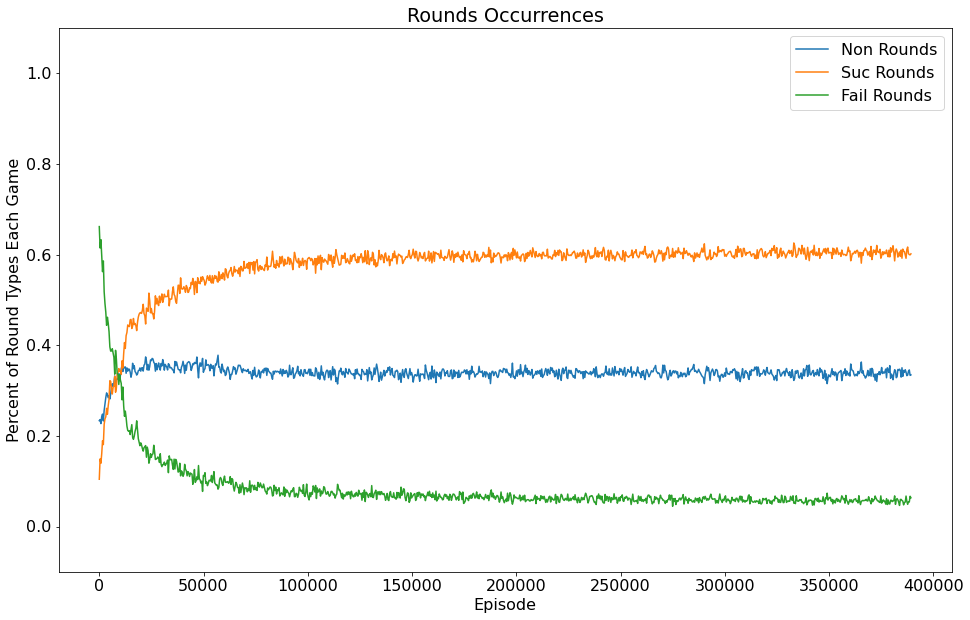

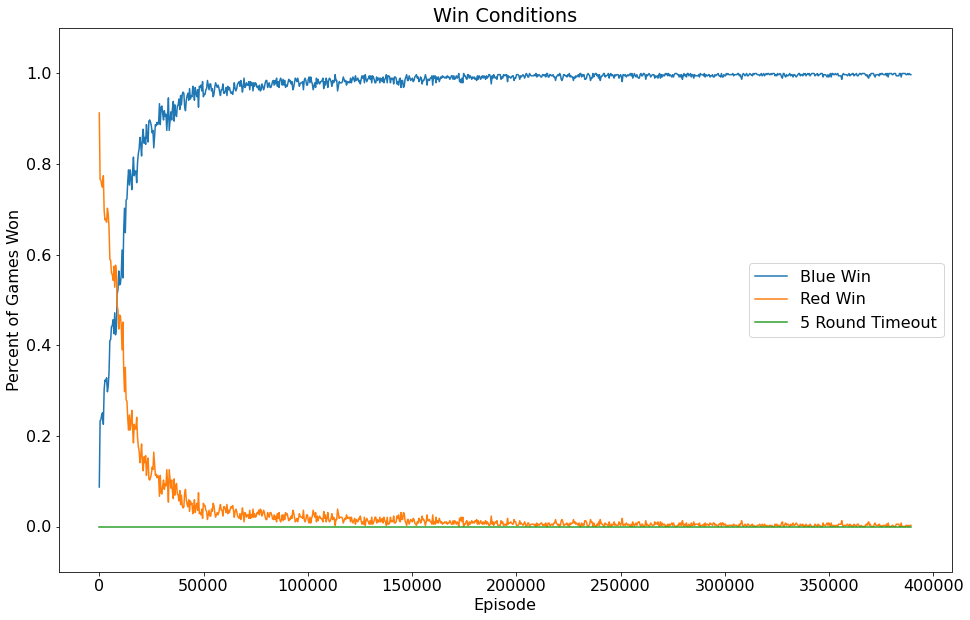

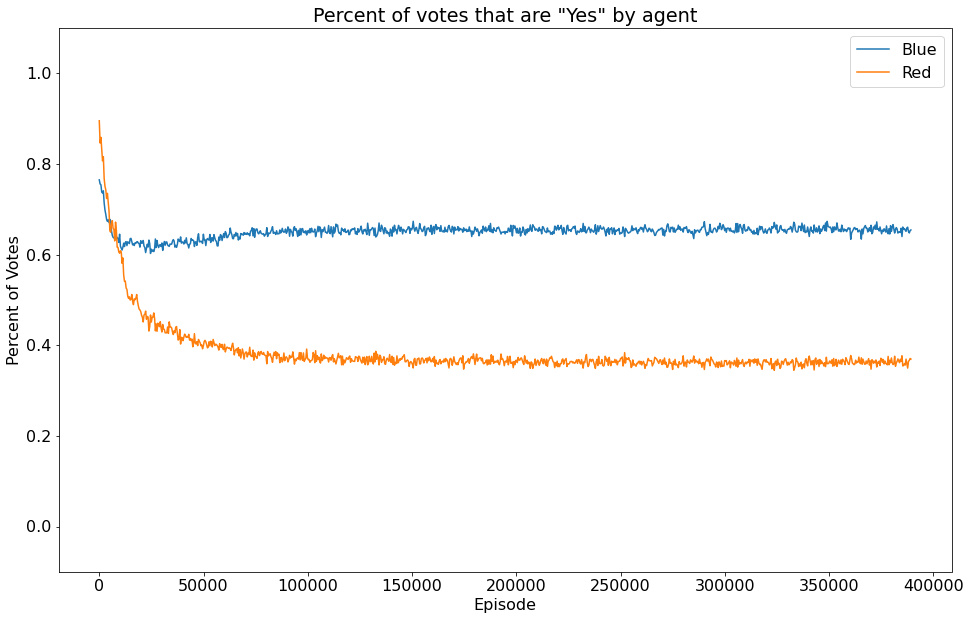

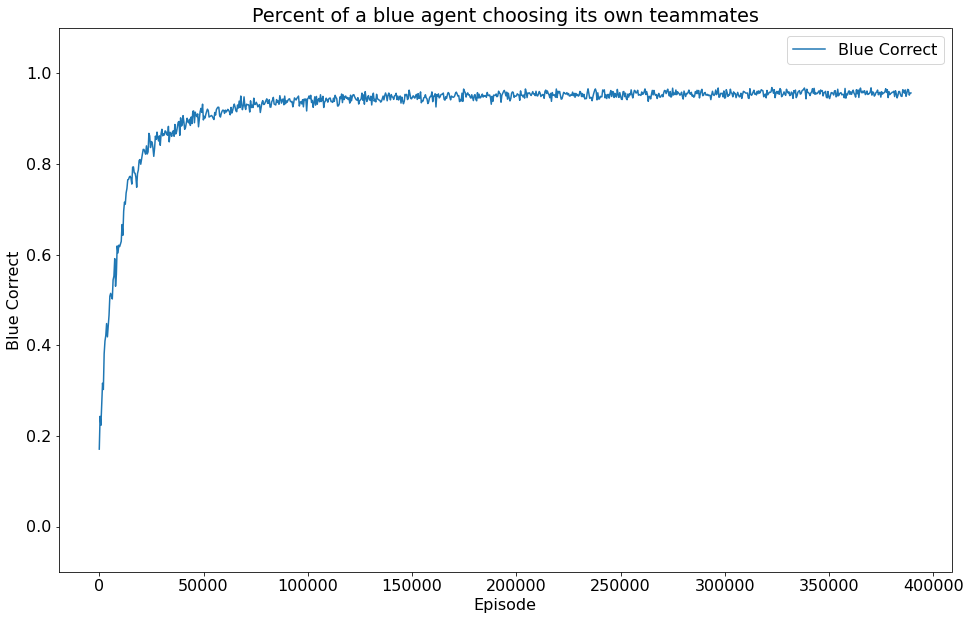

epoch 781 - loss = 0.11306300014257431, last - 2.8610247682081535e-07
epoch 782 - loss = 0.10735766589641571, last - 2.372277322137961e-06
epoch 783 - loss = 0.11143476516008377, last - 2.6226052796118893e-07
epoch 784 - loss = 0.11201945692300797, last - 0.0
epoch 785 - loss = 0.1103721410036087, last - 5.84126325975376e-07
epoch 786 - loss = 0.10964463651180267, last - 3.2425166409666417e-06
epoch 787 - loss = 0.11504624038934708, last - 2.908825445047114e-05
epoch 788 - loss = 0.11521794646978378, last - 2.9325683499337174e-06
epoch 789 - loss = 0.11519235372543335, last - 2.3841858265427618e-08
epoch 790 - loss = 0.11375586688518524, last - 1.2636207884497708e-06
epoch 791 - loss = 0.12151191383600235, last - 2.3841858265427618e-08
epoch 792 - loss = 0.11535818874835968, last - 0.0
epoch 793 - loss = 0.11148983240127563, last - 4.7683720083568915e-08
epoch 794 - loss = 0.11677670478820801, last - 9.536745437799254e-08
epoch 795 - loss = 0.11454211920499802, last - 9.894393997456064

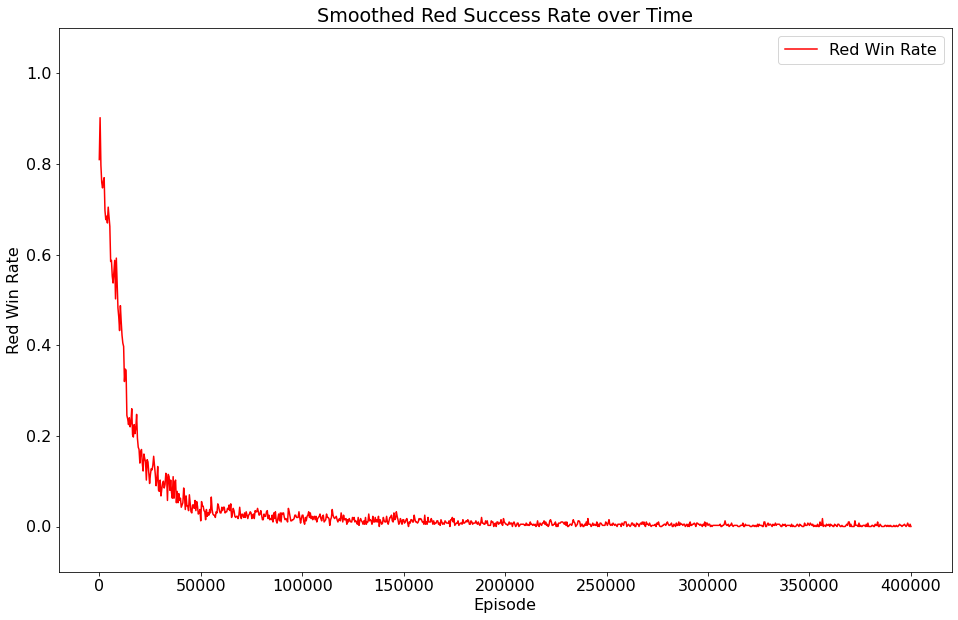

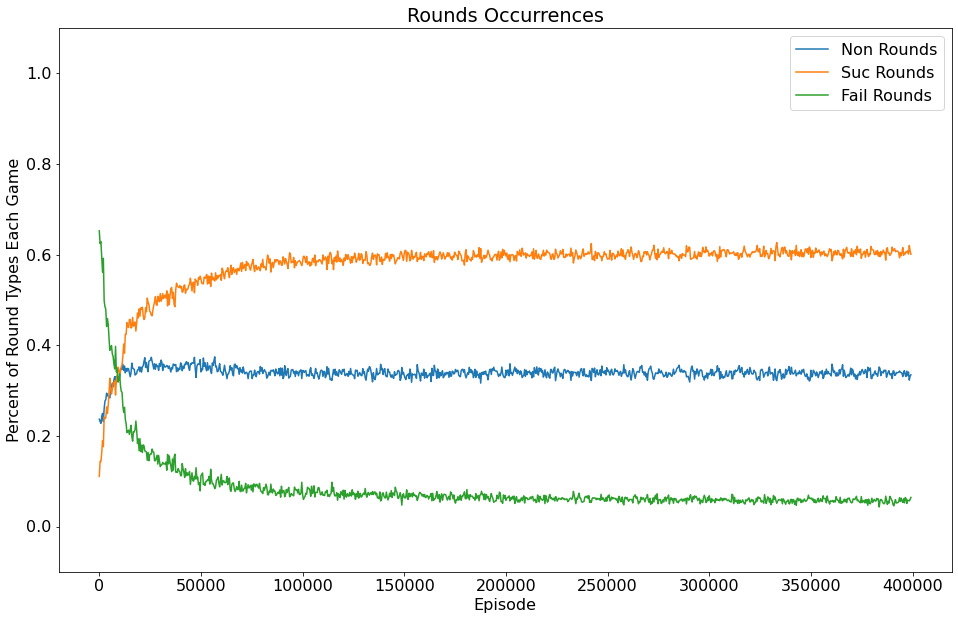

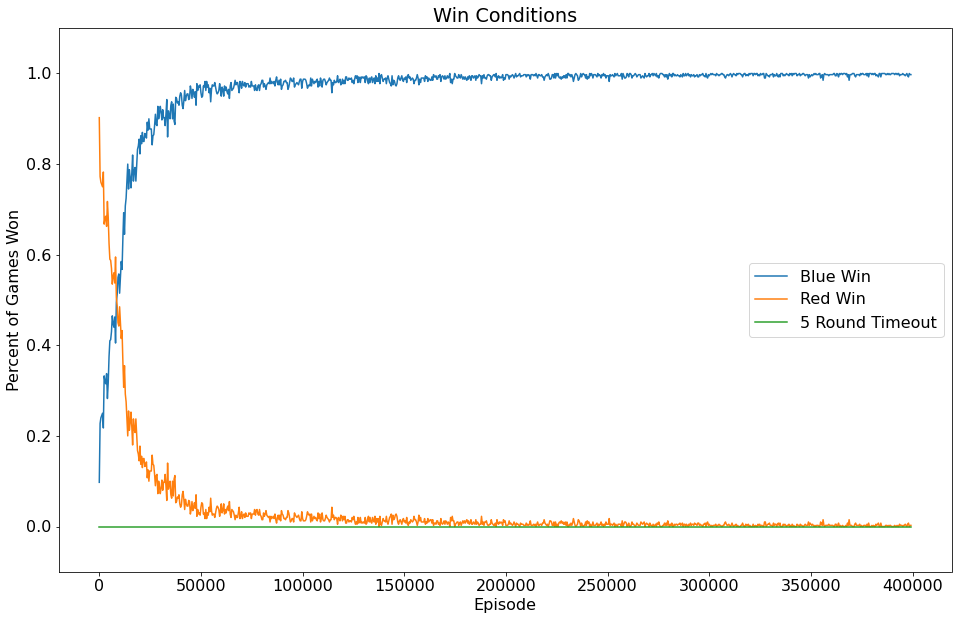

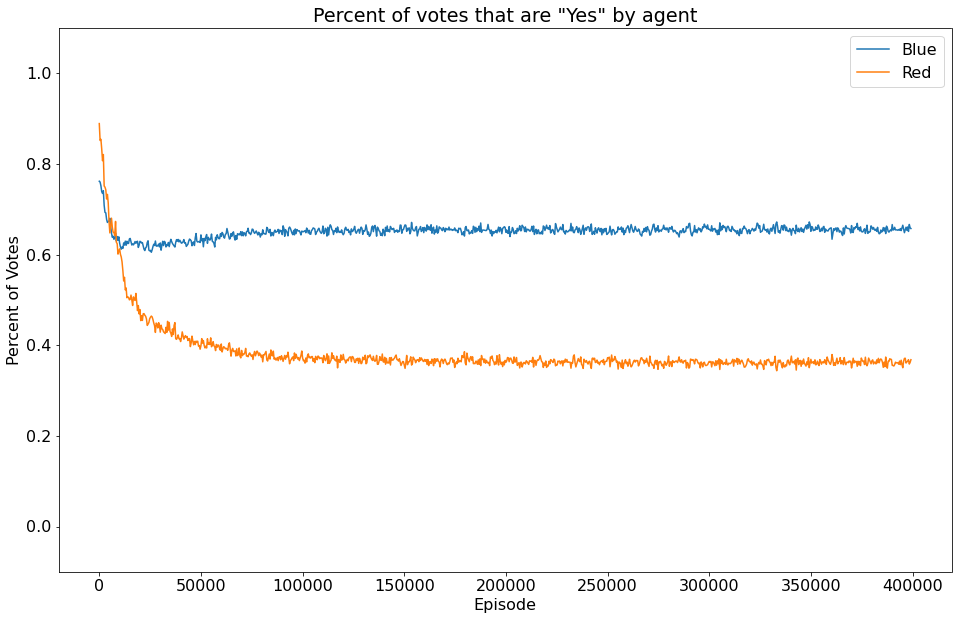

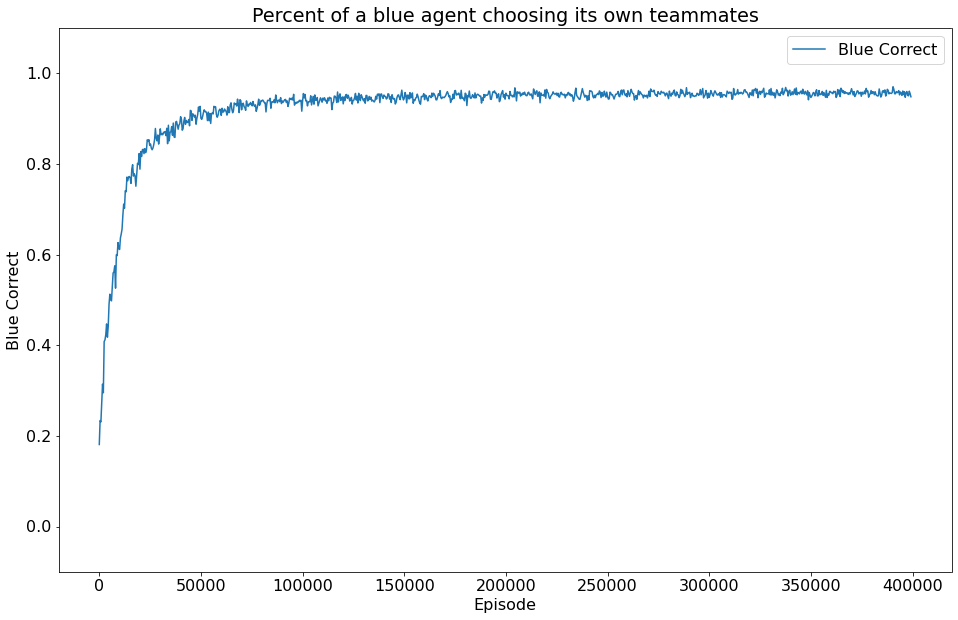

epoch 801 - loss = 0.10929525643587112, last - 0.0
epoch 802 - loss = 0.1177401915192604, last - 1.0502607437956613e-05
epoch 803 - loss = 0.11163704842329025, last - 4.649164964121155e-07
epoch 804 - loss = 0.11744068562984467, last - 5.483634026859363e-07
epoch 805 - loss = 0.11165106296539307, last - 8.714388059161138e-06
epoch 806 - loss = 0.1138777881860733, last - 4.7683716530855236e-08
epoch 807 - loss = 0.11255703866481781, last - 3.099442551501852e-07
epoch 808 - loss = 0.11369481682777405, last - 3.933908772069117e-07
epoch 809 - loss = 0.11466562747955322, last - 0.0
epoch 810 - loss = 0.11052075028419495, last - 1.308959508605767e-05
epoch 811 - loss = 0.11491946876049042, last - 1.4305165905170725e-06
epoch 812 - loss = 0.11303197592496872, last - 4.1477112972643226e-05
epoch 813 - loss = 0.110709547996521, last - 7.629408855791553e-07
epoch 814 - loss = 0.1173829734325409, last - 0.0
epoch 815 - loss = 0.11557380110025406, last - 2.861025052425248e-07
epoch 816 - loss = 0

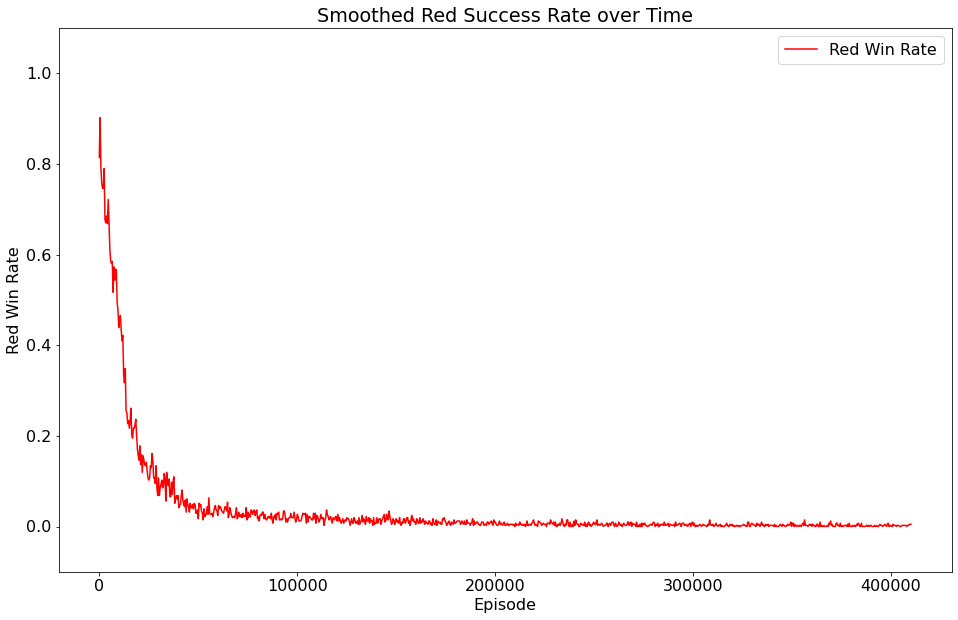

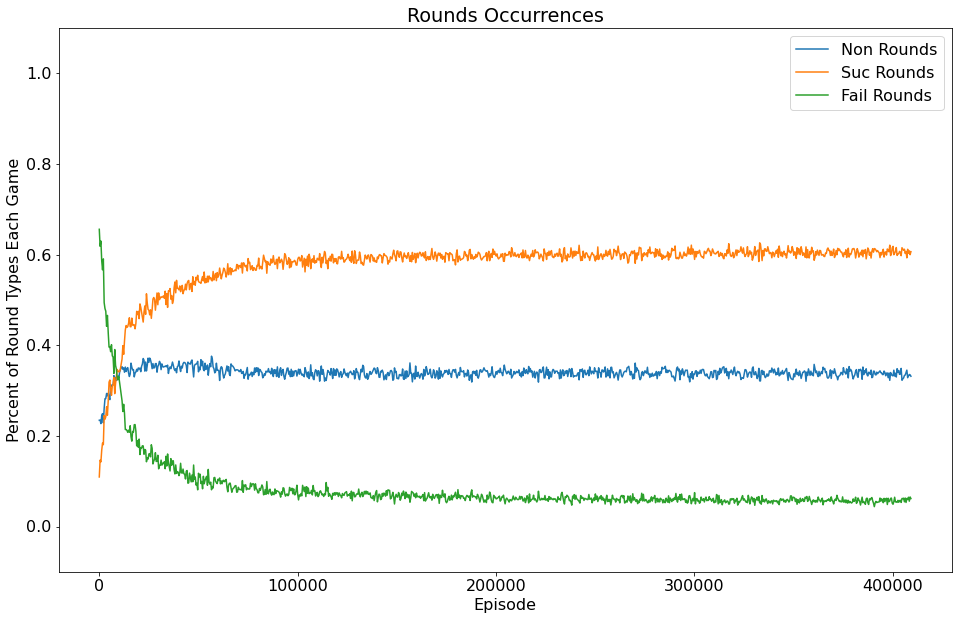

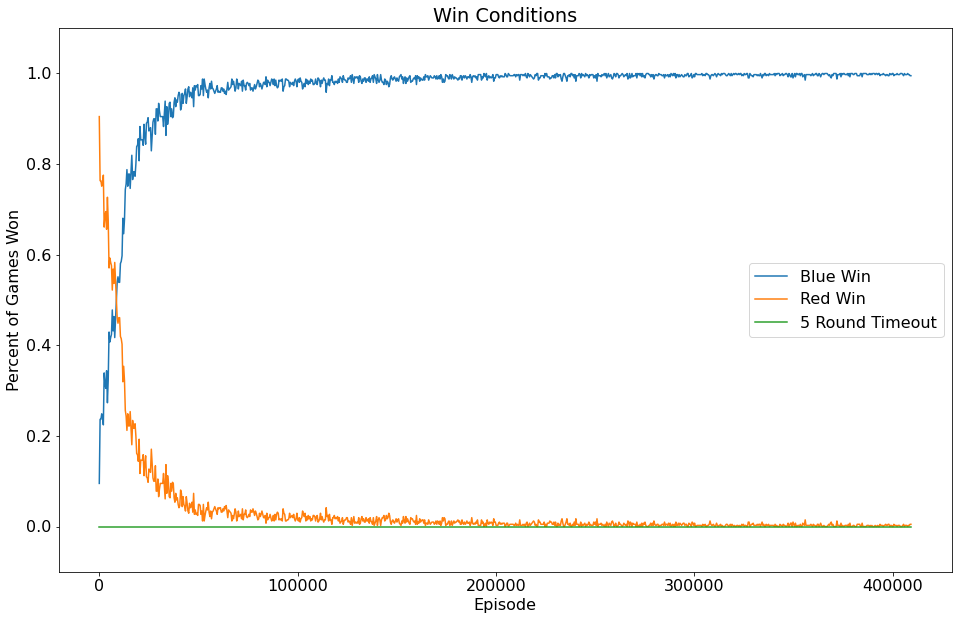

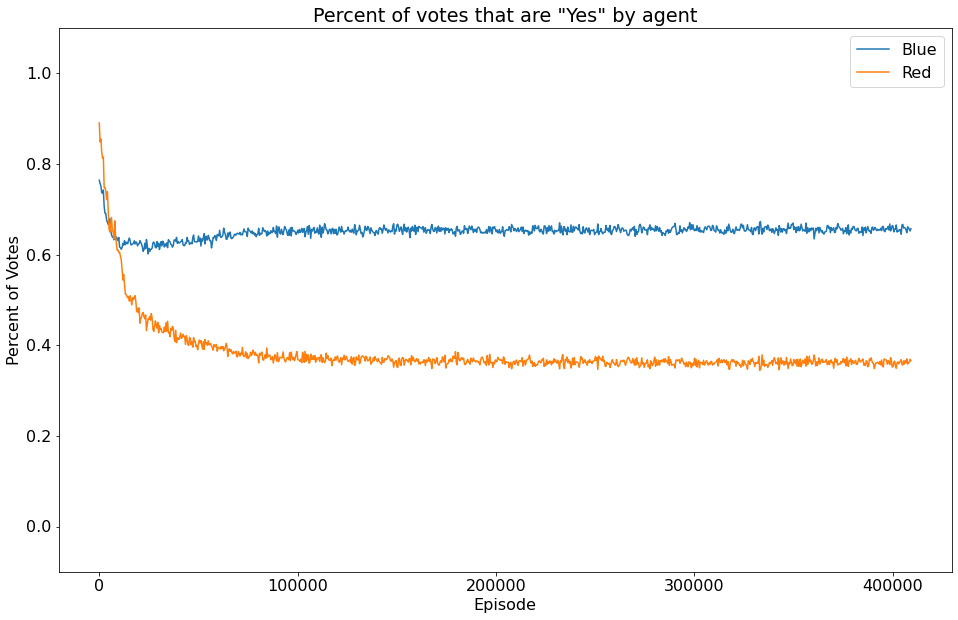

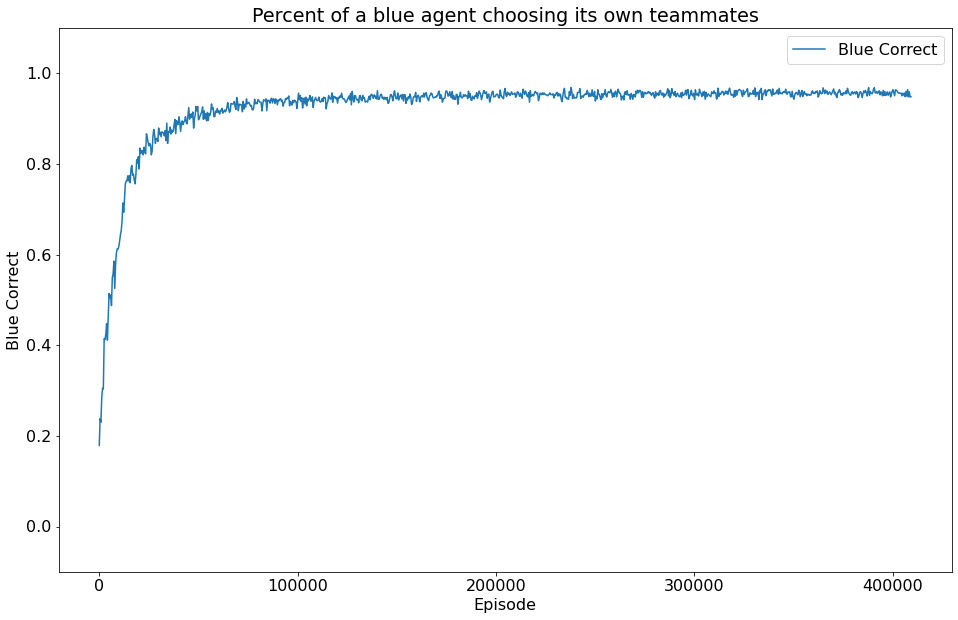

epoch 821 - loss = 0.11397212743759155, last - 3.910101440851577e-06
epoch 822 - loss = 0.115683913230896, last - 3.0994428357189463e-07
epoch 823 - loss = 0.11673995852470398, last - 3.457071500179154e-07
epoch 824 - loss = 0.11295749247074127, last - 7.152557657263969e-08
epoch 825 - loss = 0.11418721079826355, last - 2.3841858265427618e-08
epoch 826 - loss = 0.11013089865446091, last - 2.3841858265427618e-08
epoch 827 - loss = 0.10558896511793137, last - 1.1920931797249068e-07
epoch 828 - loss = 0.11325962841510773, last - 1.907349087559851e-07
epoch 829 - loss = 0.10966210812330246, last - 5.006793344364269e-07
epoch 830 - loss = 0.11745992302894592, last - 0.0
epoch 831 - loss = 0.1184888407588005, last - 4.768376129504759e-07
epoch 832 - loss = 0.11784558743238449, last - 8.805182733340189e-05
epoch 833 - loss = 0.11342157423496246, last - 0.0
epoch 834 - loss = 0.11026062071323395, last - 7.152557657263969e-08
epoch 835 - loss = 0.11581730097532272, last - 0.0
epoch 836 - loss =

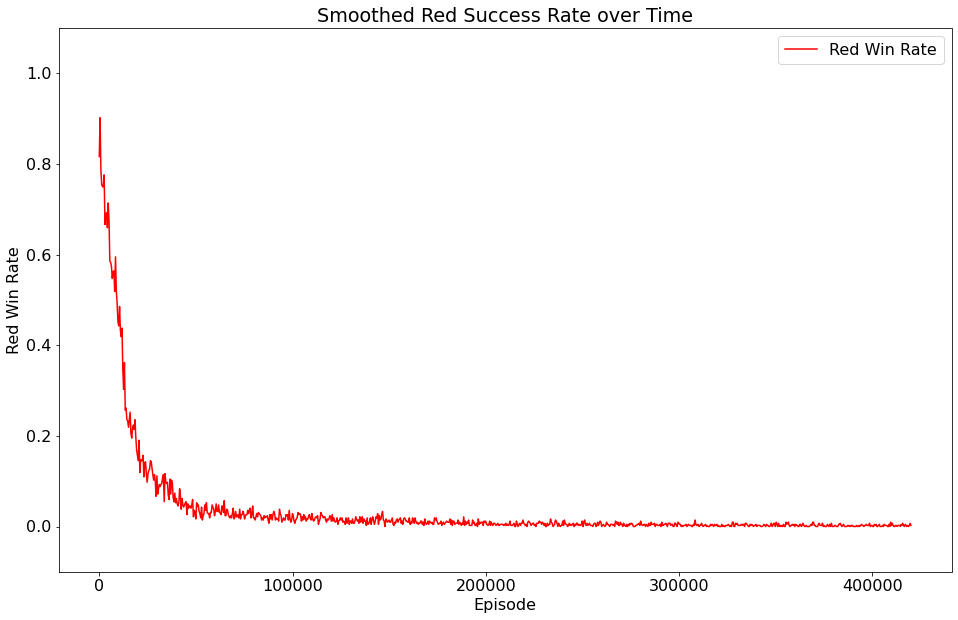

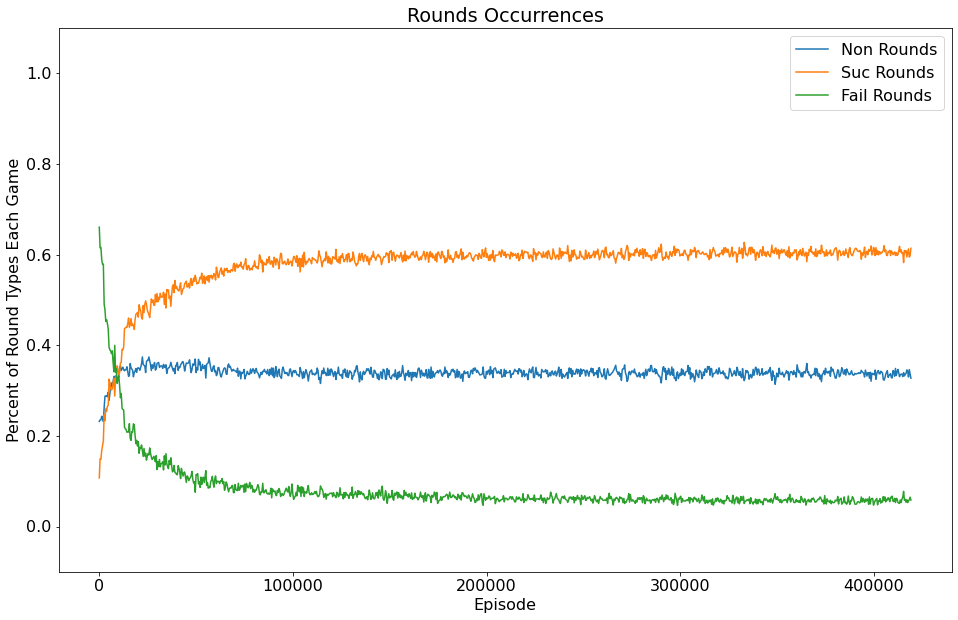

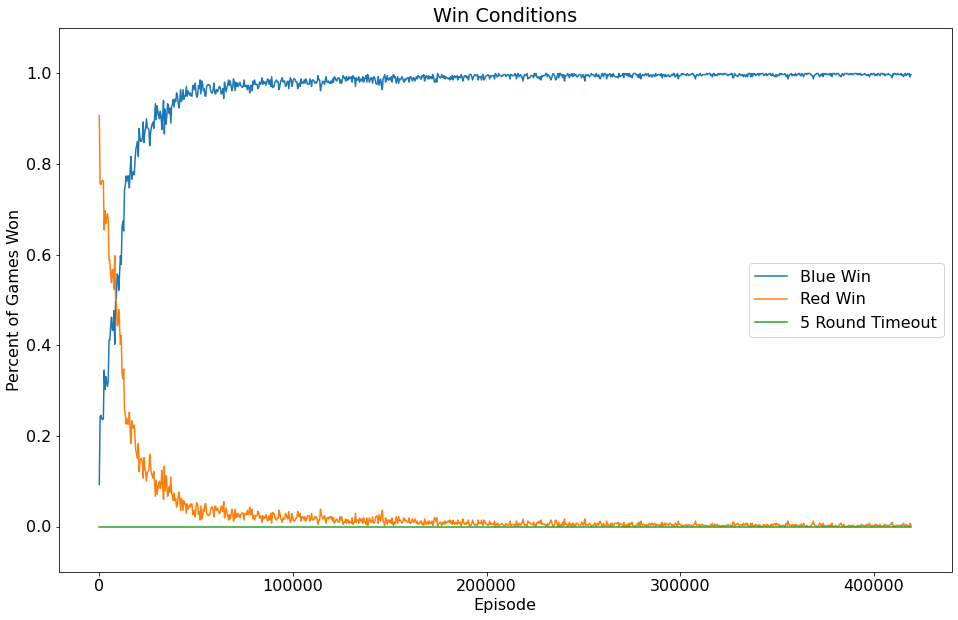

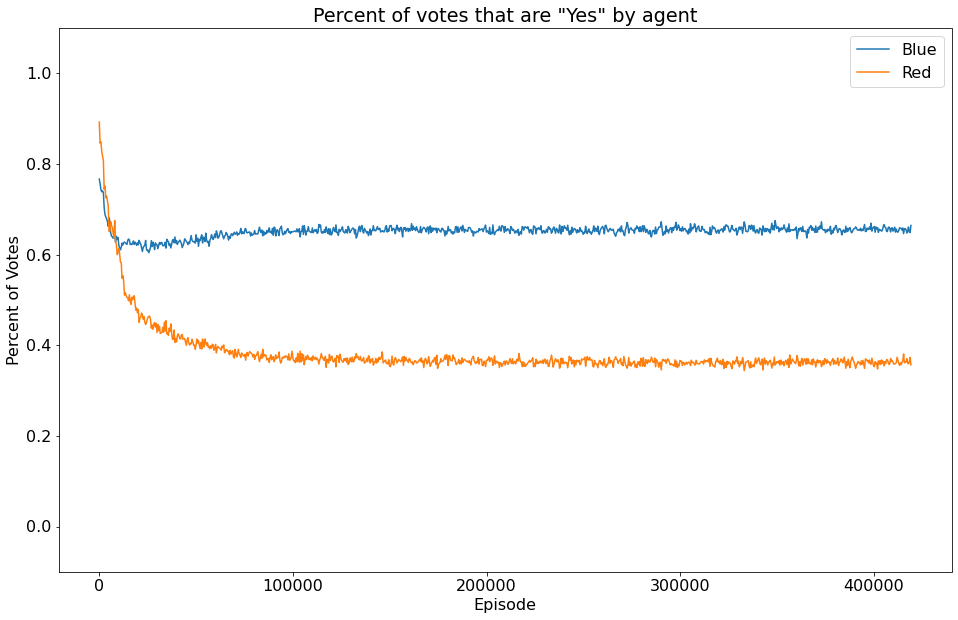

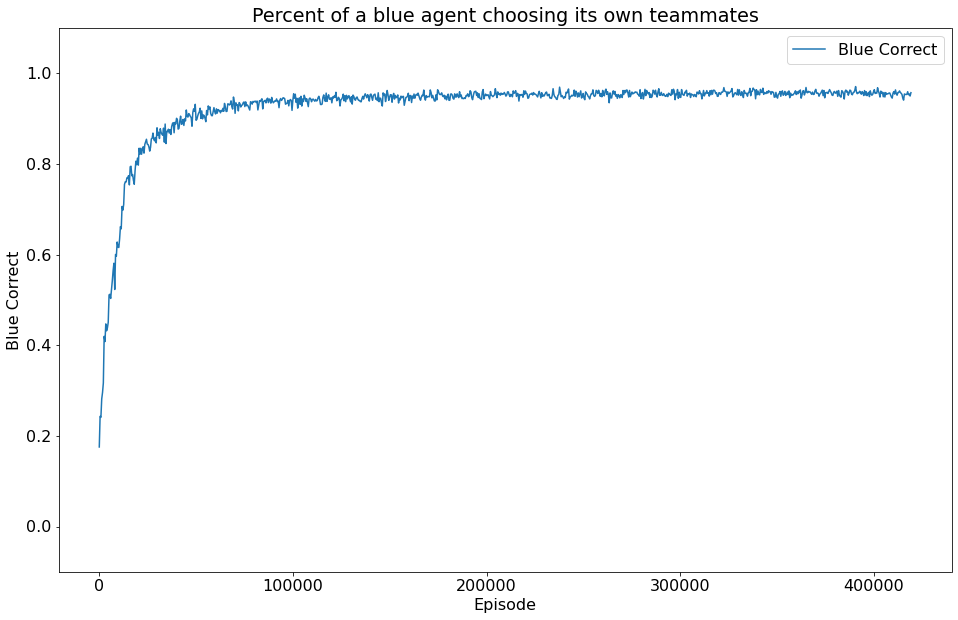

epoch 841 - loss = 0.11227409541606903, last - 0.0
epoch 842 - loss = 0.11256594210863113, last - 2.3841858265427618e-08
epoch 843 - loss = 0.11558448523283005, last - 0.0
epoch 844 - loss = 0.11197815835475922, last - 1.9073493717769452e-07
epoch 845 - loss = 0.11401848495006561, last - 4.7683720083568915e-08
epoch 846 - loss = 0.11326552927494049, last - 4.0531199374527205e-07
epoch 847 - loss = 0.11636939644813538, last - 0.0
epoch 848 - loss = 0.11186099052429199, last - 1.4305118156698882e-07
epoch 849 - loss = 0.11196813732385635, last - 2.3841858265427618e-08
epoch 850 - loss = 0.10930103808641434, last - 2.3841858265427618e-08
epoch 851 - loss = 0.11374589055776596, last - 9.298343002228648e-07
epoch 852 - loss = 0.11257383972406387, last - 4.7683720083568915e-08
epoch 853 - loss = 0.11080043762922287, last - 7.510194564019912e-07
epoch 854 - loss = 0.11520025879144669, last - 4.5299574935597775e-07
epoch 855 - loss = 0.11253561079502106, last - 0.0
epoch 856 - loss = 0.1134584

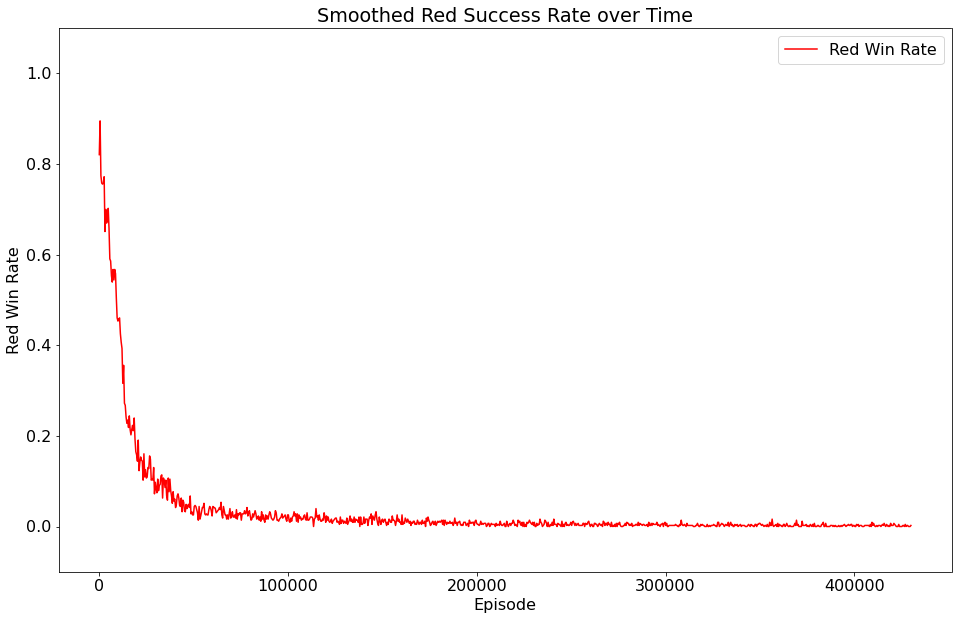

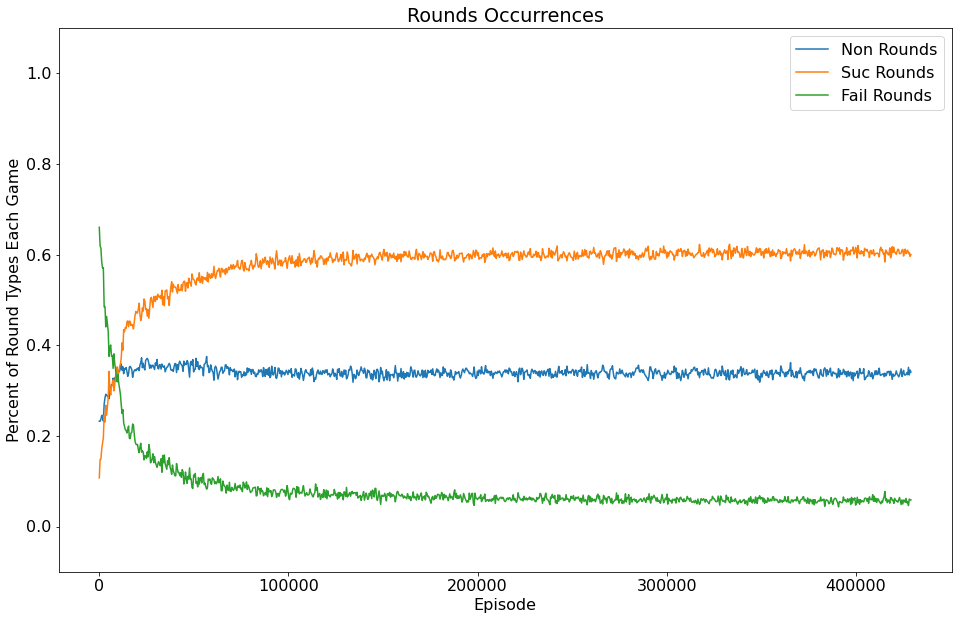

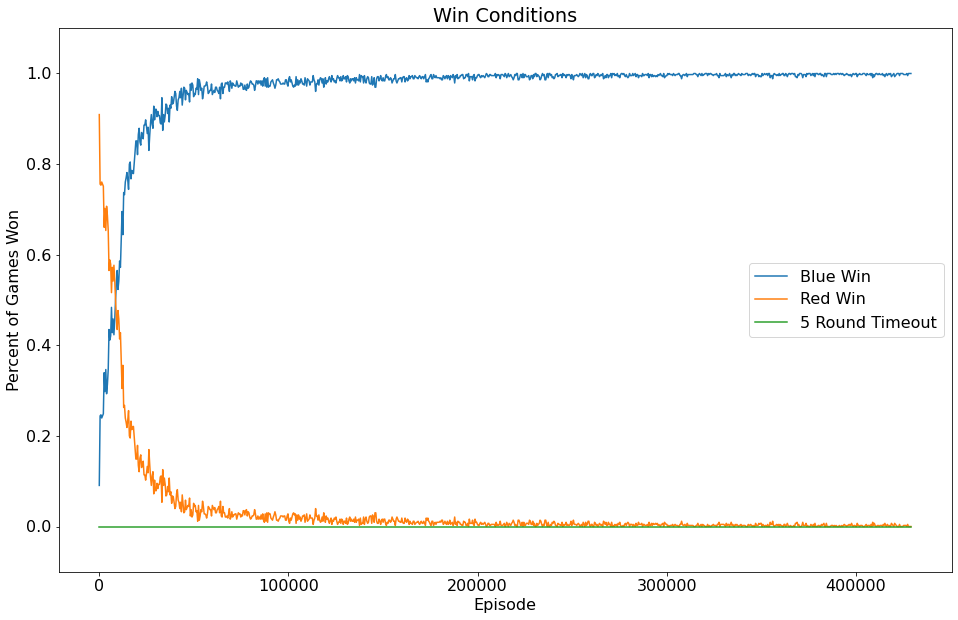

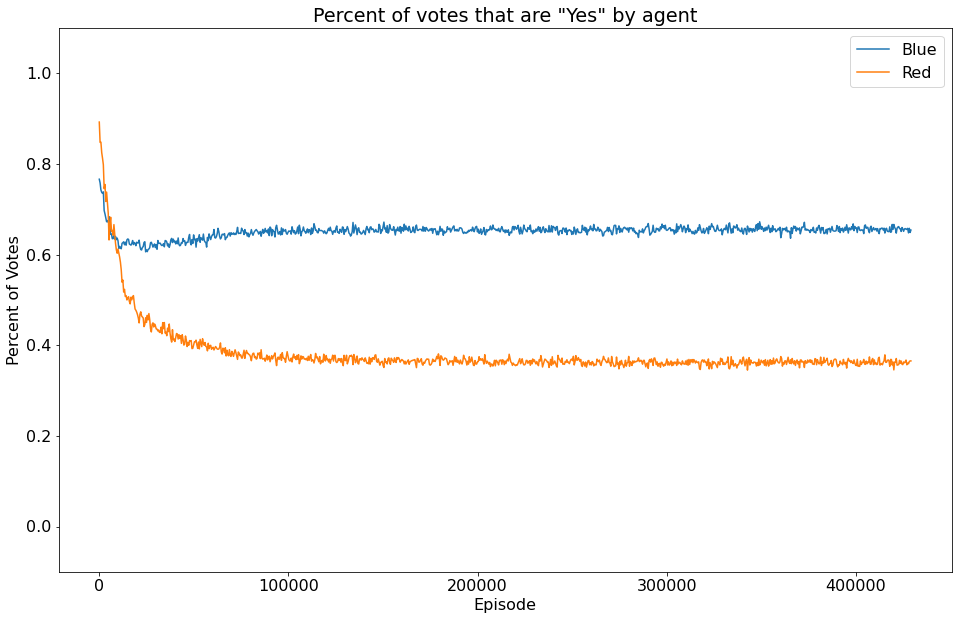

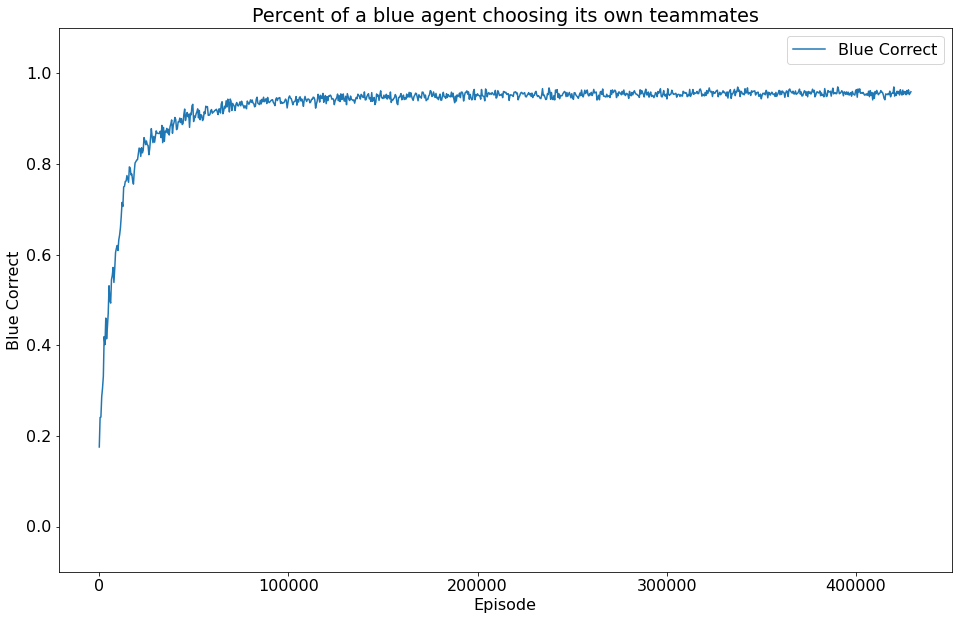

epoch 861 - loss = 0.1125454381108284, last - 9.536744016713783e-08
epoch 862 - loss = 0.1148456409573555, last - 0.0
epoch 863 - loss = 0.11143775284290314, last - 4.7683720083568915e-08
epoch 864 - loss = 0.11532669514417648, last - 4.7683720083568915e-08
epoch 865 - loss = 0.11217697709798813, last - 2.3841858265427618e-08
epoch 866 - loss = 0.11486022174358368, last - 1.1920931797249068e-07
epoch 867 - loss = 0.11194239556789398, last - 3.910102350346278e-06
epoch 868 - loss = 0.1121138483285904, last - 4.0531199374527205e-07
epoch 869 - loss = 0.11179342120885849, last - 2.3841872121010965e-07
epoch 870 - loss = 0.11364690959453583, last - 7.987035246515006e-07
epoch 871 - loss = 0.10976167023181915, last - 4.7683720083568915e-08
epoch 872 - loss = 0.11612055450677872, last - 2.586848268038011e-06
epoch 873 - loss = 0.11746366322040558, last - 3.0994439725873235e-07
epoch 874 - loss = 0.11029808968305588, last - 1.370911490994331e-06
epoch 875 - loss = 0.1159541979432106, last - 9

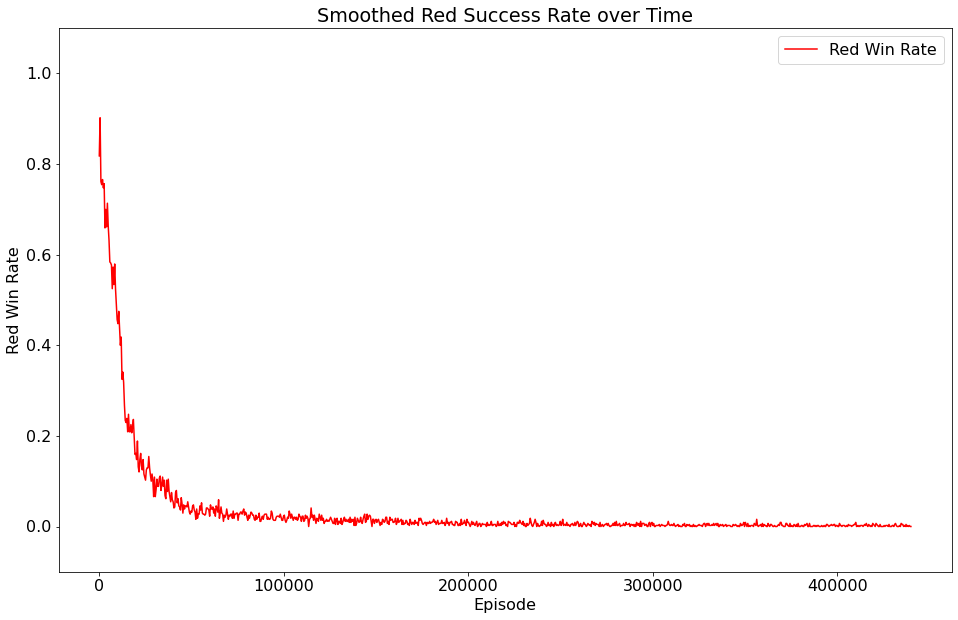

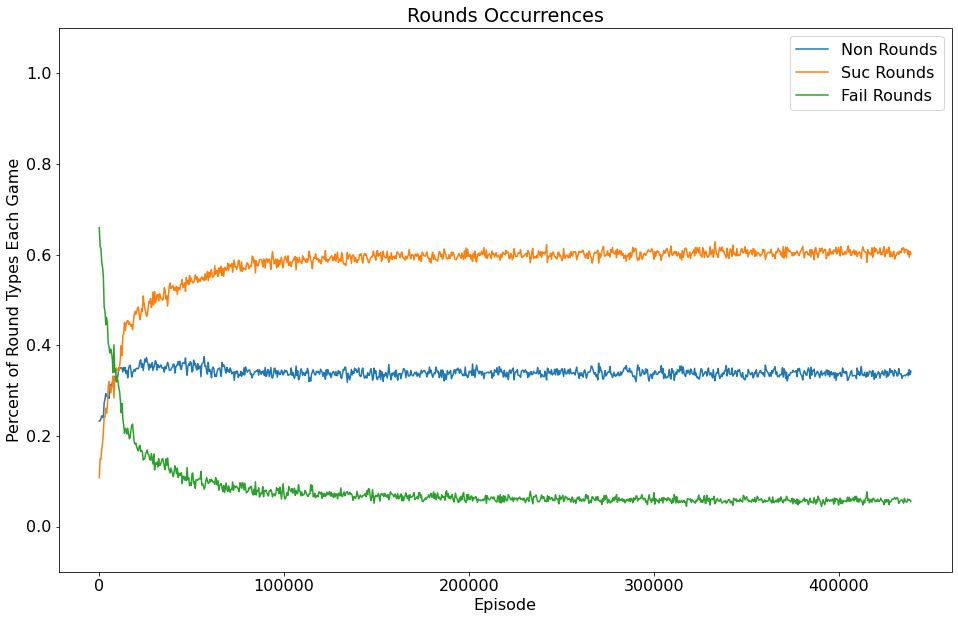

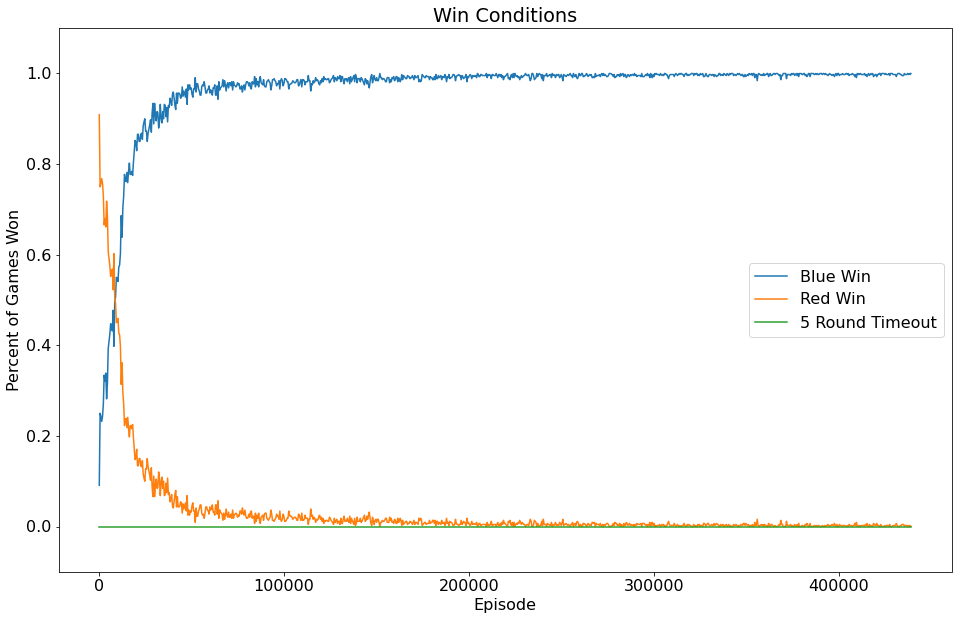

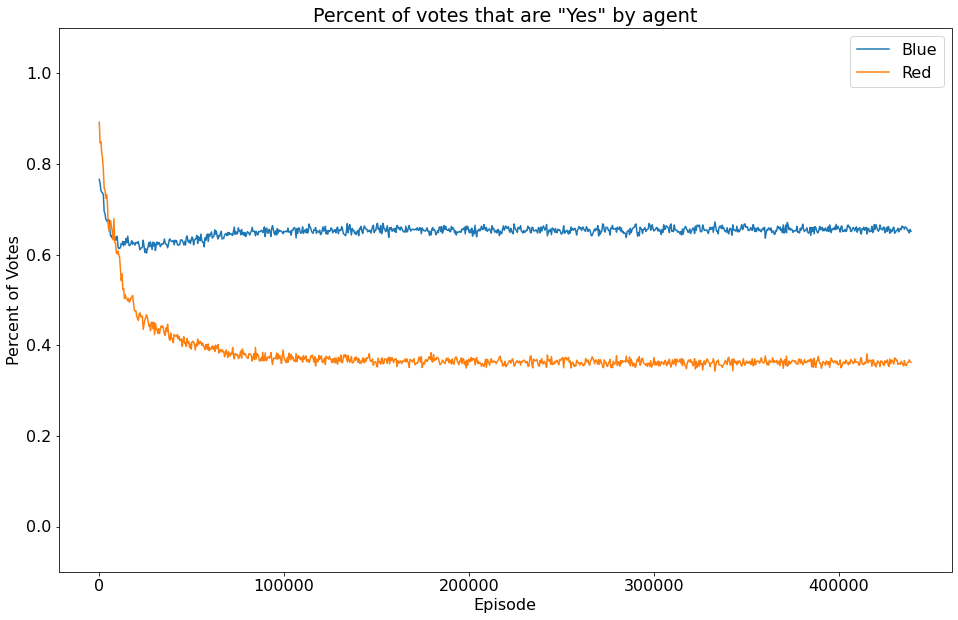

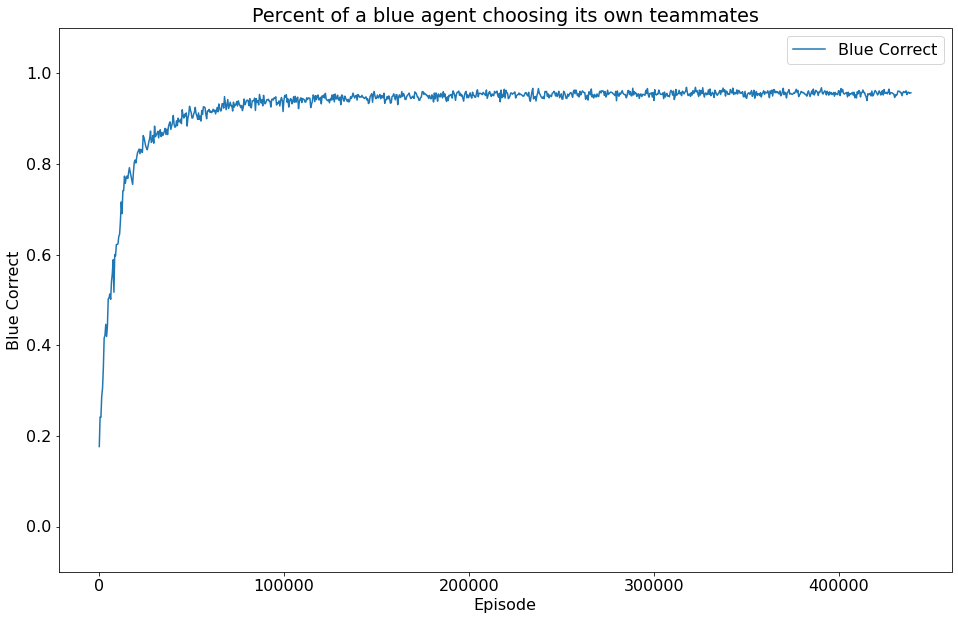

epoch 881 - loss = 0.11563724279403687, last - 2.6226055638289836e-07
epoch 882 - loss = 0.11189349740743637, last - 2.3841926122258883e-06
epoch 883 - loss = 0.1093379557132721, last - 3.099443404153135e-07
epoch 884 - loss = 0.11324165016412735, last - 2.2173046545503894e-06
epoch 885 - loss = 0.11487213522195816, last - 2.8610239155568706e-07
epoch 886 - loss = 0.11489317566156387, last - 0.0
epoch 887 - loss = 0.11795118451118469, last - 9.536745437799254e-08
epoch 888 - loss = 0.11219083517789841, last - 1.1920931797249068e-07
epoch 889 - loss = 0.11322072893381119, last - 2.980233659855003e-07
epoch 890 - loss = 0.11140863597393036, last - 3.0994428357189463e-07
epoch 891 - loss = 0.1175144612789154, last - 2.3841858265427618e-08
epoch 892 - loss = 0.11097574234008789, last - 4.7683716530855236e-08
epoch 893 - loss = 0.11461592465639114, last - 1.4305118156698882e-07
epoch 894 - loss = 0.1136668473482132, last - 5.674442490999354e-06
epoch 895 - loss = 0.11086491495370865, last -

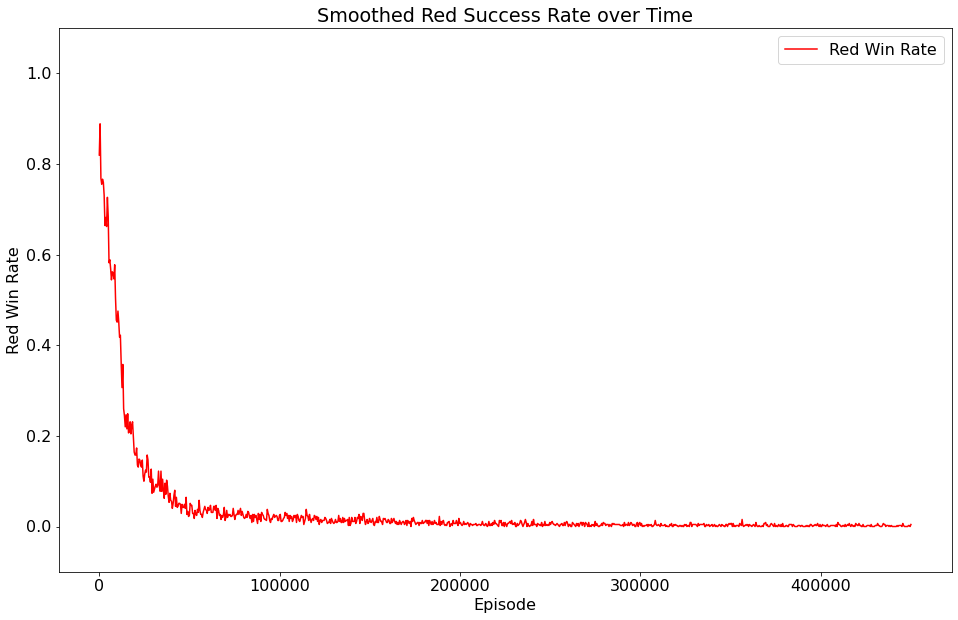

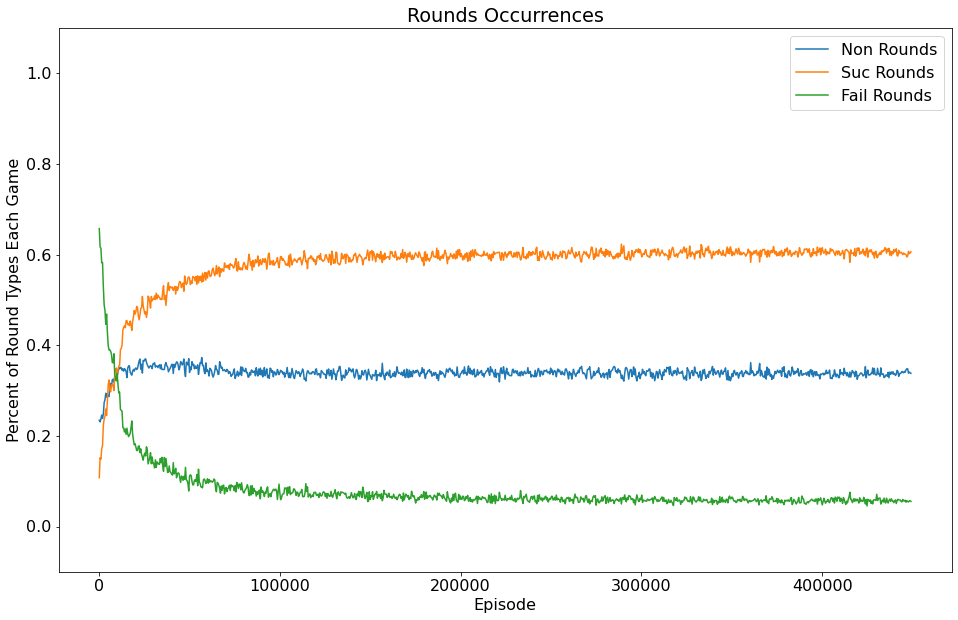

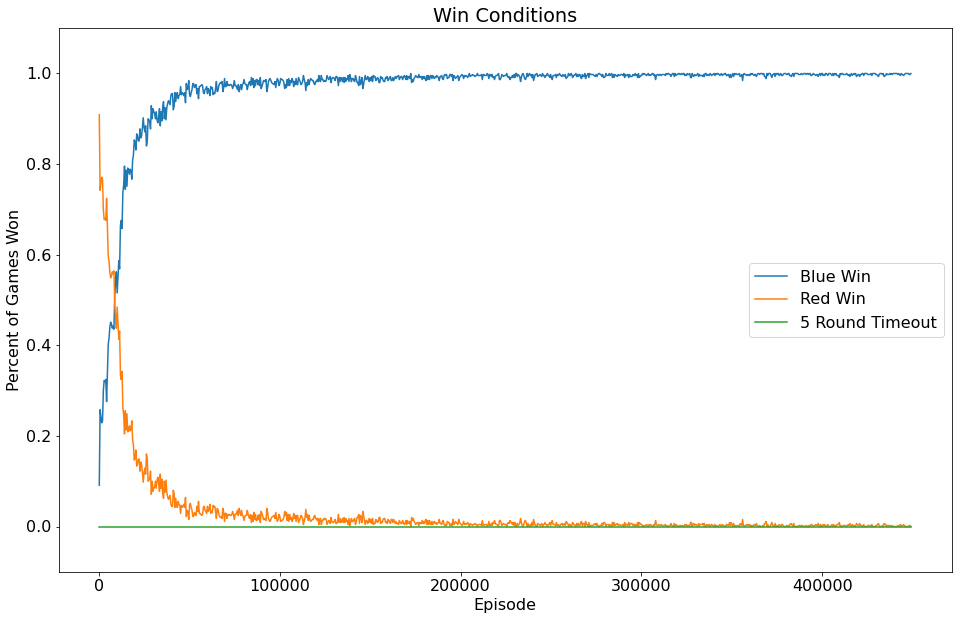

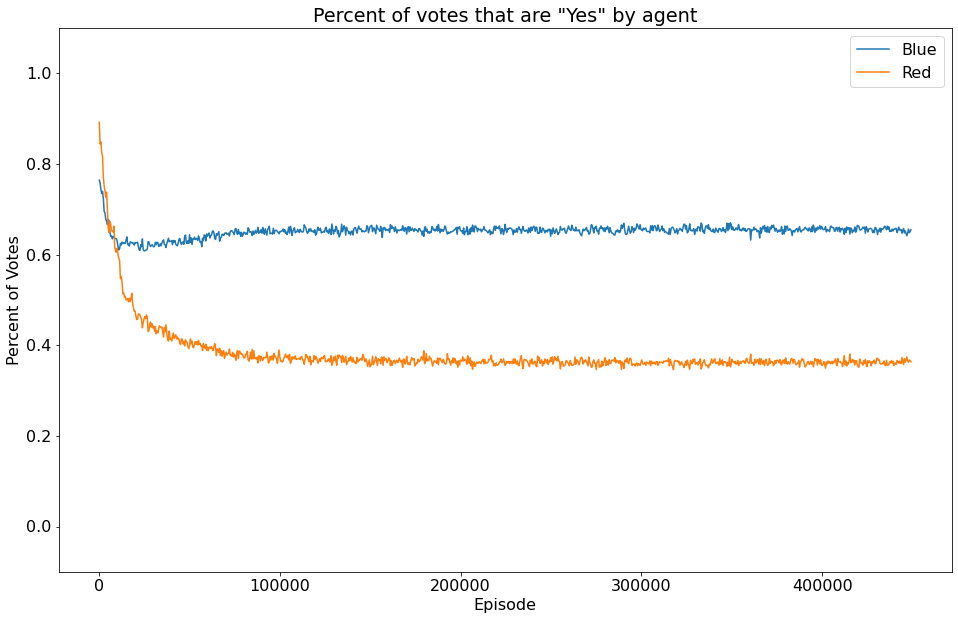

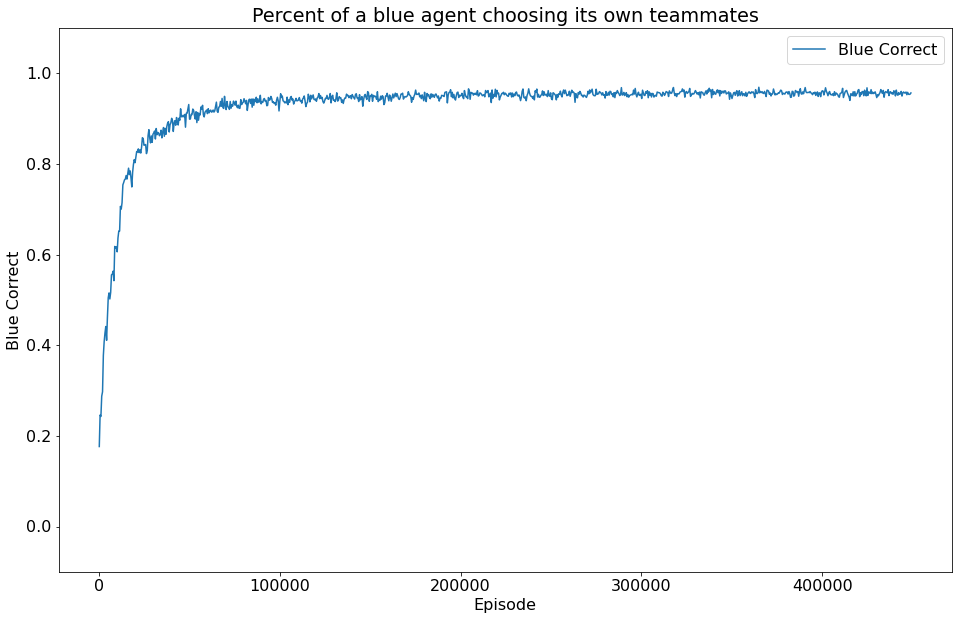

epoch 901 - loss = 0.11668781191110611, last - 6.794938371967874e-07
epoch 902 - loss = 0.11073067039251328, last - 1.3113024976973975e-07
epoch 903 - loss = 0.11080621182918549, last - 2.210259481216781e-05
epoch 904 - loss = 0.11295570433139801, last - 3.612073442127439e-06
epoch 905 - loss = 0.11136752367019653, last - 9.536744016713783e-08
epoch 906 - loss = 0.1092897281050682, last - 2.1219361769908573e-06
epoch 907 - loss = 0.11020132899284363, last - 4.88758644223708e-07
epoch 908 - loss = 0.1164960190653801, last - 1.0728863344411366e-06
epoch 909 - loss = 0.11343169212341309, last - 4.6491672378579096e-07
epoch 910 - loss = 0.1110597550868988, last - 1.1920931797249068e-07
epoch 911 - loss = 0.10793793946504593, last - 2.3841858265427618e-08
epoch 912 - loss = 0.11097685247659683, last - 4.8046633310150355e-05
epoch 913 - loss = 0.11300529539585114, last - 3.337886255394551e-06
epoch 914 - loss = 0.11238077282905579, last - 1.4424360870179953e-06
epoch 915 - loss = 0.115391030

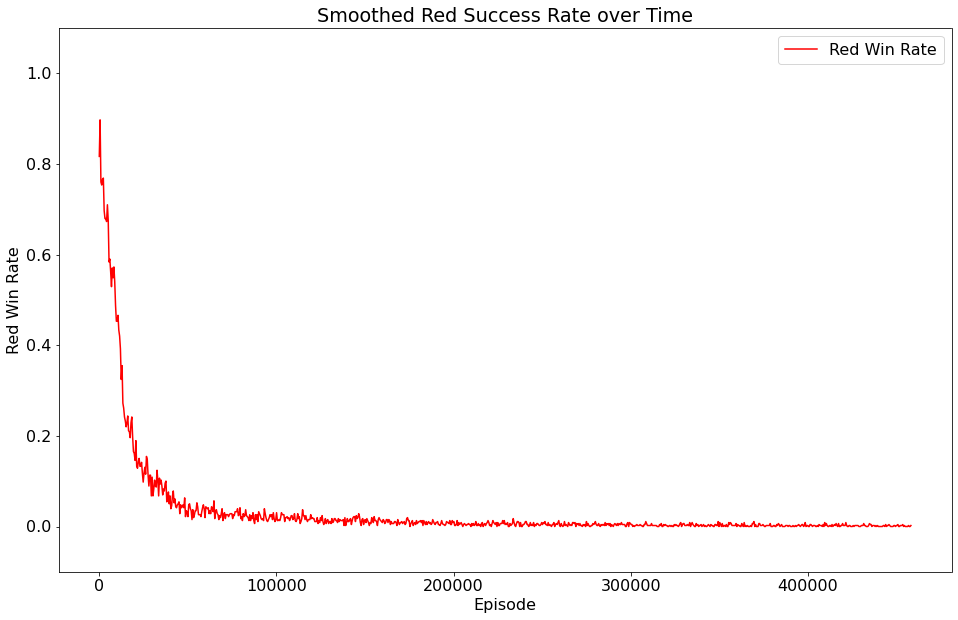

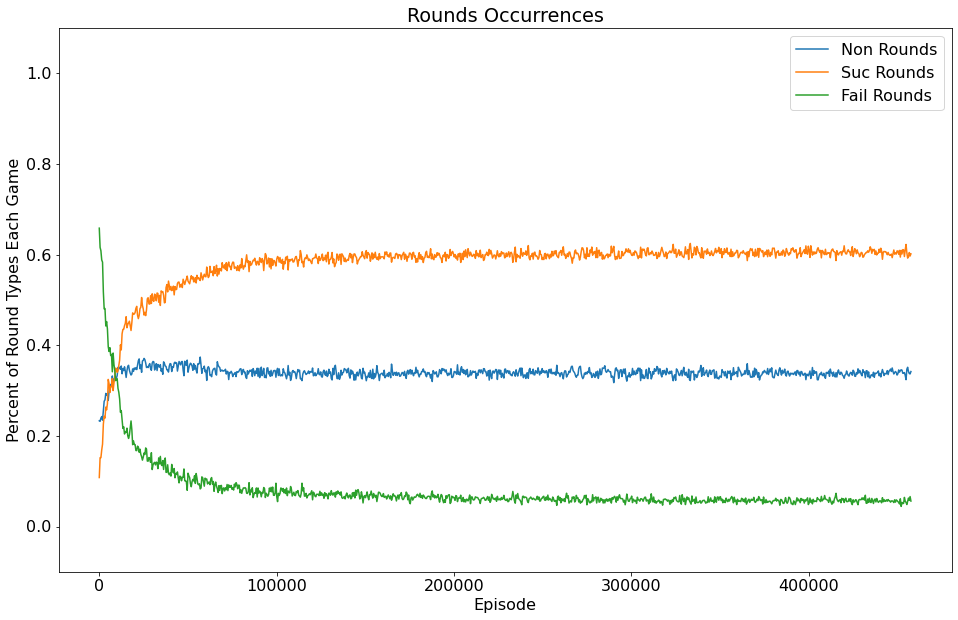

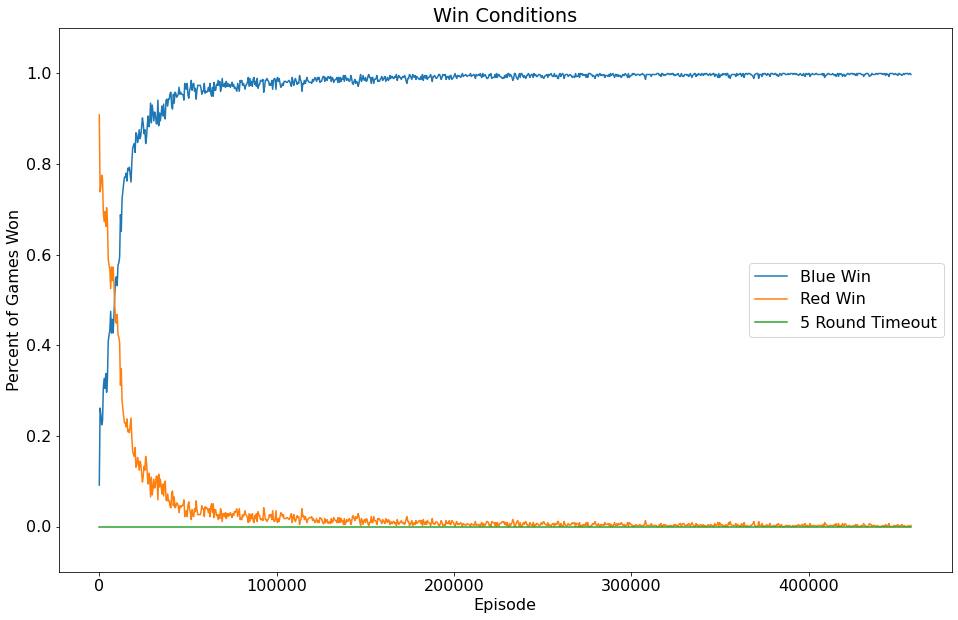

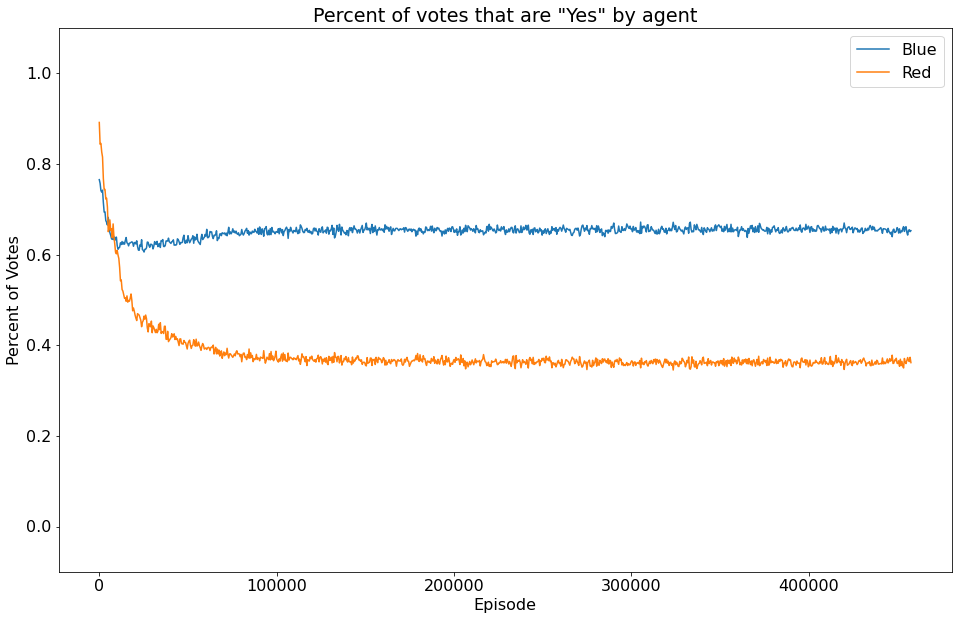

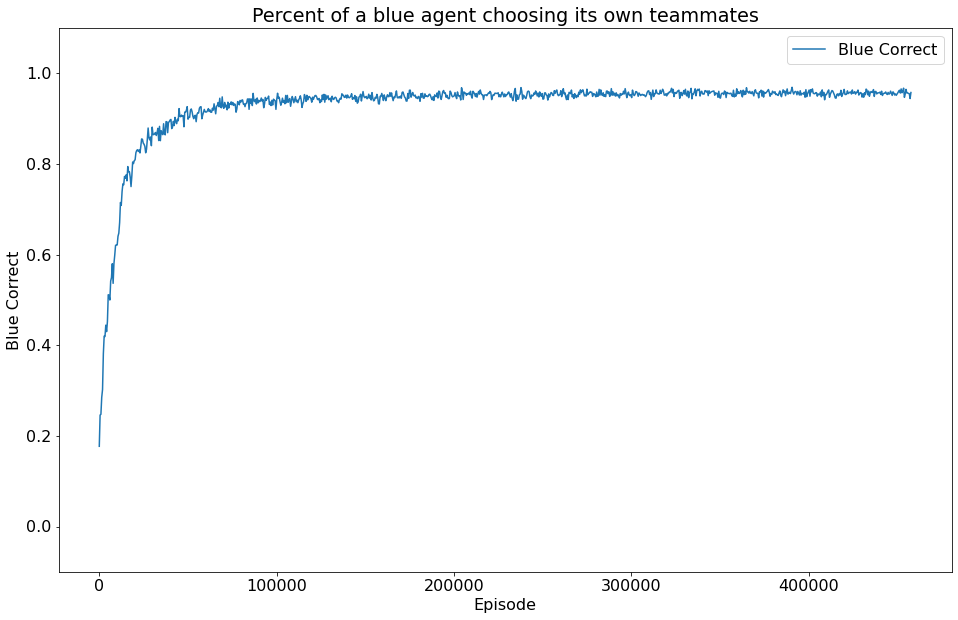

  win rate = nan
epoch 940


/var/folders/5b/9g7dfl6558zf_2ysgzynbvd00000gn/T/ipykernel_918/2718841524.py:112: RuntimeWarning: invalid value encountered in double_scalars
  print(f'  win rate = {np.array(win_log).sum()/len(win_log):.4f}')


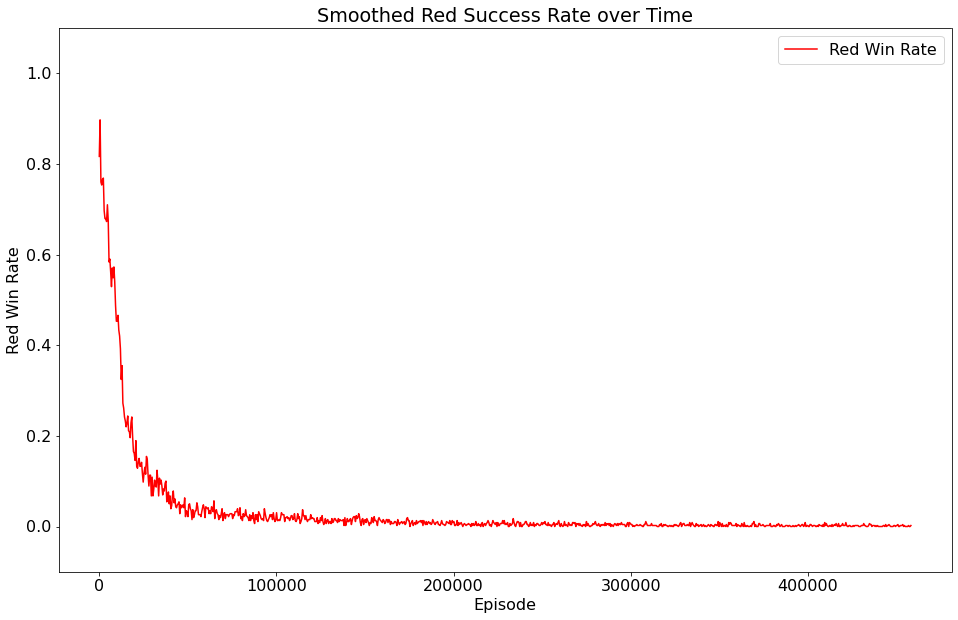

ValueError: not enough values to unpack (expected 3, got 0)

In [35]:
# trainable_models=['comm_red', 'comm_blue', 'who_blue', 'miss_red_2', 'miss_red_3', 'miss_blue_2', 'miss_blue_3', 'vote_red', 'vote_blue', 'succ_red']
# trainable_models=['miss_red_2', 'miss_red_3', 'vote_red', 'succ_red']
# trainable_models+=['who_blue', 'miss_blue_2', 'miss_blue_3', 'vote_blue',]

trainable_models=['who_blue']
# trainable_models=['comm_blue']

set_random_seed(2)

lrs_blue = {'COMM':0.001, 'WHO':0.003, 'MISS2':0.001, 'MISS3':0.001, 'VOTE':0.001}
lrs_red = {'COMM':0.001, 'SUCC':0.001, 'MISS2':0.001, 'MISS3':0.001, 'VOTE':0.001}
gamma = 0.99
gae_lambda = 0.95

# blue = BlueAgent(lrs=lrs_blue, use_critic=args["use_critic"])
blue = BlueAgentBaselineWHO(lrs=lrs_blue, use_critic=args["use_critic"])
# blue = BlueAgentBaseline(use_critic=args["use_critic"])
# red = RedAgent(lrs=lrs_red, use_critic=args["use_critic"])
red = RedAgentBaseline(use_critic=args["use_critic"])

my_env = AvalonEnv()
engine = AvalonEngine(env=my_env, blue=blue, red=red, train_episodes=500, max_epoch=100000,
                      trainable_models=trainable_models, gamma=gamma, gae_lambda=gae_lambda)

# globals
# global fail_5_rounds, blue_win, red_win
# global non_rounds, suc_rounds, fail_rounds
# global red_yays, blue_yays
# global blue_choose_correct
# global all_hist_log, all_winning_log, all_every_log
all_hist_log, all_winning_log, all_every_log = [], [], []
fail_5_rounds, blue_win, red_win = [], [], []
non_rounds, suc_rounds, fail_rounds = [], [], []
red_yays, blue_yays = [], []
blue_choose_correct = []

hist_log, winning_log, every_log = engine.run(is_training=True, plot=True, epochs_per_plot=20)
evaluate(hist_log, winning_log, every_log)

In [ ]:
%matplotlib inline
evaluate(hist_log, winning_log, every_log)

# Plot detailed events in single round

# Save the model to file

In [104]:
# dump red and blue agent to file
import os, dill
model_path = 'pretrained_models.pkl'
if os.path.exists(model_path):
    with open(model_path, 'rb') as file:
        pretrained_models = dill.load(file)
else:
    pretrained_models = {}
    
# choose the model name and the corresponding model to save
# pretrained_models[ /// name of the pretrained model /// ] = copy.deepcopy( /// the model class /// )
# pretrained_models['red_agent_pretrained_0503_value'] = copy.deepcopy(red)
# pretrained_models['blue_agent_pretrained_0503_value'] = copy.deepcopy(blue)

with open('pretrained_models.pkl', 'wb') as file:
    dill.dump(pretrained_models, file)

pretrained_models

{'red_agent_pretrained_0501': <__main__.RedAgent at 0x7f7bd18a06a0>,
 'blue_agent_pretrained_0501': <__main__.BlueAgent at 0x7f7bd1ac8ee0>,
 'red_agent_pretrained_0503_value': <__main__.RedAgent at 0x7f7bed5f5d60>,
 'blue_agent_pretrained_0503_value': <__main__.BlueAgent at 0x7f7c4bb323d0>}

In [105]:
# blue = pretrained_models['blue_agent_pretrained_0501']
red = pretrained_models['red_agent_pretrained_0501']

# red = pretrained_models['red_agent_pretrained_0503_value']

In [ ]:
# red = copy.deepcopy(pretrained_models['red_agent_pretrained_0501'])
# blue = copy.deepcopy(pretrained_models['blue_agent_pretrained_0501'])

In [84]:
# blue = BlueAgent(lrs=lrs_blue, use_critic=args["use_critic"])
# pretrained_models['blue_agent_pretrained_0503_value'].WHO.state_dict
# blue.WHO.load_state_dict(pretrained_models['blue_agent_pretrained_0503_value'].WHO.state_dict())

<All keys matched successfully>

In [ ]:
# #@title
# def compute_advantage_gae(values, discounted_rewards, stepid_replay, gae_lambda, gamma, train_model):
#     rewards = [x if abs(x) == 1 else 0 for x in discounted_rewards]
#     # print(rewards)
#     # print(discounted_rewards)

#     reps = 0
#     if stepid_replay[0] != 0:
#         print(train_model)
#         print(stepid_replay)
#     while stepid_replay[reps] == 0:
#         reps += 1

#     rewards_single = torch.Tensor(rewards[::reps])
#     values_single = torch.Tensor(values[::reps])

#     end_of_epi = np.arange(len(rewards_single))[rewards_single != 0].astype(int)
    
#     # print(end_of_epi)
#     # print(values_single)

#     last_end = -1
#     total_advs = []
#     for end in end_of_epi:
#         # calculate advantage_gae from index last_end+1 ~ end\
#         theta = rewards_single[last_end+1:end+1] - values_single[last_end+1:end+1]
#         theta[:-1] += gamma * values_single[last_end+2:end+1]
#         gl = gamma * gae_lambda
#         advantages = torch.tensor([
#             (theta[i:] * (gl ** torch.arange(end - last_end -i))).sum() for i in range(end - last_end)
#         ])

#         # print(f'last_end: {last_end} ~ end: {end} => {len(advantages)}')
#         # print(advantages)
#         total_advs.append(advantages)
#         last_end = end
#     ############################################################################
    
#     total_advs = torch.concat(total_advs)
#     torch.repeat_interleave(total_advs, 2)

#     # print(total_advs)
#     # print(torch.repeat_interleave(total_advs, 2))
#     # assert 0

#     return total_advs